# PyTorch training loop and Testing loop

For the training loop, we'll build the following steps:

1. Forward pass
2. Calculate the loss
3. 	Zero gradients
4. Perform backpropagation on the loss
5. Update the optimizer (gradient descent)

In [1]:
import torch
import numpy as np
import seaborn as sns
from torch import nn

torch.manual_seed(42)

X = np.linspace(0,20,num=200)
y = X + np.sin(X)*2 + np.random.normal(size=X.shape)

<Axes: >

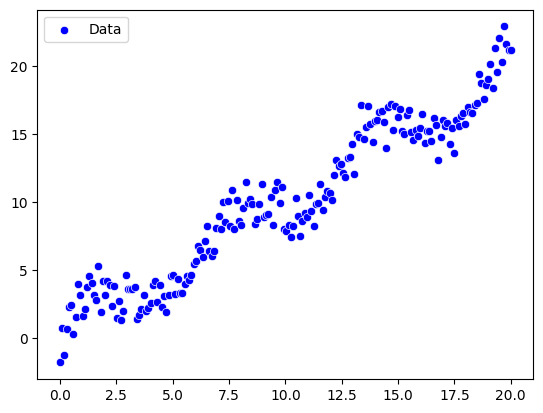

In [2]:
sns.scatterplot(x=X,y=y,color='Blue', label='Data')

In [3]:
from torch.utils.data import Dataset , DataLoader

class Simple1DRegressionDataset(Dataset):
    def __init__(self,X,y):
        super(Simple1DRegressionDataset,self).__init__()
        self.X = X.reshape(-1,1)
        self.y = y.reshape(-1,1)

    def __getitem__(self,index):
        return torch.tensor(self.X[index,:],dtype=torch.float32) , torch.tensor(self.y[index,:],dtype=torch.float32)

    def __len__(self):
        return self.X.shape[0]

In [4]:
df = Simple1DRegressionDataset(X,y)


In [5]:
df[0]


(tensor([0.]), tensor([-1.7809]))

In [6]:
training_loader = DataLoader(Simple1DRegressionDataset(X,y),shuffle=True)

In [7]:
data_point = next(iter(training_loader))
data_point


[tensor([[8.8442]]), tensor([[9.8501]])]

In [17]:
# construct the model using Linear block
in_features = 1
out_features = 1

model_2 = nn.Sequential(nn.Linear(in_features, 32),
                        nn.ReLU(),
                        nn.Linear(32, 32),
                        nn.ReLU(),
                        nn.Linear(32, 64),
                        nn.ReLU(),
                        nn.Linear(64, out_features)
                      )

In [18]:
loss_fn = nn.MSELoss()

In [19]:
optimizer = torch.optim.SGD(params=model_2.parameters(),lr=0.001)

In [20]:
# so we need now a training loop
from tqdm.autonotebook import tqdm

def train_simple_network(model,
                        loss_fn,
                        training_loader,
                        epochs=5,
                        device='cpu',
                        optimizer=optimizer):

    optimizer = torch.optim.SGD(params=model.parameters(),lr=0.001)

    model.to(device)

    for epoch in tqdm(range(epochs), desc="Epochs"):

        model = model.train()

        running_loss = 0

        for inputs , labels in tqdm(training_loader,desc='Batches'):

            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            y_pred = model(inputs)

            loss = loss_fn(y_pred, labels)

            loss.backward()

            optimizer.step()

            running_loss += loss.item()
            print(running_loss)



In [21]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cpu'

In [31]:
train_simple_network(model_2,
                loss_fn,
                training_loader,
                device=device,
                epochs=500
                )

Epochs:   0%|          | 0/500 [00:00<?, ?it/s]

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.3018876314163208
4.20946204662323
4.843309581279755
5.0294314324855804
12.634445756673813
36.12450847029686
37.61941549181938
40.33296486735344
43.51267620921135
44.60444030165672
44.970627188682556
45.115615129470825
45.386406511068344
45.91237196326256
46.480607122182846
48.98692235350609
49.627719432115555
49.70520260185003
51.22527005523443
51.36528631299734
61.71805711835623
66.94229360669851
67.19299601763487
78.96627330034971
79.05956336855888
79.23346970975399
82.56157420575619
82.6115679256618
82.71476395055652
84.46320075914264
92.36662597581744
95.38281602784991
96.7367676012218
105.16539938375354
105.26742964610457
107.10063737258315
108.25548904761672
109.1226722560823
109.66971736773849
116.46796851977706
117.54324191436172
128.97036307677627
132.68284695968032
133.01875006780028
133.16719856485724
134.41350224241614
145.34181835874915
145.74949845299125
146.7794357202947
148.90689143165946
149.04156195744872
149.94399094209075
150.56594252213836
153.851842161268
154.67

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.02039356902241707
0.059787362813949585
2.1646693646907806
27.301355689764023
28.805563896894455
43.25551888346672
43.255519085658534
45.78447478367184
45.998400085700496
46.394874953759654
47.463515662682994
49.29924740744923
51.43100633574818
52.05678805066441
54.74091156674717
54.762090473530634
87.46677949940954
124.93790224110876
126.74108484303747
127.49844935452734
128.1367036989907
128.90573039567266
128.9220030802319
129.29888238487933
129.31454698657785
131.02511934852396
131.7378241858462
131.74132524742913
133.19806550755334
134.62324641957116
135.51071803583932
137.68267147555184
138.63390355124307
138.98549421443772
139.06666803672147
139.53887659623456
139.5805371583922
139.75238713934255
148.22765931799245
148.79894522144627
149.37620422556233
150.25814041807485
151.05979928686452
151.06464638267812
152.62040402447042
152.87613179241475
161.36427952801046
162.6301448539382
163.29330166136083
163.87246354376134
166.8530731991416
167.53876789366063
169.22001453195867
170

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.7361068725585938
9.107772827148438
9.493556052446365
9.527547311037779
9.92236415669322
10.368101548403502
11.165558408945799
12.03759379312396
13.370913337916136
14.341293584555387
14.806852709501982
14.854510873556137
14.871508739888668
15.422746025025845
15.50647084414959
19.374813243746758
20.19757567346096
31.403177365660667
49.04866419732571
51.3831757158041
51.41980403661728
53.998819291591644
54.537110924720764
55.28718453645706
56.33323508501053
57.79900485277176
67.42085963487625
68.19128197431564
68.28974394500256
69.33718387782574
70.30720625817776
72.0570677369833
74.13938795030117
80.15185867249966
86.00329338014126
88.33366404473782
89.27217571437359
90.79592804610729
97.1560912579298
100.60180382430553
101.99246840178967
106.29254584014416
108.5511427372694
109.648861810565
110.3956183642149
110.5398858487606
110.54586996231228
113.54417575988919
116.8262938419357
117.41832985077053
118.56886281166226
119.14199115429074
121.22074081096798
121.98302157316357
123.025378

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.013817192986607552
5.407789113000035
8.198342682793736
9.485433222725987
9.485917992104078
9.97530240486958
10.857288724888349
10.870952543948079
12.81111103031435
13.292155859206105
16.757188198302174
23.856988785002613
24.472185370657826
25.550219652388478
28.426186439726735
32.54319131109514
34.864715692732716
34.92815078530111
42.45244039330282
43.0007400039176
43.96496917042532
49.05628920826712
51.00799895558157
51.572109413478756
52.681264353130246
52.82571156058111
56.746513915393734
63.63293368849554
64.93199522528448
66.46758492026129
66.46763227824704
73.26278541926877
73.50325030033127
74.42038434688584
74.43919807989732
80.69515997488634
81.17134890277521
81.20456745047704
82.89719976802007
83.31822152753011
84.98973603863851
86.03801162858144
87.38854809422628
87.49839106519357
90.53160491902963
90.53190777121927
91.85087117968942
98.36551770984079
98.93694886981393
98.93795958111878
99.33707138846512
100.5721025163948
100.60527162949438
103.07524590889807
103.420375935

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.8403208255767822
9.29319167137146
9.555999249219894
9.716539561748505
10.228515148162842
10.233983441255987
10.277472554706037
11.022947727702558
16.05691951420158
16.661994873546064
16.890594377182424
17.56627608742565
20.03640343155712
23.10662533249706
23.567576839588583
24.526922001503408
29.786700977943838
63.88702370133251
83.06754089798778
83.91048593726009
84.22380794491619
84.78026886191219
88.51987619604915
90.92227621283382
92.39439566340297
92.92669297661632
95.87334610428661
99.02650429215282
99.64933915343136
100.78974254336208
101.21526755299419
101.2697486160323
101.30203758459538
101.3809927655384
103.15053438674659
104.32139205466956
106.60742091666907
109.20512103568763
109.21821639500558
109.86710814200342
110.06807238422334
111.16965777240694
111.84394795261323
111.87907559983432
113.4691260587424
121.60636646859348
121.88999475352466
122.84873844496906
122.98901498131454
123.43496540002525
130.34108522348106
135.8855092804879
136.00264099054039
136.7215146105736

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.0411950908601284
0.0467304433695972
2.419666930567473
2.425632467959076
3.2284038574434817
4.723111441824585
12.998725226614624
14.024078062269837
14.290890207979828
15.888096681330353
18.47367154667154
18.474402063991874
20.359376901295036
20.3630769723095
21.208196627441794
28.71685646707192
33.86223648721352
68.95243881875649
68.97727078804746
76.51087636360899
82.19768304238096
82.19960619462654
82.2016673241742
85.68267728434876
87.3744824086316
87.81461574183777
92.48072816478088
110.38256456004456
110.79596160398796
118.97131656156853
119.7300693844445
121.60832284437492
123.0560759161599
123.42505811201409
124.23147539841011
124.23159488549572
126.19525119176251
127.89654966702801
128.27092909326893
128.75786813607556
143.29209359994275
164.06670984139782
164.06806018183124
167.78355076143635
167.8732670022
167.93602476248634
168.19609386453521
170.02229053506744
170.09752035120619
170.24100647846353
173.22529564777506
176.39101491848123
176.4610908178438
177.2572520522226
17

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.15425707399845123
21.352628961205482
27.358165994286537
27.423452012240887
32.08564483374357
32.49066220968962
33.90377580374479
35.61074911803007
36.69913601130247
37.91615878790617
45.134525410830975
45.73256354779005
46.225591383874416
46.461114935576916
46.996049754321575
47.62888031452894
47.90794926136732
48.624597780406475
49.069097958505154
49.39010225981474
49.619520507752895
68.1556361541152
68.15722130832728
68.78057484922465
72.99800591764506
75.46053390798625
78.06770472822245
78.77927123603877
78.92349887487944
88.87756419775542
90.72139871714171
90.768920818693
90.78337226377334
91.29088870750275
92.79831222759094
92.79858545394382
93.62683097453555
93.93834967346629
93.95174582110485
103.64609511004528
110.2847712765797
110.30451154516777
115.07778739737114
119.34199905203423
123.4792189578875
124.79851972864708
128.68186723993858
143.00214254664024
149.47418844507774
152.47575485514244
152.70252457069
152.9299473594292
153.54289297567448
155.45843688951572
155.676571

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.8855798244476318
2.2791404724121094
2.916331648826599
3.8470305800437927
5.654222548007965
6.583593666553497
7.231075763702393
10.5713632106781
12.71687364578247
15.686593770980835
16.636847615242004
17.48589426279068
19.285527527332306
24.271930515766144
26.08868247270584
27.6139914393425
38.38260239362717
38.408462861552835
38.41185934259556
39.58873159601353
41.110018560430035
41.854219207307324
41.85422311570528
41.85534745628047
41.874437285457134
42.349434478078365
42.60136557916212
44.9403596053462
44.94066134658442
46.58225194182978
50.10929099288569
53.923835432201486
53.9867844637929
54.812920576006036
54.95993146863566
56.04654214349375
57.027529394298654
57.076860038608174
60.91186103042946
64.78251847442971
65.31664934572564
68.66162696298943
69.34486195263253
69.35154562494517
70.35884850523234
70.37145699239136
86.39962090230347
86.71777514791847
89.22640089369179
89.37461432493092
90.38841554201008
91.55165347135426
94.31073698079945
94.33497641659142
94.3633352336919

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.3763973712921143
4.352479457855225
10.558022022247314
12.990357398986816
13.541637182235718
26.10443663597107
26.138762075453997
28.294437009841204
28.29452728752949
28.299820002102933
28.574259784007154
29.372325267577253
33.694314327025495
37.552126254820905
43.158475723052106
49.49611362435826
52.40604647614964
52.81427904584416
54.35933288552769
54.89678272225865
56.300473060393415
56.487753655696
61.22220924117573
67.49990108230122
72.98630788543232
73.7317847273589
74.46315636851796
75.98538449027546
76.00809716426738
77.98847769939312
80.68014072620281
81.4037604852856
82.70671980821498
83.92627363645443
84.38774456822284
84.43599259101757
86.48267494880565
97.4604495688618
98.17889630042919
99.36458515369304
103.18488740169414
104.78861855708965
105.34931039058574
105.4670637174786
106.01351999484905
106.01936815067165
108.65744922443264
125.6052355556094
126.85009119792812
130.71811101718777
132.22807762904995
132.72008011623257
132.84911743684643
134.08187524362438
137.6577

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

9.652674674987793
9.76868499070406
9.796698931604624
14.325392607599497
15.790552262216806
16.65555924549699
16.980694863945246
19.41246661916375
28.57949409261346
33.457100961357355
33.54284282401204
33.61410901322961
34.063458416610956
35.01107159629464
38.37629858031869
38.71855876222253
43.8483209349215
45.753742668777704
59.14539096131921
60.23804805055261
60.69465786591172
60.91134710982442
63.54116912558675
68.3336090631783
69.5817426033318
86.63561185076833
89.53495701029897
90.41913004592061
106.852908808738
107.1023945696652
107.35825644806027
107.69604282453656
108.38564257696271
108.53788681700826
109.44143046811223
113.88305129483342
118.05680360272527
120.48098172619939
120.60405844822526
123.6419796384871
123.65136481076479
124.91001415997744
125.36441297084093
125.50405246764421
126.68661148101091
128.90034372359514
129.68180108815432
151.71696115285158
151.80041962116957
154.40887790173292
155.10375344008207
156.49376606196165
157.3283355757594
167.09486656636
171.4438

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.258232593536377
6.469806909561157
8.170264959335327
11.341888427734375
11.478721305727959
13.034638330340385
14.367462322115898
14.44183974713087
17.48261719197035
23.50600653141737
23.795469127595425
25.312805257737637
25.469061248004436
25.57402326911688
25.637935802340508
25.891364738345146
32.28846614062786
40.468216583132744
52.16147296130657
67.02587668597698
68.95817916095257
69.6258405894041
71.46991853415966
71.65725196897984
72.54975195229053
74.69386549293995
82.38557501137257
83.32942928373814
83.36988137662411
84.59231363236904
87.56010137498379
88.62837181985378
90.15891717374325
92.66325233876705
92.76434636861086
96.28201008588076
97.32911432534456
97.51123086363077
99.13047746568918
99.16655846312642
99.6674878783524
101.3178682513535
101.41429576650262
101.4146224372671
102.97528244188288
104.53312481573084
110.6291650646017
110.62916506473266
111.58291948978149
111.84188626352989
112.82332221810066
113.46835635248863
113.60067629460536
141.61902117375575
145.980451

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.5375773906707764
4.553534746170044
7.39311146736145
8.540374279022217
10.210345149040222
10.539597153663635
10.718572422862053
12.89055971801281
12.915875732898712
13.162316024303436
13.396528840065002
13.749311715364456
14.299301415681839
15.536809593439102
17.14567521214485
18.741117984056473
20.82603719830513
21.030956909060478
21.365215197205544
22.16707344353199
27.41160126030445
27.722291484475136
34.75226451456547
34.95392343401909
36.13183876872063
36.16061603464186
38.304260367527604
50.3540126029402
53.46687948144972
54.40403353609145
54.50509558059275
55.31480244733393
58.06051019765437
59.349636474624276
61.2953913602978
70.64845017530024
70.65013300441206
76.15901266597211
76.70386349223554
77.08668743632734
78.03869169019163
78.06431583315134
78.64107672125101
79.2418105378747
84.13442490249872
87.60470459610224
88.82845626026392
88.85458812117577
89.95733639597893
90.13533824682236
90.5926761329174
90.61581564694643
90.88772977143526
92.33147168904543
93.80558205395937

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.24725621938705444
1.0434702038764954
1.6876375675201416
2.89427649974823
2.9028834104537964
4.738620281219482
4.741269029211253
8.49488703114912
8.528349190484732
10.0154238040559
10.641123085748404
16.47695520473644
17.553542285691947
18.147747486364096
20.331517427694052
35.52838823152706
35.52943004318513
37.76625431724824
38.56947524496354
38.57673689746298
40.58754798793234
41.92157682799734
42.174540758365765
43.88799178623594
44.07948671304621
44.52583716833033
51.79919122182764
54.0536866041366
55.202688679331914
61.06237600767054
61.1500250401441
62.71519437455572
63.65713122510351
82.90601351880468
90.87111619138159
91.75686100148596
92.74016186618246
95.80579015635885
97.5665511789266
101.50950881862082
104.64202901744284
110.9616734685842
114.81032368564047
115.91689285659231
116.14884868287481
116.50552070164122
122.93316638492979
129.7849386932794
129.84902312629856
129.85762101528235
131.5169884574134
131.65527932462282
132.64424257096834
132.80025041219778
132.8301495

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.04735800251364708
1.2698851488530636
1.4851941876113415
4.098615627735853
21.867301922291517
22.474076848477125
23.290524523705244
25.72433404251933
25.85132611915469
26.767855655401945
33.63340951129794
34.76927353069186
35.71917970106006
44.12571484968066
44.26813655719161
46.160448249429464
46.29756544157863
47.788484912365675
47.81965259462595
49.71474388986826
53.4866316691041
53.75423652678728
53.754960870952345
54.40286967775319
59.65901849290822
59.66403124353383
59.919481313438155
65.1662807824323
66.42007390281651
70.11127320548985
73.14393893501256
87.11995497962926
89.55539551994298
103.21964780113194
106.13768450042699
106.7584010126302
107.75110588094685
109.16414461156819
110.35098538419697
112.3621915342519
136.31801161787007
141.61754975339863
142.08617973944638
146.351637846441
146.67788047215436
147.9990137281129
148.00254940928426
149.85896658839192
151.3610157960793
163.73199701250996
163.99245241226163
164.21553078235593
165.20033255161252
166.67159810604062
171

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.2361460030078888
2.635654240846634
7.179976254701614
7.97468301653862
8.339458793401718
8.77049845457077
12.696650445461273
14.136352479457855
17.477584540843964
24.371264159679413
49.387535750865936
49.58471727371216
56.99527406692505
57.26017487049103
61.45825445652008
61.467148976400495
68.97937889583409
71.10274405963719
71.96181591041386
71.9792781919241
72.22168916463852
72.3023502677679
73.6873919814825
74.10605199635029
75.12584812939167
76.47515292465687
76.72119380533695
78.50366844236851
80.46561886370182
82.08059181272984
87.69607175886631
87.92980574071407
88.04031124711037
88.36815950274467
88.75735291838646
102.88117417693138
103.21078306436539
107.20467811822891
108.30025404691696
112.23686856031418
112.23793807264883
115.3093153500231
116.33105781313498
118.54866698023397
119.93227246042807
119.93405711313244
121.37944495340344
121.44667068531271
121.45772825775202
121.56562157568987
124.44179364142474
132.94371720252093
133.20362000761088
137.22084670362528
138.1377

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.6250729560852051
0.6825141124427319
0.8159311674535275
13.203313674777746
15.924191799014807
18.466511335223913
18.739722963422537
19.322383996099234
20.83242904767394
20.835542337503284
21.366605655755848
22.88233865937218
23.154057876672596
24.954558627214283
26.263722197618335
29.879365460481495
32.002640502061695
32.12017940869555
32.45118265738711
41.04880838980898
41.615542048122734
50.39503156533465
57.30178272118792
63.965817087795585
64.10413739969954
75.04974363138899
75.26224921038374
75.54891453078017
87.44984684279189
106.53283748915419
108.39978025248274
114.46944425394759
114.4701555162901
114.47676625626627
114.67680853384081
117.46009319799487
118.51283579843584
122.65338688867632
125.67523914354388
125.6809015130857
125.78687800525222
127.70217908977065
127.70231150160544
134.01755951414816
134.23869603942148
134.2512537657749
136.7197925269138
136.80582785303704
141.8077633350622
141.91424165363424
145.60155020351522
149.62335596675985
154.08016024227254
154.699347

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8930550813674927
0.9510571286082268
3.9498945996165276
4.758709900081158
6.613981239497662
8.6212103292346
8.7498594596982
9.181920297443867
9.250944159924984
10.270675800740719
10.29809120669961
11.494551334530115
11.536205280572176
11.540495658293366
11.60786042548716
12.344173828139901
16.47075072862208
18.294967094436288
22.227406660094857
22.25174448825419
22.78931144811213
25.25300387479365
25.518294075503945
25.58056397549808
25.68528143130243
28.23445430956781
28.383473625406623
28.72451918385923
29.960468342527747
30.054493306204677
30.054501814001924
31.642068785780793
34.18148176109207
40.99023000633133
42.361972493285066
42.57824553286446
74.4153827551545
74.68050400649918
74.74318008607042
77.47536330407274
79.44753353779925
79.65849400048864
81.94247866159094
82.72308308368338
84.51875633483542
85.71355325465811
104.13109857326162
106.5521147895397
108.4797887254299
110.52604812865866
111.07507533317221
111.30878741031302
112.71477014308584
113.03181455021513
133.925193

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.6136560440063477
4.634239554405212
24.886566519737244
25.072603419423103
36.66375656425953
36.81227561831474
39.043935030698776
46.00982639193535
46.217118710279465
51.11615225672722
52.99258288741112
54.21296438574791
54.69745486974716
55.66632413864136
58.37281823158264
58.611558228731155
61.06842640042305
61.663137167692184
62.350031942129135
62.542625799775124
62.54879153659567
62.56062964955345
62.56096569445799
62.63200624284218
62.63721506434376
63.15001116829808
63.71756683426793
63.89126166838105
67.69731745260651
67.8976515843242
67.90839047866757
74.34566302734311
76.39006205039914
78.01654704051907
78.03941837648745
83.41186968187685
83.58821207980509
90.28321845034952
95.29674250583048
96.43138308028574
99.52765292624827
100.04715389708872
102.4559082458436
102.64341527919169
104.69140560130472
113.3234723279893
113.8202316830575
115.28390134076471
115.92446786860819
115.96790350179072
116.36259932021494
116.72972083787317
116.72974354796315
117.26594508461858
119.832254

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

15.694330215454102
16.934250950813293
27.310171246528625
27.324383238330483
28.05227361060679
34.17370448447764
36.604285100474954
40.765449384227395
40.77918967138976
42.25667830836028
42.27965591754764
43.28317807521671
43.71450076904148
45.37861786689609
45.75807760562748
45.837466961704195
47.513484484516084
47.82679662760347
47.855836980976164
47.9407681459561
48.19165011588484
52.1478330725804
52.90666898433119
54.070746385492384
59.625693761743605
59.63674551807344
63.51298505626619
63.82699046097696
65.94217834435403
66.28969359956682
67.28487384878099
73.16280353628099
74.36650467477739
90.61655808053911
91.07588810287416
91.67334598861635
103.43843120895326
110.07144731841981
110.17809188179672
111.30619776062667
113.68030392937362
125.22161900810897
129.9373306017369
130.3715244513005
130.6486039441079
130.67947927489877
131.6501037813723
131.679141452536
136.74028961919248
136.97220893763006
137.16409905813634
137.20347846858203
139.97080863825977
140.0500271897763
141.0456

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.025236964225769
1.035198929719627
2.618883374147117
5.501773121766746
5.640782731585205
8.193026202730834
8.481886732392013
9.645229565910995
30.627481686882675
50.66721366625279
50.759906391613185
51.774735311977565
51.92143190931529
52.57520330976695
53.67277659010142
53.76459395419806
62.9195440961048
89.32289492618293
90.39647697936743
90.55421436857432
92.72877157758921
92.74828738253564
97.01509064715356
97.48099696915597
97.82118538301438
101.6661844579503
102.46105960290879
103.94446376245469
107.54272297304124
107.68654452543706
108.11236693244427
108.60367732029408
112.61290459614247
112.86209844332188
113.47993229608983
113.92397417407483
114.30095474701375
114.82501058559865
123.32875280361623
125.39936976414174
125.78531588893384
127.23081387858838
128.5342792449519
130.436958569102
130.71851219516248
132.403072017245
132.7867118595168
134.5449100015685
134.58989075850695
135.28185890149325
136.07198647689074
139.53696016501635
141.3188975257799
141.82987556885928
143.61

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.9375695586204529
3.7407113909721375
3.824427656829357
29.944195799529552
30.934243373572826
31.13069000095129
31.171379804611206
49.236531019210815
49.264622589573264
61.22672834061086
65.85668887756765
71.54055776260793
71.6854583825916
72.8424248304218
72.8425905858312
74.9168458138738
76.77420641529898
77.20850677836279
78.73143775809149
89.04412944662909
107.29895694601873
115.41442687857489
115.53858227330784
117.32582718927006
117.45218776959518
117.79561727542023
119.69890170592407
121.87048559683899
124.9048123886023
126.78745739955048
128.6859505702887
133.82814245719055
138.48557549018005
138.62950556773285
143.31143610972504
143.35931896838883
144.61480950984696
145.14458584460954
145.9598766532872
145.96741712001676
146.5336752524745
147.66204196123
148.09107628373022
150.11347737816686
157.41919198540563
159.89615574387426
160.63954624441976
172.5130432536971
174.2216317346465
174.9418854406249
175.04032646772976
175.41074090359325
179.3289452111494
183.83641391155834
18

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.24821315705776215
10.564648017287254
15.231277331709862
20.51495872437954
33.49082790315151
44.76561962068081
44.851940512657166
45.225676000118256
45.358596086502075
46.137440502643585
46.153100330382586
46.15356939690537
46.35938545721001
49.398465361766284
50.14218851583428
51.7995289232058
53.01478060739464
57.79803141611046
58.96648594396538
58.968749324412784
65.04353646430536
65.57802007588907
66.71443293485208
67.33615438136621
67.8469828167872
67.84926233239821
70.93336114831618
76.19006118722609
78.44482884355239
79.77617356725386
80.15577254243544
80.86158112235717
86.73277500816039
86.83483329959563
90.20830527492217
90.2083994539862
93.17302052103332
93.97969816051773
94.6725114377623
112.1721108945494
112.6792258413916
114.49231485449127
116.4607074650412
116.50809951298288
117.3411881493812
117.49444228582433
123.64233809881262
127.06547123365453
127.36209935121587
128.87940842084936
128.92106820442132
129.51885892249993
131.62214256622246
131.97242255308083
140.123662

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.36268219351768494
2.090787261724472
2.110300935804844
2.6376307979226112
6.0508652701973915
6.204618506133556
6.802751772105694
12.054497949779034
15.058627597987652
15.244910143315792
25.905318163335323
30.931241415441036
33.53305330127478
35.573883913457394
41.26079072803259
41.732477121055126
42.195178501307964
49.74521588534117
50.292249731719494
50.31669330783188
50.67608833499253
51.105939181521535
51.189787121489644
52.43599292822182
52.7112731654197
55.35109850950539
59.81527897901833
61.216315956786275
61.35134141333401
64.37891738303006
64.94357310421765
65.39539800770581
67.08270929940045
67.14175228960812
67.4239380825311
68.29792337305844
72.92140178568661
73.68679981119931
75.60370485670865
78.10122578032315
78.17780874110758
79.4863703045994
79.51009491086006
79.580630145967
79.97493781894445
80.10318841785192
83.14651837199926
84.42975439876318
85.71137049049139
90.09806730598211
90.0980967053165
91.0955634483089
91.25811823391814
91.90200164103408
92.16720636868376
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.04582120105624199
2.041291009634733
2.7972917072474957
5.032709788531065
5.044556346721947
6.394995776005089
6.5574592621997
12.756750968284905
13.931849625892937
17.639605191536248
17.88784068543464
27.298152384348214
34.61577552277595
34.866264996118844
34.974717882461846
39.885784414596856
40.72769131977111
41.09493073541671
41.50861695129424
41.789249864406884
41.931841489858925
42.009447616524994
42.74698368925601
42.806010459549725
43.07773066032678
48.01500654686242
48.021148269064724
48.316967700608075
48.38862624485046
48.65039157588035
50.78454041201621
52.3821648331359
55.373762485571206
58.3498231144622
58.63376497942954
62.18327784258872
63.022215721197426
72.83174121100456
72.86574864480644
78.0705215940252
81.34998989198357
81.95014250371605
86.5992480525747
87.46534991357476
95.07818245980889
96.37094509694725
100.1719642886892
100.76175111625344
120.44567674491554
122.23090523574501
122.23662757780403
124.50150656607002
127.56705140974373
139.16903829481453
139.99446

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

10.64052677154541
11.224049270153046
23.123277366161346
24.966104567050934
26.149496495723724
27.91863125562668
28.582163989543915
28.62517848610878
28.672375578433275
49.12240685895085
49.39141859486699
59.059868950396776
59.865326065570116
60.248269218951464
60.52591322734952
60.54625942930579
60.72006079182029
61.428208377212286
62.268141474574804
66.69388648495078
69.02814361080527
71.41484328731894
72.23758497461677
72.58547362312675
73.63295063003898
75.93670042976737
76.94121071323752
77.9786842726171
77.97900953149656
78.02022010838846
79.77178818738321
81.3199375346885
83.48485810315469
85.63830167806009
85.71632494038204
86.39579828089336
90.74413879221538
91.09492580598453
91.10559060896048
91.36075058305869
91.43846832687268
93.98826848441968
94.40709387237439
94.71445952827344
101.02065192634473
101.59286176139722
103.0973921912373
105.54262887412915
110.88083278114209
129.96322261268506
129.97270838735858
133.02369682310382
147.2096547317342
161.69955722807208
161.8223046

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.566368103027344
12.291760444641113
12.292366216192022
13.643829891690984
14.81248433352448
15.06947142840363
15.1039741395507
20.57946757064201
20.9382648228202
21.757044648984447
21.90326969907619
22.164349427679554
22.381405523279682
22.872486314037815
24.772911509731784
30.4953565208707
30.496308485686313
30.526306275918614
31.215646330907475
31.759509985044133
31.7597886849544
31.934618123283144
34.54621184658026
34.73688031028723
35.34327013086295
35.685449161042925
40.79701236676192
42.263961829652544
42.396490000595804
42.484695420076605
43.63394592743134
43.77882912795758
47.55166891257977
51.351130038907286
52.57212868373608
63.858361632039305
64.344471842458
89.8464535776875
89.88634371425724
90.08841804828262
92.28989915217971
92.84199635352707
93.0347635265789
96.22659106220817
108.81666369404411
109.13448558415985
110.06973735656356
112.14177648391342
113.03116188611602
113.74313167895889
114.5778540786705
117.18305436935043
117.58338020410156
117.81605218019104
120.0452

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.45214998722076416
2.6508716344833374
4.749470829963684
4.776037532836199
5.323150534182787
9.443511385470629
15.506168741732836
18.396009106189013
19.420574087649584
20.986079592257738
22.235082644969225
23.995074409991503
43.42599214985967
51.81424345448613
53.7030514664948
55.96996893361211
56.07761085405946
57.124141339212656
58.48159063234925
59.49967897310853
60.39397365227342
62.39170200005174
62.83129358664155
96.48779154196382
96.49191850051284
129.30302613601089
129.33680287376046
130.1140002347529
141.69879618659616
141.7493817768991
141.90557142719626
142.24134328588843
143.8264118693769
144.0393282584846
147.16718808934093
153.21026126667857
160.2176446132362
160.2386582698673
162.5707031097263
163.56412597559392
166.72711225412786
167.71907492540777
169.17035742662847
170.41859956644475
171.85258348844945
174.53261979483068
174.78609361313283
174.83632088638842
175.16503901220858
176.04843742586672
177.02690995670855
178.0925512406975
178.34325746633112
182.4462905321270

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

11.863186836242676
12.022153660655022
12.769658252596855
12.898445263504982
15.166293278336525
17.164366021752357
21.250441327691078
52.5633380562067
54.02138961851597
54.1758728325367
63.48419192433357
63.55278600752354
64.18761564791203
64.18799633573508
73.39353699277854
75.10332734178519
75.79131407331442
89.57713980268454
93.48100275587058
98.82081074308371
100.61942321847891
100.65740757103777
101.18525354977464
104.88730757351732
104.8892592699849
105.99408405140275
115.64236228779191
115.65177741792286
119.47223606851185
119.72604128863895
128.57430216815555
128.72302416112507
130.1682927921065
130.1766744661727
130.48282579664374
145.6826930451789
145.68497857503826
146.39935097150737
150.30689296178753
150.39688906871015
151.90364525519544
182.66326782904798
184.2074137707823
223.37165174685651
224.53802893363172
225.84807703696424
228.26079986296827
244.37406776152784
257.98888347350294
258.5348090311163
259.5195346256369
260.5655812402838
262.23651102982694
262.791575648414

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8486055731773376
1.8783435225486755
2.4794647097587585
7.158508479595184
11.765400111675262
12.106908082962036
12.524141401052475
17.77484092116356
22.809672445058823
22.861472513526678
26.12490263208747
27.64025416597724
28.095386143773794
28.7624216042459
28.97919876500964
31.283371042460203
37.59459359571338
37.914047699421644
40.53691504523158
41.0052826218307
41.90235899016261
42.674675922840834
43.72134302183986
46.71535013243556
46.729020529426634
48.26217680517584
49.963010364212096
51.303594523109496
51.36204254347831
53.465413209982216
62.27489292342216
63.20294522959739
75.81288194376975
77.63461577612907
77.7848328622058
78.18741771299392
79.35678681451827
79.60201993305236
79.97117709834129
80.47289788443595
83.63395178038627
83.66065170895308
88.78627827297896
92.85608008038253
93.0650317473337
97.07948134373873
97.59654502104968
97.64350580330938
99.08925603982061
99.14354628231376
99.63959139492363
99.66901320312172
101.15335136745125
102.84035045001656
115.3572009215

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.965837836265564
2.006918031722307
7.9881316013634205
22.98405845835805
28.412793714553118
30.517219860106707
33.58040078356862
43.05339368060231
44.98993797972798
49.56112690642476
49.92258568480611
49.93721591029316
50.369400397874415
52.94311632309109
52.9770875396207
53.47418100852519
55.65189416427165
69.10264260787517
69.1641362728551
71.26708660740405
79.85927162785083
82.885652882047
83.91345618385822
85.53078351635486
112.17502484936267
114.43153582233936
128.00126276630908
128.01113166846335
129.75831022299826
129.75831100455343
131.5901839446169
132.04611212125837
132.19221393874705
135.5832511644703
137.23737160972178
137.44972884765684
138.42317879310667
138.970627428208
151.2361999761206
152.0840901147467
188.2963475000006
218.24731528869688
231.00136649719298
232.25858235469877
232.3043445806843
233.58977036288798
235.21161751559794
236.1895524125439
236.21122519782602
238.09794454387247
238.71886919549524
239.02092476299822
239.03442752844512
241.41709268576324
241.425

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.2812255620956421
0.4210969805717468
1.703014314174652
2.1967488527297974
7.549399018287659
8.718251466751099
13.291418313980103
16.436103105545044
17.858482599258423
19.738242030143738
20.087187856435776
22.022731631994247
29.456583350896835
34.78720125555992
43.2622512280941
46.22867092490196
47.30047604441643
48.02574846148491
48.07792166247964
57.308855805546045
57.436787609010935
67.6370973624289
69.16942000761628
71.82252884283662
73.61508977785707
75.97899139299989
77.51836038008332
78.72089732065797
80.30954110994935
80.6072058416903
83.5131866671145
84.11962142959237
85.76533356681466
86.20172804966569
90.44788426533341
91.85332876816392
92.73849702253938
92.83251204714179
118.2818242572248
118.30851374566555
146.58482752740383
147.46460483968258
149.00322149693966
162.59446428716183
165.72780226171017
174.03907583653927
174.92177705466747
175.6706056445837
175.86159905791283
175.86406817846
177.9868024867028
179.06599357537925
187.3419277947396
187.4549433272332
187.77279746

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.079405665397644
1.4827969074249268
4.488174676895142
7.073859453201294
11.672209024429321
11.752103820443153
11.79494009539485
13.072224002331495
16.258816104382277
16.70415024086833
16.90346635505557
19.444735895842314
19.46819332614541
19.680292014032602
19.889598686248064
19.996215846389532
22.360862281173468
23.217475917190313
26.143570449203253
26.662714030593634
26.896894078701735
26.924478704109788
28.071419769898057
28.445900136604905
28.463252007961273
29.39750200510025
29.871512144804
31.343432515859604
31.59507241845131
36.62331548333168
37.21830794215202
40.195257157087326
41.8842907845974
43.19743391871452
47.77621504664421
49.10643753409386
50.37050089240074
51.06584629416466
53.73600110411644
54.97124418616295
55.37846985459328
62.299188524484634
62.53337273001671
80.40899071097374
81.02076467871666
83.90947517752647
85.32634994387627
85.44686833769083
85.85971859842539
86.5144511833787
86.52596770599484
86.52754391205963
86.60421768052038
110.03439918381628
110.052689

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

17.01881980895996
50.021772384643555
58.88580799102783
61.37515330314636
63.32305324077606
65.98916733264923
66.29022473096848
66.46895559132099
66.4989457000047
66.55264426581562
78.8208489548415
79.32557453028858
88.20946754328907
90.9707089792937
90.97070909455942
92.65969623044657
97.48410666898417
100.63585437253641
101.26387173846888
103.8672867508285
103.87863908965664
104.35297267396527
104.67240523059445
104.85807888467389
104.91760113720375
106.07923498634773
108.40748730186897
108.40846017237345
108.98950985308329
111.35654404993693
112.17257985706965
117.66560086842219
120.17585072155634
122.30323848362605
122.83145103092829
122.87427625294367
126.52560410137812
127.20191934939066
129.51052931185404
131.35667863722483
140.63982931013743
140.99038478966395
163.01077434654871
166.63680312271754
166.65843661550025
167.3340022755001
168.89658035758475
171.7669571829174
175.0860556555126
185.85521687987784
186.26467238787154
195.3365756166313
196.5993076455925
196.8012863886688


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.6905510425567627
2.27710622549057
2.3564423844218254
2.3575575661379844
36.98077228781767
58.50682667014189
58.6316570576746
59.04040285316296
69.58575102058239
75.76484247413464
80.05318065849133
81.25135632720776
82.99626907077618
97.18171771732159
103.5238555308897
103.59799542394467
103.9232248601038
104.10060621169396
106.74156285193749
106.88518194225617
107.41626475122757
109.26329145696945
109.5197081353981
110.72054312494583
112.49688384798355
112.60889300820418
112.80161495623179
113.9199956220109
113.93842958961613
113.97666527633555
114.59329136018641
121.9006348431576
122.74280776386149
123.74295749072917
126.74131287937053
129.60143579845317
130.20345051889308
130.2091902240645
141.8020380481612
141.9560942396056
146.90789649332874
152.6348962530028
152.6599009509664
152.8914768572431
153.0818081672769
153.4072940822225
164.6351001735311
164.67529822769575
164.67830357141793
178.31745991297066
195.50233921594918
196.47310844250023
196.6799980122596
197.05179748125374
19

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.486207127571106
1.7074512988328934
2.783789113163948
6.358482792973518
9.688317015767097
9.706540018320084
10.59953197836876
14.77702984213829
14.793184250593185
15.122877478599548
17.648818373680115
18.409888982772827
22.49991536140442
25.769188404083252
27.424704909324646
36.79329812526703
39.62807834148407
40.57695519924164
42.419564843177795
42.85677745938301
43.62807396054268
44.02425241470337
50.863805294036865
51.046104192733765
53.06747078895569
59.08435273170471
60.353243589401245
61.66550600528717
61.843162804841995
64.1879771053791
65.31632617115974
74.47022345662117
74.77007123827934
74.92294479906559
75.28814695775509
76.91377924382687
76.96988835930824
80.5163976252079
80.8186120390892
88.15204232931137
94.41172593832016
96.15570658445358
96.22486229985952
96.77711399644613
96.81640148535371
96.92862639203668
97.07272801175714
98.72469959035516
98.7334048114717
100.42883735522628
102.32074731215835
102.56148959323764
113.39457083866
119.04963303729892
122.87747336551547

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

5.664804458618164
5.804424896836281
6.562520757317543
8.569687619805336
9.476734712719917
9.618255198001862
9.746868073940277
27.091686189174652
27.13447757065296
27.236780658364296
32.44126082956791
34.52658201754093
37.61484409868717
42.27689291536808
45.04524780809879
46.54631306231022
47.244267120957375
58.112221375107765
59.78999508917332
60.73500366508961
62.605997279286385
64.53947706520557
66.07480211555958
67.13098748028278
67.43580524623394
67.45032976940274
68.59505568817258
68.97993581369519
72.41744701936841
77.31211607530713
77.85412948206067
79.4622149951756
85.74038462713361
86.2204404361546
86.4859163351357
86.79872902110219
86.96664087846875
87.82577549293637
88.15573846176267
97.90451775863767
97.92772259935737
99.80161133036017
101.7436435483396
101.81522424891591
101.81569658455555
102.50732527908986
103.50194047627156
103.52346301687066
103.5400071409822
103.55023470942979
112.65800372188096
114.37179688041215
114.93198183600907
115.15204380874638
115.349864040064

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.445931613445282
0.7321166694164276
0.7971388101577759
0.8184391912072897
1.4694252666085958
4.4295590575784445
4.7604021187871695
4.867705447599292
6.158655745908618
6.888502998277545
11.42131750099361
14.381564063951373
16.99193541519344
17.062181321904063
20.54503139667213
21.20901015214622
22.032476035878062
23.613779155537486
23.72207993082702
28.54058283381164
29.371722815558314
36.174828646704555
39.037493823096156
40.498482225462794
40.612577429041266
43.359101286157966
44.91966353915632
47.42266737483442
47.684819271788
50.08484082482755
52.741870215162635
52.97208762727678
53.01936846040189
58.87683038972318
60.4231267478317
64.69461207650602
73.81434111855924
75.01695745252073
75.0790191758424
78.80024276860058
87.0252021420747
87.18221602030098
93.62461409159005
126.20970091409981
126.5965193528682
130.03660857863724
130.57440489716828
132.52800375409424
132.52871313557262
134.78933420643443
136.74898603424663
139.34276082977885
139.34841731615597
139.7306310874992
139.863

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.304654598236084
4.347258772701025
11.264370169490576
12.425317611545324
12.648174654692411
13.148577403277159
13.976201605051756
14.230415385216475
16.077672760933638
18.868245642632246
24.09439615532756
24.70957176014781
29.017816465348005
32.66670457646251
32.729572761803865
34.02608774974942
35.279794324189425
36.29395030811429
36.31137832812965
37.60774561576545
46.96638151817024
48.080594746395946
48.08717203140259
50.80458426475525
50.8131537027657
51.874583680182695
52.40875639393926
59.18751682713628
60.386449474841356
61.74783505871892
63.149020452052355
64.63690223172307
66.04879846051335
68.67265858128667
69.23861427977681
69.68446819856763
70.96256821230054
72.02531318739057
75.01674013212323
75.58788584545255
75.96915831044316
93.52342428639531
97.41999473050237
99.42670764401555
100.6410911269486
104.71274210885167
118.04212500527501
118.11889862641692
141.96030068024993
142.55910014733672
143.38608938083053
158.183276232332
158.86337625607848
159.0071117542684
161.9371

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.05001344904303551
0.6341378353536129
1.8232279680669308
4.093691196292639
6.2444778345525265
7.4010929726064205
7.401253091957187
11.356540786888218
12.178879427578067
12.204628827836132
13.409180763032055
13.537511291768169
16.024488153721904
16.159083801176166
22.779500919248676
28.200652557279682
31.142058092023944
32.99068708982668
33.67774190273485
37.580804246332264
54.600417512323475
54.926982688572025
55.36810325350962
64.58979057040415
67.46711324420176
67.46712320871666
67.64284621007755
68.16241590507343
69.43613259322956
72.70145098693683
75.25932852752521
75.67819343335941
76.35752211339786
76.48468264766052
76.88625758714988
77.06373835928753
78.72015811331585
83.36076690085247
83.48808851666763
89.77050772137954
91.41861620374038
91.63447210021332
91.65317559257164
92.452800512463
94.20921111121788
94.27840884044781
112.20280917003765
113.02371455743923
113.6909096987547
114.23349757507458
118.26851840332165
118.78978605583325
121.12842412307873
121.88652993753567
122.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5346391201019287
1.9511364698410034
2.2615180611610413
21.654107630252838
27.289864122867584
29.43450552225113
30.147994697093964
31.826272428035736
31.83815721515566
34.10225895885378
34.50495515111834
34.61132147256285
35.83727171365172
38.3699901336804
52.18125131074339
56.72818591538817
69.35262801591307
75.7741353744641
80.49406411591917
81.36268665734679
82.93568029347807
84.9574393266812
89.4630021089688
95.61162605229765
96.54798998776823
98.12024631444365
100.12448134366423
101.35244979802519
102.00446429196745
102.09154054615647
105.01852795574814
105.43936038110405
108.8476986894384
114.33568954560906
125.97398948762566
129.4478397378698
133.676117897965
134.14213684294373
135.77387061808258
138.25056734774262
143.2778953621164
145.3502418110147
152.39973655436188
152.41803404409438
156.87259193975478
167.57235046941787
174.00813242513686
175.88787516672164
176.2821217449382
176.5425752075389
177.19190838653594
177.9420133503154
178.3417414398864
179.88114356715232
180.918

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.1778817176818848
3.2326736450195312
3.3195575177669525
3.7614419758319855
6.190597087144852
13.300448447465897
16.009063988924026
28.42648532986641
36.09490802884102
41.577933579683304
50.005004197359085
50.463326811790466
50.96865451335907
51.017495810985565
51.075052220374346
51.26970483735204
54.08745815232396
55.30504812672734
57.69607676938176
57.802777241915464
57.82155279815197
57.82312060997356
66.89138747856487
66.96207349852193
67.43744542554487
74.68085648969281
77.21490790799726
77.29322393343318
78.77734716341365
80.1231923858868
81.60878022119869
81.7711181800114
87.87694360420574
87.88369778741617
89.6423107777955
91.202859917772
91.24008971650619
91.57685479719657
92.43444672424812
93.22121331293602
95.23710844118614
95.30323784251232
97.20894913573284
99.21419076819438
103.94904498953838
104.70713834662456
107.38867525954265
107.40960425708909
107.41127919289283
107.45633947732858
110.76062714937143
111.46551942708902
112.78708863141946
113.1376655686181
117.27359944

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2980248928070068
1.3736932277679443
2.1002705693244934
2.933259963989258
8.407459259033203
10.2513986825943
23.739513993263245
24.680421888828278
26.096067011356354
36.92875248193741
41.31264644861221
44.264595329761505
45.48881238698959
45.59948503226042
48.26700722426176
48.66759165376425
49.054698549211025
49.89864381402731
50.96069534868002
53.447045885026455
53.57333002239466
53.61411289125681
54.201045371592045
57.04680619388819
57.07283086515963
68.13564080931246
73.71333570219576
76.60632223822176
77.14803130365908
77.24126719869673
78.9915606919676
79.14362005330622
79.18983568809927
80.72988392971456
80.90157561562955
92.00722365640104
95.06531172059476
95.55345203541219
108.41010906361043
109.73963024280965
113.07184197567403
125.98708703182638
126.01649910770357
126.02848767209798
126.03550848690793
133.41214165417477
134.02128383843228
134.14754560915753
138.7543757292442
145.92694595782086
151.88516596285626
153.60146823851392
154.15227374760434
156.95723161427304
167.1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2924244403839111
7.018780469894409
18.35520339012146
20.761658191680908
25.913257122039795
31.73924684524536
35.48773741722107
36.42550551891327
36.979509115219116
37.35954833030701
39.66021013259888
42.555511474609375
43.32416021823883
43.55717411637306
43.79562808573246
44.24204735457897
45.17194263637066
45.80426876246929
45.964822828769684
48.41547352075577
48.73124387860298
48.74324706569314
49.016376946121454
50.46789679303765
51.80938873067498
52.19507274404168
52.24337891116738
58.82270458713174
59.64786318317056
59.87307741120458
66.35117580369115
81.80090572312474
86.18968393281102
86.26678027585149
87.39104439690709
88.44815077260137
98.73664392903447
99.63459040597081
101.11659004166722
101.12216114113107
103.20612191269174
103.22702387766913
112.19965914683416
112.88523379759863
112.8981365407817
113.06764541519806
113.07578118750826
113.12305144453421
125.50072173262015
129.99855498457327
131.9008472361602
135.70795230055228
137.9203396239318
141.23530773306265
152.6521

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.16007980704307556
0.8055111467838287
14.607587486505508
14.60812710080063
15.838988168572541
19.55594955239212
20.487999601697084
20.770191712712403
22.577516956662294
23.18638227734482
23.267593054508325
38.48486581299221
38.515369834785815
43.533447208290454
43.75723535049474
44.60569334257161
45.46909564960515
49.70102399814641
50.003939779882785
66.13146701682126
68.25537434447324
68.87994900572812
78.69101563323056
80.41030803549802
82.32679286826169
82.64204147685086
82.64783734962111
84.09237916156417
84.87367297097808
88.75962949678069
91.05757118150359
99.67067600175506
112.29612136766082
116.48922754212981
116.52009887382155
116.60983682557708
116.79017109557753
117.35705555364257
117.47749574616319
117.60687723889714
118.44128123059636
119.4034269763506
120.91695699229604
120.92046912264777
124.43599756312324
126.14176245284034
127.19317861151649
131.66471238684608
131.78353169810725
131.88840598863317
132.6085811952944
132.93316672247602
133.24718175333692
143.00395188730

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.256155490875244
3.7281429767608643
8.128628969192505
8.967814922332764
10.026972532272339
10.524382084608078
10.529180964455009
10.60868133418262
14.259855164214969
16.003216279670596
18.81702329032123
19.295692516490817
19.37092442624271
19.46335950307548
23.647561697289348
26.94757237844169
27.533654717728496
28.585850385949016
30.48638275079429
34.289906768128276
36.58846857957542
36.697050584480166
41.221077455207705
41.56490890495479
42.45508955232799
43.047872049733996
45.91752837412059
49.09857486002147
53.54807780496776
53.86979330889881
56.278615130111575
58.1349334847182
61.87977649085224
62.7013888489455
69.45402337424457
86.5239944588393
89.96585632674396
90.53805662505329
91.44649298302829
91.78672392480075
92.08577976934612
92.10020584613085
93.17600543051958
93.22062245383859
93.24164952337742
94.05790938436985
94.29922473430634
94.3751721829176
96.34940819442272
102.42205195128918
102.61053712666035
102.71428275853395
103.25592548400164
103.75061473995447
104.79310426

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.1595914363861084
3.389370694756508
5.613092198967934
6.074180021882057
11.93991269171238
12.283225938677788
12.41831886768341
12.89596426486969
13.769906520843506
14.001222521066666
15.437693744897842
17.596066147089005
17.954128861427307
21.89513623714447
24.457391619682312
24.64466892182827
28.749976977705956
31.197669610381126
31.39981211721897
33.20844282209873
33.40361584722996
35.94657315313816
39.12929429113865
39.66334326565266
39.843185409903526
45.035741314291954
45.60545115172863
46.45521079003811
47.62140928208828
47.7646007835865
48.477158695459366
50.70895090699196
54.16753497719765
58.44488826394081
59.436921924352646
59.544286489486694
60.14949983358383
72.04100507497787
80.20869916677475
80.81215393543243
80.817085318733
81.59532892005518
81.60574814910069
81.729873301927
81.85139499092475
92.06203875923529
92.43055764818564
93.10460231686011
94.436261753086
94.60638665640727
107.04420136893168
107.14201772445813
118.14030206436291
119.81876754993573
120.173227670136

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.059696197509766
10.208225727081299
15.92571210861206
16.002524845302105
16.625475637614727
20.081953041255474
20.725124053657055
22.670075587928295
23.73860340565443
23.787460301071405
27.5223829485476
28.287023577839136
29.094614539295435
30.9749552346766
40.12692800536752
40.97779640927911
40.9919170262292
44.30583823937923
44.392674890346825
45.52212843019515
49.5414617927745
67.06833633501083
69.89361247140914
74.32685622293502
75.3502825172618
76.69186171609908
77.7272493513301
78.38424023706466
85.53250559885055
85.57367127109319
89.20018713641912
93.72975771594793
97.06459872890264
98.0512501494959
98.23185098636895
98.43686828482896
99.06341991294175
100.98170099128038
103.35943493712693
103.73973110783845
103.78957823012024
104.33180543873459
106.13080415222794
108.10985085461289
108.73093125317246
108.77278279606253
108.77279345877469
118.51753203757107
142.68556754477322
147.56748883612454
147.7561139781028
156.8485784251243
162.11278292723
162.85364344902337
163.346815260

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.5036859512329102
1.753537192940712
3.868160977959633
7.322358623147011
14.509131446480751
14.5469781011343
30.83285914361477
31.08609150350094
31.20729611814022
33.578014835715294
34.468842551112175
35.40502564609051
41.60200469195843
41.607793778181076
43.869435995817184
48.94560930132866
49.00660616159439
49.22290626168251
50.84320405125618
51.41361740231514
53.54718115925789
56.398901253938675
56.480511762201786
67.07348261028528
73.24045667797327
73.9400982633233
74.75289634615183
79.05874637514353
79.50518093258142
82.87476549297571
83.2151302471757
83.23023067507893
85.36076150927693
93.56122766528279
93.93571736011654
93.9429928753525
94.43041116930544
95.5019734594971
98.2428363058716
105.32852012850344
105.33407103037462
105.80791737651452
107.85464598750696
112.30849530315027
114.8179912767373
115.10306443786249
115.56535201286897
115.96890195226297
119.84268387174234
120.07860191678628
122.23399122571573
123.35212429380044
124.74463423108682
126.04776640748605
126.70388718

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.16588008403778076
2.387126326560974
2.9500256776809692
3.0198028683662415
3.022425178438425
3.556692663580179
4.84226543083787
5.6916354931890965
7.543102744966745
8.364744488149881
21.6966488994658
23.87088257446885
26.744588676840067
32.9336455501616
33.25542030110955
34.398040149360895
38.76948199048638
39.75268832221627
40.2271519638598
40.294147435575724
40.4712876714766
46.293231431394815
49.2232477106154
49.58042133226991
49.582185136619955
49.92367525631562
50.01291879499331
50.182941431645304
50.60413214052096
51.934535110834986
52.4280820437707
52.69124274933711
61.08440070832148
61.29320156062022
68.44983779871836
70.43809067690745
75.99484526598826
76.34874066198245
77.96314641321078
78.7696956046857
79.05067026102915
79.81415217602625
90.35267012799159
90.90692644799128
93.9074521609582
95.4240309544839
115.86783474171534
138.57127254689112
140.46257823193446
141.08957612002268
141.40607678378
143.03139197314158
143.8012585588731
144.7539766379632
148.436192328576
148.45

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.6080225110054016
6.25746613740921
10.51455956697464
12.470825254917145
12.610643178224564
13.361237198114395
13.98713305592537
16.37060859799385
27.18157222867012
27.73332652449608
28.162714809179306
44.463515132665634
66.2734669148922
66.27424452576088
68.25334761413978
69.72645304474281
73.48559401306557
74.41065893444465
76.53413400921272
77.73281500610756
78.61912808689522
80.12550733360695
80.49306929978775
81.78156114491867
82.35660941276001
83.36408109340118
85.2552568403189
92.30930967006134
92.36119268584298
92.60026363778161
93.2546181504731
93.53465218591737
95.69401950883912
95.75923488038825
96.20601359504508
108.72112361091422
109.25692436593818
109.73319226998137
114.64339858788298
114.64429495634977
115.30327908101026
115.31678633543197
115.44145555200521
116.2788534850115
126.35590083303396
131.0151987761492
132.32112819852773
132.40650867077056
132.40658975346014
133.87623978359625
135.7492050002329
142.6032089064829
143.55959296924993
145.7163546155207
146.83728373

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.0264651775360107
4.724670648574829
4.725323445396498
4.73506297939457
5.064422808820382
5.285499699646607
5.811970181996003
6.06131448619999
41.58970346325077
42.13228889578022
44.85955139272846
66.00166984670796
66.93614199035801
68.57578661316074
69.2001020538155
69.60352902882732
72.60490708821453
72.60505970698432
74.1985224125965
74.87587019187049
75.38644101601676
78.48399808388785
78.81008710843162
80.05127718430595
80.6307910917385
80.66201537047164
80.66847094419063
84.20063408734859
85.42764469506801
86.59080859544338
86.64383041011752
91.83079396831454
91.85062626274885
92.50546071204008
96.6098932948953
100.32443544539274
100.44910145821632
105.89051390709938
106.47373558106483
106.57792536439956
108.2963509959227
108.73527134480537
111.48624385418952
115.09790242734016
129.47136891903938
132.77714766087593
135.66617430272163
138.13090575757087
138.34308965029777
139.74585814299644
141.48045236887992
141.7371040386206
144.09638915481628
144.27919271113933
146.004443432117

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2135229110717773
1.7310831546783447
12.68349003791809
17.0417697429657
21.21987223625183
21.269597113132477
33.85203367471695
34.5970955491066
37.00872665643692
37.066171925514936
42.04611186310649
42.587203066796064
42.64569455757737
43.68350571766496
48.279681865125895
49.70629793778062
50.51511663571
52.20343083515763
54.77281874790788
55.605915669351816
56.58630794659257
58.5050566829741
58.5524312928319
62.511463828384876
63.92487222701311
65.07627076655626
65.62129581719637
65.75214413553476
65.77058405987918
76.24299616925418
78.26487655751407
78.41729759983718
82.40596461109817
83.26171171478927
83.33124614320695
85.32713091932237
85.61940590105951
85.73512016795576
87.32710551284254
87.4592049177736
87.5310675855726
88.68053898774087
88.76981001906097
88.85257345251739
88.95698006264865
89.82603992335498
90.84580959193408
94.49773873202503
94.80713219754398
95.68832923285663
96.02237997762859
96.32590387575328
96.88111929409206
96.88116789394189
98.46104181342889
99.02725726

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.347107410430908
3.296187460422516
4.648681581020355
6.7961267828941345
6.984925091266632
7.287148952484131
7.417999342083931
7.508818991482258
8.017426438629627
10.024406857788563
11.279180474579334
11.971148617565632
13.964269645512104
13.997440930455923
15.875437017530203
16.086748491972685
17.99914313480258
18.297282557934523
19.334881883114576
19.948690932244062
22.577625315636396
22.908612113445997
24.519365411251783
27.877653937786818
30.52320633456111
31.29754314944148
33.051942091435194
33.46387494727969
33.60156783089042
35.05234548076987
35.107588697224855
35.14185117930174
45.951127760112286
48.67403244227171
52.524269334971905
52.54106365330517
55.325741874054074
65.20005904324353
67.46530281193554
68.55694030411541
71.72112415917218
73.18493233807385
73.18633752607275
73.43757980607916
74.03345679782797
82.6863260223763
82.94431313418318
84.68871315859724
85.13708117150236
85.35821456753183
85.36796036188025
87.09663691942114
94.67195096437354
95.23812046472449
95.683892

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.24215279519557953
0.39163339138031006
0.5618233978748322
0.610908217728138
1.6151904538273811
1.628202622756362
2.3643670734018087
3.0899854954332113
3.81698883138597
5.454980498179793
9.550090437754989
10.445430940017104
10.450934550724924
12.898546597920358
13.632402977906168
14.334805748425424
16.93637754675001
17.426396301947534
17.42939537507482
19.101215300383046
19.958071706118062
20.63517147046514
20.646818130509928
21.4219318323303
24.545347302453592
34.18156155874021
34.5145674936939
36.20104145933874
36.31312020798214
77.04030450363643
94.00705750961788
95.21818896313198
97.58847638149746
99.17600008030422
99.17654850299004
100.54503812605981
100.62693194265012
102.36350504274014
104.52916923875455
107.5610529553378
120.31198469514493
121.54340545053128
123.93293324823026
125.21679595822934
125.37200119311456
125.85927169735078
128.34234207088593
130.0584581416333
132.89321904594544
136.5297191661084
138.67761307174806
139.63541667873506
141.22734611446504
141.234955888823

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.9325551390647888
3.741555392742157
4.79846066236496
7.215645492076874
8.123841881752014
9.887978911399841
9.888135377244907
13.659997168855625
19.83389824994083
20.268844935970264
23.62350282438274
24.996235106067616
24.998178217254463
28.380045626006904
28.855491194568458
30.812884840808692
35.07643464549619
35.08464387214917
36.574683697588625
37.68851235664624
44.29418519294995
44.69115984595555
55.49945795691747
58.363785387642565
60.16614210761327
60.23019781119365
63.167175674505415
64.65919926173228
67.14874031550426
72.59539082057017
74.57534995085734
75.95041182047862
76.34943809515971
77.53177621371287
86.20746781832713
103.77616097933787
109.9727361441328
110.40653764612216
119.89961778528232
137.43749009973544
138.09098857051868
138.70560967332858
138.85868670947093
144.30160310275096
144.37264695174235
146.14543774134654
159.4784493685438
163.51154329783458
163.5474990472867
167.8525060281827
168.69268386221665
169.493173764713
170.5285419688298
170.7326310590579
170.949

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.2716197967529297
4.36082649230957
4.4079846404492855
5.0173084400594234
10.372668471187353
18.449421133846045
18.478145522996783
20.924462718889117
25.742180747911334
27.178342266008258
27.415255887433887
29.870345694944263
29.87295493320562
31.641357509652153
38.34081610874273
41.35069903568365
41.35823114053346
41.40294651896693
41.58980886847712
41.70358936698176
41.73262378782965
44.5295917710755
44.53141252126079
44.68079283263069
52.43000700499397
52.4777257720707
60.200599936652
68.63710239331704
71.56546047131997
71.84092786710244
81.52422120969277
82.20233210723381
84.37343844573479
85.77912494342308
88.23625036876183
94.351090399432
94.55841223697644
98.96503369312268
99.17564476828557
102.75115360121708
103.54231573443394
103.5678568201838
119.34780124004465
119.35498936974909
122.0710104306927
127.77856334054377
127.79226173867937
129.2062270831084
130.96132852544542
131.6495874117827
135.84321333875414
137.046143550775
137.11291926761623
137.5230777527904
137.74866687913

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8453388214111328
6.151671409606934
6.603753417730331
6.976797193288803
7.1655698120594025
8.585464149713516
8.691960521042347
9.225846119225025
9.238889419473708
10.10028448048979
13.942987584508955
14.08315519336611
16.951577224768698
17.095853396691382
24.086635180749
26.70499760750681
51.38308865670115
51.42889301944524
77.94457333255559
82.13882391620427
83.10225539375097
83.11718334257603
91.47440685331821
98.44578136503696
100.64004339277744
102.86122836172581
102.86295925802551
102.98595201945864
104.97985410667025
105.31278946972452
106.75548425293528
107.49529525614344
108.72372612333857
111.47446450567804
113.76978000975214
118.17654785490595
118.54818335152231
119.02076616859995
119.11878037429415
119.14632130018435
120.86760592809878
122.16877496591769
122.20748024410568
122.20928232348524
122.9953647700604
124.09040771401487
125.89977978146635
127.21799860871397
130.42493401444517
133.12197886384092
133.7532475439366
135.2727765289601
135.8633062688168
136.8291781989392


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.879474401473999
4.140066862106323
4.259452261030674
4.264798986725509
4.3810711009427905
4.460692788474262
4.8790011359378695
5.957467193715274
6.122069518081844
6.78236214350909
13.682893912307918
15.59042517375201
17.070704142563045
17.353057364933193
24.455266932956874
24.55306390207261
24.553531988029135
29.40645156658138
29.785258902673377
31.79771746552433
31.813330070552183
32.97574867444928
33.27954267102177
42.92191480236943
57.56114076214726
57.596777865168406
59.88027114557917
60.21141377973254
60.657968142506434
60.72174669938977
61.62692101436551
62.13854046302731
78.80879230934079
80.15474374729092
80.34184692936833
81.09091977911885
84.99543242293294
86.61076776820119
87.84718768435414
88.60634200411732
94.44126622515614
94.55209961670334
96.12881890076096
105.35284081238206
113.20524206894333
141.34277716415818
143.33000138538773
143.71482470768387
147.24404195087845
159.44164040821488
160.08980408447678
160.98798731106217
161.65623840826447
162.21715453403885
164.301

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.2102231979370117
2.2211127365007997
3.059026309289038
3.846386023797095
3.9374512815847993
7.234971203841269
7.963526883162558
7.993332552723587
8.013498776592314
8.018562702927738
8.01878293757909
12.02756150966161
12.333340430312091
12.348182279296452
17.101860124297673
17.390091586537892
18.118666816182667
20.0292892937141
21.031105924077565
23.862001586385304
25.327764082379872
26.05919276518398
26.12650605631643
30.114371265895898
61.161177601345116
61.34961640430265
65.53765761447721
65.8663713891583
66.87903832984739
67.51390295816236
67.61200660807663
67.86797848684364
68.03923832220607
69.05295692724758
71.05086051268154
74.20301805777126
75.4224407557922
76.0263927463966
76.24346083743148
79.06696576220565
79.23852883619838
80.67249451918178
85.19891558928066
85.47086702627712
85.79427473587566
85.79436231563886
86.05742222975096
93.34779698561033
95.05234021852812
105.47054261873564
105.75285429666837
106.4941442103227
112.43153882931074
112.56408227394422
112.815470853551

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

12.296199798583984
21.836770057678223
21.836917490247288
23.883692592862644
23.887395332814776
24.054722096087062
24.480841393829905
24.52879272705468
25.836379158557975
27.85728870636376
27.934403847219073
28.34420756554755
29.740058462382876
30.10701472616347
34.01042873716506
34.146019871594035
37.15972274100932
39.544093544842326
39.755591820241534
41.983502100469195
42.942485342980945
43.08193335986289
43.176740142764174
45.597243282260024
46.43605360692891
46.847004655064666
47.182850542725646
47.72766900366696
47.73667567248049
48.17492558831873
49.03327497119608
64.48740609759989
77.41610272998514
77.88924690360727
77.9909338432044
79.15001589829626
81.85331661278906
82.53047443206015
86.53425193602743
87.71444989020529
87.90817626590433
104.5451372491807
131.10707648868265
131.36849915260973
133.45808350319567
133.94882585878076
137.4512953984231
138.5177953469247
140.55009820337
143.0123956429452
144.21984758252802
144.5471841024846
144.85768937344255
145.7541372107953
146.69

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.082687258720398
1.4042726755142212
1.6423016488552094
4.475241988897324
7.074808448553085
11.439802497625351
11.792412340641022
12.293179750442505
14.169230341911316
14.34613224864006
19.22941681742668
20.993656486272812
21.30768647789955
22.275310963392258
28.488101452589035
55.612538784742355
56.16179636120796
57.400060564279556
59.39543071389198
59.564516589045525
62.97204093635082
65.84127716720104
66.07168954610825
72.78658956289291
75.8684932589531
77.25093907117844
79.1419181227684
80.46870011091232
81.56555408239365
83.05465286970139
83.05560091405641
84.06221500306856
84.34311068325769
84.5253371176077
90.69035043090116
90.80047551810276
90.8284387224121
94.53152414492797
102.17405649356078
114.94197317294311
115.43081068329047
127.34303068451118
133.26430439285468
153.13101314834785
154.09219747118186
157.7759688430233
162.21261053613853
165.0078762107296
172.32425337366294
172.40127506188583
176.10664739541244
178.1517030232353
178.547349654953
179.0876960986061
179.630959

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.33242806792259216
4.894238084554672
11.885746091604233
15.138740867376328
16.743303030729294
18.72230288386345
18.823638573288918
19.707541719079018
19.781731992959976
31.810888677835464
38.100179582834244
48.06060114502907
50.534857660532
50.74095676839352
53.624840721488
55.579526767134666
59.61998592317104
60.3097156137228
65.31163822114468
66.84338127076626
67.94160006940365
69.18690846860409
69.25649269670248
69.89736994355917
70.46144457906485
72.85370346158743
73.24537941068411
73.25488763023168
77.5248909490183
80.03082041908056
80.2918187873438
80.92424886394292
81.54773872066289
83.61583416629583
86.91008870769292
97.0915653007105
102.47034900356084
102.97452353406698
104.27247237134725
107.09224366117269
107.16331661958247
107.17133514210582
107.26178958639503
107.59217860922217
109.27892902120948
109.66947057470679
112.65992119535804
114.44306817278266
114.81367620453238
114.957449298352
115.00221329182386
115.09082093834877
115.29723101854324
137.52223521471024
152.62306

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

7.315317153930664
7.857860088348389
16.535332202911377
18.06245791912079
18.4082193672657
18.942195564508438
19.524868935346603
19.543060233816504
20.31502859853208
20.472585609182715
21.283568849787116
22.094885339960456
24.32570599578321
24.531024804338813
24.75906836055219
25.630932798609138
26.041329523548484
26.359997680410743
28.971195390447974
30.562235048040748
31.34983848594129
33.19832753203809
38.15782784484327
39.11931793950498
49.76758568547666
49.88118755631149
49.915836388245225
51.439213210716844
51.95306157507002
68.2139124814421
75.82455586828291
76.35476576723158
76.75020187534392
78.09859960712492
79.03930609859526
80.39311724342406
80.64371960796416
80.8112366143614
83.04408335126936
84.36206888593733
88.12219166196883
89.94648694433272
89.98527641780674
90.80946852453053
91.31743957288563
101.3361315894872
101.34984785225242
102.5332480063662
102.59885020460933
103.320590688847
103.46296057011932
105.52405652310699
108.31300458218902
113.80562791135162
123.4258032

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8880871534347534
5.714127421379089
5.725497702136636
6.984028080478311
9.858123758807778
10.587165096774697
16.196495274081826
18.23161599971354
19.312756756320596
21.363793352618814
21.464222753420472
22.924934471026063
24.929150188341737
25.152450451627374
29.15700281597674
32.24437345005572
33.74703694321215
38.860404977574944
38.86268955026753
48.761420781956986
48.888083587633446
49.25523168896325
59.288526366697624
59.32199507136829
60.14671020884998
61.18929129024036
61.62619056482799
63.341434738831595
64.15599807281978
64.54257216234691
64.83047755737789
65.51114942808636
65.78786557097919
67.70090155978687
67.72846084763296
68.01442554523237
74.22560480167158
74.9521465592552
75.9769268326927
85.12422087718733
85.49677261640318
85.96918761660345
86.0583317570854
88.48698142101057
89.31557026435621
89.77194771100767
90.49517324496992
90.75309133459814
111.7185893051792
111.74945290689357
111.75162281026132
112.70247311820276
119.5223345302511
119.52961821272038
121.188805648

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.4469773769378662
7.4967710971832275
9.383286118507385
10.008543848991394
15.818665862083435
17.34944248199463
25.503329277038574
25.513015660457313
25.583515065722167
28.000197547487915
32.01468338351697
32.22067123930901
32.27777643781155
33.78517063241452
34.52316339593381
34.77288881223649
34.810709963552654
37.550386677496135
37.93506212066859
41.379442165605724
41.9514159662649
46.813558529131114
49.359146068803966
50.19045121502131
51.33904142212123
56.13768358062953
65.51295728515834
69.31446738075465
81.35700411628932
88.6490478022024
89.58284712862223
90.12177986931056
90.29973424505442
90.93501837085932
93.76345641445369
93.76897517591715
93.77805979177356
114.29709894582629
114.39344237372279
126.43372843787074
126.49755384400487
129.29382659867406
131.69841553643346
132.35873295739293
133.2657301016152
137.6953923292458
139.42481191828847
143.47608812525868
146.15988047793508
149.5964365787804
156.59951837733388
158.54513390734792
159.04014383628964
160.98073529079556
161

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.4892641305923462
4.050287842750549
5.683768391609192
7.379871606826782
9.982506513595581
12.094224214553833
13.140050888061523
13.692446112632751
15.784156680107117
15.802006468176842
15.81039858981967
17.184069644659758
17.90559221431613
21.49183512851596
22.020220290869474
22.31520004197955
22.53059096261859
22.845731418579817
23.057273115962744
23.587044205516577
25.683325972408056
29.228312458842993
29.246901743113995
30.35654031485319
30.517735473811626
40.90553282946348
42.422868959605694
42.92476134747267
42.94982489384711
42.95052643882809
43.15861975419102
44.272853128786664
47.92040251957951
50.507962696428876
62.218600742693525
62.565327130432706
64.20338471996365
65.14012887346325
66.09560897218762
67.13588931428967
67.45497914421139
71.26099773513852
71.58355709182797
73.42474170791684
75.45185037719784
99.32432123291073
117.6707377062994
118.19146844017087
119.34109719860135
123.12391694652615
123.5551203416544
130.60605847107945
131.1897485779482
132.24024372565327
132

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.9135254621505737
2.3401038646698
2.7146694362163544
5.678572863340378
12.829327315092087
21.85350200533867
22.40293738245964
23.24462202191353
25.12186399102211
25.87535098195076
26.967555552721024
27.093256771564484
35.21516114473343
35.22201365418732
50.549731435254216
50.627618895843625
50.731532434001565
53.02557669021189
57.301154712215066
123.13909874297678
125.97429166175425
130.50250611640513
130.81226254440844
148.18157864548266
148.18897242518142
150.08659310312942
154.8547954079695
155.11565468879417
160.1051356610842
164.35505984397605
168.18175457092002
169.49366746516898
171.906212430913
174.830599647481
175.7042744574137
176.33093706937507
176.75705824466422
186.08266268344596
194.38163958163932
196.31003330321983
202.69321487518027
203.3939193901606
207.94325582357123
208.668774348218
209.03390474291518
210.15692551108077
215.7419875380583
217.840859007556
218.28202549787238
218.82721142144874
226.19984058709815
226.20337468059734
230.14016514690593
231.6027435627766


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.847899079322815
9.598918557167053
9.602749003795907
10.418855502037331
13.633416249183938
15.569465591339394
20.095732166199014
20.60537256184034
23.864663972286507
23.876099122455344
23.897885918384418
25.989612221485004
26.461381137138233
26.49065680219792
26.69408724620007
57.96099970652722
61.65346691920422
66.48965237452649
67.73416171385907
71.95899138762616
79.64519248320721
80.12712008669041
83.22200901224278
84.10432136966847
84.10861165379174
87.18906051968224
89.55910093639977
91.11843628739007
91.18210374121554
95.37039958243258
96.78425918822177
97.91512595419772
98.54510300164111
98.7308983237017
108.85358947818168
109.28801054065116
113.27028054301627
131.89506501262076
148.81560677592643
150.34727555816062
151.8849281698931
153.10526830260642
153.33593893353827
155.84593653981574
163.390120747732
163.92565316264518
164.06775832478888
169.91326594655402
169.93423414533027
172.90327883069403
175.64952373807319
175.68798614596017
176.39369053696282
178.50693244789727
181

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.04833342134952545
0.5005805641412735
0.5167956352233887
1.5467860698699951
1.7188298255205154
2.4597157984972
3.4113599807024
4.122747913002968
8.293843284249306
9.68651856482029
29.571415796875954
31.17036797106266
32.18378509581089
37.01591123640537
40.0113178640604
40.17490416765213
57.7157786488533
57.7746351249516
57.82029376924038
68.65694080293179
68.97113354504108
69.61589349806309
70.10485704243183
74.57251365482807
74.66455337405205
75.61385920643806
76.03263029456139
78.6918223798275
85.82469543814659
89.42096504569054
90.65993973612785
90.75841367989779
102.55361879616976
133.67522562295198
134.10389680415392
142.20222730189562
142.28509502857924
143.3908322378993
146.45970421284437
146.92044465988874
147.10175544768572
148.48709125071764
148.68691114336252
149.2029036656022
154.44358388334513
154.7571309581399
164.17430434376
164.215764362365
164.21767332137097
164.3062185245799
164.97271384776104
169.06316222727764
169.15661781758536
173.64266317815054
173.6430188725935

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.1824147701263428
1.2711201012134552
1.9641330540180206
2.0816551223397255
2.8437294140458107
2.8649152610450983
3.7242699954658747
4.834518441930413
4.868263287469745
5.9609388541430235
6.584654612466693
7.4201997350901365
8.378698809072375
8.401391580700874
11.262388542294502
12.031687930226326
12.378106370568275
17.378570333123207
17.500006802380085
20.72464144974947
22.997303135693073
23.852757342159748
26.28442943841219
27.777904875576496
28.11318177729845
28.81682873517275
32.56024719029665
32.87021730095148
33.9130397811532
34.166516967117786
35.43041307479143
35.460941752418876
35.74107169173658
39.754460802301764
41.45639907382429
43.60398565791547
46.30278789065778
46.31607212778181
50.070839068852365
52.48082508798689
53.450076959095895
53.532961702905595
53.68616936262697
57.467184520326555
62.18634650763124
64.20106909330934
67.145283437334
75.68759796675295
76.37629679497331
76.37675363209564
79.20981604245026
81.74885803845245
83.79906469967682
84.0508263745578
87.94903

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.012047686614096165
1.1827030563727021
3.6466439152136445
3.6854700231924653
3.7986077377572656
4.626729995943606
6.272845895029604
6.322436139918864
6.616149292327464
13.849743233062327
13.875677519477904
15.491318278945982
15.631055616773665
15.700687461532652
17.73861461225897
18.64151477161795
25.105595582164824
26.353742950595915
46.536712997592986
52.11506068054587
52.15570942405611
53.221727290190756
57.255164065398276
59.11264781001955
59.12161298375577
60.715066033415496
62.18019624333829
62.27141784410924
64.42232893686742
65.82990883570164
66.30161159019917
67.49437658768147
67.4952833650168
67.49788043904118
68.18945757555775
68.55107001471333
68.89353499817662
75.3415549795609
89.76515136170201
90.36523930239491
92.04348925757222
104.47589663672261
127.4617765347939
128.7872651021462
129.4441624681931
134.11730633187108
135.79702983307652
153.36252627777867
154.37437532353215
154.7481102149468
156.4459302823525
158.57874993490987
162.2279971044045
162.7052619557362
162.70

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.10918715596199036
1.6313765347003937
1.9248881340026855
2.0874500423669815
2.1079644542187452
6.561258254572749
13.107345519587398
13.361549435183406
14.89778452925384
21.04565173201263
21.308529732748866
21.316356079652905
22.918196575716138
24.90150393731892
25.398632721975446
25.402771942783147
31.80670165317133
36.03095483081415
36.567083053756505
36.579401527065784
37.11746922554448
37.63401458086446
39.073471758980304
42.51273414911702
44.808581565041095
47.20837185205892
51.30916139902547
51.58220106782392
51.583756217500195
52.757666239282116
52.79337755753659
53.199271807214245
53.61928797676228
54.01970342709683
54.01992663851706
55.281998605642
57.06590470782248
61.01658114901511
61.687176973733585
61.9989994179341
62.99610805622069
70.22286033740966
72.72661566844909
73.13406196347205
73.23937217256753
73.45145767292706
74.33068852982251
77.18587499222485
101.56584554276196
105.63522821030347
110.8536811407539
111.85759692749707
129.94708400330273
130.00324633083073
162.8

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.3995563983917236
3.4349493496119976
10.748940419405699
13.02792663499713
16.87647409364581
18.369446109980345
18.46386333927512
18.54499912634492
19.80012882128358
21.156708244234324
21.188182596117258
21.26769345626235
22.13294881209731
22.43267023190856
24.103780027478933
24.1386115886271
24.141278946539387
24.962329471250996
25.41850205673836
31.152743065496907
31.620232546469197
37.47584816231392
38.505325281759724
38.88311612023972
40.75443326844834
52.86331712617539
53.309016639133915
53.36548822908662
54.03816848783754
55.754541931441054
56.71910756616853
57.97367495088838
58.78215920715593
60.182064769556746
60.59444945841096
61.158468244364485
61.49292284040712
61.92585420398973
62.43440997391008
68.30335795669816
68.30455229850486
68.78421835275367
70.54723398061469
70.79335719021037
71.48636895092204
71.53711628960446
71.60842971550301
71.60900773952017
71.6148404442356
72.2667917572544
73.53926235070685
73.75184794893721
74.75751885405043
76.86067923536757
77.820629801659

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.010319446213543415
0.6509226309135556
1.758395885117352
9.270144675858319
10.801050161011517
11.02074543107301
11.600984130986035
17.681794677861035
18.873981748707592
19.117351536639035
21.53002238739282
25.18685579765588
43.760847573168576
45.46952832210809
50.24381745327264
54.2094146059826
57.282157068140805
73.91179764736444
74.42361695040017
84.77537495363504
85.94604892004281
87.24729842413217
87.58483377564698
88.56137529481202
88.61928734276444
89.56308922264725
94.10147699806839
94.54191532824188
94.7078645536676
94.77868641261011
95.02367707435042
99.57537766639143
109.60591813270003
121.80267735663801
126.64109250251204
128.55957707110792
128.56901887059212
152.03368523716927
152.1277874186635
156.62036544829607
158.6664448454976
159.20619840174913
159.35979064553976
163.7482932433486
164.9058459624648
165.42250033468008
165.52749325335026
166.58760894834995
169.2745002657175
169.657688960433
170.5377042144537
180.01231740415096
181.1751428693533
181.28714755922556
181.33

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.7607407569885254
3.4245084524154663
28.977555632591248
30.22115445137024
41.44541096687317
44.88937497138977
46.65316903591156
46.99168357253075
48.953314393758774
55.388815969228745
56.68034932017326
56.85975816845894
57.51922187209129
58.22766563296318
60.156462639570236
60.336717531085014
60.90197317302227
61.695700868964195
63.90540789067745
63.99411705136299
64.07347416877747
64.12443301826715
64.50530517846346
64.54640354216099
64.93414188921452
65.84285821020603
68.17331875860691
68.73315258324146
68.85270147770643
71.65624123066664
77.66859035938978
80.72433834522963
80.98362501710653
81.19322761148214
81.19599486328661
87.14953709580004
87.48970992304385
97.38943774439394
97.41805765219033
97.65088813193142
103.66564624197781
103.72777961753309
130.9665262605995
139.99681018851697
150.57207798026502
153.60903667472303
157.16712688468397
157.2909321244806
157.29519895324484
157.66066885599867
158.53983438620344
158.54081709764432
160.66320426843595
163.99324043176603
164.6397

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.000858306884765625
6.763702392578125
10.524511337280273
11.436975240707397
13.589019536972046
14.89127004146576
17.415505290031433
26.50158679485321
27.05201369524002
31.09671813249588
35.491776287555695
35.6566371768713
39.251742109656334
39.260087033733726
39.643984189257026
41.598510494455695
41.8463807310909
42.58233000896871
57.91110827587545
58.07549709640443
58.42663893662393
58.56876512430608
58.62889431975782
60.13014184497297
63.06835209392011
71.04624449275434
76.89827000163496
77.50781123898923
77.8847806956619
78.982781579718
81.40988891385496
81.85833035968244
84.55893479846418
84.63601260446012
84.82023317180574
93.42941171489656
115.83763200603426
115.86030431091785
117.07450492680073
118.11941070854664
122.33354397118092
127.73145027458668
130.60797043144703
132.02214701473713
133.79479177296162
133.92273516952991
134.22577692568302
139.60216356813908
139.90664656460285
142.20642311871052
143.69916434586048
144.58380015194416
148.9013970643282
149.40345467627048
152.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.221724987030029
4.666448384523392
12.243516236543655
12.48445039987564
27.289936125278473
27.742868155241013
46.07866641879082
60.416724890470505
60.83968448638916
61.10096403956413
61.14122014865279
61.17895992100239
61.58515925705433
63.805576995015144
66.70837564766407
66.83585451543331
66.83708662469871
67.6008881398011
67.68432484497316
68.38788478006609
68.47321663727053
72.17951618065126
73.62608180870302
74.27135567297228
74.54008553852327
74.89895506133325
75.0946660481859
75.23241802980192
75.46944910218008
77.1500775211025
79.0360581271816
79.07862795819528
80.88027645577677
81.25993125070818
85.57195775141008
90.21013466943987
90.81549970735796
91.09359012474306
92.07795046200044
97.58743427623995
102.38430546154268
105.87323068012483
111.00169490207918
112.28706870903261
113.82655607094057
114.21509055723436
119.40511493314989
119.41542754997499
120.01910535921343
120.06466807355173
121.05127973784693
121.05171149037778
123.76494353078306
124.91234224103391
125.795470884

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.431515634059906
1.9902868866920471
2.1408423632383347
3.853194162249565
3.871720826253295
4.906460320577025
5.58113113604486
5.718243902549148
6.598724430426955
8.04153830371797
8.179583868011832
8.186229547020048
14.12684996938333
17.472581227775663
20.155651887413114
23.731478055473417
23.745444181840867
25.22982132760808
25.28153894795105
25.726496412884444
25.85522149456665
27.354628070723265
27.619062795769423
27.825962781440467
28.8023709054105
29.714302837383002
30.078094362746924
30.07864887698088
30.271590065793134
31.44466538412962
31.447155018919148
33.32271446811501
34.01908930169884
34.67368145810906
36.078411539667286
36.11284873785917
39.80091903510038
42.10862777533475
43.14531348051969
43.68389199080411
44.11715097131673
44.11788742913632
44.329987428325694
44.512356377381366
48.57324371411232
49.96854481770424
49.98029752000002
55.24358506425051
55.47204825206427
55.48004151711939
57.073219550948124
58.06528551707743
58.85070855746744
60.6538130773115
63.30822367797

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.573049545288086
3.6127479150891304
7.289958484470844
8.166819639503956
8.562815465033054
13.020731247961521
14.298017896711826
15.81402686983347
22.176460780203342
26.458971060812473
27.408302940428257
28.124094285070896
32.47991160303354
33.61205653101206
33.61664103530347
36.70003651641309
41.56299494765699
41.591520773246884
41.86971984989941
42.65991525538266
42.79925859160721
54.108847023919225
54.22508027590811
55.8383206371218
55.91375514306128
58.30954643525183
58.92871686257422
59.212162697687745
59.94532641209662
60.495551669970155
61.137757981196046
61.981040144339204
62.98199977912009
63.65001776255667
64.1637116316706
79.20349987782538
104.70617588795722
108.63763197697699
110.91025623120368
112.14218350686133
116.18393107689917
117.57225879468024
118.96597191132605
119.07045341469347
119.17172839678824
120.89128055609763
123.27187409438193
123.35076256282628
123.74555005319417
138.88974179513752
142.78178419359028
143.03771554119885
150.4903265107423
150.49130283482373


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.7413623929023743
1.0061449110507965
1.0515362843871117
3.6989192590117455
4.0737621411681175
6.186171494424343
9.22632547467947
10.237631641328335
11.526714526116848
13.0636612996459
15.76504298299551
16.743677757680416
18.275724194943905
18.466453455388546
18.744455359876156
20.448593996465206
23.13763513416052
24.401679180562496
24.596834503114223
24.832108207046986
25.074521996080875
26.86563453823328
34.76180372387171
35.35831544548273
38.16319964081049
38.41907910257578
46.74191979318857
51.83145836740732
54.50125650316477
55.77737668901682
62.94891504198313
73.94858507066965
76.46765617281199
77.04831776767969
77.86914537101984
79.09730980545282
79.95986161381006
80.86222717911005
85.9187896028161
90.0693309083581
90.17984116822481
91.5886433199048
95.94248462468386
99.58944011479616
101.73456788808107
101.8692335113883
102.12515231221914
116.07383605092764
116.07400296250125
122.37655566254398
122.42282133543631
125.9583621546044
126.50929789984366
126.5923271253123
127.166752

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.4327124059200287
1.0300788581371307
1.0306945754564367
1.036969901935663
1.1650542187853716
1.2874276805086993
1.9372615981264971
2.77179582597455
3.0835479962988757
3.564567016379442
5.621306108252611
6.731335567252245
6.966791557089891
7.80583946587285
8.870366619841661
9.340976821200456
9.379878507868852
9.616724120394792
10.24569748522481
16.134490000025835
35.1300935614272
36.08099828840932
36.409163312928285
36.451944338099565
38.246977435366716
42.215621339099016
42.964057134406175
44.47772793652257
44.84493382455548
44.85061393346405
44.850613933595014
46.16772482970555
49.9362127600034
56.3388006506284
56.909483414681745
60.73625825026829
60.766886320503545
61.725587990673375
61.759185139628244
62.88378102013667
63.11452769169409
63.123615545759094
65.48977426959027
66.59675232840527
66.75548653079022
67.12228916359891
67.12421876187727
82.44791203732893
82.98577129836485
84.34872734542296
84.4749813228409
85.0421684532921
112.67776568229601
116.94766266639635
116.9605768946

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.4657137393951416
4.201253890991211
4.43332514166832
14.269553512334824
15.949338883161545
30.880581825971603
30.984373040497303
34.44566411525011
34.87987903505564
35.5954989567399
39.04292932897806
42.046439088881016
43.38927010446787
56.79281071573496
59.275628603994846
61.01381818205118
61.06200285628438
63.5080589838326
70.56944938376546
70.9569882042706
70.95721588324523
71.64822051714873
73.14633808325743
83.42200050543761
85.11761686991667
88.33297107409453
88.82376889180159
90.25895444344496
91.74862126301741
91.97063721012091
96.53450477909064
96.66781177412486
99.35971870314097
99.36472780810436
99.76588193880161
106.41846363054356
106.6393585036858
108.34808407531818
108.82705025182804
108.85264059150359
110.2456794604077
111.48833879077574
112.93175300204894
113.98302253329894
117.28037103259703
117.30710322776577
117.9360221735551
117.93605442607804
122.00499077403947
124.23285503948136
126.76746173465654
131.50241942966386
131.5242761027257
136.16522582883044
137.864703

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.0017378864577040076
4.692836099653505
8.805342966108583
8.82276167103555
21.21621336170938
21.649917499511503
21.891573087661527
22.005124659626745
22.669627280323766
35.01065263280179
36.47396585473325
40.805321903317235
41.67773315438535
42.320137472241186
42.35804157087114
45.48209075757768
52.19609145948198
53.212488816468976
53.970133052556776
54.09822727867868
58.42442871758249
58.7263529462507
59.131230757921
62.38228480645921
63.44560210534837
66.99669973680284
67.0394665611675
67.94215917715337
68.3132762623718
68.83210793265607
69.4912479830673
69.54646116995718
73.40772420668509
75.66726428770926
75.72206680977251
78.94423167908099
83.06236093246844
83.2258527626982
86.27988723421004
86.85060921811964
86.89034255722072
89.58075698593166
89.69943925121333
90.92022081592586
91.122710564523
91.14567480364349
93.97806129732635
94.13147769251373
94.14459101052489
94.52809501381125
94.90371308417525
95.663364149048
97.25197420211043
98.69581029505935
100.26424298377242
101.04944

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.6830500364303589
3.817569613456726
4.0995049476623535
4.2839347422122955
5.927026182413101
5.994908273220062
10.040140569210052
10.288143768906593
11.050514474511147
14.59727169573307
21.5197966247797
21.70612508058548
24.08539468050003
24.873478949069977
25.25946033000946
26.784823417663574
27.249998688697815
27.266139766201377
31.00942542217672
31.707661351189017
33.253172716125846
36.15497382543981
36.77326693199575
48.13427366875112
49.8044022526592
50.73098721168935
71.91204800270498
72.93856575153768
73.35120894573629
73.99742235802114
75.73949422501028
79.73100342415273
82.39238919876516
82.43336508236825
82.80830488167703
84.49727151356637
84.58931571803987
85.21930450759828
87.47194022499025
88.63410348258913
94.67081565223634
95.92620677314699
96.07904957793653
98.19480895064771
98.3484099265188
98.65865803323686
99.66938210092485
105.9748082216829
109.71054173074663
109.88801125250757
126.2317574378103
126.23290970653761
126.33805317163933
129.12998337030876
129.4281095314

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.1752350330352783
5.8469297885894775
8.102850198745728
8.894553661346436
8.966367058455944
9.011505518108606
9.228061605244875
10.176141310483217
19.589554358273745
19.862764973193407
19.91875261813402
22.23218173533678
22.39445000141859
22.4937504529953
32.53924071788788
32.84727981686592
33.455924898386
38.662045389413834
39.27220919728279
39.27309328771662
40.66845292306971
41.38657314039301
43.79012924886774
45.140130941639654
45.841645185719244
46.09647915221285
47.1197027907474
48.59840652800631
48.88003960705828
49.0475004062755
49.200439427862875
51.8012053713901
52.277107064495794
54.401047770748846
55.18184602714609
55.285829362343065
55.33153998560738
56.00045001215767
58.11511647410225
59.0511721939547
60.75721853680443
60.76397585531231
61.6817365254974
63.757060584030114
64.19934895297047
64.86587121745106
65.25857561489101
65.91816478630062
69.86119633575436
75.78795748611446
76.83126455207821
78.15938263793942
79.23702877422329
82.08991139789578
85.53593223949429
85.76

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.304035186767578
10.567488670349121
17.100523471832275
17.15446186065674
17.483526468276978
17.486719521926716
17.57191826705821
18.65079929237254
20.86185337905772
21.38630087976344
29.88671191339381
33.598622399615124
33.79482816462405
36.439183223294094
39.50262950663455
39.737681213067845
41.81440955703147
46.950815978692845
48.9622169167269
49.79752058093436
51.14508349006064
51.198865621583536
51.88973310519941
52.996740251081064
53.06067267735489
53.94646236975677
55.56138441641815
59.06120941718109
59.28239505668171
74.20623176475056
75.56319730659015
77.38832049746998
77.51154581387527
77.81600565393455
77.83283904870041
78.77566466410644
86.03229508479126
86.8762385614682
86.88005674094893
87.964469315717
88.4687115570996
88.4711524208542
96.13822853169404
102.56053697667085
114.85989343724214
115.07238494954072
117.18534051976167
117.59642055234872
118.71567073068582
121.0554405709263
125.60123028955422
125.61924763559364
127.52810414670967
127.52998264413327
127.6148398993

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.04933487996459007
0.25597987696528435
1.3305691294372082
5.821958880871534
6.434667091816664
7.5079932026565075
8.666631799191236
9.079845827072859
11.190292995423079
15.390001457184553
17.51879159733653
18.076478224247694
18.90706531330943
19.31493539735675
21.629211615771055
25.46858401224017
26.52774352952838
29.200055550783873
29.934740733355284
36.62130041047931
39.186000537127256
39.854884039610624
40.01051731035113
41.589231085032225
50.70746858045459
54.63812119886279
54.8971699886024
57.569298189133406
58.4128194861114
62.23095045611262
63.52007673308253
63.62410281226039
63.63047642959282
64.02285815728828
67.38464118493721
68.2295469189994
69.75930179608986
73.6062160874717
74.47462351573631
75.24081940902397
75.27181425271556
78.07322111306712
87.42608156381175
90.41980209527537
92.78565540490672
94.05188133893535
94.37501915870234
102.09702404914424
103.94000014243647
104.76356377778575
104.77127354359254
105.09667240595445
113.08826529001817
114.67650042986497
123.44140

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.735884666442871
4.0283545553684235
4.053333999589086
4.89317268319428
4.894831266487017
9.732220735633746
10.94185658940114
12.890320863807574
46.38965329178609
46.664593395078555
48.413627322996035
57.74315803893842
64.69669121154584
67.67223208793439
67.67461813683622
70.14765394921415
70.18675829540007
70.43887992273085
71.93484051595442
72.82085283170454
73.76391924987547
74.40286864410155
76.38872994552366
76.50943107972853
79.4354590929579
81.03478749166243
102.17463429342024
103.8213644779753
107.00527770887129
107.97797788749449
110.16023720870726
110.31665043602698
110.65276388893835
111.05594436894171
112.12702696095221
114.6023699499201
116.47961454163305
118.02097563515417
120.05017165909521
122.61774687538855
124.95380716095679
126.24451260338537
128.32350377808325
128.33093779417686
128.41020574304275
128.88844089838676
133.35212545725517
135.83588700625114
135.8593976336997
135.88183690677397
136.39706946979277
136.7534251071047
137.57018648157828
147.5447224236559
149

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.1192965507507324
2.4079182147979736
4.10956871509552
4.125751983374357
5.0187620036304
6.2192771546542645
6.6983410231769085
11.21483338996768
11.236126186326146
11.324617268517613
12.79923010058701
12.808438174426556
13.300641708076
13.686749897897243
16.000128231942654
16.10108934342861
16.385093972086906
17.827649280428886
17.87607541680336
18.410242527723312
21.652899473905563
22.81741937994957
24.818492025136948
24.821404410758987
28.456778956810012
29.496915294090286
31.899590684333816
37.81910581723787
37.819190915863146
38.10229363683902
38.84827449564182
39.01352613810741
41.10419410113536
51.76931041125499
52.936392244140734
56.1547262037202
57.75323217753612
57.92190810684406
61.094725813905825
61.49624275807582
61.652346488277544
65.66099154595577
65.7435498872801
66.34321457539045
66.48627402279817
66.60842606816732
68.60713586602651
90.07431230340444
91.98140094075643
92.04111949373328
95.06849638391577
95.69542930294119
97.12635431457602
98.71322462726675
100.778380848

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.6739859580993652
1.674228655450861
2.3731598726444645
3.703397857301752
6.544106113069574
7.11434154426388
15.10390167152218
15.104271606876864
15.208763287737384
25.433801816179766
25.497275465502753
25.59252322591783
27.0580198851967
27.143341713919654
28.929970794692053
42.1578379211569
42.92059003688337
57.66359102107526
57.6676783751318
57.94515858996601
60.11147414553852
66.2555538307497
66.53635500777455
70.1029591451952
72.04985557902546
73.04846941340656
73.61900590766163
73.62132332600595
75.96899483479501
76.16279425598623
83.17814221359731
90.26650729156972
90.91148968912603
91.89247693993093
96.40541925407888
99.71761383987905
99.87580783046724
100.79696119703294
103.36289847768785
103.3643837270647
111.03321316813526
114.01040580843983
114.78333803986607
114.97103095029888
115.87489372467098
116.12891641234455
118.979875951758
119.47901961182652
119.6597931531578
119.78677843486366
122.90883134280739
123.02420458172855
124.42159947728214
126.08000573491154
126.089675559

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.025314211845398
2.3486623764038086
2.852356255054474
3.293061703443527
3.411265105009079
6.893659561872482
7.710029691457748
8.799857944250107
9.640805631875992
23.32894840836525
23.517728492617607
27.21878807246685
27.372688964009285
28.622367337346077
31.153654292225838
33.90913338959217
38.114748910069466
49.98664851486683
51.954229310154915
52.049677319824696
53.61304051429033
54.05835811048746
54.085176445543766
56.67906592041254
62.441234327852726
62.90927300602198
62.91447123326361
64.39095147885382
64.57896412350237
67.77209008671343
69.42007006146014
69.9391477201134
76.65000034309924
76.92187268473208
92.149697849527
92.48989293910563
92.99893710948527
93.45318935252726
93.7981944475323
100.02036384679377
101.17640058137476
106.34081737138331
106.41082891263068
107.04837110079825
107.8754835370928
111.1455910447985
111.2473462689668
112.32098470814526
113.63257430680096
115.67602704651654
116.53815554268658
116.66050231643021
117.64065188355744
118.37668460793793
119.588402

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2787739038467407
4.7354782819747925
4.781112682074308
13.556302081793547
14.764212023466825
14.924240704625845
22.245264168828726
24.7008320055902
24.73493165895343
27.21227378770709
27.58351404592395
32.80890591070056
34.2494149915874
34.66947443410754
36.25769145414233
36.58588872477412
37.420384626835585
40.635395269840956
59.32301543280482
59.43975971266627
59.85561002418399
63.460801254957914
64.20341373607516
67.65666986629367
70.08379198238254
70.30164323374629
71.91519854590297
72.1527639888227
72.93442204222083
73.13542133197188
73.26974559947848
75.42477370426059
77.29155362769961
79.43747867271304
79.5991474352777
83.95683776959777
88.41907989606261
90.01846134290099
92.68188845738769
96.56510269269347
96.84169444069266
98.82076665386558
100.14153679832816
102.24457701668143
102.78406610712409
107.29599752649665
107.35043229907751
111.25116815418005
111.81785156577826
112.2210926041007
115.74915447086096
115.8533048555255
122.12987374514341
123.28359424322844
123.331306550

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.740145742893219
3.247596561908722
4.916076481342316
4.952866144478321
13.88093525916338
13.971038110554218
14.112702868878841
26.619386218488216
30.065561078488827
30.949658773839474
32.01288356631994
40.44920863956213
41.50621595233679
41.771925799548626
44.50814115256071
45.4340987727046
45.77477350085974
45.83411394432187
46.83114640787244
47.84580819681287
48.19416161254048
48.95274080708623
52.57493342831731
57.59129752591252
58.28333230689168
68.62782617285848
77.89561219885945
88.76503511145711
99.53973622992635
101.52248759940267
103.867415625602
118.00376244261861
118.12288523837924
118.12427639425732
118.18692859471776
118.8088854199741
123.59658082784154
124.02644824446179
126.17518400610425
126.92079257429577
128.23976969183423
128.60150944651105
128.79923551739193
129.45052015245892
131.9489666169975
131.94989445037208
134.13540389365517
134.33638650900684
137.08921939856373
137.30186744756065
137.4549094212707
138.6693769467529
152.78846798068844
153.29180691367947
154.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.1470174640417099
1.097765013575554
1.9709727615118027
2.814794048666954
3.4614959210157394
6.966854616999626
7.303541108965874
7.308490590658039
7.361615227069706
7.625329033937305
7.62586616986664
8.802585358556826
36.47917723172577
36.73231097572716
65.55331584328087
65.90808999055298
66.88676064723404
68.86246019118698
70.50070815795334
76.3778796743718
78.66947775596054
79.34014856332215
80.37227236741455
81.29104566090973
89.23642110341461
89.70080869906815
97.82544153445633
99.02545099967392
100.0196762632695
104.30495410674484
117.10860114806565
119.63946204894455
120.43007885926636
123.71838175767334
124.91521751397522
126.37419628613861
127.0867236208287
128.08603518718155
130.39145272487076
130.58836543076904
130.9456233929959
131.1018848072854
136.17248197906883
137.1767251145211
137.8526651512948
139.4030650507775
139.58276141696842
140.48408294731053
140.6697294812766
141.81906176620396
166.51440096908482
167.56416905933293
185.50202382617863
187.26544083171757
187.63292

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.7539896965026855
9.09261178970337
9.17472954839468
14.497278414666653
16.111572705209255
40.43090292066336
44.4956464394927
44.81263338774443
44.98713042587042
45.059253074228764
46.68799135833979
51.750826098024845
52.34426883608103
52.35691375937313
52.57707953359932
53.09976518061012
53.87045287992805
55.84686291124672
57.725288986228406
58.670416234992445
60.06157267000526
60.48804223444313
84.20153176691383
84.26909197028726
90.42493522819132
92.54573047813028
103.56606376823038
105.48750830348581
105.53290028404444
106.04575241636485
106.59472204279155
107.83519829344004
108.48587198089808
108.88559193443507
111.46209926437587
111.91832468938082
113.56459353398532
114.42168585490435
114.53355398308486
114.67533146869391
116.37038659583777
116.78023945819587
118.08914362918586
118.51613056194037
127.53661834727973
129.6299167824909
142.12673437129706
145.49418699275702
147.28402733337134
148.31910442840308
153.88918232452124
155.00004589091986
158.84195625316352
159.626721854321

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.4141049385070801
0.42424089554697275
1.2044864380732179
3.6393137658014894
8.72058064583689
8.97787240985781
8.990309717133641
9.378350676968694
9.636774184182286
10.007239701226354
10.992138983681798
12.368914606049657
12.372625707183033
13.284068225417286
13.555332271847874
13.611451326403767
16.189592062029988
16.29505149135366
17.17140076169744
17.211257381830364
17.54350401321426
18.433220400009304
22.59112454811111
23.17495889822021
24.317194415722042
26.30442805448547
27.825009419117123
29.666842414531857
31.131946636829525
31.139033049345016
34.01257440447807
39.77808544039726
44.60770246386528
45.03306448459625
49.75237286090851
51.36470603942871
52.010926365852356
52.01122570980806
54.100810060394
54.49966765393037
54.84042255033273
54.94150036026258
77.63032596756238
77.71243703563232
80.43665826518554
80.82224840123672
82.51302999455947
83.55351561505813
84.23728788096923
88.3162335177185
88.37493127037305
89.5791943614604
90.0571314637782
91.26124602009077
92.88677769352

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.20628444850444794
1.1522734612226486
2.230857416987419
2.3650810420513153
3.0133483707904816
6.628973513841629
6.998720765113831
7.155326783657074
7.952666163444519
11.700220704078674
13.981614708900452
14.89902275800705
15.506198525428772
15.717945113778114
16.37238486111164
16.665002807974815
16.8297318816185
16.966955199837685
25.056592002511024
26.078041449189186
27.251565113663673
31.95990242063999
38.58813966810703
39.13973392546177
41.05879570543766
41.07025100570172
43.40984012465924
44.2089875517413
44.35431322734803
48.51649460475892
48.829974385909736
50.772724005393684
52.6879340140149
52.687947292674835
53.59805621658688
53.655085780520494
54.03802008261209
54.98750431169992
56.99489814867502
58.38406819929605
58.923991330761964
58.924139087736876
62.3645628147724
62.779106056034834
65.37307921582487
65.50051212841299
65.69500068360594
65.8528193735483
66.0454396062496
66.06462059514251
66.1116923202726
66.62286604540077
68.83374441759315
70.06195677416054
72.76675976412

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

7.107161521911621
7.959096431732178
11.997123718261719
12.215086534619331
22.145972803235054
22.51651145517826
23.38916678726673
23.638429671525955
30.733946353197098
31.927431136369705
34.80918100476265
38.94341400265694
39.324287325143814
40.95464959740639
41.314642041921616
42.6623555123806
45.43209108710289
51.79509291052818
53.349620908498764
53.6443572640419
54.58887827396393
59.15693151950836
65.43529951572418
65.66070704162121
67.63440029323101
68.40025059878826
68.69310046732426
69.19285340607166
70.24070723354816
80.10376532375813
80.58933044970036
82.98936606943607
91.25781013071537
91.29168631881475
91.29811257869005
93.81826467067003
94.18701634556055
110.9074257388711
111.59396723657846
111.59407953784103
113.73056678340072
123.97422771021957
127.69616608187789
132.04528860613937
134.77713946864242
135.4474151568138
136.98837403819198
138.4101803736412
139.0820873217308
139.08222936207312
143.1165029864933
143.61987440401572
144.0846643608238
144.62901546174544
146.490953

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.0279886722564697
2.653818130493164
2.8022526651620865
16.659300699830055
17.746524587273598
39.924005284905434
40.63280226290226
40.63459298410453
42.62533066072501
47.50362798967399
60.62269708910026
60.626944007119164
62.45994264050387
63.72060424252413
65.04002112313174
65.85848474665545
65.94664555951022
68.27551657124422
70.94268638058566
71.32601440115832
74.36461198492907
77.80867874785326
78.19265684648417
85.07667955919169
89.2170637564268
100.06528648897074
102.54976973100565
105.384049029788
106.80006632371806
106.80007456793828
108.30544733061834
110.4810509587769
110.51310455604835
113.06724965378089
114.48240911766334
139.54612600609107
141.37072622581763
141.6668644826059
142.05183690592094
146.8514527659063
148.68133586450858
149.03699615403457
152.07927015229507
152.54830500289245
158.08272501632018
158.78618719979568
161.56912138863845
161.5698375937427
161.59722900324414
161.87016403608868
169.10946905546734
172.5289224379594
172.65126921170304
175.2872069024379
18

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.19463789463043213
2.4630833864212036
3.4292126297950745
3.5863489657640457
3.960122361779213
4.745526805520058
7.596045270562172
18.091308370232582
18.23803272843361
18.64154088497162
19.156588315963745
19.180555323138833
23.382974127307534
24.861418107524514
24.927860314026475
25.34000682272017
26.744241828098893
29.8936010543257
29.907320333644748
30.251339687034488
30.519827349111438
30.57262615300715
32.61907939054072
34.855782547965646
35.164550403133035
46.30801258422434
48.678888419643044
50.093038419261575
50.82568613626063
52.68927244283259
52.740177595987916
52.74492232454941
54.14763669623062
54.23969160718843
55.170543305110186
57.34990655584261
57.59747254056856
57.80174433393404
62.422024599742144
64.10947119398043
64.46940641803667
67.94237094325945
69.57251291675493
69.63507205946371
72.42559225065634
73.50624365312979
76.00163692934439
84.03791088564321
84.04090087814257
84.06763424305245
84.11831833375618
88.48786999238655
88.48963525891304
89.57372513413429
89.6897

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.1682326793670654
6.477577447891235
9.295525074005127
9.808397650718689
9.82660649344325
12.61123226210475
12.924242060631514
13.721235733479261
13.739128230139613
16.081326125189662
16.181851653382182
16.218879314139485
16.463548393920064
17.464025231078267
17.470209890510887
18.851948314812034
18.867536143865436
19.640562729444355
23.442373947706074
23.739508198108524
23.7422456308268
31.90257163485512
32.20381952961907
36.96921517094597
46.149610297288746
49.060382620897144
50.25206877430901
50.294592378195375
50.37464413559064
69.60231099044904
81.20440850174055
84.9226571074687
85.39761090790853
86.20126522099599
92.21309507405385
103.33688486134633
104.99361885106191
105.01360993972048
105.07899297168478
106.84293175628409
117.52282238891348
117.64893712988123
119.27512302389368
119.94221379747614
120.99047615518793
127.29711391916499
128.01063015451655
128.61823775758967
129.10529457917437
130.93361961236224
131.87245284905657
132.5880150734447
132.83618713309988
135.7200224488

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.11851739138364792
2.5330595895648003
3.33372014015913
3.992705337703228
4.596340171992779
5.092132084071636
7.912991993129253
7.976060599088669
8.27574336528778
9.250150501728058
9.762809693813324
14.181868016719818
14.220549754798412
17.304435901343822
29.236300639808178
50.60894315689802
55.70917575806379
56.850243501365185
56.85195508960169
56.960038948687725
57.16432583692949
57.7099195754854
57.82676880422514
58.27104075613897
58.407416824135
64.36450100305956
64.49920022848528
64.50292679935228
67.6801693168236
67.75106387853157
72.94543224095833
80.63926034688484
83.16779142140877
83.875558073516
89.38874071359169
89.44466925307643
89.94492257281672
89.95504768367391
91.43527336593252
99.96522732253652
102.5972220468102
103.21432675595861
103.60543112631422
103.84297041769605
105.31279961939435
112.01016490336042
113.45460765238386
115.43402736063581
117.01303355570417
120.6567990052281
124.85280768747907
124.92223854537588
126.26561327453237
126.51203297253232
127.01741491432

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.063204288482666
7.859356880187988
10.48938775062561
15.968885660171509
31.857994318008423
32.26446843147278
32.581450551748276
35.79092988371849
35.86583687365055
59.66638542711735
60.06929709017277
64.96907974779606
65.78489847481251
72.8174936324358
72.84351676516235
76.1161436419934
78.04186576418579
79.80977290682495
80.69929230026901
84.62805998139083
84.93403720669448
86.90222370438278
87.43079739622772
88.74036496691406
88.82368793897331
92.49813023023307
92.76454227976501
95.24909347109497
95.38453188352287
95.8729054313153
106.53180664591491
115.42001503519714
115.55274064652622
115.55567512707785
115.7497962792404
116.72988260583952
118.18508780794218
118.66535774664953
123.69585482077673
134.18068949179724
136.10662595229223
136.7384509225376
137.20700780348852
137.56966302590445
137.70190874533728
139.17279724078253
140.70466665225103
141.53797642188147
146.5347816129215
157.1684590955265
163.48214498953894
166.24333564238623
175.59815589385107
176.59321437077597
176.6211

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.0011557675898075104
1.484645877033472
3.00535062327981
4.116986189037561
4.70948401466012
6.3989489413797855
6.433527953922749
6.855080790817738
6.926328144967556
17.193792782723904
17.41511546820402
24.12061559408903
24.274053655564785
24.846135638654232
26.0177566036582
26.026827464811504
35.13236964773387
35.465454558841884
35.53690595459193
35.74319690000266
36.405452365987
36.463247428648174
36.750924120657146
37.131152669899166
42.58329109381884
44.25993589591235
44.38023249339312
44.402150821872056
45.162155223079026
45.24093257356435
51.6802664892748
54.29720937181264
61.64777194429189
62.8950064079836
63.40214853454381
63.55316544044763
63.76318170595914
66.76102520991117
69.70910431910306
70.20208694506437
70.72069474030286
71.54323788452893
73.13093944359571
73.74685581494123
76.33733661938459
76.35752560105175
76.82208023872226
77.14262409415096
77.33433003630489
77.36185735370964
78.28029882814735
81.0520552387461
81.20848317351192
88.01028533186764
91.98348255362362
94.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.027044327929615974
1.8492157775908709
18.778514178469777
18.88451255299151
51.14572394825518
52.34631014801562
54.92194796539843
56.86544872261584
57.929804692044854
62.74969137646258
63.30646819807589
63.43972505070269
63.51167927123606
67.37973652221262
68.30151239968836
68.30173970467877
68.34538717276882
71.39935488707852
72.30906243331265
72.51858818239998
81.55151474184822
82.16836851544213
82.21015413932037
82.92438431910705
83.55241867236327
83.98581200174522
84.11970234743785
100.57112217776012
100.65114830515813
105.24615477107
114.10248564265203
114.1288480226649
115.62423772260081
119.36672610684764
130.55179137631785
131.08238465234172
131.95553941174876
133.0016962949885
135.63379854604136
136.6341847841395
136.6842343871249
136.92437902733218
136.94911841570865
138.5581473511411
139.40505818545353
142.82801131426822
144.4248761337949
144.59419580816757
146.46160968660843
146.61655033647548
148.3630305629922
162.26211465417873
166.24299157678615
167.14810777723324
173.4

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.6530001163482666
7.524012327194214
7.52449077606434
11.485622348787729
11.53502164274687
14.792262891831342
21.413700918259565
25.577046255173627
41.34995255857939
79.88873277098173
80.14871821791166
80.54170472413534
81.3536759117269
82.0407034853124
85.55933089047903
92.9828114011907
93.63633299857611
95.44144857913489
99.30649055034155
99.47295143693918
101.74161532014841
102.6422604569816
103.07515289873118
103.6388995894813
106.14522388071055
108.59200503915781
109.2667322406196
110.93129315465922
110.95587050780887
115.9234975563013
116.12025350198383
116.20740800962085
124.01632553205127
124.09119846537942
124.10242515575374
124.6236167527386
124.73390394222224
125.68234514963115
125.68236167027862
131.22641284062775
131.66407579972656
140.58722204759033
142.38378865315826
144.51300842358978
144.77029920413406
144.89146929278286
146.8262011338702
150.49478858008297
151.76060777201565
153.48682563795956
153.8925838102332
153.90584958761247
155.02443600862534
158.9722998258403
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

10.230302810668945
10.502031981945038
18.809528052806854
19.41644823551178
19.75414815545082
20.14232486486435
20.243865579366684
22.07360991835594
23.29704114794731
23.786751210689545
24.179239869117737
25.776665687561035
27.25633680820465
29.293455243110657
32.50099241733551
33.72997295856476
33.73282050108537
33.733284130634274
45.95612920814892
56.60605825477978
56.97943003469845
57.32560743385693
57.57535858446499
58.84359844023129
61.995683029235806
62.099836952926125
63.06452501559397
63.13247271621367
63.15491141745588
65.90581120917341
66.40076746413251
68.20170082518598
68.2036797273322
68.20426899450831
68.3595490034204
70.18973811226897
70.22762921708636
71.5980027045589
71.6424048456829
71.65071539371274
72.32117633312009
75.81365446536802
75.81950831110589
76.17651894385926
76.24407840217464
76.43655175413005
78.64927810872905
80.10720879281871
81.83354956354015
89.5239501639735
94.86149317468517
107.94606310571544
108.3937780901324
108.40935532352887
108.48930943361484
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.0592947006225586
4.0980823040008545
4.444373041391373
4.804360330104828
5.117536902427673
5.210173889994621
10.791468426585197
10.792603067588061
11.80382864875719
13.32730310363695
21.50834672851488
23.531727246474475
25.389472655486315
31.521530799102038
33.46811323566362
36.397079996299
36.52403741283342
41.451198152732104
42.12220328254625
42.331086076330394
44.72086731297895
45.09949330193922
46.95851270062849
48.358007587026805
49.28695402247831
51.66530571086332
52.65283451182768
53.41084609134123
53.663650072645396
53.852219722699374
58.70573153300211
58.9741962174885
69.80506207747385
92.15786244673654
92.44521596236154
92.89762695832178
95.57689364952967
97.61098607582971
98.14976616902277
101.55452939076349
111.17445012135431
111.49457188649103
112.60656949086115
115.49211545987055
118.33121653599665
118.85150416893885
118.93373538507149
119.5660228873603
119.86436127079651
120.70278386725113
124.33378104818985
133.29435901297256
137.85594539297745
141.29894332541153
142.9

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.15568426251411438
0.7246392667293549
0.8981401920318604
1.005771316587925
1.6689964905381203
3.3330471888184547
3.505322627723217
38.28669469803572
39.85989051312208
41.574799947440624
41.8405412659049
43.736454509198666
43.778184201568365
45.44187572225928
46.442657854408026
58.19419803842902
58.36447283253074
58.37071330472827
58.72490547224879
59.518091183155775
60.146935265511274
60.16553066112101
61.46216974593699
61.63311400450766
68.96234574355185
68.96664211992174
71.10565612558275
71.23378994408995
71.2343934175442
71.53474587172968
71.58183187589748
73.27892393217189
73.66602000937564
75.37088820681674
75.8186095689307
78.39320978865726
78.90450319991214
81.68313393340213
83.10744652495487
88.41654333815677
91.71683654532535
94.91347226843936
95.54372755036457
95.562852313451
98.87186043494148
102.00276367896004
102.93653904431267
104.16785191529198
104.40024337702198
104.84384909801884
105.5163839214365
108.4194326751749
109.75934771233005
109.88665864401264
110.1370106690

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.7563273906707764
3.5472123622894287
13.413511037826538
31.210992574691772
31.499444216489792
32.523833483457565
37.8996784389019
38.47502437233925
40.0973986685276
40.376621812582016
40.705547749996185
40.910374224185944
40.9619197845459
42.88358116149902
45.40891194343567
47.42457556724548
48.97852563858032
50.97795784473419
51.852877497673035
52.7185959815979
52.8383434638381
56.017782770097256
56.76549353450537
56.769298407714814
58.165784809272736
61.698815557640046
64.03036234108731
64.32768452493474
65.48492336599156
67.88030147878453
68.13536897627637
68.23191617010161
72.43866036413237
72.98234323738143
76.44604067085311
76.48102404130623
77.06395663274452
78.02463801158592
78.11800382984802
78.95596276177093
80.7180857504718
80.82916740281507
81.74768838984892
87.70113287074491
88.10062161786482
88.1334087732248
89.31846581725404
89.37106421915814
89.37145868726657
89.81673682518885
90.40273738690303
95.01236797161982
95.32209784575389
96.17781055756495
96.29936470874236
105

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.31171169877052307
5.845420271158218
14.82009544968605
33.409922033548355
33.8372608423233
41.98935568332672
42.74294030666351
46.78554141521454
47.36018478870392
50.681591153144836
53.16736423969269
55.15408980846405
55.73836290836334
61.91039192676544
63.887004375457764
64.88677072525024
67.01474952697754
68.98155295848846
69.14023093879223
70.05977402627468
71.58808313310146
71.6445506438613
78.39720519632101
78.68313827365637
78.95095973461866
80.22276561707258
80.89340167492628
81.14291339367628
81.8321552798152
84.29829125851393
84.96450059860945
85.06788419932127
85.63261943310499
86.58786927908659
86.63036240637302
86.972291842103
87.39414010941982
87.66425700485706
88.54965724050999
90.60474981367588
90.60478535218135
92.50360956711665
94.71758475823299
97.16756668610469
98.00413378996745
98.07451827747718
98.0771061255873
98.07711339420439
98.71892619556547
102.60330558246733
106.57508111423613
110.79570317691923
111.5424453062451
112.14223522371412
112.14282010057741
114.94

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.194420337677002
2.257413163781166
8.407143846154213
10.458819881081581
12.563803687691689
16.184243217110634
16.981729045510292
17.11346025764942
17.1341168358922
20.984690614044666
21.96807659417391
21.987205050885677
22.561879478394985
24.676081500947475
24.757863461971283
24.78385460563004
25.866360189393163
27.528256179764867
28.994124652817845
29.004977996461093
32.84399157296866
35.13486796151847
38.30375939141959
50.9942071987316
52.615071947686374
53.83837955724448
65.71809452306479
65.75595741625875
66.05852057691664
71.52927520032972
75.15031721349806
76.48752572294325
80.44950010534376
80.51411627884954
80.66294126864523
81.17377244587988
82.39717077370733
82.59654819127172
82.61766169313341
82.79688558820635
87.84968290571123
91.16188035253435
92.53029403928667
94.88325820211321
97.65574345830828
98.3469549799338
98.38159103039652
121.86246604565531
133.59597320202738
136.43990988377482
137.05309147480875
155.72135586384684
161.05270475987345
161.12899241689593
161.637410

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.4178483486175537
3.102362632751465
4.090655446052551
4.737368822097778
5.413839340209961
6.651502370834351
7.484444797039032
8.939410746097565
9.68910276889801
9.960132420063019
9.964852480683476
9.993596591521055
10.587856568861753
16.592977323103696
16.786812849808484
29.494695730973035
38.40288073616102
38.437843420077115
46.10620317654684
47.32750592427328
48.61414323048666
51.79589209752157
51.809045197907835
51.882267149630934
69.90950599545613
69.94222066411749
70.08604439208284
73.65599974105135
82.93905218550935
83.69479747721925
88.1175617785193
88.35919206449762
95.6181399137713
96.04509135195985
96.55331393191591
98.30842288443819
99.80388256022707
100.40220912406221
109.83667739341035
109.89826521882787
110.30426157126203
112.13773465761915
113.57295454153791
115.97756946692243
152.4043310941197
155.1425234139897
157.4816106618382
157.7294562072493
157.98766594240442
158.23406552383676
158.35476484009996
158.929970046971
160.2748153419234
160.86927255103365
163.639720997

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

9.268494606018066
9.270945374155417
9.35836135246791
9.394116476411
12.83877356373705
12.971528187626973
14.381284728879109
16.796372428769246
21.90959168993868
24.929354921216145
30.465006605023518
30.661239624256268
30.79108139895834
30.81146162399091
34.467126067960635
38.364859994733706
40.44181650527753
40.45600713067688
41.66317928605713
41.71385382139124
42.26431964361109
42.76267059170641
43.17549268924631
43.71864692890085
44.45225165807642
44.459221185417846
44.86879110452719
48.934219361515716
49.362816841574386
50.21861067530699
50.248387209372595
54.5249551453162
55.90659152646549
56.47271942277439
59.19557451386936
60.034589282469824
60.57208668370731
60.71389254112728
60.96023627300747
60.96675906726159
65.46303926059045
66.68433306762017
67.85559223243035
68.34442840167321
68.55583984800614
89.23195869871415
96.604028534377
99.80340487905778
99.98844623216428
101.22745489724912
101.91968881734647
122.60630380758084
122.95962926396169
123.7254378462676
124.8927276993636


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.44634678959846497
0.5775023102760315
1.1561816334724426
4.124263346195221
5.217823803424835
7.541682302951813
8.2979416847229
8.874229431152344
13.920790195465088
15.973974704742432
16.033423222601414
16.048301574774086
16.442675408907235
16.815603551454842
17.449554380960763
17.872590866871178
18.32491206843406
19.232118126936257
20.441846248693764
20.54984672833234
20.55181903904304
20.636955303605646
20.639255126239732
21.069219787837937
21.41216488671489
23.680755337001756
24.20034017157741
25.789399882080033
26.012798403622583
26.4695006061811
26.470799509901553
26.75870490493253
27.571354274172336
29.706719521898776
38.67248833598569
38.78051043720916
39.865968715865165
43.747414600569755
51.21627522679046
53.431772243697196
58.06679488392547
58.555380385834724
59.85593478055671
60.674583059269935
66.13700733752921
66.42742456169799
68.41867734165862
73.47140599461272
74.80960394116119
75.56859601708129
76.16763092251495
77.82502044411376
77.82621294097044
81.28897338942625
81.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.6979929208755493
4.393583416938782
18.881598591804504
21.670024275779724
21.995227336883545
22.16249929368496
22.600306138396263
23.99026368558407
24.836097106337547
28.562956914305687
29.405378445982933
29.478919193148613
29.9431943744421
31.21509276330471
31.537123158574104
38.17478699982166
38.597217068076134
38.85585077106953
39.36063762009144
44.001451924443245
46.02611871063709
47.39883978664875
50.890694215893745
51.11888626217842
51.530826449394226
51.66735418140888
56.777837350964546
56.804730704054236
58.04265051148832
60.7017026450485
63.0791337992996
65.24647693894804
65.95411341451108
66.73329960368574
67.01836743019521
67.03600101731718
68.91281180642545
69.46769951842725
69.98031668923795
90.63115363381803
90.8462573941797
94.8080002721399
95.58692801557481
97.06833887659013
98.17964268289506
98.4988133367151
99.96056730113924
100.42650488577783
102.48420695029199
102.7393505629152
105.11103559099138
106.10377467237413
110.08187783323228
110.58637202344835
110.88414967

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.3158571720123291
1.0671718120574951
1.5091332793235779
2.208951950073242
8.051893711090088
11.102015733718872
11.646596252918243
12.555159866809845
14.246450006961823
15.462759554386139
16.89339965581894
16.897383655887097
16.92359234718606
16.947687381412834
30.445064777042717
31.24943827977404
50.33146190037951
50.46125158062205
51.93400868168101
51.93452492787037
52.83791628910694
56.76083580090199
57.60684773756657
57.6968856198946
58.42673287226353
58.49930094613228
59.50085317029152
62.1908734930912
69.9136632574955
70.89274172915611
71.03401692642365
72.26013036502991
81.41720433963928
94.34431024326477
95.43133028282318
95.61147830320988
96.98679957224522
99.53501019312534
100.06038687063847
102.01342317892704
104.92666456534062
106.2140308363596
106.24862927256618
108.77797931490932
109.46208244620357
111.53955012618098
111.61220338998828
112.14868989645038
138.93720308004413
141.56709018407855
143.91544261632953
144.07846356986556
145.77654708980117
146.52770306228194
147.5

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.024810239672660828
4.486973688006401
5.14020274579525
5.159722547978163
5.637572627514601
5.638325532665476
6.088468631496653
8.087377985706553
8.17309415875934
10.411219483008608
12.533449535956606
17.040319805731997
29.752132778754458
30.216410552849993
30.846172308316454
34.74951527058147
35.14501435100101
36.259551709285006
36.57518274127506
37.797611063113436
40.96197802363895
41.147478302707896
42.69008251070045
42.9763308071997
44.05274968384765
44.13752916990779
44.151522358646616
46.51253624795936
48.12121566175483
48.63687994121574
48.9865077638533
49.46931495307945
51.417000552406535
54.26985408901237
55.752882024040446
55.7746425063815
56.27725944831036
64.93406830145977
70.54185400321148
88.68911466910504
88.81747525348328
88.82058069948107
89.2387644732371
89.27430712152272
110.69700228143483
110.83873022068292
112.19516754616052
112.48105827439576
129.96501556504518
134.05904642213136
142.28637472260743
143.00794342625886
181.5631153928116
195.32780293095857
195.750104

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.4689512550830841
2.074429303407669
5.831612378358841
6.464904278516769
8.6936614215374
9.091502994298935
9.371428042650223
19.228018313646317
20.9453264772892
21.406303882598877
22.580533266067505
25.985572814941406
33.701584339141846
33.70176623458974
36.58640812034719
36.826333162141964
37.9300194948446
38.88100230391137
39.71357220108621
40.952419576002285
46.97785693104379
47.83325296337716
49.22126835281961
49.70213129813783
50.04897448117845
50.860108461929485
52.24184795911424
53.075129833770916
54.3501954942476
58.320093241287395
62.49215468461625
62.76217046077363
63.966048505855724
89.89755180175416
90.53094997699372
91.0546085506212
91.4125634401571
91.58853597636335
95.91655845637433
96.16648049349897
96.71567482943647
97.1049093126785
99.75592769379728
101.6166509508621
102.436803054763
102.47707925806753
104.35385094652884
104.43291121046059
106.61398726026528
106.6164592250716
109.31806979025714
111.49711832846515
113.05006048525684
113.51372796739452
114.0333347960840

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.21073845028877258
0.4272918701171875
1.0551856756210327
3.0697423219680786
5.4810551404953
5.532878544181585
13.497695591300726
22.744908954948187
23.43471148237586
23.804516728967428
24.389262314885855
38.620508309453726
38.70247347280383
43.475321125239134
43.93379868194461
47.732969891279936
47.86634827777743
49.98455549404025
52.08863450214267
52.13385911285877
53.28466613590717
53.7409520894289
56.513608768582344
85.35234053432941
85.75334791839123
85.84162089973688
88.52214572578669
100.30449245125055
101.54084239155054
114.32986102253199
118.00846872478724
119.02069184929132
120.94657275825739
134.3462204709649
134.46043211966753
135.53905863314867
138.8335625603795
169.72572869807482
173.59484953433275
174.83545953780413
174.92970760911703
191.35213764756918
193.0595645532012
193.0842775478959
195.7880517616868
196.28062234073877
196.7151892259717
207.11815381795168
208.28610122948885
214.20927799493074
216.03572333604097
225.30270827561617
225.42844364792109
227.104832865297

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8859925866127014
3.2036097645759583
3.27416779845953
5.162568114697933
9.690794967114925
10.169998101890087
11.610153250396252
13.873818211257458
14.403948955237865
26.55441015213728
34.580516032874584
39.67739551514387
46.06077020615339
46.108994245529175
48.5644052028656
50.89661765098572
50.9534642547369
51.24440850317478
51.39422407746315
56.36320534348488
56.9330692589283
61.57163193821907
62.468640595674515
62.60558567941189
63.67636667191982
64.23728351294994
69.6323583573103
84.51256923377514
87.80482678115368
89.8563881367445
93.67097739875317
93.75995902717113
94.24726547300816
95.82819832861423
96.2029670625925
96.2157045416534
96.42217053100467
98.03501845523715
106.78797675296664
107.37057514116168
139.99612445756793
153.47382564470172
153.63818353042006
155.40267210826278
155.7869472168386
157.8426112793386
158.92744502052665
160.40828570351005
161.56106611713767
162.4164956472814
164.21526285633445
164.2562348768115
164.9634414240718
165.27909173816442
166.318105958402

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.2857515513896942
6.627649039030075
7.613205701112747
8.447724252939224
10.78064313530922
11.135890066623688
11.91830289363861
16.446825861930847
18.806402325630188
19.809494614601135
20.992473602294922
21.790352940559387
28.320767521858215
30.5936621427536
33.06342375278473
33.068441095761955
48.68831032793969
49.27268404047936
53.03587359469384
53.186818602494895
65.66444063466042
68.63049698155373
80.0493993787095
82.85270762722939
101.36645961087197
133.87712931912392
134.9631105689332
136.77806973736733
137.23332429211587
137.40616107266396
137.8813574342057
138.3193081645295
143.23904121201485
145.40349757950753
147.21245241444558
147.965490761213
150.92298621218652
150.94672403950244
167.43237887043506
189.71833620686084
189.99767072219402
191.07654685992748
193.50153441447765
200.51784701365978
203.07688255328685
208.69388599414378
209.6192334415391
211.07469744700938
212.2607197286561
213.5163248302415
214.0202379943803
214.8247881056741
214.86294141132385
215.35448312480003


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5598880648612976
1.0853615403175354
9.719972670078278
19.43402487039566
20.54611700773239
20.718758583068848
23.41949462890625
26.69902515411377
27.588062524795532
31.550608158111572
35.518298387527466
35.55653649941087
35.69875726476312
40.682379338890314
43.43576297536492
44.61258241906762
69.07435724511743
69.46147111430764
86.64623979106545
90.51817325130105
90.78709891811013
92.97058418765664
98.74941662326455
98.98205916956067
99.18171091750264
100.23730869963765
120.13232060149312
121.29800470545888
129.6984144039452
129.76313777640462
131.2608655281365
131.89027162268758
133.36672182753682
134.163116235286
134.27562354132533
142.7606594376266
143.7229716591537
146.98667738959193
156.722927313298
157.25032715126872
158.81354431435466
171.5567980222404
173.09964780136943
173.18426048383117
174.2003493271768
177.5999541245401
177.64256686344743
191.75762957707047
192.17039895430207
192.9814114011824
193.34478772059083
193.98967707529664
194.8346362747252
194.8388650645502
194.88

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.612671136856079
2.820585697889328
6.271832913160324
11.242357701063156
13.192195981740952
15.439009994268417
17.335280388593674
17.488009870052338
17.581965908408165
18.863945350050926
24.652419432997704
28.009145841002464
43.39520178735256
60.11036406457424
60.14500064775348
60.14735142374411
60.208803000394255
66.18234092229977
66.32701365882531
66.42702701920643
66.49230572814122
66.67594182724133
67.14015332097188
74.88400545949116
75.12479827040806
75.42640954488888
76.21018362278119
76.34702356392518
77.89167578751221
85.4210675531067
85.4384429869242
86.48496000142768
89.70180742116645
90.2009093281813
90.54960535140708
90.57277925917879
90.6342970491387
90.65331184724346
94.61881005624309
95.75906908372417
101.55829298356548
121.18427717546001
122.65285682538524
124.24281823495403
124.46857203403488
124.80662618437782
126.98492584982887
127.03902205312625
142.55703219259158
143.43021323764697
166.6683285483159
166.89811694109812
167.00907403463498
201.131331267301
202.3846289

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

15.000890731811523
24.21117115020752
24.922016203403473
28.389142334461212
28.836852192878723
31.982017397880554
37.325982451438904
39.089510917663574
41.58459949493408
42.76530182361603
46.79059898853302
47.52468454837799
47.6087106987834
47.61174938525073
47.68194436724298
49.49992406065576
49.61272617126815
50.66998739982955
50.68857343378477
50.75651616486721
51.01918882760219
51.1707685503643
51.17288184259087
52.01853942964226
56.023004055954516
65.2523846635595
67.21542620752007
67.33491575811058
73.41661560628563
73.63737468514591
73.84681269619614
74.32681036088616
75.76647114846855
75.7850407389924
77.20810509007424
78.43039393704385
88.6460721520707
88.64936349028721
91.01721236342564
91.9605487906374
92.01275946432725
96.1292264633812
96.65462698275223
98.20659007364884
98.53930633002892
98.91797457868233
100.73359547788277
102.21147011453286
102.34961065882817
108.16572937602177
108.6191506111063
109.80248651141301
111.12745437258855
131.0820709192194
176.99486312502995
17

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.7013702392578125
5.735357046127319
11.346693277359009
13.48395562171936
16.419214725494385
17.869919419288635
18.81746619939804
19.090184539556503
19.130174163728952
19.42883351817727
27.089240584522486
28.18299249187112
28.70391109958291
28.71441602241248
28.90016263257712
37.968507702462375
39.115384991280735
39.531323249451816
40.53690617810935
41.61702280770987
45.27018242608756
45.35488640051335
48.44530879240483
48.55784904491156
48.994822080247104
49.61034106742591
50.325761313550174
50.65436791907996
52.24121069442481
52.43237752746791
53.4386921627447
54.939988802187145
55.14519440662116
56.44137715827674
72.73541020881385
80.55512475501746
92.43483972083777
92.43569280049996
92.90370799443917
93.72923572204309
97.16287882468896
100.49679691932397
101.09780497691827
101.92132879636483
105.8212075366755
105.97942162893014
116.77837277791696
132.38305665395455
133.07959861896234
137.4841343893786
138.23923732183175
140.38058115384774
141.24563075444894
141.28173675603466
141.7

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.13126330077648163
0.1388811469078064
0.8606978058815002
3.2443531155586243
3.2545182816684246
10.209394227713346
11.403104078024626
11.443869423121214
11.600865926593542
16.39103850349784
20.030887451022863
20.034727938240394
20.783483870094642
21.11785352951847
22.261642940109596
22.295530013507232
23.398088745540008
25.270205668872222
39.432014636462554
39.43206270589508
42.37453468694366
42.40505770026721
46.05985787688769
46.115118579855334
46.2955306041149
47.89161150335349
48.591592954388034
55.885423825970065
56.80628614305533
57.14533521412886
63.42043258427657
66.35507823704756
68.77139021634139
71.27298976658858
73.64105154751815
74.39067258118666
77.18089164971389
77.50180925606765
80.35512031792678
82.24092544793166
86.03582801102675
86.2911089229492
100.27530463217772
111.0838039684204
111.7023741769699
117.52103682040251
121.34183855532683
124.73748035906829
129.18477697848357
129.85803856133498
131.52329267739333
131.52752121902085
131.68359706914998
133.70337079084493

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.04928405582904816
1.7206059247255325
2.786083772778511
6.765826776623726
10.900577619671822
12.90749867260456
13.77481509745121
16.48301960527897
16.507013343274593
17.742671988904476
19.6058354601264
20.36151983588934
26.904115699231625
27.029829435050488
39.79922526329756
41.227329306304455
42.79095488041639
42.96299151331186
42.96936147660017
42.98617211356759
43.39735734835267
44.547770623117685
45.405261401087046
48.706886891275644
50.451279405504465
52.35971951857209
62.04174352064729
66.10015988722444
66.62153184786439
66.88881907239556
68.2538602091372
68.74892381206155
70.14712825790048
72.3836716748774
72.88458016887307
73.85884234681726
75.28459391370416
75.68975577130914
75.91847840324044
76.43334344401956
76.50612220540643
76.51285010902211
77.7495011719875
77.84883047966287
78.61252405075356
78.77942568389699
84.24583155242726
85.0083638462238
91.57991278497502
97.87275326577947
106.39056790200993
108.66893518297002
110.90962922899053
116.2978838714771
119.3607109817676

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5400478839874268
5.631729364395142
6.685624957084656
11.632008910179138
20.32961881160736
21.560787677764893
24.966309309005737
25.087789990007877
28.286303259432316
32.19656417518854
33.42841277271509
34.38337276130915
34.41485320404172
34.9248517639935
39.060717452317476
42.703041184693575
44.15720425918698
44.17429176531732
44.22803586535156
44.78530382923782
45.88783979229629
46.13442165963352
47.251827193424106
55.02901072613895
56.461743308231235
56.67745213024318
59.80432037822902
60.463324112817645
62.82503561489284
62.940914740785956
65.52378784678876
68.11439954303205
68.139089981094
68.45146117545664
68.56526934541762
71.24672805704176
71.48974230326712
72.45720871724188
72.97942283190787
72.98006268194877
75.54924412420951
76.93799217394553
77.8892293756362
78.48776914528571
80.68390514305793
81.28344281367026
81.7474418466445
82.57473989180289
86.01478000334464
86.07788370153867
88.04359851381741
91.34086213610135
91.36465053609572
92.85275797895156
92.85290262255876
93.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2609944343566895
3.6813907623291016
4.119107365608215
11.840895295143127
12.606952607631683
12.769008114933968
13.553081646561623
17.400018349289894
27.02274288237095
31.734408512711525
48.84339441359043
50.57500971853733
50.760944828391075
57.82081983983517
58.872660383582115
60.36926554143429
60.94383589923382
71.35115687549114
73.55155150592327
73.65046286582947
75.11870861053467
75.46088901162148
75.47779400087893
76.31739587523043
77.40190274454653
77.7557612452656
77.76673164311796
77.78059158008546
77.80488776881248
85.11472177226096
88.5989389391616
90.30080997664481
93.63800465781242
94.44085639435798
112.81772559601814
113.08961584884673
113.74935218412429
115.4410515697673
116.14448573905975
116.1452509406372
124.05756917031249
124.08719285571715
124.62930246436736
126.12895890319487
134.99399396026274
135.67622109496733
137.0667802914395
140.1533600910916
140.25599592918297
141.29184156650444
141.29369399073767
151.36140677455114
151.74281939986395
152.8659684372251
152.9

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8521197438240051
1.0937462747097015
4.707721322774887
6.351368993520737
7.310521751642227
8.742322951555252
9.095956832170486
12.28966572880745
13.506943136453629
13.990314424037933
16.95715755224228
18.34929496049881
18.79792833328247
20.17316460609436
20.181507961824536
20.91810311563313
21.45864869840443
32.38631536252797
34.10202135331929
35.01372201927006
36.556077199056745
38.006792264059186
38.0283979922533
38.50588820874691
38.904095605015755
39.61677588522434
45.53443945944309
48.13886393606663
62.52637995779514
68.74466313421726
71.15623368322849
71.29375886917114
73.13972294330597
75.5792430639267
81.3723806142807
85.14232766628265
85.1693879943341
85.69090765528381
87.12641542963684
87.74596279673278
87.90929077379405
89.18435321561992
93.22859559766948
101.98049340955913
102.0853127297014
104.50195682607591
106.8762553986162
107.12859926186502
107.17898717708886
108.89194861240685
108.92662407644093
112.12710429914296
114.92692162282765
119.00708462484181
119.62491251714

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.4580618143081665
2.5993610620498657
26.10328447818756
26.131244115531445
26.260515861213207
36.12238185852766
38.55215924233198
39.88993792980909
42.905687384307384
43.58043181151152
44.632354609668255
45.490933291614056
45.88691111654043
45.89946248475462
46.80312123242766
49.004431390203536
52.13795080129057
56.33430709782988
57.245718204416335
62.55717965308577
65.16888137999922
66.73143144790083
67.62053354922682
68.61848612967879
68.65749397594482
69.41192993242294
69.43395767826587
77.42373905796558
85.22012577671558
85.55603910703212
86.17462731618434
87.037671697326
87.16936795134097
87.1783423377201
87.20592822972685
87.54907890502363
88.03048231545836
103.54993822518736
104.31139906588942
104.50434967223555
107.11821409408003
107.29152359906584
108.06170149985701
108.47234629932791
121.10235976520926
132.61163520161062
133.61217319313437
142.9092360669747
142.93758235964924
144.84725855384022
145.7162259677425
146.17424903903157
147.23430882487446
148.20937691722065
149.212

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.012487984262406826
0.06234873738139868
0.08851976972073317
0.5826383708044887
1.742289292626083
2.560770141892135
4.471587765030563
5.354853498749435
5.378615136258304
8.743180270306766
9.642571444623172
10.099945451132953
12.777251864783466
13.393138314597309
13.546541447751224
15.215955252759159
21.341532702557743
21.34639135794714
22.65063313441351
23.55529484944418
23.906362094450742
29.686432399321347
31.898110427428037
33.120024003554136
35.2380812545307
38.192854919005185
39.83693293528631
40.20111916260794
40.363628767896444
40.57673662202433
40.968983345199376
41.24918144242838
47.3038789560087
47.32603853242472
47.497803919482976
47.55106118367985
47.97437810944393
48.25861454056576
48.25880327748018
48.57838082240778
48.90217465089518
49.423139392602025
49.73310708926874
52.65577793048578
52.662324623408495
54.412597970309434
54.417284283059416
56.558265241998015
74.36952546538669
75.9619542688306
80.09107938708621
80.90369394721347
82.60918978156406
84.60940006675082
84.6

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.06631100177764893
0.41340023279190063
0.5907026678323746
0.7602451145648956
1.138160228729248
2.968736171722412
3.2406642138957977
4.394136875867844
4.454666156321764
5.434799689799547
5.79491688683629
6.189914721995592
6.595287222415209
12.540422815829515
12.684213999658823
24.490846041589975
25.70043993368745
29.477634195238352
30.248916033655405
30.249177734716795
31.344334404333495
32.419022481306456
35.40998594032135
36.393500547274016
37.250502149923705
37.250684792146785
37.44674273763667
37.453323116962565
37.459709988877876
37.92125673775445
38.89491279606591
40.186099367187126
51.39231427197228
54.40414937023888
55.4476347732998
56.09975554232369
58.20460368876229
58.28206853751908
68.39707879905473
73.56292180900346
73.57291463852744
73.93491370321135
100.60592276693205
104.96349770665984
105.1685072267137
109.37738002181868
110.83419860244612
121.29227126479964
139.652922281035
153.339858659514
155.0944825494371
156.27933872581343
161.6525238835893
164.27617276550154
166.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.761693000793457
4.383234739303589
5.874779582023621
22.459858775138855
23.302807331085205
25.770821571350098
26.910253882408142
27.50507128238678
28.43415904045105
29.879443764686584
30.35881131887436
39.66318029165268
41.44652599096298
43.302654683589935
43.86626100540161
48.71114778518677
48.984517961740494
49.0103890132159
51.7005950640887
53.20476750843227
54.29298107139766
55.48530785553157
59.444868011400104
92.31294052116573
99.54959766380489
100.08217470161617
102.54332010261714
102.62609341554344
103.12049829773605
103.54426860623062
105.93468093685806
106.55461025051773
107.20014309696853
108.90964174084365
115.4797825794667
115.67569106630981
115.74234435521066
116.51108590327203
116.58986458741128
118.0043661352247
122.33316252194345
131.37286589108407
131.69557098113
133.20452169142663
137.5991239901632
140.41324022971094
156.45009592734277
157.21841696463525
169.99875429831445
170.58677301369607
170.71062481962144
170.7503418121487
172.50819353200495
173.24610272981226


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.367805480957031
4.541001468896866
4.625704884529114
4.681969188153744
4.707865247502923
5.882461557164788
5.954855943098664
7.970236564055085
9.304932976141572
9.310901055112481
9.810252258554101
10.008390733972192
10.85424173809588
13.309598097577691
15.630021223798394
18.312335858121514
21.06429542042315
21.068470550701022
29.008653236553073
29.22420617751777
33.739344803616405
34.58536419086158
34.63383146934211
34.686118656769395
36.878971153870225
37.06162693537772
38.55483546294272
38.86499726213515
39.89586388505995
40.6517335716635
41.42533838190138
52.03035604394972
52.283222848549485
78.5918757263571
84.0239579025656
84.45261409319937
88.69657161273062
89.84624853171408
91.16532805003226
91.65082537569106
94.44565331377089
94.95748692192137
94.96896254364401
95.0694161215797
95.32474763784558
99.50607068929821
99.80597381386906
99.88076743576676
100.7698785373941
102.758085639216
102.84018317703158
106.28914753440768
109.34167710784823
110.11476276163012
110.34037000779063


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.00046634406317025423
5.841367718880065
7.2549189302371815
8.888590213959105
10.355738279526122
14.119136926834472
14.122008080244996
14.941493565798737
14.967537934542634
15.036789486766793
19.217947075725533
19.545524249435402
19.6475532973418
21.413562389672734
21.532147752703167
21.675333472550847
23.509812089265324
23.735379921854474
24.28931896633003
25.54256968444679
25.775265591801144
27.196922915638424
27.198430891497992
27.338463570340537
27.550431381328963
36.25953115092125
37.468822966679
47.75658846960869
49.88589740858879
55.192812214954756
60.30648447142448
75.51169897185173
100.75923467741814
103.17395187483635
107.04126645193901
107.04263348993845
110.75191350397654
110.77925253589638
111.6579406328965
111.66833981801756
112.23506703902967
116.88933148910291
117.32534807850607
117.92095714737661
120.35453015496023
121.8877336375881
122.50500321318395
123.19181102444418
123.5694002204109
124.33750894595869
131.23416355182417
131.75626465608366
148.6667260818649
152.590

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.534624457359314
0.844100683927536
1.6382549703121185
2.756905883550644
7.1872542798519135
8.71637937426567
8.725218934938312
10.10929231159389
10.199970042333007
10.811933135613799
11.66430995427072
11.664894001092762
15.156060592737049
16.054916398134083
16.406884924974293
19.81380941113457
19.869464260991663
22.467754465993494
23.90216098492965
23.98704962944612
24.063296725507826
24.19585891580209
25.04218186950311
26.389720340725034
29.13606967544183
29.448400368448347
29.645538275595754
30.613555376883596
31.326567416545004
36.13603759324178
39.3849227479659
41.17861700570211
42.89938807999715
43.726490979548544
43.97361727571115
44.3381520411931
44.34321362664923
45.86894077947363
49.69589657476172
49.823904105927795
59.072527000214905
62.26386887719855
62.9756123512052
63.310044893529266
67.16926372935995
68.31678498676047
76.71828854968771
77.0295137851499
82.1199039905332
82.13288310868666
89.05590013368055
94.02573207719252
94.64810941321775
97.38499686820433
109.0311188469

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.4816150665283203
5.705120325088501
12.707995176315308
13.331423282623291
17.91848087310791
19.111440658569336
19.557358115911484
20.740733355283737
21.77501305937767
32.80050191283226
34.20095846056938
37.704234808683395
38.36124733090401
38.3665871899575
68.50926068238914
69.14567181281745
69.21208440326154
69.26511720009148
72.59605482406914
73.67846813984215
77.24087348766625
78.00760790891945
78.02186359185725
78.49541030544788
79.50796399731189
79.77941308636218
81.9670828403905
82.14925636071712
82.43036232609302
91.9193054260686
94.23737869877368
94.26031989324838
95.48668617475778
98.13721389044076
98.29641996789724
103.0633939402178
103.42027466464788
104.35506307054311
115.60346185136586
116.12661920953542
116.3140527503565
123.82745902705938
126.46165340114385
127.32419108320028
127.55104119051248
128.44872737396508
128.65702216792852
130.1858218209818
130.18705697834957
130.81231917918194
131.92551388323773
131.93036270525772
132.40193513419945
133.02139488246758
140.6187

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.7766795754432678
2.0568665862083435
3.2655627131462097
3.3681542575359344
6.96434423327446
8.765431493520737
9.530394464731216
11.855913549661636
11.984456658363342
12.132837370038033
12.147060889750719
12.336063954979181
13.072403941303492
13.423523727804422
13.796698573976755
15.421432618051767
19.700284603983164
22.76339042559266
22.785250341519713
23.08038861118257
23.581409817561507
24.917220836505294
25.828744834288955
26.225951438769698
26.227214775048196
26.541911027394235
38.533535859547555
38.69436364527792
38.95053531881422
39.44455804582685
41.930213830433786
44.42655672784895
44.59011835511774
45.228480941616
45.23163359891623
45.245965217240155
53.57209131587297
53.63923126924783
53.91646439302713
54.70479584205896
57.128303055651486
60.54435539711267
60.802986924536526
61.09696785081178
61.12151202466339
61.663137941621244
61.663588522176724
62.976340411405545
63.07183939794777
64.08425444940804
64.861230736773
65.06224328855751
65.06537840672536
67.13589403935475
69.5

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.0073089599609375
4.607364892959595
4.654077593237162
4.823720771819353
4.839345294982195
6.602605301886797
6.606614261399955
7.367295532952994
10.256176262628287
14.010385542642325
18.110591917764395
24.695704012643546
24.73080163775012
31.75336032686755
36.593070085626096
37.56200414476916
38.837449963670224
40.08887356100604
44.23775976477191
44.535463001113385
46.00978174386546
48.37127628503367
49.31519677815959
52.060386206489056
52.67760857520625
52.86099546728656
53.520121570210904
54.31787144718692
56.64652430592105
58.250465627294034
59.40167986927554
59.95908665237948
60.858671362977475
61.00905741332099
62.280566464643925
62.838463972788304
62.83898744889302
65.02584753342671
71.69802341767354
72.35152343817754
74.49430493422551
75.02622447320027
77.81010423012776
77.94037243135972
78.19501143106027
78.46484240301652
79.02362349041505
79.24820455320878
87.01891597517533
87.506980323873
88.2228039742331
95.47149791725678
99.9687608719687
100.39280405052705
102.7069150448660

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.03137899935245514
0.9055325537919998
10.606064513325691
11.177560940384865
12.144785359501839
12.194705117493868
13.47581385448575
14.047543872147799
14.04863784974441
18.493668062146753
25.91813085740432
28.843816263135523
30.156041604932398
31.844807488378137
32.52594522899017
34.626253408845514
35.825909776147455
36.27424137061462
52.495037955697626
54.08571378653869
64.45355646079406
64.87213624780998
66.4790592319332
66.84810282057151
67.01075009768829
67.97215883200988
71.38054625457153
71.7925341851078
71.92331214016303
78.0263432986103
78.38567800587043
80.91027088230476
89.26885147159919
90.26595629518852
108.58869684999809
123.08895529573783
123.8826642758213
123.91866380115971
123.92516043409705
124.01910177990794
139.88149802014232
167.8527752570808
169.1065171174705
174.22751550003886
176.77489809319377
185.41166738793254
200.8508735112846
202.98187450692058
203.4809741191566
206.61567203328013
206.781515609473
207.72345991060138
214.35288066789508
214.99492616578937
216

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.15739880502223969
2.4995616525411606
3.3851918429136276
3.3946509324014187
4.432318326085806
5.68028449639678
6.561145361512899
6.693703394383192
6.836755987256765
9.570151563733816
9.643339071422815
22.62088480964303
38.14662352576852
39.05303582921624
44.228229615837336
44.263294104486704
44.322293538600206
44.3278389708139
46.21226139226928
57.00067825475708
57.24681234220043
62.99946117261425
64.38335502007976
66.88427722314373
74.16478812554851
74.4864300773479
87.15373983839527
87.49740746477619
88.80027463892475
88.80082426831359
89.24927465483779
89.68814603850478
89.91812282666797
100.72246509656543
103.2401257143938
108.92479044065112
109.96609336003894
114.0777242766344
114.10921825707192
117.2144910269999
119.55236210167641
120.94703246891731
121.2296036654734
121.73903985560173
124.5989126735949
131.0572776371264
131.56623198330635
140.5549748116755
140.91419749200577
141.11006629705662
141.1810448342585
145.02817990124458
146.29308189690346
146.655245381
152.14841850340

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.20373594760894775
1.913421869277954
4.381082534790039
4.613280028104782
5.326895385980606
7.919645220041275
9.498438030481339
9.794519484043121
17.84530073404312
18.507860481739044
18.52868613228202
18.59794069454074
18.634240310639143
18.915264379233122
28.80632806941867
30.983293544501066
43.630205165594816
43.63636992871761
43.80297091603279
44.76678994297981
44.77269263146445
44.77316737442743
45.22210455208551
48.9433474567486
49.89850127964746
49.92335840954911
52.08575937047135
52.12293435528409
53.2771318097366
53.29000889125746
55.8436816817848
56.564061690005474
59.02300553384703
59.14518024388235
60.042264778050594
60.65102739993017
64.31397624674719
66.92186470690649
92.57738991442602
92.63129552814644
93.15806737157982
98.08411660406273
98.27323993656319
99.82548161956947
100.98443230602425
101.19589373085182
102.67520054790657
103.85092982265633
104.26093685242813
105.63153910252731
107.41430782887619
112.11768221470993
113.3461891374318
118.87920677277725
119.909845825

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.5106232166290283
5.545835494995117
7.1200398206710815
7.210509181022644
7.2194180972874165
7.270071595907211
7.492019698023796
8.373145505785942
8.43684520572424
8.573503337800503
11.2061253413558
12.199291370809078
15.224728725850582
16.684232853353024
18.269061230123043
19.66317357867956
19.690491957589984
26.053022189065814
28.47376279346645
28.92663319222629
30.392988992854953
35.2160800229758
36.58894641511142
37.7509442102164
38.266506446525455
40.455357087776065
40.45589413528796
49.913219116977416
49.92597990890499
57.292763527831994
66.32680779357906
67.88524061103817
68.36500870843884
94.48684250970837
97.60337173601147
110.20246040483471
110.46816509624477
111.0995946492767
112.12946217914578
112.3466031368589
113.71354017814156
113.7793076079106
115.23040545394178
115.80912107636686
118.87518686463591
120.78141826798674
126.554295961163
127.71045166661497
129.4726834933972
130.02342385461088
133.5592803399777
138.92029184510466
139.2575540881371
144.99098208954092
147.095

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.32090139389038086
4.046008825302124
5.296013951301575
6.89973783493042
8.716907501220703
12.24850082397461
13.393004298210144
19.975199580192566
24.557135939598083
28.296101450920105
28.347321018576622
28.36962934024632
31.967360453680158
35.55633802898228
38.094006495550275
38.83007319457829
39.216853665187955
47.75796370394528
60.42388110049069
60.52834010310471
60.669008733704686
60.67206326453015
63.62807312933728
72.08379975287244
72.10109620494768
74.7347457925789
78.20087891025469
78.29338779253885
78.58485387964174
80.52697884244844
81.19605111284181
89.23121117753908
89.23121422334589
98.55427998109735
98.821499673566
102.27338656588472
105.66658600970186
106.82516714735902
110.52427312537111
115.09249374075807
115.10469121198184
130.85347241620548
131.0604005948735
137.64005910317428
138.31674455563552
144.5805899993611
148.95774816433914
149.33076630990035
149.9759593502713
150.42197345654495
152.2466753617955
155.64862238327987
157.63025127808578
178.7222942010594
179.509

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.846910834312439
5.911866068840027
6.404673606157303
6.5933070331811905
8.130397453904152
12.393336907029152
14.549455538392067
26.787014856934547
44.69030465185642
47.66910018026829
47.69695823080838
47.711530606262386
49.31286172103137
50.81582740973681
50.82993318513036
50.84326737187803
56.157498290762305
56.172706961631775
58.642117857933044
59.23667639493942
59.24716680776328
59.755403633229434
60.03957929741591
60.389522965066135
60.601293246261775
62.56716851424426
62.64667883794755
62.837150800041854
62.90562703739852
64.09020497929305
65.87798276077956
65.90212504100055
66.86960456799716
67.0959416879341
67.80809553992003
72.32699211966246
72.85057273041457
74.60733618866652
74.68609158974141
74.90678705554456
75.16816364508122
75.65526639204472
76.74527941923589
77.34229837637395
79.16499220114201
79.3752143708989
79.38829232938588
84.65446187742054
85.05890773423016
85.373745219782
85.82216493971646
85.95324863679707
86.02451992221177
86.50865864939988
88.00357961840928
88

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.9555506706237793
3.9706408977508545
6.793669939041138
10.71311640739441
12.338122844696045
13.32416433095932
13.766235828399658
14.400298297405243
14.775403380393982
14.799067651852965
15.816277181729674
16.878824865445495
17.02428071759641
22.386175325140357
29.08222787640989
29.700016787275672
30.401489486917853
31.799980392679572
31.993570586666465
33.19340564869344
33.1942065548501
33.23935534845805
33.251743779925164
33.55997450783616
46.152287320641335
53.647478894738015
56.84066970780259
56.8411772478139
57.189411931089126
58.3184838820016
59.7465764809167
60.22509922867175
63.51207079773303
64.66473855858203
70.81656970863696
79.80808009987231
81.71896233444568
85.89009680633899
85.93717091192957
86.71457682957407
87.57179610838648
88.91695993056055
88.9401711638784
107.04754344781395
115.58554927667137
118.71542803605553
124.92061917146202
124.92078165264684
124.95956098588067
125.94313853533822
138.49040072711068
142.92376893313485
143.60403960497933
143.64227678181487
147.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.065521240234375
1.1860316097736359
2.66753152012825
4.48381844162941
6.321059733629227
9.200465947389603
10.258452445268631
12.627227574586868
13.857388287782669
14.309959679841995
14.634947389364243
18.439432948827744
20.035584658384323
20.169668570160866
36.93615759909153
42.318764105439186
44.088643208146095
44.12776905298233
50.046694815158844
50.82396787405014
51.377150535583496
52.12208068370819
52.296749860048294
52.430397257208824
52.79974101483822
52.90023086965084
53.502842888236046
56.19288204610348
57.43622778356075
57.77280692756176
60.68771676719189
66.0431168526411
67.95875446498394
69.32610635459423
71.19974891841412
76.90960781276226
77.15425330400467
78.70749670267105
98.9181461930275
108.09610277414322
108.7183883190155
111.04054617881775
111.27937658131123
111.85585547983646
112.60148711502552
113.48237146437168
114.6955950409174
120.5760939270258
128.79033018648624
128.9335938692093
129.71956127882004
135.14388436079025
135.15332004521042
138.73007676098496
139.5

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.094111204147339
2.098562127444893
2.999274200294167
3.607828861568123
6.697173839900643
6.704292612615973
6.9334966712631285
7.1275186710990965
7.243222559336573
7.71838408196345
18.604753787163645
21.144944960717112
47.76181393349543
55.88039189064875
55.880458875588374
56.48658995240112
56.74641011565109
56.867942816606956
58.94902730642934
59.654912001482444
62.46220875441213
63.20231921135564
67.00345355927129
67.25424287377973
78.9638242489018
78.96694784381543
79.13269356408273
80.27107552209054
81.83858183541452
88.47599009194528
95.18189028420602
95.62488800802385
96.12264198579942
99.71038359918748
99.76207042628084
100.7985801785544
100.83086194985663
102.02937176221167
102.20323356383597
106.56717761748587
107.21149423116003
107.27879168980871
107.341601537104
108.81462590539013
115.0902678235725
117.82088439309155
119.82584826790844
120.34191940867458
120.641390787001
121.0961126848415
125.24714751684223
126.56422336542164
136.4896775051311
137.95189376318012
137.95501051

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

9.215415954589844
10.054151177406311
19.564467072486877
22.312795519828796
22.32218521926552
23.494478763081133
27.40815764758736
28.327574552036822
28.4155480125919
28.51794331613928
28.602094740606844
31.694259733892977
32.45833841059357
32.55218230281025
36.6786180594936
38.07546959910542
39.59190951380879
55.56930361781269
59.11629067454487
59.201723963953555
59.21995829697698
59.2639794414863
60.04362023528665
65.18803084548563
68.18211734946817
68.49725512322038
70.64101532753557
70.83299612160772
71.51941590663046
71.60012021567672
73.5483751585707
74.36100473906845
75.93962469603866
77.52906432654709
80.49386921431869
82.192134170793
85.2931297114119
90.86294868495315
91.96544602420181
92.73041942622513
96.31398633029312
96.58772909548134
96.77488838043064
96.98962938692421
97.36574911978096
97.66869848873466
107.2466747155413
109.2776235928759
113.81040137913078
116.26854628231376
118.41721910145134
118.51704254653305
119.19828501250595
119.98726519849151
120.0194233758375
120

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.2265685796737671
3.6015244722366333
5.77622926235199
6.3210209608078
6.415722064673901
7.558416299521923
8.457142822444439
8.584782801568508
8.775633700191975
9.718463964760303
9.794935591518879
10.20529443770647
10.241123355925083
10.660771258175373
11.876906283199787
12.750912733376026
15.05624920874834
18.85142857581377
19.007090263068676
19.94484817236662
20.498847536742687
21.047963075339794
21.06670911051333
21.7281987760216
21.953612187877297
22.008143125101924
22.496516345068812
31.886249659582973
41.81020080856979
44.74421155266464
45.63394951634109
46.3793621044606
47.779328582808375
48.583449302241206
49.244101939722896
50.79800003580749
63.99825066141784
64.26071125082672
66.8365250211209
68.80560809187591
68.90091679058969
79.79149696789682
79.87414137087762
87.64300790987909
91.53493705950677
92.48435995541513
94.46451470814645
95.38671544753015
95.6480805631727
95.86288366280496
100.44418344460428
101.80015537701547
101.83546808548272
102.83734336681664
103.46286651678

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.09283999353647232
4.444742955267429
5.805948294699192
9.626429356634617
11.280352272093296
19.552877105772495
58.89133230596781
59.38489530235529
59.66584152728319
71.21639198809862
74.19636959582567
76.34180707484484
76.34271227335557
76.62075542425737
77.55576603626832
84.4863528511487
84.53705272218212
85.51677087089047
85.51777758414391
86.72295346076135
86.7867716398323
87.21413038636092
87.30622363800649
89.02985132450704
89.16416057164315
90.30921658093575
97.6983500343049
98.22580530459527
98.43973589653615
100.71998668427113
101.02494768018369
102.84718862886075
102.91918941552285
103.13101499492768
103.14089716470335
103.61030272638891
103.7795986632118
105.47873122489545
106.26041163003538
106.33586604392622
106.36315873696003
107.64654556347523
109.21171942783985
110.08617708517704
110.65634051396046
113.02311388088856
114.45925024582539
114.79775894118939
119.55787647201214
121.52926469279919
146.61310601665173
156.29973626567516
157.88180458976422
159.44945145084057
160

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

8.072454452514648
8.083239548839629
8.169780247844756
8.25276551488787
10.177513697184622
10.293309078551829
10.99784426484257
12.562800095416605
12.635233485139906
13.500271522440016
17.36448856536299
17.37157626217231
17.544350606855005
18.330284876283258
22.79223279422149
22.871872243937105
24.11230164533481
28.770685968454927
31.021424112375826
32.320761857088655
36.147588906344026
37.114054260309786
38.53992765909061
38.53994372550369
39.10892102185608
41.699062556661374
42.65169313613296
44.60687246981979
44.70611222896696
51.57937940273405
51.680684738494165
56.140860252715356
61.05998008761526
73.53985183749319
82.08828228030325
84.35920756373525
87.19675987277151
87.44912483606458
88.5946222773564
89.61579217825056
90.12789329204679
90.1683237111938
90.36283414129139
90.45575813267351
96.64980796787859
99.11593202564836
100.328061260916
104.26916328880907
104.37428449157596
104.37710923019768
104.50754955474258
106.40440180961014
137.95854762259842
141.3897595709932
145.977585

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8441300988197327
6.074375689029694
6.322335198521614
7.425967410206795
8.17559464275837
8.826888516545296
8.83126644603908
8.837675363291055
9.638385385740548
11.443373531568795
11.980193287599832
13.146016628015786
14.25713673280552
14.905200630892068
17.084705263841897
17.893474251497537
20.505938917864114
26.431332499254495
26.72101163910702
27.03602522658184
28.7521163825877
34.39911240385845
36.608467996586114
47.31750577734783
48.143977344501764
48.9896327261813
50.10867703007534
50.13548740046099
51.284523211885244
56.232934676576406
56.69125985400751
57.24807655112818
71.14630710380152
72.17911016242579
105.00137197272852
121.18299161689356
134.7274156739004
137.56117784278467
142.3752061058767
142.955473117996
143.09752220707014
144.660865732003
145.73501212196425
149.3895662506111
149.6311524589546
151.04094178276137
161.71562821464613
161.83546415762976
170.32214514212683
187.29271666007116
187.65169531898573
188.3637815793045
188.5315537978895
189.3421986629255
189.666295

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.902330219745636
2.258570969104767
2.311594981700182
2.5603148825466633
5.817600715905428
7.186728585511446
12.003881562501192
15.377984154969454
16.593501914292574
17.403396535664797
17.625031147152185
18.373963687568903
18.44036030396819
19.153293427079916
21.645045336335897
30.77903562411666
39.6421795450151
39.64759577577934
40.971586836036295
46.8603054410778
50.705224168952554
50.79126733308658
62.86140721803531
73.24017232423648
74.77288228040561
75.64055400853977
75.89310008054599
79.71921640401706
81.95034485822544
82.53590094810352
86.24406420951709
93.60997807746753
95.63774263625965
95.6383953843615
99.87092407088494
99.99202047329163
100.0163368828944
101.54076966125285
102.97526213008678
104.87451382953441
104.87644585833186
104.87898926559137
105.17257322493242
106.03102512779878
106.71382780495333
107.38819195452379
107.41322486038553
108.58371107216226
108.58485055697383
111.68112207186641
114.49445534480037
114.52932322380366
115.93427932617487
115.95978955907049
116

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.5792992115020752
4.175898790359497
8.386415243148804
10.834125757217407
11.523265480995178
11.655568435788155
16.228188827633858
16.956775441765785
18.31593419611454
18.499552324414253
18.758648201823235
27.600630089640617
31.839369103312492
32.5880359262228
34.20909856259823
34.233055382966995
34.233341511077015
37.378976877516834
40.41897111732396
40.475616894400446
41.95505949083599
42.02030189309153
42.30640326414141
48.66487847242388
49.05499936614069
50.292972221708624
51.1269768026832
55.40150006089243
55.77723620805773
57.2085679617885
59.27785693082842
64.27532730970415
64.27602203548304
65.2684319204127
68.12064434945933
68.98813130319468
71.29534007966868
73.96141673982493
74.0668854600226
77.68614910900942
90.19321011364809
90.36974959433428
90.60656805694452
90.80744894206873
92.6338401621615
94.30777188003412
94.94846971691004
98.78049047649256
98.85116267562262
107.66648555159918
113.02041554808966
120.37271094680182
126.03081918120733
129.9918026959931
130.10885282218

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.377202033996582
7.587375164031982
16.35003137588501
20.45416259765625
20.697560608386993
20.773490451276302
20.82597692683339
21.53435166552663
21.77665888145566
22.09645589068532
23.345085341483355
23.40886738523841
36.50320866331458
36.95483359321952
37.59893783554435
37.62331972271204
37.644640708342195
41.73565652407706
45.01060845889151
46.23385491408408
47.23056175746024
50.41603043116629
65.25171711482108
65.5741150919348
66.65516167320311
75.1976879183203
78.42712979950011
91.10184007324278
91.1126894429326
91.68037260323763
95.82694328576326
98.23942602425814
100.74094856530428
101.46329195052385
101.55866204202175
106.35441790521145
107.14472691714764
113.5007106512785
114.26871989667416
114.35791358351707
121.20584210753441
123.83827242255211
124.37311759591103
125.96471014618874
126.4059374332428
126.47658631205559
126.67396819591522
126.7752915546298
127.99939882010221
129.52427195757627
130.33809869736433
132.40472977608442
132.43275010213256
138.65786492452025
142.1495

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.106736183166504
1.336332380771637
1.534735843539238
3.3604517430067062
5.809227749705315
12.840118691325188
13.003822281956673
17.7211904078722
18.23670680820942
20.364189937710762
20.700545594096184
21.64588050544262
21.64747425238602
23.86294647376053
24.63207855145447
24.764290981693193
24.785222687525675
27.71646682242863
28.68089268426411
28.803644084138796
30.228756927652285
35.915163540048525
36.001543001038954
36.209744662744924
38.608498067362234
38.67740146140568
38.84390825848095
40.50340897659771
45.25610358337872
49.179693528218195
49.25605258415453
49.37753027002327
53.82746809045784
57.49681537668221
57.804290496511385
63.433650695485994
63.48011802579276
80.60697006131522
82.54526924039237
82.56470971251838
93.42520432616584
93.90982358600013
93.91841493244283
96.84648905391805
97.94222066993825
98.54239467973821
98.55999472434632
100.04432823951356
100.54151147301309
101.05354845221154
101.65249627525918
101.7948769449722
109.05890263314359
109.46099446411245
109.485

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

5.718358993530273
6.886291980743408
7.925343155860901
7.954497626051307
8.2912383582443
8.291796516510658
9.19891900930088
10.179201733204536
10.67169333610218
13.520727407070808
14.283056508633308
18.508826982113533
21.849553596111946
21.857024660217576
21.865211824770086
23.67286787449848
24.11142719804775
24.651628563995473
26.90073020278942
31.917120049591176
32.73505056917202
39.00250090181362
39.070895808632486
39.14706208079588
39.877608555252664
68.5147068676306
69.0986534532858
69.13679930835497
70.75384292274248
70.77463975071441
72.18970849632751
73.53769877075683
75.42138543247711
75.4949711811496
78.72738876461517
78.75980844616424
79.64929636835586
80.5065067660762
81.14358224987518
84.36774435162079
84.42405478178989
84.85544637858402
85.35290233313572
85.9439972442342
91.86852488934528
91.86882136919303
93.54348848917289
100.7481636867742
100.74824640929
100.91387566208141
102.4047695028712
102.40648211707594
102.41093755868496
102.54885346797528
102.92665837315144
103.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.2443015575408936
2.4349925071001053
6.57646532356739
8.5280991345644
8.901039227843285
13.871359929442406
17.532938346266747
17.56236669793725
37.92544386163354
38.261620346456766
45.01666432991624
45.44641325250268
45.45895308442414
46.21593582816422
47.14275443740189
49.066640021279454
52.549977185204625
54.75924956984818
56.40973770804703
56.73524838872254
58.60285967774689
58.603246680810116
59.57180624397006
60.18061350972857
60.45628168375697
62.14416649134364
63.70716240198817
64.12630014808383
67.84143429191317
75.81498508842196
75.97666457982268
76.09938324184623
81.72290266247
83.13218022079673
86.54591513366904
91.18988133163657
91.9274104902288
97.00731886120047
97.22288619668689
98.12315212877002
98.69068550260272
99.04543297679629
105.4353002825519
106.48732083232608
106.54891661496367
107.61991230340209
123.67605320306029
124.06326497287955
129.78406298847403
129.97293423803058
132.1065313735744
140.37996696622577
142.666884175851
142.97081645519938
144.3338671544334
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.5074340105056763
1.9619257152080536
2.9919210374355316
3.038915306329727
3.2312890887260437
3.33889252692461
3.6076011434197426
3.7695737406611443
4.0690567418932915
6.571879617869854
7.091300837695599
8.361390821635723
8.370298747904599
8.59882712829858
9.298001353628933
9.690059368498623
9.750874766148627
12.023211487568915
13.534731158055365
17.05931378249079
18.66771257761866
20.019713171757758
20.036066002212465
20.982809013687074
22.33904308732599
22.342393780127168
22.821721697226167
23.740904534235597
28.993625843897462
35.92820521630347
42.41375752724707
42.74965041317046
46.21299999393523
47.65951972641051
48.11902200616896
49.32621204294264
52.00982772745192
53.76560007967055
60.35388647951186
61.09221356548369
62.31837707199156
63.203630143776536
67.47435873188078
70.57261412777007
75.46601336635649
77.61570518650115
77.61814718111418
83.03222255571745
84.9026461110916
88.27789096697234
88.53553112014197
92.01998861297034
92.03376200958155
94.76480248733424
94.76592762756

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5280551910400391
1.4136995077133179
1.4779583662748337
1.6924725025892258
4.622159048914909
4.62462286488153
5.499252600828186
5.64653859869577
14.890706880250946
16.36987922922708
16.85238696471788
17.269326193490997
18.746293289819732
19.07040466205217
24.833827628055587
24.907331651309505
38.540635293582454
39.753308480838314
40.66487664566375
43.43214315758087
43.90630072937347
44.50445026741363
44.504527498269454
44.9650012741331
46.188335467362776
47.94609646894969
54.0578146467451
59.14777236082591
59.6395173559431
59.786993731046095
62.62814234592952
62.659846626454964
66.77603467577137
68.38364740484394
78.38692041509785
79.89073272817768
79.98136337124743
80.95692403637804
81.82925559603609
82.92884375178255
96.6728480013553
97.76451839529909
98.3382721694652
98.65270365797915
103.39545096480288
111.4206165226642
112.75830258452334
113.5448602589313
113.62684648507275
128.26574438088574
128.3092521915678
134.77162640192546
135.00302955904044
144.60580799379386
146.394717071

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5047042369842529
0.6881385147571564
2.1507573425769806
2.184872142970562
3.0989984199404716
4.453940026462078
4.707586728036404
6.664233170449734
7.594189785420895
15.161962173879147
15.647015742957592
16.28317814320326
17.198469154536724
22.01815079897642
22.820039324462414
23.110637985169888
23.77313020080328
25.043536208570004
25.623656533658504
25.84144902974367
29.049404628574848
30.771217592060566
32.89371753484011
34.535574443638325
39.12232590466738
40.946969874203205
41.48643059283495
46.918415017426014
49.48139876872301
50.96443600207567
51.097953386604786
51.17202980071306
59.45200092345476
64.9447982981801
65.1854161247611
65.18561851626146
66.21357655173051
66.75338792448747
67.36793088560808
67.37553148038569
69.84659676320734
93.29609589345637
102.05454926259699
111.35351376302424
115.47950987584773
117.84008698232356
118.53485320575419
118.69432385332766
118.72614090211573
119.38315342433634
119.4216199486691
119.44520521230879
119.81832993097487
123.0326086289424
123

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.505460500717163
1.50780831836164
2.8001286890357733
6.709263315424323
7.045906653627753
11.889410128816962
11.945509305223823
11.958433723077178
14.154040908440948
15.209394788369536
16.074439024552703
16.081605945713818
16.774360512383282
17.655579005368054
17.85735421348363
20.470361282117665
21.164061536081135
21.164249710040167
21.906301788287237
23.42351572890766
27.129361800150946
29.942884139018133
32.16687863250263
33.039981237845495
33.0720548175741
35.8471099876333
37.76813156832941
45.689755751984194
51.209846331970766
52.114177002804354
52.17659692023881
55.30301670287736
55.303025471338515
56.78608583129335
59.09545658744264
59.144689420530085
59.150897990738486
59.490173678671454
59.72121913341198
68.91830069926891
78.86526687053356
79.8365981092802
82.11590118316326
82.13279551063988
82.37170748208973
83.67340950464222
85.15630499814961
85.81684331392262
86.02413931285355
86.4840502718589
88.78046417032692
88.90873525833103
90.60188375209782
91.63670275901768
91.723959

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.0003349618928041309
0.8408765034691896
0.852417806716403
5.630888322921237
5.917920122476062
5.9204042405763175
7.731552168814233
13.185982272116235
13.185998584107438
16.001570369080582
16.119989613966027
18.383178214506188
18.680235515312233
19.190611491874733
24.817030559257546
35.444121967033425
35.56502794750122
41.40377926357178
41.555437992290535
51.78116602726368
51.81985770441679
51.821089796918386
51.82130398265872
55.44036449901614
57.50667204372439
59.167896885795926
60.24832083694491
60.389124710483884
60.53265996686969
60.58534720577154
60.7295154485837
61.08550225235376
61.73895411230478
62.424081907047366
65.54421840645227
65.65910949595127
72.59613504297886
74.31401374228153
74.3153842026586
83.04709272926993
89.94448357170768
90.91267054623313
94.84236829823203
95.40062343424506
98.39692484682746
98.63573194390483
100.22984839326091
102.16630245095439
105.3697502697105
107.11598349457927
109.43272400742717
114.35807038193889
118.30119849091716
118.30151091067091
118

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.6534532308578491
1.8020685911178589
2.7725836634635925
8.52644032239914
9.155536234378815
10.186118185520172
11.98649126291275
25.16139131784439
31.119010984897614
33.82130700349808
35.92890936136246
37.20790547132492
37.22893890179694
41.164446437731385
44.553845250979066
44.94233455695212
49.95953216589987
50.04386351443827
50.532520333305
50.55969994328916
51.21154504083097
52.443742683157325
52.47067710570991
52.792050836607814
55.023806093260646
56.06291174702346
56.44707158021629
56.63692389242351
58.88069401495159
61.61774836294353
72.6846762727946
72.69776357151568
73.69589621759951
75.94230706430972
75.9445583014749
76.23157144477591
76.34272383293137
78.17334745964035
79.08545975526795
79.8065392835997
80.2603799267672
81.36332895001397
84.74523855885491
84.86643885960802
87.1655445038341
88.69012569775805
88.86873643985018
92.01516335597262
92.12130740424618
93.00791946193203
94.42645719787106
95.31195882102475
95.7058246745728
96.04921588441357
96.44149488350376
96.561101

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.2954880893230438
0.7223410606384277
0.7228821823955514
13.158605487144087
14.996430427825544
25.26212313870201
25.266682816727553
25.36253017751733
25.427195092721377
25.48331053374568
25.985704733117018
26.996306968911085
27.000145505939145
27.157948847685475
29.662932749663014
35.92277848330559
38.06457173434319
38.33506446686806
39.856115039263386
40.18452813831391
51.643168236885685
52.4141732713324
54.10790255275788
56.42449047771515
57.026268448506016
59.90303751436295
62.41620704141678
65.6925329825026
68.80193444696488
68.99908591416897
70.86094893125119
71.98945702222409
76.14536608365597
76.90213067439618
77.4860794058186
79.32922501472058
79.99526775983395
80.58527578023495
81.0234713962418
82.08494262007298
83.78204957750859
86.16790811327519
87.56775776651921
88.10712746885838
90.3502719810349
90.37535244022729
98.57751136814477
98.97773012315156
103.40965065156342
103.66052138601663
105.17364787851693
107.25386857782723
108.74524688516976
109.48070865665795
109.90522986

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.004617366008460522
0.0471974303945899
5.230677693150938
9.109497397206724
9.121816928498447
9.147977934218943
9.432915405370295
9.434937237761915
13.834502934478223
37.832706212066114
39.80259227659553
39.922356261871755
50.520622863434255
51.191480352543294
51.51527528371662
54.164019390009344
54.37445062305778
55.40161007549614
56.20808386709541
56.34674453642219
57.61300206091255
70.78287625219673
79.86985421087593
79.94074156787246
80.43000325467438
81.22091093566269
82.40741923358291
94.14131835009903
94.44773885514587
94.9042219510302
120.71455520298332
124.59055799152702
124.62593318056315
125.74700416158885
128.82613075803965
128.89839894603938
129.7691844208166
130.37055260967463
131.61146111320704
132.44555802177638
133.16803599428385
133.4600488645956
135.12709278892726
135.18424221035093
136.41545029636472
136.41705686133355
136.49751440715045
138.2144875926897
138.8257820410654
139.7831405205652
139.85070329438895
144.08221965562552
144.38842165004462
146.5841871453449
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.027202961966395378
6.340677617117763
6.52556967549026
6.764495162293315
7.491129605099559
8.960483757779002
9.4941826146096
10.827438263222575
11.100653884932399
13.092848775908351
13.09297438042995
15.516163782056537
15.533291202809778
15.533492131682578
25.56014828250045
27.511524959059898
28.057267351599876
28.05920416204026
44.625436843314674
47.54415303556016
50.26281982747605
50.97134625999024
51.059726946929004
51.42321135936072
52.275390111783054
53.39260514912894
55.39239772496512
56.007268928864505
62.13067247805884
62.14800544915488
63.97975512681296
63.97980525431922
71.62150981364539
72.28287383256247
74.09336205659201
74.64039304194739
78.63751532969764
80.03754045901587
81.79325082240393
81.85361691279104
82.6040365890949
82.63285560993245
83.6262746611028
83.80791086045792
83.99208435503533
84.1940101691871
84.66603326884797
87.75315547076752
88.52941483346513
88.89651554910233
88.89745293511078
117.96831093681976
119.38782452000305
120.93138860119507
124.085628970991

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.03564682602882385
0.11902431398630142
0.5089325979351997
1.488639421761036
1.4926829948090017
1.5155027261935174
1.9312626174651086
3.3692487529478967
5.2842027000151575
6.332847361918539
6.349976280238479
6.6487615196965635
6.666115588974208
22.376090831588954
27.304326839279383
57.228244609665126
63.714583701919764
64.70475936634466
68.24205232365057
73.58189988834783
73.92355165584013
74.2712575267069
79.42073977692053
80.27009928924963
80.98287136061117
81.16738470597193
84.25171311898157
87.65182360215113
89.81773217720911
90.08046057028696
90.61605193419382
93.08819773001596
93.42285975022241
94.66974481148645
98.26166971726343
98.27696813968942
98.78225656179711
105.82426305441186
108.02502651838586
114.51410074857995
115.39983572391793
121.84636415867135
121.99682566849515
128.16951367584988
129.13394323317334
129.77753588883206
131.15545985428616
133.03843459812924
136.58520254818723
136.76269698468968
137.08595273224637
138.38280651299283
139.16736349789426
139.185580579098

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.5409120321273804
2.5977251529693604
2.9569135308265686
3.572379410266876
8.604233086109161
11.681614696979523
14.313611805438995
26.00163823366165
29.19402128458023
29.237239353358746
29.33294327557087
29.562287524342537
50.22479172050953
56.88459701836109
58.73145528137684
60.091372445225716
62.42666621506214
68.86223550140858
69.6848699003458
71.30161763727665
80.07513429224491
80.07843219931237
80.11216338048689
80.8624599731993
83.03718741307966
83.51687459717505
85.37217311630957
86.51937775383703
86.96238945494406
92.15006969938986
92.94564412604086
97.48367808829062
99.80949972639792
101.31974874506705
105.11214934359305
109.3221450902056
109.6566835201811
110.99115069280379
113.43895085225813
115.10259313951246
121.20539541612379
125.17331166635267
125.36231660912745
126.60197103093378
127.78557872842066
128.70768791506998
129.00122535298578
132.82079684804194
134.22962498734705
134.37821553717367
134.52861638437025
140.51450057397597
141.72150714765303
141.7356494187843
145.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.007124516647309065
3.1510365935973823
6.250430199783295
6.908763680141419
6.911969788139686
17.298872597282752
17.3149383997079
17.98069319478236
21.428445670520887
26.2289894556161
26.373376492178068
28.990177277242765
30.111682537710294
30.62187111726962
30.815979230916128
30.83239065273665
31.51738898619078
33.21747641428374
33.50107358559035
33.69145316048525
33.863576831063256
34.4387961642351
34.67309667333029
37.257279174169526
45.632913367589936
45.635357341961935
46.966704211430624
47.05010676314123
47.2364039265085
47.846295102732256
75.64497826923616
80.54047034610994
81.35538314213045
81.39902453427203
81.6778607845772
81.72493261401542
82.98925978248008
83.69483518903144
83.8848487616051
86.55751936440356
91.31941406731494
92.03333960776217
112.75935851340182
127.03026400809176
128.0476933598984
128.23763209884055
128.3277776122559
130.00751351122744
133.91677497630008
133.92741399095394
134.2156833319459
135.5359001068864
141.95354460761882
142.13191420421936
144.447798

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.0410284996032715
6.5983147621154785
9.547104597091675
23.937276601791382
24.101089030504227
25.448297649621964
26.45348086953163
26.57781173288822
26.577861476263934
33.2357079270696
36.44808571370595
36.45730843538695
38.724743986076646
39.68934967512541
44.82521965498381
45.45102646345549
45.67178509528094
50.656031349248224
52.31375859076434
52.733928063458734
54.026495554990106
56.95734153086596
57.40888057047778
57.70498535925799
57.899346077389055
57.91227374742084
61.775253636336856
69.0872124261623
69.25949755082183
69.38459579417759
69.92470918366962
70.16610841224247
70.46251530716472
72.8564455039268
77.16762418816143
78.0814559585815
78.69816966126018
78.88783418903404
82.98207962284141
84.95843064556175
85.26905709276252
86.32070404062324
86.51664122710281
88.73940428862625
89.1176020182138
89.11790913399818
89.38879483994606
90.20779001769188
91.94935369547966
93.410119653312
100.88310921248558
105.79266035613182
107.57259964999321
110.0215606695092
111.78433191832664
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.1663854122161865
2.5691856145858765
2.9232324957847595
4.879965007305145
6.117839157581329
7.639840185642242
7.647646971512586
12.721328326035291
12.721379683120176
23.68505995045416
26.660344050033018
29.598953173263
30.037453130586073
30.097879451466724
36.5011430203449
37.868214410496876
43.69947175378911
47.50440744752996
47.806761872721836
47.88561860169284
49.072896872414276
49.26864414359443
51.31840829993598
51.465518657816574
53.61491817678325
56.51995963300578
58.36869138921611
58.374754663789645
58.37723550316878
59.962122769327834
64.39661964890547
65.94699344155379
66.04589100298472
66.08107407880016
66.16674837958999
66.57586068403907
70.4392716337461
70.44468169030733
70.98731063422747
71.90119986352511
74.00267748651095
74.14340764400549
76.37273270008154
78.83047992107458
84.82054120418616
86.5667337786872
86.70033063110895
89.12748254952021
90.50477518257685
90.64770588395186
91.94087633606978
91.95224514254369
92.7483476663474
118.47119655855931
119.24268737086095


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.9579053521156311
4.103990614414215
4.110169462859631
5.6250994727015495
6.30664186924696
9.348794750869274
9.40617398172617
23.969929970800877
24.823723174631596
24.87694413214922
25.65741879492998
29.310320921242237
30.119665451347828
30.43672166019678
34.09677992016077
34.807590402662754
36.67111615091562
37.32077864557505
37.89892778545618
38.295354314148426
40.39677805453539
45.00717253237963
45.05710656568408
45.363779466599226
62.92514268681407
74.66728917881846
74.66793961421354
74.97304494277341
74.9918503050576
75.32108261034591
84.78515388414962
85.11650427029235
88.24239953205688
90.34855397389038
90.43160230264766
94.68932134256465
95.23048270092113
95.85068989143474
98.1497216259013
98.39544661686523
98.41993225709302
105.80246199265821
107.67004467145307
110.05025578633649
111.75839055672986
112.21696726576192
112.77164683834417
112.81974404648645
113.01280609861715
114.7143288065563
115.35070494905813
115.4851557870279
131.25436564878328
132.20961084560258
158.30518999

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.3991154134273529
3.5413754880428314
20.38913282752037
47.3558152616024
49.21416386961937
54.80225571990013
54.83034688979387
55.0749921426177
55.85913100093603
57.66544093936682
59.92304053157568
59.925275328336284
59.974200333235785
60.92518504965119
61.09466880070977
62.76917927968316
63.01360028493218
63.87930458295159
63.91866261023097
64.68418580549769
66.81605607527308
67.69544989126734
67.85157095151953
73.24653516965918
74.2547056551557
82.26134895044379
92.21684669214301
92.44855341571383
93.39446887630038
98.26726207393222
101.31776079791598
103.35291967052035
103.94757524388842
104.05798915284686
104.13104294496588
107.99919413286261
108.35376893240027
109.57626866060309
110.52186326938681
110.57794257136993
111.11459954711609
117.57683785888366
119.0395615908783
121.50802834960632
126.67103227111511
142.16898377868347
142.27377161267214
145.40991839650087
146.7480324197095
149.48915919545107
150.6398415255826
155.05745693924837
158.7798368621152
160.60936769726686
160.740

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.7006694078445435
3.1628741025924683
5.374770522117615
11.665511012077332
13.544628500938416
13.659979552030563
14.908517926931381
15.079512655735016
15.295406222343445
16.664380073547363
16.693232130259275
16.81437250599265
20.435625042766333
24.45111795887351
25.118343498557806
25.15591634437442
28.47081173583865
28.686595421284437
34.453022461384535
34.582806300371885
35.54388780519366
35.66518672928214
37.05973085388541
49.530104007571936
54.04733022674918
55.31616624817252
58.233587350696325
58.72479110583663
62.95373397693038
63.17374851927161
63.89551332220435
84.24853875860572
85.37057330831885
86.96849575266242
89.94846000894904
109.03351631388068
110.1724355481565
110.35395004972816
110.37893198244274
112.31843958608806
113.95753846876323
162.74937043897808
162.80641457997262
165.4628393407911
167.72241399250925
170.76579472981393
170.9512358661741
172.63713393174112
174.21316025219858
174.59502062760293
174.62264676764607
175.53356446698308
185.09430589154363
186.7635349221

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

8.656673431396484
10.246702194213867
16.684680938720703
21.09979486465454
22.68471932411194
23.17444807291031
23.819859862327576
24.407622635364532
26.26634567975998
26.26811270986218
27.376371434074827
27.643802663427778
28.60058267985005
29.840268692118116
29.848021307145245
29.98881300643552
31.61206444457639
35.261402689968236
35.62364968017209
36.06953131512273
38.71475469425786
39.79916524246801
41.86939405754674
42.608939343248494
48.48664682463277
48.68511825159658
53.08490806177724
53.08738847367931
62.90272088639904
63.85456879728008
65.14492757909466
75.46440752141643
76.162178951432
76.93735941045452
78.25045223825146
79.5984959184425
83.84667249314953
87.90325255983043
88.0686905264156
91.78324912779499
92.14894937269855
95.02361749403644
98.49835656874347
99.31424592726398
100.21278350346256
100.22161069430877
102.68121829547454
102.74677458324004
105.63765278377105
107.35107770480681
107.47414472617675
108.31282755651046
109.6233032635646
110.13253119506408
113.314297228

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.12220270931720734
2.1545000821352005
2.3475169837474823
4.191423982381821
4.884207934141159
4.9681326597929
6.191328451037407
6.203837225213647
6.469388315454125
7.103315958753228
8.275874862447381
12.186101922765374
13.31384981609881
13.67748318053782
13.701107125729322
14.420158665627241
14.432862209156156
17.235322641208768
17.332510957494378
17.557698035612702
17.579027377068996
17.83401396125555
19.162304662168026
20.435640953481197
21.802232407033443
22.23614924401045
24.393499068915844
24.668092243373394
25.61117624491453
27.66042708605528
28.519827775657177
29.50801443308592
30.06989949196577
32.534606866538525
33.8945240303874
35.14912026375532
38.08924024552107
39.730240635573864
42.34698300808668
46.05729155987501
46.097438387572765
46.764480881392956
54.66656046360731
57.13861160725355
59.33883648365736
60.87369745224714
60.87538513599429
61.68713805137668
73.61145445762668
73.61465754255187
78.18652739271056
94.21117987378966
94.2118466332322
94.28302476403769
94.7421857

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5487152934074402
0.7158328294754028
1.2511802911758423
2.320718765258789
2.5947505235671997
2.6737737879157066
4.958957694470882
5.240988723933697
9.136525861918926
9.250247821211815
10.915361627936363
12.577579841017723
14.932958230376244
15.484591409564018
15.665716260671616
16.209189623594284
32.33299371600151
33.57595452666283
34.24100610613823
34.93379953503609
46.61861780285835
50.332218915224075
50.340362689457834
50.74939202424139
52.200357547961175
52.47458603139967
52.475076909177005
54.66829084884375
56.934085602872074
75.44531034957618
76.97872662078589
87.41095184814185
87.9623902393505
88.53119778167456
94.28364061843604
96.06617640983313
96.35115080606192
96.3794377213344
100.44793919380754
100.84016442950815
101.08954111393541
102.30829623993486
115.0051861172542
115.0118484441191
115.34395986236632
115.51946465112269
115.54877777770162
116.30658056214452
117.402737993747
117.74941046908498
117.83405866101384
117.85383271053433
138.09933518245816
144.1649470217526
144

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.3157460689544678
3.329364554025233
7.066519514657557
8.796911136247218
9.090572343207896
9.150001564063132
10.405893960036337
10.406076389655937
10.51556501846062
10.86248684983002
12.750343452498782
12.758076179132331
15.45885299454676
15.526495273516048
17.703911121294368
23.28096609871136
23.339123054698575
23.860005184367765
24.540511831000913
51.8619744622265
51.874744952016044
58.892482340626884
59.65335661201971
59.969248086505104
60.23915684252279
61.384639382653404
62.17958420544164
67.67515343456762
74.42297142773168
74.50930184155004
75.81593757896917
76.44469165831106
77.73372256784933
81.10641109972494
81.36799883871572
82.78785908251302
84.72335243254201
86.6525540354778
87.67570626764791
89.66449439554708
89.82966211467283
90.4818629923393
90.85852101474302
91.45397403865354
91.92778626113432
94.99275675445097
97.62825766234891
108.28404513030546
110.32156387000578
110.82480976014631
111.24144700198667
112.66170385509031
114.63679209380643
115.79044917254942
115.790651

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.0936732068657875
0.5529143586754799
1.9628441110253334
4.885515905916691
5.308373786509037
6.586479164659977
8.204420305788517
8.249242629855871
10.15389296039939
17.02445551380515
18.69246741756797
21.808612789958715
39.60057445988059
41.8456675671041
42.083497907966375
42.41847997531295
42.89560120925307
43.252977188676596
43.76415669545531
53.917529460042715
54.29809119924903
55.93085816130042
61.42523577436805
61.682242181152105
62.550658490508795
63.59414341673255
65.20328977331519
69.27948358282447
69.37473958358169
71.52992432937026
88.75726502761245
89.14760577306151
96.30933034047484
96.43247834220529
100.66049948707223
101.76489654555917
104.41925445571542
105.04715881124139
108.75507197156549
108.8524875678122
108.85622590803541
109.5116238000337
110.22910165810026
110.31551167392172
119.86222168826498
121.02667567157187
125.76256939792074
125.76880241394974
126.40323359728791
128.0959726071451
130.9614978528116
132.6462506747339
152.13791174651124
159.70233149291016
161.5

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.6101384162902832
3.6969335079193115
5.994354724884033
9.389427185058594
9.500868938863277
17.784336231648922
19.659418366849422
19.764353819191456
20.508533485233784
28.511378295719624
37.71144486218691
39.974857576191425
42.15215230733156
42.41642177850008
42.93531531840563
43.02210511267185
43.023836881970055
44.79271450743545
44.8885730887996
53.84621087566484
54.41063223138917
54.903018095646985
55.6612941409694
55.71657569438685
59.31429941684473
63.65481836826075
71.29807837039698
71.40326095849741
75.50831199914683
76.8640685203718
77.02333359152544
77.81175587803591
77.81181122233465
78.38019449879721
80.52293689419821
80.52429769815717
85.48324154199872
85.49109305137608
88.10247267478917
89.99684990638707
95.05199707740758
95.10552428731535
96.43401859769438
96.79815416106794
99.36895923385237
99.42195425996397
103.15132938394163
105.40276013383482
106.68674503335569
106.93540690908048
107.1934015310726
117.31429024109457
119.28098662266348
138.44365675816152
139.7298318899

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.20919761061668396
6.951041787862778
7.4308604300022125
7.8614800572395325
10.283044159412384
10.304359575733542
10.32544351927936
10.955579174682498
12.023753060027957
12.028166650794446
13.100150465033948
13.641260623000562
16.881098269484937
17.01374867465347
20.783571033738554
20.933076693676412
21.653558685444295
21.698460596613586
21.907317238859832
23.01011200528592
24.936517077498138
25.240395206026733
25.56343950610608
26.877708452753723
27.053594592027366
32.01775980275124
32.97000319045037
34.90639359038323
37.26762730162591
43.79492289107293
43.8656214652583
44.76862944941968
46.55058969836682
46.88803471904248
50.15036739688367
55.068678992800415
55.10088712628931
55.149088132195175
67.77866100054234
68.21802784781903
68.3149677766487
69.85148301254958
70.22049417626113
72.51739063393325
73.78093721996993
76.70271232258528
76.79875567834824
77.65657988470048
79.13030353467911
79.13628783309832
82.82100000465289
82.90443312609568
84.43002008879557
85.26662384951487
85.5793

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.089187741279602
3.42951500415802
8.432888150215149
8.749793499708176
8.76328363455832
10.234225893393159
12.124919081106782
19.64721026457846
19.696439577266574
21.127855135127902
21.148401794955134
22.14107388071716
22.524862317368388
23.312990991398692
29.67600711993873
30.1359581630677
34.96814295463264
36.50414630584419
36.504184354576864
36.60005769554118
37.508745883140364
37.558230422917404
37.633097611847916
38.03872274655441
38.16013163376192
43.50182169723848
43.805080831531086
47.389033973697224
48.67936235714296
50.18484276581148
50.32739226568083
59.942279503229656
60.032174647334614
62.664471924785175
62.772810206297436
63.02320708382467
63.888345376137295
64.71531553614477
64.92882464874128
73.78625129211287
73.80403094414214
73.82599313418905
91.45772607486288
95.32771928470174
95.35666212673823
95.77050689097086
99.94774392481486
100.02682282264868
101.28992249305884
102.16031290825049
102.35059511895815
106.92407620187441
106.939884003732
108.15348785791139
110.8403

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.7480884790420532
1.967772364616394
2.893329918384552
2.90381036978215
3.1107558934018016
6.646067115478218
7.934166046790779
11.498899075202644
11.963922175578773
13.43572226446122
13.51280430983752
13.803342322818935
14.072792987339199
16.586523751728237
16.851013879291713
17.04097133409232
17.818562204949558
27.308534319512546
28.364020640961826
28.861211265437305
29.081657241098583
48.04179746937007
48.30237091612071
50.4973036153242
52.06026471685618
52.23543485533446
52.97912922035903
56.69293990265578
56.75796982180327
56.80458528455347
64.50181562360376
64.50706945266575
66.32052062358707
66.3243785505183
66.34925989294425
66.6767653026618
67.07721454882994
67.08128947438672
67.12855039956048
70.33395635010675
70.45531373890117
70.4730886858888
75.33840889157727
75.34983247006312
80.6855248757638
81.31497483933344
83.32463675225154
84.39326315606013
86.70489245140925
89.44316225731745
91.61526184761897
95.18493014061823
95.20460908906534
95.45533251063898
104.7364671160467
109

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.4755382835865021
0.7096938639879227
1.5531870871782303
2.251302734017372
21.970853820443153
23.222825899720192
29.65747107565403
29.657846848480403
32.269904534332454
34.488611618988216
34.50088609941304
35.2223973441869
35.35149152763188
36.37859304435551
40.67889173515141
43.5737276840955
43.58136360347271
47.78344623744488
48.09995763003826
48.13187358900905
48.745570581406355
48.75925904791802
50.08377248328179
54.82610827963799
55.657270851545036
57.199013534002006
57.94190091174096
59.2055825619027
62.77188056986779
67.06679767649621
70.28887433093041
76.22466582339257
79.69393867533654
80.48394590895623
80.81412229221314
80.87873022537678
82.12549178581685
84.65356342773885
84.65489087672904
85.41308055492118
88.99664197536185
89.29931582184508
90.15177191467956
92.71729935379699
92.86833478184417
93.37769741984084
98.00431818934157
99.76615507574752
100.37291927309707
103.82839674921706
105.10666389437392
105.22126617701724
110.94626655848697
111.29798730881885
112.4664624598

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.7099424004554749
2.9279988408088684
14.554758369922638
20.488570511341095
29.718988716602325
29.727206932380795
29.782655214890838
30.926014279946685
31.306795781478286
33.83438534103334
40.85307783447206
41.57637554965913
42.58298963867128
42.80899113975465
48.52773637138307
62.70130509696901
66.20500797592103
67.9209792073816
77.08255643211305
82.95092219673097
84.31129319034517
84.39289852045476
85.42448564432561
86.43579562567174
86.50246468000114
87.89132728986442
90.04679766111076
90.40825414471328
90.47918975166976
91.76657116226852
93.75685775093734
101.14947593025863
101.6458421330899
104.25116544775665
117.82542520575225
117.86393345333636
123.94042242504656
124.62455434538424
124.65823230333626
124.95610779710114
125.14258529432118
125.1981387231499
126.20678425766528
128.381580600515
128.64358944632113
129.51047427393496
130.74821371771395
133.2699586842209
133.27314398251474
135.10386214219034
143.87972388230264
143.90177682973444
144.08124344982207
144.25032382644713
14

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.7297519445419312
2.8094305992126465
2.8260268960148096
6.406193235889077
13.77593276835978
16.974483707919717
23.125652531161904
26.686936596408486
27.30994758941233
28.162942627444863
28.187848195433617
29.221646890044212
31.458942994475365
32.31685642898083
32.95022003352642
36.71806018054485
36.726049778983
37.07095348648727
37.42254867963493
38.90497734956443
40.51544740609825
42.650181559845805
42.75024620257318
43.24766785465181
48.537545746192336
48.543933380395174
51.93898104503751
53.43304919078946
53.47983901202679
53.51363818719983
54.49599765613675
57.068065870553255
57.98673765733838
58.03476072475314
59.262622963637114
59.2873665522784
60.01753650419414
60.02101941942237
60.540492912521586
60.6753587925341
64.56816889881156
67.46260358928703
76.19506742595695
78.63932969211601
79.94420220493339
83.33809735416435
87.59693410038017
88.02875800966285
88.72105308412574
90.98801084398292
92.99957390665077
93.108015490463
93.1999207267072
93.46211607544683
94.75488741486333
9

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.6236509680747986
6.21552175283432
8.819096744060516
10.408497869968414
11.08384484052658
16.057168185710907
17.616646468639374
23.18505209684372
23.84506732225418
23.8451547503646
24.106706398742972
25.757786411064444
33.015916961448966
34.07447697522002
36.28846456410247
37.39947606922942
38.579452055710135
41.788492459076224
44.52366687657195
45.61806024910766
45.83727033736068
46.58475269677001
49.38002504708129
50.372633475082694
50.79593424798804
51.855063366907416
52.615784573572455
52.61863776759128
71.00195190028171
73.46508738116245
73.54854529813747
73.63140588716487
78.57011466936092
80.44359928087215
83.74076586679439
84.29681712106685
85.44868844465236
98.4458655686758
100.63994401411037
101.4701313348196
104.11824983076076
106.9549877019308
107.64093827918987
110.82833909706096
113.20258283332805
113.39389532522182
117.73578899816494
118.86081868127803
118.88231185168843
119.38083517641644
120.12405920118908
121.05368936152081
123.4009224185429
131.81504690737347
131.81

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.6068356037139893
3.9715503454208374
4.797819912433624
5.950545012950897
10.152465045452118
10.161090369336307
10.241946603171527
13.568600322119892
13.77077969443053
16.61613830458373
32.406775320880115
40.26459201704711
41.60730370413512
45.1836024178192
47.50404294859618
58.27252801787108
60.59927185904235
64.00509532820433
66.33781012427062
66.69952237140387
70.93680464755744
71.62512999307364
71.78739518951625
72.0346942646429
73.38872129749507
74.64843947719783
82.90268428158015
87.59481198620051
88.27957196068019
90.08494896721095
90.41753209661692
90.83973721694201
102.98827676009387
103.43694559764117
104.595573942177
108.14227370452136
108.27520907949656
109.77476740907878
112.48369694780558
113.98075951170176
114.91602558922023
116.94033403228968
116.9403711514351
118.58692180680009
118.8309676604149
119.50112306641313
120.24553232954713
123.60470181273195
125.92030721472474
126.3490021185753
126.60694345401498
126.63585320802304
129.64398924203488
131.73805085511776
132.13

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.34733423590660095
0.4904889315366745
2.3948442190885544
2.7392451614141464
4.988934740424156
5.062099933624268
5.891079008579254
5.916414145380259
6.929147843271494
7.022873196750879
7.661642704159021
8.289391431957483
9.295136008411646
9.296971110976301
20.076205997145735
20.31991557625588
23.67764501122292
24.189467056072317
37.60281048563775
45.02974234370049
45.14148595032748
49.77665641007479
52.63341905770358
54.462115427828394
54.46212142093373
54.474724769054774
54.48314005827797
55.19834900593651
55.618609971760634
57.78954679465187
58.366881913899306
58.969824857472304
59.43598640656364
66.50779093003166
67.81030262207878
69.96459711289299
72.83125246262443
73.41728223061455
75.278340465783
75.28825945353401
75.5727033684243
75.76965480244053
76.15788143074406
77.01920431053532
77.05092345124376
77.52212659960878
78.1790689671625
78.18784891294581
78.93426470684153
79.41347907709223
80.08966885732752
87.0801430814181
87.78349845337016
88.00064452218157
103.48590071724993
10

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.9542480707168579
1.5633061528205872
3.258903920650482
3.9513707756996155
6.41062718629837
6.484241396188736
8.067829877138138
10.990500003099442
11.927612513303757
15.760622948408127
16.679838687181473
19.600166350603104
23.650997668504715
24.664288073778152
24.66519083507592
27.356449980812613
27.460452687519137
27.464193827065174
27.830022132548038
30.572011268290225
31.844032323511783
31.8692831309163
32.80190043762559
35.65502791717881
35.87675727024907
37.103011614235584
37.33216500893468
43.32282853737706
47.02175093308324
47.55627501622075
49.152871734055225
57.77871382847661
57.99051790550584
59.444997242244426
59.4523276873515
59.60501692077378
59.60680389072513
73.89581489231205
75.18845176364994
75.87558328773594
76.39285957481479
80.3128122058115
80.39998304512119
83.119002219697
85.56340443756199
89.29104125167942
94.1945465769968
94.98370974924183
95.06830661412096
97.18846027966356
97.19614736916265
97.58446194411954
100.13579751731595
109.26214029075345
111.1860894131

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.9087378978729248
18.879961729049683
22.639566659927368
23.723024606704712
24.07927605509758
66.07803627848625
66.31953531503677
66.74423035979271
69.19475564360619
69.52426600456238
71.2732845544815
71.29503659531474
72.06359271332622
72.38052059337497
74.62845541164279
74.86258977279067
74.89383967220783
78.0004301816225
79.33565099537373
79.74284471571445
82.00383867323399
85.44145907461643
85.60470670461655
87.31362932920456
89.14664047956467
89.51154413819313
99.41562929749489
100.80863156914711
103.80353990197182
107.75385227799416
108.12371203303337
110.43154260516167
112.09915551543236
130.04340943694115
130.20079916715622
130.241441372782
131.79583251848817
131.9277441240847
132.30854094401002
132.96885216608644
133.89655423536897
151.39486241713166
151.4462439864874
151.84790356457233
155.5552147179842
156.0458087772131
156.09514577314258
157.99973030015826
159.0318947546184
160.19203252717853
167.49273176118731
173.71625251695514
182.00954933091998
182.46761951968074
182.47

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.9409708380699158
1.0181792303919792
2.6111712977290154
4.206300549209118
4.709792725741863
10.50385295599699
10.640462271869183
13.576812617480755
22.65230643004179
26.466875188052654
26.56473509222269
28.7350949421525
30.565917290747166
30.799993507564068
32.97105025500059
36.44945930689573
37.11548649519682
42.01392065733671
46.484378688037395
46.51435955055058
46.59947397001088
47.069060223177075
47.755030708387494
47.83923968859017
51.801369758322835
52.3534599263221
54.21540102548897
55.05791005678475
55.31948900409043
55.499412851408124
57.591501550748944
57.675048204138875
59.00430736131966
60.12217769213021
61.09595230408013
61.10512517951429
64.94179224036634
67.6430330183357
67.82098658941686
69.05477054975927
69.05542411125498
70.4672264031251
77.1334518364747
79.00057865894632
79.29146735585527
79.62811123050051
81.93400083697634
83.02858470595675
84.80290495074587
86.26520858920412
89.51849733508425
89.65007594443159
90.2834667286952
90.30989852390485
90.39309931389289
9

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.033393461257219315
1.2011718340218067
1.8079241104424
11.77514823153615
12.642656523734331
12.73037051036954
14.042648185044527
14.597830761224031
14.713506106287241
19.576300505548716
23.240045193582773
25.02519715204835
25.92566854134202
28.932560745626688
34.32495576515794
36.35140186920762
37.70924574509263
45.29836756363511
48.76060635223985
49.43419814482331
49.88138172402978
49.97227669134736
50.115312326699495
50.26697996631265
50.91561207547784
54.98994002118707
61.738969657570124
62.042322281748056
62.07568560168147
62.590483229607344
66.37566451355815
68.18327693268657
70.34170417115092
70.35316523909569
71.64359042048454
72.0095744729042
72.82427722215652
72.83267467375845
73.03700337465852
73.59925589617342
80.65768656786531
81.3339704638347
88.36732474621385
94.38516322430223
95.5815837746486
96.26720420178026
96.40262699779123
97.65629089530557
97.66408201633021
99.76713177142665
100.33429196057841
102.41140225110576
102.90676515875384
103.58414119062945
110.1605710345

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.2879297733306885
9.40295958518982
22.169472455978394
22.180222718045115
23.415622917935252
24.77592214755714
25.055490074679255
25.216429753229022
25.558427764102817
41.14605803601444
50.78134818188846
51.12466646544635
54.04691435210407
56.51204086653888
57.066824151203036
58.40925736539066
59.91338689438999
61.60481841675937
74.7551527749747
74.91767699830234
75.37308342568576
75.6690649818629
75.95210225693882
75.95399193116464
77.52819148846902
87.35701553174295
87.36255074222572
87.73119584401138
88.00376380165108
91.159647352295
91.3698581524659
91.44354224135168
95.11340832640417
115.87440037657507
116.21760466624983
116.2989448599983
120.7026781134773
121.03464004327543
121.13136778702028
122.3198236071039
122.65880937804468
123.25390775431879
125.24622912635095
127.12952847708948
130.91699786414392
133.4865815185476
133.49153287918307
133.8877483776305
135.58883823663928
135.62090583727695
135.96629475639202
137.002147188643
137.07666773186065
137.5072723387275
142.692545986

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.8887372016906738
3.1066060066223145
5.259713649749756
14.894678592681885
29.76161241531372
30.18336096405983
30.671826481819153
30.672036977979587
32.629804226133274
32.81963159379666
33.18717535075848
33.37111972508137
34.224412488314556
34.60057784852688
35.662084477517055
35.78758290645783
36.05017543074791
38.205211880180286
39.68906915423577
39.76732274380629
46.95853968945448
51.10105296460097
54.45590993252699
62.397785390290665
63.52762206879561
63.86861636725371
64.89137699690764
66.46330394831602
66.71392565456335
69.06004267421667
72.42515068736975
78.1126854964823
79.85539942470496
80.38705694166129
84.87394439664786
85.28748768058722
86.15388780322974
86.79893034187262
88.19682806220953
88.54355218497221
90.29406311598723
94.8971033343405
94.90061648216215
94.95327679839102
95.4103941473004
106.66860432949034
106.66886517501553
108.3366938541003
109.27864554620464
110.14984402156551
110.29322216010769
114.56791707969387
119.12568304038723
124.45499298072536
125.512494535

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8934007287025452
6.876317083835602
7.573943555355072
7.877674490213394
10.912373453378677
10.945077944546938
11.179049897938967
11.180798375746235
13.845193469664082
13.991699451347813
14.372752899071202
14.415598647436127
16.122148291906342
16.686268107732758
21.733163134893402
22.757786052068695
23.08137153252028
23.09068247838877
23.975526423892006
25.085079641779885
27.954125137766823
30.22249195142649
30.282281605293974
30.71399396448396
31.254336235811934
32.040988681605086
32.4864259341266
34.50607901602052
35.75652557401918
35.79676360054873
59.39090269966982
61.58013576432131
61.907580049475655
66.13569942279719
66.32441984280013
67.6898565159645
67.95223991735838
71.85692088468932
73.41793374880217
75.94934706552885
77.20612017973326
79.92389719351195
86.51449005468749
89.14264218672179
90.95944170816801
91.13374677463435
93.74656906886958
95.02762165828608
97.69474783702753
97.73663606657647
98.82735207094811
98.84274476743303
99.27974930382334
104.21283474541269
104.36822

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.08281941711902618
1.5859183818101883
1.7022875845432281
29.2553748190403
29.37098529934883
69.86837986111641
73.26428869366646
90.1133830845356
90.70223960280418
90.99427744746208
93.11244031786919
94.3166740834713
96.72013553977013
106.23240074515343
106.36399872601032
106.52301421761513
108.35700193047523
108.56508307158947
110.36008803546429
113.66685192286968
113.99354790151119
115.99283204972744
116.04571429267526
116.07747285068035
116.33642195165157
117.57688330113888
120.20373700559139
121.86420963704586
124.32977651059628
124.34114247001708
125.31309598125517
126.08636193908751
126.34513508714736
126.73839067853987
127.8351168576628
128.1642200294882
128.19812062196434
129.07198443822563
129.40059187822044
133.0030494015664
135.93635275773704
136.0036536809057
137.90173689089715
138.68141982518137
141.52346870861948
149.54097435437143
150.54890737496316
150.6870705988258
151.37277316115797
151.42490106262267
151.46239732392132
151.63296483643353
151.65972572937608
152.115323

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.03235720843076706
0.21205822378396988
6.369472660124302
6.372798557393253
6.796780879609287
16.39381533395499
16.508813123218715
19.164134482853115
21.515982846729457
22.668093661777675
30.783378581516445
30.831022589467466
32.66220626141876
32.66425015195273
33.01545019610785
33.01661955565214
33.67404031008482
33.679657416418195
34.25689830072224
36.97008957155049
39.53498806245625
39.85307882912457
40.45462601073086
41.18377278931439
42.471769915893674
42.47180861446395
47.60037631008163
61.59857672664657
63.08496064159408
63.97882700178161
63.98534040271625
64.96041040241107
71.4644725781618
74.50779990970477
76.22792618095264
78.18405382453784
78.92879305898532
79.82516007243976
79.85844330980763
80.436999310994
83.87709211304173
88.83576845123753
89.0472588290213
92.77267548933014
97.24271342649445
98.57170686616882
99.61111578836426
101.39655837907776
106.6334234227179
107.76402852430328
109.15556177988037
110.09996226921066
112.07913783683762
128.76270869865402
129.3062425006

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.1229333877563477
3.3010281920433044
5.933947503566742
6.195368468761444
12.618020236492157
12.62392893480137
12.829565912950784
16.64856329606846
37.857931048143655
38.06954161869362
41.994973585475236
43.610603496897966
46.95126383053139
50.0703222011216
50.17353170411661
56.866282634902745
57.12268605129793
57.14658902445808
73.84728787699714
74.8580670193769
76.93775127688423
80.29828427592292
89.95114873209968
91.24328254023567
91.40719224372879
93.98298121849075
94.10352138290182
94.33138554403558
96.02150254556909
96.60558032104746
96.72802986064926
99.24999894062057
105.71842564502731
115.28469933429733
122.79428948322311
123.66976226726547
124.18612529197708
132.06764556327835
132.27361610392109
133.9674773500301
134.6799000785686
137.68849101522937
139.90283170202747
139.9272159715183
139.96945234807208
147.57507702382281
148.92575534852222
151.1264356044121
151.2743334439583
153.6260249284096
157.03146931203082
163.19936224492267
163.26407154323533
164.705853540916
165.7855

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.5571818351745605
6.13140869140625
6.307177260518074
6.929370656609535
7.896604433655739
18.25491799414158
19.9356502443552
22.484734669327736
22.87913577258587
23.483357593417168
24.124625012278557
24.124626210905262
24.147434706814238
25.14728021157498
32.00616883767361
32.23477836979146
35.25499316585774
41.98266574276204
72.43572207821126
72.56641107333417
72.56727893407515
92.53691203649214
92.91915143783262
93.35387803371123
94.07758052404097
94.20914874727896
94.45334821696451
97.60056024546793
100.9955447291868
101.47052219267061
103.41127577181032
103.42916329334548
105.01573546360305
106.65760095547012
110.45326717327407
110.90734620521835
111.0245601771312
112.05507239083818
113.2959384558635
113.95140894631913
115.70285078267625
122.20729252080491
124.50379296521714
129.5272981760936
140.86268731336168
142.2170205948787
145.29819425324968
145.38410262893012
146.06843494008353
148.02964638303092
148.6830878121691
151.03705547879508
154.58848022054008
154.62624871487787
155.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.3204987049102783
7.001205682754517
39.31009316444397
41.034098982810974
41.09509536996484
43.24049660935998
43.353439051657915
43.39382787048817
45.84731908142567
49.98183532059193
88.96874709427357
97.21553035080433
98.34603007137775
99.4821298867464
103.92940457165241
114.94507820904255
119.0313037186861
119.08706368505955
119.53023408353329
120.43217025697231
122.00970278680325
123.157266959548
123.37672092020512
123.73525573313236
124.58209635317326
124.68350066244602
124.90849137306213
125.06937193870544
125.80804240703583
126.73169529438019
131.9177290201187
140.0794826745987
140.25123777985573
140.43582978844643
141.62484923005104
149.59899225831032
149.60892540309578
152.5221584448591
155.3935371050611
155.62971949670464
155.92883035633713
161.40392229054123
164.83249518368393
182.1913284966722
185.67012235615402
186.6904924819246
188.64360544178635
190.6441776463762
192.08267387840897
192.70781245920807
192.720682724379
193.29147569742054
193.29573107184842
194.67339873733
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.270779609680176
5.605949759483337
10.800644278526306
11.837320923805237
13.653071641921997
14.001689106225967
14.275748819112778
27.32701548933983
29.415056079626083
29.415374495118158
30.081272520154016
30.36798889192869
32.45013696703245
33.36622286590864
34.407282479136484
34.48791595551302
34.50327211248805
40.54612022268702
40.54612488448038
50.864078947895905
54.22246546446695
57.090952107304474
63.388827511662384
63.680929282301804
64.23863444625749
65.6684940844716
66.0555634587945
66.77549512087717
71.25057513415231
75.96425110995187
79.45324761568918
83.84418399035349
85.86502034365549
85.96880111246719
87.71123048811569
90.25427386313095
91.32461831122055
92.37992021589889
93.37132135182037
93.78800907879486
93.80196889452054
93.80508780069067
95.97427892274573
99.00989508218481
99.21969747132971
103.28180932588293
103.73739337510779
103.74763483609422
105.11476142014726
105.69307518805726
106.3475438436435
110.63234008158906
111.03758812751039
112.56802786196931
113.79110

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.22609366476535797
0.2652614004909992
0.3484060801565647
0.7964835800230503
0.8418693654239178
5.4900455586612225
5.544546213001013
5.74548863992095
8.087050195783377
8.232788439840078
8.977308746427298
8.989252503961325
12.836772855371237
14.005806740373373
43.90635758265853
55.78223400935531
58.09415632113814
59.03874218091369
59.1656792126596
62.72883152589202
67.3771517239511
68.63038754090667
68.9580818079412
73.48290404304862
74.24434765800834
74.25105161732063
76.39425201481208
87.33970661228523
91.35266037052497
91.83939046924934
94.05256075924262
94.0680786552839
94.35162858990952
94.38373650563881
103.00170411122963
107.46782912267372
122.45817984594032
153.08507193578407
191.03294791234657
191.74725945247337
211.7459071422927
214.9127820278518
215.34136454714462
218.35365025652573
220.02275602472946
220.15691956831142
224.90707787824795
228.8190759117715
229.8565218145959
232.20922562433407
232.2154823797755
233.2383163231425
236.67861440358683
236.71536255581304
237.436203

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.34269678592681885
0.48861056566238403
0.6436918377876282
0.6747984327375889
1.707918468862772
3.1705926097929478
3.346749234944582
7.334684778004885
8.24287210777402
9.607961166650057
15.566991318017244
20.13803719356656
20.207234542816877
20.55695990845561
21.04252503439784
23.648478012531996
28.456555347889662
28.737715434283018
28.845534835010767
29.430370841175318
30.801215443760157
30.937645573168993
31.868287462741137
32.161885876208544
33.40791918709874
33.723134595900774
49.316329557448626
51.389967519789934
51.51753765717149
52.53851670399308
54.27907592430711
58.4718969501555
58.84224370494485
59.53462443128228
61.57857355847955
61.95199719443917
67.66519728675485
67.93636572733521
71.1515096463263
75.55894792452455
75.7340805567801
78.53553009405732
87.11078358069062
87.61364257708192
87.76902538910508
87.87906299158931
97.89079509302974
99.18468783423305
99.51503793522716
99.75142313167453
102.85532141849399
106.77470375224948
107.72288097068667
107.75373309850693
108.205

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.649343967437744
4.702160440385342
4.809784531593323
5.47215873003006
6.235893189907074
7.248475253582001
7.680077344179153
9.403184205293655
12.05533316731453
14.220343381166458
24.21514204144478
25.265506774187088
26.573472768068314
29.368562251329422
29.859666764736176
29.869436817243695
30.276409642770886
34.22954680211842
38.715719478204846
40.24788870103657
40.63821752555668
42.85516627319157
50.5174372959882
51.73125966079533
52.154791282489896
52.162244881503284
61.5059843910858
61.579000043682754
65.75431542377919
71.20787243824452
74.35717253666371
77.63867907505482
81.2846549032256
82.17214362602681
84.32921044807881
84.33163259550929
85.58993397280574
86.82675264403224
87.32572115585208
87.50816179439425
87.69515113160014
87.90059928223491
88.17405096814036
88.79868290945888
90.69464347884059
92.02178583666682
92.02302669850178
92.59087657299824
93.6963515218813
93.84959221747704
94.5278570142109
95.86393148568459
99.90815097955056
100.40034414199181
105.96586490538903
108

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.196182370185852
11.823895573616028
11.824558085820172
13.577378458401654
13.588968529424164
15.428814067563508
15.468664596846793
15.58628542261431
20.670291732123587
20.89482286112616
28.02680995600531
28.126932526996825
28.13127934007207
29.174033751769457
29.539964726252947
30.48040830163518
31.904888263030443
33.19863270787755
33.98948143987218
34.05181442020694
35.03387497185031
38.18518422363559
38.46597780106822
38.46611215136363
39.108050241688034
39.11691528520896
45.01004320345237
45.697960793593666
46.2008752223046
48.387238919356605
50.01219183168723
51.11859494409873
51.12907539549633
53.60671459379955
54.521931695373496
55.10534928980633
56.165302025707206
62.27582238856121
62.73020963612362
62.74619696344598
66.52962134088739
66.56450916882022
66.56703605814255
69.0723141686467
69.621928359702
70.70716037912644
70.99234225912369
82.2563517348317
82.32382372333086
82.60415813638247
84.74923798753298
84.96647428287542
89.79599307788885
89.97423239363707
90.51145537509001

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.006730690598487854
0.17298230528831482
2.328337997198105
2.3430789383128285
4.6146336467936635
6.96791657526046
9.545219984836876
9.75779635924846
9.977933493442833
9.97878405067604
10.795828129979782
13.98276069376152
14.159881662460975
15.546037029358558
16.382489871117286
21.794461917015724
22.24745042237919
38.611034940811805
41.314385723206215
43.29055435571354
63.70395309838932
64.41033221397083
64.97959871205967
66.0498938075034
66.22871176514309
66.8550075701205
72.61454812798183
73.63535765919369
74.33660511288326
74.3799019268481
81.83365349087398
84.69328932079952
87.20106939587276
88.3238900116412
89.07060907396954
89.081497716601
90.09109740226995
90.09234465507325
91.01863683608826
92.14118863490876
92.1623506139731
94.53237791766878
95.46439113130327
99.15142216195818
99.21984001656529
99.81918868084904
99.91099101712462
101.16412860562559
101.50390550901648
103.498537514708
105.1923339109635
107.51547190954443
107.63942240586039
111.63771365990397
113.79099773277994
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.6548919677734375
4.394090175628662
4.999580264091492
5.207500904798508
5.30780702829361
5.456110790371895
6.92801733314991
7.796406999230385
9.361809864640236
9.516929641366005
9.556784261018038
9.645451817661524
14.195756707340479
15.446287784725428
17.956354770809412
18.384172175079584
19.379249665886164
19.38943387940526
22.620867509394884
24.02037586644292
35.596033710986376
40.397947926074266
40.55004150047898
42.79491025581956
52.05292112007737
52.47299725189805
64.62359768524766
66.56635791435838
66.78405072167516
68.73724629357457
69.87322308495641
80.54918076470494
94.71504570916295
101.88164069131017
118.62276389077306
118.79610675945878
119.36979496851563
146.04702008143067
155.54986107721925
179.04765427485108
184.6473981179297
184.74018784984946
184.7636508308351
184.9143762998283
187.61183289811015
189.21375779435039
191.21314446255565
191.21517483750358
191.22095613507554
191.535848218482
191.60635825572535
191.6796186673455
198.8265126454644
200.57278342125937
202.079

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.2004348784685135
1.5430029183626175
1.5812850520014763
3.4790555760264397
3.7945880219340324
6.483402423560619
9.45523303002119
13.658910684287548
17.433921985328197
17.660270906984806
17.842688731849194
18.135711781680584
18.19335264712572
19.115483827888966
19.54681656509638
27.885369040071964
31.947590567171574
32.47062513977289
32.52771757915616
32.66956688836217
33.74103047326207
35.04243220761418
36.09454419091344
36.92491574957967
38.78751404955983
39.62225999310613
41.39168490841985
41.39813596196473
43.34548086114228
45.037108363583684
45.371719332411885
45.58688679523766
45.588732125354
48.27564537723083
48.35355093528051
57.84574415732641
64.60294439841527
64.65161554713268
65.84105305571575
65.85590512969065
65.91886564262677
71.44800754555035
72.22035213478375
72.53386395343114
72.9334663368063
76.51509084471036
85.1975363708334
85.44674401648808
86.02458064921666
87.8159689224558
88.40808855660725
89.38392453559209
89.89622973569203
91.19284903176595
91.31689087220002
9

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8512598872184753
1.3482390642166138
2.0863654017448425
14.366812407970428
15.594815194606781
22.100745618343353
22.16838938742876
26.761936254799366
27.116942204535007
30.753526009619236
30.7875834107399
30.873030081391335
31.21940951049328
31.45257857441902
31.452639037230256
31.99070816622043
34.6839640675571
39.17911987886691
50.098112875082734
50.3226496516254
52.0056649981525
52.66278111324573
52.82282353327537
52.95056712017322
53.088965111830476
53.5102585493114
53.616622382261994
54.11138307438159
54.1317377103951
54.25501760230327
55.7398508428123
55.82011482254529
56.17209240929151
56.19002434560025
56.64787962981427
57.055476307356
61.529652237379196
74.60386145063603
75.69083774038518
78.3838933701154
78.46274086036647
78.7194659630295
78.88529322245085
79.00032124617064
81.57992014982665
83.01826653578246
83.0397013029542
83.11857932568455
84.12313729287052
84.54658451438809
85.02721270681286
87.00659760595227
87.82970174909497
87.84782415204609
98.4170446949538
99.04813

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.10990177094936371
0.23448294401168823
0.9668956398963928
1.0757779628038406
2.658767655491829
6.911848023533821
6.992048792541027
11.869095377624035
12.833869628608227
13.269432924687862
13.291464492678642
13.706453636288643
14.728961661458015
14.98614601790905
14.986159192518244
17.61267267365838
18.020935105279932
20.863694714502344
20.8736110433274
22.000509808891366
26.423001359336922
30.939442227714608
33.73460180603797
33.881802166932175
33.90656856366331
33.996500312470744
38.41319161572392
40.45266562619145
41.15197181620533
41.67714184441502
41.87835539796288
42.20191918232376
42.48837162473137
46.92267967679436
57.26460911252434
58.11248387315209
58.11263639768367
68.2209203942657
68.37904686769252
73.29664797624355
73.36276756515508
73.37464673919385
74.9902330200166
75.80011130971616
78.23108603162473
78.35041739893859
79.79033687067931
79.98767214370673
79.99032133337823
80.39474901077119
81.04476168271867
82.0843874466118
106.94443192598192
134.62690415498582
134.881465

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.6083728075027466
3.5520689487457275
10.049663305282593
12.28711462020874
16.858026027679443
27.888125896453857
28.4292129278183
30.42179012298584
35.338236808776855
35.57240900397301
36.39056918025017
36.81818577647209
36.97123745083809
38.73294523358345
43.30505159497261
44.66081288456917
45.24377819895744
46.12722858786583
48.541204780340195
48.85198858380318
48.87187113985419
50.980563547462225
51.52219506725669
56.03480502590537
56.21931141242385
56.26703830435872
56.61159597709775
56.960004556924105
59.18979309871793
59.86293100193143
64.6931121237576
65.37841670587659
77.92815177515149
87.14604537561536
87.42503069713712
88.28050433471799
88.57993866875768
89.22463353350759
91.25786097720265
91.28971341624856
96.11905578151345
107.36764338985085
118.64486888423562
119.88623109832406
121.24128154292703
122.74815121665597
124.09063962474465
124.87039497867227
131.4559500552714
132.67125431075692
141.10763469710946
141.64760545268655
144.94165709987283
145.71749475970864
145.83343

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.7047785520553589
1.3913453221321106
5.826365292072296
9.644089996814728
10.556273341178894
10.571543348953128
10.620471941307187
10.710179613903165
37.02198343165219
42.195836352184415
47.9140708912164
48.166219340637326
50.12194143421948
52.691607581451535
52.866195457056165
53.156045036390424
54.321892814710736
55.22104521282017
56.08991308696568
56.434638725593686
64.48130296356976
71.64403794892132
75.87556241638958
76.1859688628465
86.64285706169903
87.49052815325558
93.7706051338464
93.85037220455706
94.37653441168368
94.76642544008791
94.78493108227849
99.3397005982697
103.52881993725896
103.5385406576097
104.3485712967813
107.00152468308806
107.38319298252463
107.4188279248774
107.96211234107614
109.27537563815713
110.85811427608132
110.88700797967613
111.00956232659519
111.1493830960244
111.34665144793689
111.47871792130172
112.83695852570236
120.38556778244674
120.41644236072898
121.82285937294364
122.00216644629836
122.19295069202781
122.19609949504957
122.64753985917196
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.12275541573762894
1.2425141409039497
1.4517361745238304
1.6963580772280693
4.785062663257122
4.8258095271885395
7.372890759259462
9.782021094113588
10.02155390754342
10.284999404102564
11.024014983326197
11.063502810895443
12.673142693936825
13.904344461858273
13.90438736532451
14.139050389869226
14.177412613524211
26.22171650756718
27.918120249403728
33.10521398414494
33.482300861967815
33.627743630899204
33.782851948632015
37.762819304360164
38.21826048125149
38.38014942337395
38.40922220726134
52.42868288536192
52.84483703155638
53.011084757043136
53.56153216142775
55.94470443506361
56.83313312311293
60.15817632455946
63.402009628011
63.56543321092249
65.52978450734736
67.55828792531611
68.26544577558161
69.67710632760645
69.67852781072361
71.6471091295789
71.70588916644556
72.1763149212311
73.24597868427736
78.92925629124147
79.38575583800775
83.04180866584284
84.91816002234918
85.2732267688225
105.31990912661058
108.28297355875475
108.44912564858896
109.27987092837793
109.608328

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.966281890869141
6.990469932556152
7.3564020693302155
9.955968528985977
21.914973884820938
29.89171329140663
30.241665989160538
30.241836492918083
30.279727597735473
47.5652805762511
50.45986976196582
50.69380920102412
52.08127408196742
52.42679135968501
52.444112152807065
54.08331117128546
59.15092811083014
59.34763942753489
59.763177976958104
60.498503969065496
61.131771610133
64.04579572474177
73.39760618006403
74.4035286167782
75.33558605705912
75.77908285056765
79.79726894294436
80.14085130488093
80.33625274991209
81.76824110840971
82.72229915951903
83.15117141699011
87.73119327520544
87.79357507546956
88.58256289084966
89.43730279525334
90.45472773631627
91.16283443292195
92.02454152425344
94.12543168386037
94.72900429090078
96.08468976338918
99.09483089765126
99.11704772246594
101.44220393431897
108.9279522253346
123.84798758757825
123.89234834072704
123.90379170236702
125.08845166025276
125.26243834850902
125.27411590518022
126.10179041327501
126.8216961473372
127.899069055929

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2242951393127441
1.7894217371940613
3.613958775997162
3.614807957026642
4.613362723204773
5.122157924983185
5.173586634162348
7.545458582404535
11.471380022529047
11.531487238768023
15.123876822355669
16.473683846357744
16.69019111728994
17.61292496061651
20.776701596740168
22.37792888021795
22.428275914106052
22.86053234449355
23.254352689895313
23.90934610477416
23.909455115630408
23.99339697016694
24.00959771378257
25.13774209721305
26.434950048758765
27.3952556799195
27.471012445821543
29.74853262557008
29.885678949489375
31.018068733348628
32.95208174241998
37.92543035997369
51.388717713489314
53.46297985567071
54.835666837825556
55.17834672583558
55.23408867670514
60.26496674372174
61.10983039690473
62.64028610540845
63.81371058775403
65.4433496172569
87.18921448542096
87.19507139614143
91.23871153286018
91.55861478736915
93.20693510463752
94.25242978027381
94.70036428859748
95.68473976543464
100.32614153316536
100.85314941099205
110.21812343290367
110.22516623996489
110.287077

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.019570067524909973
0.5941866785287857
0.9477672725915909
1.0194618180394173
4.253158755600452
4.437908552587032
8.70112743228674
9.089739792048931
11.247215740382671
14.895001880824566
17.818743221461773
19.34652780741453
19.73605417460203
19.736064169243946
35.919263098076954
36.098625097111835
39.49730077727236
41.235447678403034
41.52026298983492
43.14996543867983
45.20427599890627
45.21289175903894
46.94171530163385
49.7940438405285
49.84246116286613
49.92548571682073
50.44875686025716
52.84396068906881
54.636173652173056
58.98142235136129
65.40804807996847
67.06232302045919
68.15145997858144
75.93751840448476
77.0364748702059
77.2835310117016
78.41501039421655
78.93998932993509
79.54185974753
81.49871170675851
85.73129522955514
85.76334097391464
120.08546926981307
120.94320603615142
122.4073689818988
134.55874093777038
134.5589701157669
134.72552477537192
134.96645051954783
135.07364703683652
136.000430777357
144.99656839637555
152.68337221412457
154.5418991592387
161.3203863647

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.4995628595352173
1.374282717704773
7.183839201927185
10.262234568595886
12.388739943504333
14.235344171524048
14.486470758914948
15.072147250175476
16.043316781520844
16.60862696170807
16.861268907785416
19.202967792749405
19.56926116347313
20.41458424925804
20.76196178793907
25.575992435216904
30.63722214102745
34.33269914984703
36.19384643435478
37.02256420254707
37.023138381016906
38.168200946820434
39.96321354008978
40.323851711524185
49.653289921057876
50.18489653564757
59.176973409426864
60.826424069178756
60.98872537113493
66.13244838215178
70.07404274441069
74.34282154537505
74.78950846887892
74.80261228739982
76.82390735804802
76.87461732461816
78.35677312448388
99.87270520761376
112.20499394967919
112.26467358827358
117.01644074678188
117.53417938709026
118.90803819656139
121.28094535827404
121.33893500402337
122.5981116159237
122.82761369779473
124.83159862592584
125.82965789869195
140.48907695844537
171.0246471030987
172.5015561445034
172.6141994385398
173.2120480327285
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.9178913235664368
1.2102797329425812
1.3867278695106506
1.392340688034892
2.5459926407784224
3.6231309454888105
4.351338235661387
4.661445347592235
4.669445605017245
5.181336552836001
26.83664432261139
27.049402327276766
27.05823507439345
33.008277799002826
33.93858578335494
43.41586449276656
43.758197779767215
45.299571867100894
45.772163207642734
45.89570576231927
45.91376922186464
48.79263494070619
49.2358008986339
49.235981971840374
49.31351744465064
49.612467669765465
55.01756420067977
58.802875899593346
64.49873342446517
82.66763868264388
82.78288950852584
82.92981850437354
82.93016877881018
85.30107560864417
86.02691337576834
87.64484724513022
91.38740214816062
92.39443728438346
92.43155161401955
106.43198553583352
106.71957937738625
109.12265054247109
109.38932774326531
111.5883686330053
111.92086816689698
112.20790789386956
114.34448192379205
115.30718336364953
116.51388619205682
119.163252570841
120.31538591644494
120.33996297157137
120.34161255642539
129.37325451656943
130.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.2881559431552887
0.8105479180812836
1.9217612445354462
2.3265407383441925
3.249734491109848
3.279246911406517
4.3542672246694565
4.3669522870332
6.7939923871308565
10.306285010650754
11.314614521339536
12.070066379383206
12.360186086967587
14.075162993744016
14.136513428762555
20.373350339010358
33.58503742702305
33.591401987243444
35.469944291282445
39.00957112805918
39.81689303414896
41.259670310188085
42.87989764707163
42.9926690091379
43.73158045904711
44.02073117392138
45.11150773661211
48.699347340036184
49.78501554625109
55.29816242353991
55.44894815282896
58.36753893690184
58.49969103233889
71.7907600631006
71.79341830452904
72.4990730448626
74.21591128548607
77.63890661438927
80.0891632004641
81.83250166615471
88.27010800084099
88.29216208262369
89.13507606787607
89.87008335394785
91.83472671313211
95.97328891558573
97.80385067267343
99.35244383616373
99.45196559233591
102.51838209433481
102.7257113228552
102.73243575589731
102.9755214531906
105.2980312188156
105.72409886913

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.30462825298309326
10.815962672233582
36.079888224601746
38.58440411090851
38.58474923722679
39.244225338625256
41.9566751276725
42.50210262887413
43.24934096686775
43.49738596432144
46.091677889751736
48.48583100788528
50.04349957458908
51.06974874489242
51.160230726527516
51.18437463656301
51.29960976407165
51.44127452239627
56.7674597488367
57.08361822232837
57.573907731624786
59.3084354387247
62.59246468410129
62.904267428966705
69.22035896644229
69.50534582004184
72.70822191104526
73.43484961852664
73.63847108051414
74.07960273191566
74.13870784133906
74.96451720088953
77.5012629875564
77.69396568328375
77.69848366320366
77.99402721464867
78.00204829924041
79.5445403312915
82.01031677477295
83.71474675886566
87.78184585325653
87.83412423782283
88.6366102998727
95.1579668825143
97.76470664195949
97.88651694409782
98.12673635833198
99.05370004527504
102.22502978198463
102.25375303864712
103.41474697232479
106.59153959393734
109.42828390240902
120.78908464551205
121.54964867472881
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.3730175495147705
0.5561341792345047
1.8648113757371902
2.2587765902280807
3.9400232285261154
6.817810580134392
7.379111036658287
7.582116514444351
7.648562408983707
8.561383463442326
10.436605907976627
11.645883060991764
11.886126793920994
13.511456526815891
13.918563224375248
14.570534564554691
15.424579836428165
15.426979787647724
20.775227315723896
22.052931673824787
22.162939064204693
23.665021531283855
23.81467805057764
26.849670983850956
27.11609411984682
28.11146081238985
29.96234668046236
31.274394996464252
31.31779883429408
35.16973898932338
38.00524805113673
40.54366109892726
43.43158243224025
47.488550167530775
47.63759967312217
48.396837677806616
55.814280953258276
57.04572185501456
57.36089655384421
57.756701555103064
58.12619137391448
59.31524097546935
60.95091676339507
61.03432950004935
64.4401362799108
64.51943859830499
65.6573220230639
65.67858991771936
69.98874292522669
77.0215455070138
78.7195172086358
80.39168248325586
80.52650927752256
81.2529646679759
82.0739538

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5221410989761353
1.1684664487838745
1.3178725689649582
2.3601799458265305
2.7383938282728195
5.250814005732536
6.555819317698479
6.735504165291786
10.729382053017616
14.655071035027504
14.657058223849162
16.040883645182475
17.049710258608684
19.094624742632732
19.335929319029674
19.41589044011198
19.773773416643962
20.994415148859844
23.94162331498228
23.941649063122895
24.518129451764253
24.721517740381387
25.168806551588204
27.404539822233346
30.913583992612985
32.53235983718696
37.617475746763375
39.88056540359321
61.304654835355905
62.64380216468635
63.03707182277503
67.09408199657264
67.51080173124137
68.28909247983756
68.36884783823552
69.59570216257634
70.59068833906713
71.14400362093511
82.63343595583501
117.84381269533696
123.08970331270757
124.06432228405538
124.08589214142921
125.5703163748658
126.39377963599327
128.41638147887352
130.663138270942
133.23111689147117
133.4549149578488
133.46431399379435
140.2400851348466
141.0847928026742
142.0767163137025
142.1979660863107

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

24.820955276489258
43.26379585266113
45.75408482551575
46.25374338030815
46.27661385014653
47.427727837115526
64.76212610676885
71.36278023198247
73.01713122799993
76.16243495419621
78.44457807019353
78.51300590112805
80.75993411615491
83.51136534288526
85.48443036153913
86.68662505224347
87.98200016096234
89.09341054037213
107.38013081625104
107.50225419178605
108.40789604559541
110.80908704176545
115.35072970762849
116.67473066225648
116.7131508141756
123.45725090801716
125.74190433323383
129.5164361745119
130.51257468760014
132.16399051249027
132.20966525748372
134.5612427778542
146.8407141752541
149.21261378005147
149.24775813892484
149.32168784365058
150.27608409151435
150.28909103851765
157.09925787430257
159.16134254913777
160.4009458301589
160.40918887685984
160.69332997035235
160.93958542775363
160.9835301702842
161.47008863743395
161.69405727740377
166.11122351046652
166.13049852196127
167.14649116341025
167.9742351109162
168.09119585249573
169.1333104679361
169.1647523427382

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

6.011502742767334
6.040167519822717
23.29114026762545
25.979037234559655
31.515483329072595
31.999141762033105
34.20426089502871
34.875335523858666
39.13011915422976
40.1978209707886
40.236135018989444
43.13763882033527
45.504286063835025
45.661102740094066
45.67465164512396
46.85586180537939
48.503268860280514
49.379016540944576
51.89156808704138
51.90169828385115
53.84827797859907
54.01454126089811
57.51464282721281
69.76620494574308
70.10707478970289
71.85623305290937
72.49835758656263
72.54949732869864
87.25216551870108
92.35602971166372
92.81527473777533
93.58551564067602
93.67404098063707
94.01988626271486
96.56197453290224
96.91475109010935
101.13199809938669
101.13812264380977
101.23348581371829
101.24374310905114
102.44100873405114
102.45874835224822
103.04807682009414
109.20504207583144
110.38982875319198
110.69167996617034
111.47917504282668
116.8949679848738
117.76271612616256
120.50342614622787
121.37218375178054
122.34259034367278
122.87740726443008
124.88488454790786
129

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2409712076187134
3.1363372802734375
3.355577737092972
4.266411691904068
5.5664017498493195
7.038467913866043
22.855696231126785
23.394386738538742
33.728319615125656
40.0269989669323
40.07507359236479
40.36640890687704
40.67286532372236
48.69893401116133
72.22275107353926
72.81419282406569
76.28433781117201
76.76136683672667
77.28733264654875
77.44604101032019
77.90682645887136
77.91832661256194
81.16458916291595
82.97732114419341
86.72881841287017
88.49583387002349
90.967649217695
92.09656762704253
94.77347850427032
95.26321124657989
96.7826920710504
98.93572413548827
102.86128270253539
104.94516241177917
110.46441518887877
111.25189166888595
111.43869465216994
118.07980888709426
118.71383529528975
119.63667726144195
120.2559062205255
124.23837411031127
124.75637083873153
125.53182214125991
139.6876887641847
139.7144320309162
147.61815240979195
156.04032304883003
160.17777183651924
162.49843028187752
163.26822492480278
163.4057458639145
164.9582530260086
166.1296762228012
167.870082

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.258330225944519
3.1721678972244263
3.2762998193502426
5.550609454512596
16.997846469283104
17.254020288586617
19.48020274937153
25.611283376812935
26.644478991627693
31.00736303627491
32.79987736046314
33.862695053219795
38.28566391766071
38.765376195311546
39.38204722106457
41.51420716941357
41.72554934024811
42.53596496582031
42.59888768196106
46.194419384002686
55.62426042556763
70.40659379959106
74.58733987808228
83.30308294296265
85.37840700149536
85.94623243808746
86.65868413448334
95.60868012905121
95.92503863573074
98.98218709230423
100.30256599187851
101.21711176633835
101.95081943273544
104.12019604444504
110.00678557157516
116.90905112028122
119.04371827840805
119.1799211204052
119.733215123415
120.58929041028023
120.70222388207912
125.31737671792507
128.7182713598013
128.97696690261364
130.5590568035841
137.37949614226818
139.23629789054394
141.6749437302351
141.92756842076778
150.2353725284338
150.55399169027805
151.5295102149248
155.86299820244312
156.165055885911
157.6

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

21.559659957885742
26.791367053985596
27.051955848932266
28.282897263765335
28.33172170072794
28.577646233141422
30.759858824312687
67.90480587631464
68.25872565060854
73.11077929288149
76.8901832178235
77.50656522065401
78.84349919110537
82.00969172269106
86.15746260434389
86.48003659397364
86.71116181463003
86.93945956975222
87.14585449546576
87.51978998631239
91.50001626461744
91.79267548769712
92.88717555254698
98.46454142779112
98.50561852753162
99.77732546627522
100.71280552446842
102.37646009027958
115.931386962533
116.30414827167988
118.5772558003664
118.7215428352356
125.01891565322876
125.43888238072395
126.9428748190403
127.30258923768997
130.41311436891556
130.74334335327148
131.51147544384003
132.2761386036873
132.41786868870258
132.5506764948368
156.16243186593056
158.9312748014927
180.77187958359718
182.95427146553993
184.82293763756752
184.99532333016396
187.36281862854958
191.21988502144814
191.86435475945473
191.91701091825962
192.40462099015713
192.60423311591148
195

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.1276904046535492
0.13448210386559367
1.1726216855458915
1.1726809603424044
2.7968219382019015
3.157770590230939
3.1978770134301158
3.3064392221422167
3.3434037802071543
4.294248068079469
4.829629027590272
5.968742692217347
6.226662718996522
6.304075816020486
6.407722869262216
10.81365577255201
16.598551192626473
16.60349048145872
19.872125516019878
20.837167689882335
24.897123286806163
31.42363447912794
31.588433036886272
41.256129989706096
45.192871103368816
45.70167441137892
46.46991683014494
58.55025721558195
73.41745615967375
75.17797935970884
76.78001535900694
76.78006172468304
80.7781775026524
83.42696023275494
86.86666751196026
88.84505927850842
91.21093190004467
102.39501488496899
103.89691913416027
104.33321410705685
104.35817720097839
106.3891098658496
106.41004438241362
106.53297360529541
107.99292703261017
108.0174496966356
109.54558785734116
110.72747178850113
111.642730851745
112.09133069691597
112.1205029199773
113.71558758718311
114.22893974286853
114.2317212606722
11

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.21092936396598816
8.806363552808762
10.879349917173386
11.008250072598457
11.569580510258675
12.611518934369087
14.475134804844856
17.660205081105232
19.679761841893196
21.387136414647102
21.589918717741966
22.278000578284264
23.634019121527672
25.379440888762474
27.98345910012722
27.98531226324849
29.22090510535054
30.721126834629104
31.984508315799758
38.675453464267775
39.62212876486592
39.84922785568051
41.85929794120602
43.398275325773284
43.40648939157836
47.074311514152214
63.9395859434735
64.51453461195342
109.57667984510772
109.70906988228671
113.07669750298373
114.92748478497379
116.86875656689517
165.38675812329166
167.3223787888419
168.26172766531818
170.05256197298877
170.94152293051593
171.0846022113692
174.66522512282245
174.73098423774354
174.83047365839593
175.92225169832818
178.04890203173272
180.4087085693609
190.7041597336065
191.00050434167497
191.01274587842636
191.42492972943
195.0222700748127
195.70269375178032
205.45379238459282
205.74333911272697
206.0976067

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5927597284317017
1.8555774688720703
3.3378679752349854
5.016710638999939
6.685317516326904
8.09000015258789
9.292694687843323
9.448147982358932
42.638035982847214
42.85598695278168
61.842015624046326
63.37654435634613
66.80433714389801
70.51035392284393
74.20360743999481
74.45651477575302
75.65315228700638
81.52254849672318
85.10899168252945
88.19781357049942
88.5131821334362
89.07964733242989
89.32775549590588
89.37488734722137
93.32690584659576
93.34097268618643
103.10597779788077
103.3892655018717
103.39019845495932
107.02800987730734
108.69085513125174
108.70449343393557
109.24298659036867
112.69534841249697
114.37393751810305
115.06248441408388
118.34104791353457
121.67739024828188
121.67750699911267
122.99215860757977
123.08339864108711
123.10207032319158
131.51088952179998
133.8194444095716
134.67784904595464
134.86938527878374
158.9104390507564
160.84187558945268
162.58857516106218
165.07201508339494
165.7195370560512
166.00683805998415
168.32818219717592
168.60384485777467
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.9115800857543945
4.987534634768963
5.007364243268967
42.46081730723381
44.85726997256279
44.949801333248615
44.96412792894989
45.969910771586
47.24815765116364
49.56768599245697
60.47145071718842
60.54781794641167
61.91483748052269
62.386683703400195
62.75200572703034
64.65301898214966
64.79972323868424
65.20056846830994
65.29816512111574
78.16112784389406
79.91764453891665
81.1847634697333
81.29818332288414
83.92150461766869
90.18866837117821
90.40778359863907
90.45701896864921
90.45704582947474
92.48427537697535
94.29552463310938
94.57710004466753
96.1436104835866
97.02690494674425
97.36882517355662
97.81956032532435
98.04828341919165
111.20096953827124
112.19084062296133
113.36724009233694
120.57721008974295
122.42585982996206
126.53386392313223
126.68862538653593
129.19795828181486
129.42191473263483
129.4369220198987
130.3604860367177
130.94720084089022
130.94732534161994
133.3982387708802
133.68176888696144
134.4147970604081
134.7088379787583
136.66247343293617
140.330401413359

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

5.127259254455566
6.480889081954956
6.874764502048492
7.26446259021759
10.892683625221252
17.563913464546204
19.291682958602905
22.700493097305298
33.01883339881897
33.20038466155529
34.663656041026115
35.956563994288445
36.31372620165348
38.567315354943275
45.77763344347477
46.2375954836607
48.02022294700146
48.89234559237957
51.343590423464775
57.85258595645428
58.683914586901665
59.2176865786314
61.18965356051922
62.13372604548931
62.73024807870388
64.13318835198879
67.05737648904324
67.48074181377888
67.62850105762482
69.81733930110931
72.74069917201996
73.45745748281479
75.01275366544724
75.13714573532343
75.57592234760523
81.1618727222085
82.57952914386988
82.63422812521458
87.84195937216282
87.95126882940531
87.96132654324174
90.61580557003617
90.74189322069287
93.57826011255383
95.26286201551557
97.31189613416791
101.19193677976727
103.31093649938703
106.87246899679303
112.36377339437604
112.92403541877866
114.83804987743497
118.92915247753263
122.53220008686185
123.75016783550

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.09516007453203201
12.434569902718067
18.364159174263477
18.78385353833437
19.627669163048267
22.402997560799122
22.447002299129963
23.998618490993977
24.003847877960652
24.021925694774836
24.028908126056194
24.133658453822136
24.24932860583067
24.60054164379835
24.629306938499212
30.351245548576117
34.072922613471746
35.20850196108222
35.20990009745583
35.34760289033875
35.6711927219294
39.37511499365792
45.58798654517159
47.700323896016926
53.276811437215656
55.53272898634896
56.572333411779255
56.86003901204094
59.427094714250416
59.427753274154384
62.152858559798915
63.557609026145656
73.54109901638003
73.66962434799643
73.67771888320567
74.45306939427974
74.87514871900203
74.99106810783269
76.05009422992589
100.40926514362218
103.97037277912023
104.70582966302754
105.67987344955327
107.11282406543614
107.92160592769505
112.07079492305638
114.43061314319493
115.00156788324239
116.01033024286153
116.83438597415807
120.11798678134801
124.0012911388767
125.94540880416753
127.33418379

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.9781887531280518
5.546836495399475
5.561291050165892
5.7296389155089855
5.848376054316759
6.786090571433306
7.010333705693483
7.019803325645626
8.786550085060298
8.931469048373401
9.057940672151744
9.251546184532344
10.86540703009814
10.962133879773319
12.604336614720523
12.623156626708806
14.306347687728703
19.51769192982465
20.948354561813176
22.846316893585026
23.590381403453648
24.039047678001225
25.956531126983464
26.010821812786162
36.43352555576712
36.47275560069829
38.297533561475575
40.02715377975255
41.53649811912328
41.60848406422883
44.55143359769136
58.65367225278169
61.0831439839676
62.317324195988476
62.70644978154451
64.6134277926758
64.62758991774172
81.50264904554933
84.1953654056415
92.59204623755068
93.78536853846163
95.47819445189089
96.11672619637102
96.25396930333227
97.49043106194586
101.8849413311109
105.38396166916937
125.51250552292913
141.26406478043646
146.85476731415838
146.9882846986875
147.96363531704992
147.97291490994394
148.457779860124
148.48918353

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.050999224185943604
1.2527372241020203
1.9313884973526
4.748187899589539
5.785294771194458
6.773875832557678
6.8260712549090385
7.454572789371014
7.454578829260754
7.481285146700429
7.838614932524251
18.852351657377767
27.211047641264486
30.96946381710677
31.401680133568334
31.84183054350524
45.12999372862487
68.72832136534362
68.74089945879041
93.65668429460584
94.98887778844892
95.82217188205777
97.64670760955869
103.96147640075742
104.30152799215375
104.58055461969434
110.75139440622388
118.44664062585889
119.50611032571851
121.17475785341321
121.1856560514143
121.18726253989826
123.71302676681171
132.0259330320705
132.05753830555568
133.745372329985
136.55112246159206
136.79609542075286
137.57148121777664
141.53328989926467
143.1333999532808
143.14330407060424
143.4763493446235
143.89805700458328
144.64254607833664
144.90105636991302
145.02499746359626
145.99276970900337
149.03867959059517
149.04359006756658
149.1051778929841
150.48348249369974
151.26430095607157
151.6568081515442

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.16126523911952972
3.2928477376699448
5.845554456114769
10.153154000639915
11.319669231772423
13.523395523428917
14.378035828471184
16.53693799674511
18.016423508524895
18.814766332507133
18.819872422143817
20.714197082445025
23.739503545686603
23.807474119588733
24.378283662721515
25.332791669294238
25.332812058217314
25.732378261573103
26.549199955947188
28.204158204085616
28.87025936175087
30.13732452917793
32.96749301481941
38.19794793654182
38.398881825096396
38.62140853930214
44.62236078310707
47.43109257746437
50.06384475756386
52.790792303569106
54.75929196406105
55.78586586046913
55.86421391595104
57.58309707272747
58.56203946698406
60.39940998185375
60.41477571375617
60.46688097290644
61.620066817327825
64.31026237778315
64.32602069847235
81.83525989524969
84.87411020271429
85.59227607719549
87.65457723610052
88.96991346351751
103.91730115883001
104.60707835428366
105.17495916359076
105.680273334905
106.51451573841223
106.52664820518294
107.88656763400832
108.31549827422896


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.8739712238311768
3.059556543827057
5.088819324970245
9.41893321275711
9.651587709784508
15.051014170050621
16.683146342635155
19.123223647475243
23.823357447981834
24.33923815190792
26.05155597627163
26.062330279499292
26.099214754998684
32.619212828576565
36.24918528646231
36.391114704310894
36.45354629680514
37.23458559438586
37.235914224991575
37.403349260101095
41.907738069305196
43.30548701644875
43.98172543407418
45.06383524299599
45.13246116996743
45.24252867163159
45.50844010175206
55.97827252210118
56.462826723465696
56.63022665143944
58.3721499836538
59.8008973991964
61.35769013524987
61.66821984411217
65.33689860464074
65.53843056620099
67.35813378752209
67.51047591329552
69.40296343923546
72.05452207685448
72.05459094815888
72.05800130334683
75.69660761323757
75.69660789086652
75.71000911700708
79.35949661242944
79.38666474479419
81.26769268172961
81.5235646929143
81.84235721486789
82.41130143064242
90.51765614408237
91.4808891977666
92.13763194936496
92.2490180771349
95.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8011282682418823
10.93096911907196
19.837770342826843
25.0614355802536
25.107160069048405
29.536954857409
30.7638915553689
32.449914671480656
34.12847659736872
35.83472726494074
42.048837162554264
42.513914562761784
43.4846523180604
43.70320297032595
43.863692842423916
44.2291566953063
49.57634087651968
49.67390654981136
52.156643375754356
52.16469575185329
52.64858765620738
54.908755731768906
55.707161200232804
58.85916281957179
59.317256909795105
62.37219474930316
63.39278362412006
65.66020939964801
65.70532587636262
67.56636491883546
68.79609933961183
68.84853645134717
70.91518398094922
82.57777972985059
83.74425574112684
85.73734994698316
86.70023484993726
86.95681114960462
88.15775581169873
89.97277148533612
90.06568791437894
90.4228159384802
90.7817288832739
93.52500237990171
93.53067393880337
93.92837445717305
94.41279192548245
94.67858879547566
94.92136991303414
95.46562391798943
96.04816425126046
117.05371654313058
119.16664994042367
126.6175066260621
130.33289611618966
130.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.227764129638672
4.441672682762146
6.277303576469421
6.479494959115982
6.871718406677246
11.686849594116211
18.57592248916626
19.179463922977448
19.38865628838539
30.67948403954506
33.50622549653053
37.34738817811012
37.64701145887375
60.31589192152023
61.558291375637054
61.602388586848974
65.80636378750205
66.05174757167697
66.11036182940006
68.26795817911625
69.30708135664463
71.38193549215794
71.40507638454437
75.28592479228973
78.02742421627045
79.88458466529846
79.88620571186766
80.20741186430678
82.13951943209395
83.42960093310103
83.45898006064817
84.05068806512281
84.34580353600904
84.94673398835585
87.3204522500746
88.93130961759016
90.0168804298155
92.64079491002485
104.31663051946089
120.84180561406538
123.32843271596357
127.47530475957319
129.60479465825483
132.0511044631712
132.11863021505997
133.12686006678268
133.93411342753097
134.10240259720013
143.22771921707317
144.815790920984
145.72953972173855
148.8936506207101
151.71748742414638
152.95619890047237
154.0822444851

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.16759273409843445
0.3176741898059845
0.3220460005104542
0.7058111019432545
6.5598574467003345
8.01804145053029
8.317382890731096
17.550808984786272
29.12269027903676
29.475566614419222
30.46212523058057
34.365566182881594
40.27796928957105
41.02869879081845
42.02096425369382
43.03736447170377
47.749568451195955
47.89167218282819
48.193299163132906
48.46068700030446
49.72353823855519
49.73847620934248
51.388353042304516
55.968277148902416
57.01798003166914
58.87366955727339
61.015680484473705
64.1340247914195
64.90302973240614
66.27801328152418
66.27897718950408
69.00809196039336
70.05504003568785
70.6978839377989
71.90572891040938
71.9944456036319
80.5077512676944
80.514944290102
81.7567039479618
81.82386836904334
82.12553275126265
82.82278609770583
83.93474746245192
100.3737924148445
100.3778260180843
103.73245243524434
104.25874750112416
106.68846289609792
108.87738267873647
109.01524759625318
109.05928074737312
112.78780137916328
113.21305021067383
113.96294542570831
114.067332932

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.07584787905216217
1.7334240823984146
2.1465293020009995
3.1156661361455917
5.610345348715782
17.97392128407955
20.48030613362789
20.619384735822678
21.86722418665886
24.97938773036003
24.991559305228293
29.719845571555197
29.99922797922045
31.29736910108477
31.323784154839814
34.5246994914487
34.97422344703227
36.018911314196885
38.04431076068431
41.37621970195323
43.209391308017075
43.94905961770564
44.55231512803584
47.28692497033626
47.503228169865906
49.40950308460742
49.43984467443079
50.97881860192865
51.65986192878336
51.66323008877225
53.87984934193082
54.855554131092504
55.87737181526609
56.21686860662885
56.535745141329244
56.91584548098035
58.43883260828443
61.3371711645741
62.215271142544225
64.71850743633695
65.38268980127759
65.9127149854321
69.25900080543943
70.2937238488812
71.4346591506619
71.93899860722013
72.4812711153645
72.48641431028955
72.8020908802282
73.91937958891504
76.14155685598962
108.68098556692712
142.5754977434408
149.86672222311608
151.97698652441613

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.9717109799385071
25.821162045001984
27.3096324801445
27.6581649184227
31.972080647945404
35.858501613140106
36.12561336159706
38.97588697075844
39.670791894197464
40.07412376999855
40.326521307229996
79.3462852537632
80.1153230369091
80.23082134872675
80.26986913755536
80.27473424328491
88.72899602307007
88.94446882558987
88.98680404154584
90.04704550234601
90.22737166611478
90.36203869013116
92.96632464556023
93.04164813784882
94.86639224318787
95.74764429358765
95.75211508991197
97.17830963851884
97.62267838837579
99.91976581932977
100.8585842740722
102.12397967698053
107.03181516053155
107.1257404354401
108.1323105362244
109.06925227912143
121.10621669562533
121.91528758080676
124.09627350838855
125.48559698136523
126.13162794383243
126.18518075020984
126.18837445043027
127.0564646627754
139.818562021479
141.1230853702873
144.61767756007612
144.62286918843165
145.0368176647462
145.141404310707
145.25892932200804
154.45882804179564
155.09118224168196
155.50557936215773
155.78967444

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.22681377828121185
4.991541370749474
6.424829944968224
7.676514372229576
8.256282433867455
12.086824759840965
12.935300275683403
15.5711759775877
18.796091482043266
23.04528610408306
23.137363731861115
23.86553281545639
24.22598946094513
24.375412166118622
32.53694266080856
33.090009689331055
33.3414785861969
33.566269397735596
34.32892823219299
34.93895649909973
35.67269033193588
45.039590775966644
46.682993948459625
47.00099867582321
47.168161645531654
47.2629731297493
47.331348083913326
47.43224344402552
62.1067973151803
62.21178776025772
64.56159311532974
64.59890452027321
66.50948217511177
67.5447179377079
68.05067160725594
68.05527550401166
68.93841755809262
71.784784917254
71.78596493240912
74.24219056603033
74.54565456148703
74.98698258039076
75.78078335162718
79.6250967347296
79.6251130313176
89.48757221405685
90.89142074291885
91.25859945123375
92.98090403382957
96.57278030221642
96.63155016531528
97.07519558300555
97.62321523060382
99.76766661037982
101.22750368942798
118.2

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.24608346819877625
0.3707238957285881
0.473021037876606
1.4731144979596138
1.5011840146034956
2.500844506546855
3.2663898151367903
3.2815956631675363
3.291913994587958
9.959222801961005
11.316843279637396
14.612295874394476
38.51741481665522
38.531680976971984
47.84751502238214
48.10518518649042
52.00207201205194
57.1973358746618
57.43736275099218
57.61587878130376
64.53293009661138
64.96550824306905
66.98051645420492
67.21688867174089
67.88364297710359
68.27604622207582
69.03264570795
69.53306764923036
70.19022858701646
75.93347085081041
78.2615069206804
79.54638887010515
79.60921736620367
79.8616963531822
81.53744970820844
89.48266922496259
89.53979220055044
91.19983842037618
92.94997300766408
96.59431733749807
96.8822406437248
96.88877233676612
99.65343579463661
100.21230247430503
100.63047143630683
101.05386590771377
107.62218808941543
108.86161935143173
108.86269579885993
110.27880393026862
110.82674805878196
121.25241391418967
121.25628917186987
131.99288337200414
132.0649025839

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.3918708264827728
0.5947076827287674
1.4914905577898026
2.4021825343370438
2.535240337252617
5.451912090182304
5.51579774916172
8.262200728058815
9.888615265488625
10.831820622086525
12.466645255684853
12.508021332323551
13.564614869654179
19.285066224634647
20.850349761545658
32.90625414997339
32.90625507591267
33.83995760438938
34.28550560234089
37.03955752609272
37.23157759962578
37.242207959498955
41.64168973287542
43.15010543188055
49.08483739217718
49.91152139028509
54.47859235128362
64.92247720083196
64.98150049542983
65.14200736975272
65.1507319987004
66.25259466769148
73.48704548479964
74.0342528402989
76.21765061022688
76.87414838673521
81.08421089054991
84.90769745709349
85.1836435973828
86.36914660336424
86.89346035124709
90.64290745856215
94.42669542433669
99.84087284209181
100.31744616033484
104.64391748907019
109.76768724920203
110.57496117355277
131.2309460520928
131.39281119706084
132.04239990117003
133.4476792991345
134.28021790387083
135.7770284593289
137.3642589032

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.4786901473999023
2.486870021559298
2.665788815356791
2.673091657459736
3.527778632938862
11.538589484989643
15.948663242161274
18.26126743108034
18.358809866011143
19.12232343107462
33.59953824430704
34.276488937437534
35.74267152696848
35.997603215277195
36.172156028449535
36.54910673946142
38.45987691730261
38.738354705274105
40.01112010329962
60.00451495498419
60.219861172139645
67.79371609538794
68.04898013919592
70.37784542888403
70.8720625564456
71.43762087076902
74.5836081430316
78.31227969378233
78.95732378214598
84.7409989759326
84.93093106895685
85.80725983530283
86.01394211500883
90.13997303694487
90.90813105553389
92.42105954140425
92.87779995054007
93.59067507833242
94.83383043855429
95.26269268244505
98.2419013902545
99.23499255627394
99.23505882894096
102.08001856481133
113.73110727941094
122.07382445012627
123.58218769704399
124.05018202935753
124.53050614868698
125.12895072971878
127.70097459827957
134.85470260654984
134.90948593219218
136.61120020945964
136.61120208

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.12533631920814514
1.3778952658176422
1.3990677893161774
1.9135480225086212
2.3396405577659607
2.7439827024936676
3.837263971567154
4.314440041780472
4.314548614958767
4.933216336707119
5.356594059208874
6.172807368973736
8.670874032715801
9.212935182789806
12.669580194691662
16.049354049901012
23.37828109000111
27.333155367115978
28.274596187809948
28.560265156964306
37.620722386578564
44.51879462931538
45.1801570985117
45.78734478686238
52.427230212430004
54.634255978802685
59.09872445795918
59.63456854555989
60.62937775586033
62.69142690632725
64.79647437069798
65.29896149371052
65.90705910656834
65.9112565741525
65.913638525235
67.04220562480623
70.30123358272249
73.55879145168001
74.39355742238695
74.40132751275087
80.15218772698427
80.82672693539644
80.8311410328024
93.1495290180319
96.38819436036283
96.57115391694242
106.34217957459623
107.82011918030912
110.15525845490629
111.75265661679441
111.94413944386179
112.17108222149545
116.6442820658558
119.22765179775888
121.33334132

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.0018716836348176003
0.8589938068762422
1.473961510695517
4.1301328325644135
4.476917603053153
4.970070340670645
4.975448597688228
6.404478181619197
6.706487644929439
9.21573280217126
10.052728225011379
10.47364353062585
10.81749763013795
11.365220804233104
11.755334575194865
14.985991675872356
15.976088542956859
16.02808490442112
16.032500775996596
16.602816852275282
16.833696397487074
18.32465079659596
18.870219858828932
21.240774067584425
21.800382467452437
32.0022266828455
33.100659819785506
37.076397153083235
41.53075763816014
41.95990473264828
42.772881689015776
43.28520119423047
43.5039873146452
43.92594892019406
43.962157199624926
43.98938407609239
46.32528700539842
46.583086928818375
47.67000957438722
51.32225223490968
53.60047551104799
54.77655955264345
54.77716870891163
60.01994081126759
67.27849288569996
71.94407554256031
72.22098134743283
76.82574342476437
78.01059650169918
79.90211724030087
81.29627178894589
82.473783480993
82.69015588151524
90.87881745683262
97.49502457

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.036172389984131
4.356021165847778
4.360199871007353
4.718373300973326
6.406013491097838
6.538884895388037
7.550950663629919
8.042948799673468
8.522702025715262
9.37907205754891
9.429186223540455
31.155470250640064
32.097770927939564
39.90508437016979
41.93423843244091
41.93729459750466
62.96451436984353
63.12681798147969
63.16883376124315
64.26903024199419
66.17841115477495
78.17401280882768
78.84851911547594
79.12484410288744
79.76942869904451
80.3739278006833
81.57732030632906
88.2590129065793
90.9604699301999
91.31591752055101
93.01074913027696
94.05850770953111
95.2652755070012
100.83993437769823
101.10319977882318
103.8512590515893
107.71969896438532
108.1875119197648
109.95970761659555
114.96415173891
125.90578877809457
141.1728042352479
141.18875637161545
142.00845077144913
143.68293931591325
144.63370641577058
146.36788245546632
148.11688300478272
149.91904517519288
154.66713544237427
155.07164862263016
155.63966384041123
155.6481024173554
158.13455213583075
158.3845626262482

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.39188963174819946
0.43215014040470123
18.806337609887123
44.57531000673771
46.39591063559055
49.03624428808689
50.54828144609928
51.958661928772926
54.805761471390724
55.33145894110203
57.21651794016361
60.11463238298893
60.51200972497463
61.6767353862524
62.18761973083019
65.37575440108776
65.8706173747778
65.90481395274401
70.8953620865941
78.45764703303576
78.47570126503706
80.79145472496748
87.83480256050825
88.78062438219786
89.63305669277906
89.9207252189517
90.33404775708914
91.38646598905325
94.30275984853506
99.14843388646841
99.35727309435606
99.84520553797483
100.18685507029295
100.7144772335887
100.7145165217189
104.72237289073746
104.72308285656254
107.18369825306218
107.95031990232746
108.12195408466141
109.45257699611466
110.17839366319458
110.29572390141766
111.01520244899075
112.89799134555142
115.33151833834927
115.56200945499222
117.56778133037369
118.24707073095124
118.88275396945755
119.95756459358017
119.96242072322275
123.6166758749714
123.65538078063037
124.27

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.1760663986206055
3.9378610253334045
3.943876940757036
5.354984600096941
5.523472581058741
5.57118072360754
5.708702377974987
5.8153220266103745
10.973555192351341
13.806455478072166
16.960099801421165
21.23058806359768
21.7192335575819
22.187073931097984
22.24501398205757
24.041790276765823
24.08209078758955
24.36630993336439
26.06078403443098
32.128380469977856
32.15283776447177
36.12377692386508
37.14094175025821
37.3221079967916
39.050160732120275
39.255248840898275
41.96308093890548
42.0498215071857
42.43216175958514
43.15009452030063
47.533422481268644
48.01582420989871
49.405808698385954
52.77523208782077
53.91857887431979
55.89757729694247
56.49132938310504
57.64839584752917
57.6509836956393
59.349419955862686
59.76535821403377
60.28984493459575
60.98649198259227
60.98918033926748
61.20486479788087
61.236304307123646
62.66174736036919
63.39274671091698
63.60329651250504
65.47250866307877
65.50271758600138
71.71355924173258
80.16856488748454
80.82605055137537
83.74917057319544


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

12.510124206542969
35.54048728942871
43.71708011627197
45.20697855949402
69.78963351249695
79.41812777519226
80.13213431835175
82.73930513858795
83.80300986766815
85.41113924980164
86.44144821166992
89.6057710647583
91.65756464004517
92.17894244194031
93.41049766540527
95.47348070144653
99.68717193603516
100.53882539272308
102.38648331165314
102.88542756438255
103.2741297185421
107.57680401206017
111.7545517385006
111.82003918290138
111.9675895422697
112.0281782001257
112.67797218263149
122.10695777833462
122.37690915167332
127.16389073431492
129.4047275930643
130.54474629461765
132.11808921396732
132.70638145506382
133.55361880362034
135.77571357786655
135.97528821229935
136.08336470276117
137.83730647712946
138.13153875619173
139.00361198931932
139.24749321490526
139.37356529384851
143.66628513485193
143.670015898766
144.51281562191434
144.57636449974962
147.51338480156846
150.16657756012864
152.55079816025682
157.40877555054612
157.41831336473115
160.65859566186555
161.9944557950366

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.771209955215454
8.273226976394653
10.589964389801025
15.516875267028809
15.53383187763393
16.696010632440448
19.93106941692531
24.207598252221942
24.20772349894105
25.089108050466166
25.091584331952618
33.53386605497508
33.53387039710742
34.85781317760211
35.30928301622134
36.80115747262698
45.996827600495635
47.89026510526401
48.48364466239673
61.6137410979436
62.07489076067668
63.593444136874496
63.61013079618078
64.23971093629461
64.27511581961971
76.24682793204647
88.24618134085995
89.01313206736904
90.0713201481567
90.77655592744213
90.77681908072645
92.59932014407332
92.60943767489607
94.57642266215498
95.83474895419295
96.04196050824339
97.38568237485106
97.87824443043883
105.78260806264097
108.62230375470335
108.82815724672491
110.16185456575568
124.76699143709357
125.27229952873404
125.29035914191718
126.04106885442252
159.8364256049108
161.17993110665793
161.47085887441153
184.29675227651114
184.31640554839487
188.7139470713746
188.88587295884008
193.86010849350805
194.5631

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8388190865516663
2.602199375629425
2.939590811729431
4.238985061645508
5.893954038619995
7.435823082923889
8.924901008605957
14.065265655517578
14.079803629778326
25.65450684633106
30.219951792620122
33.10437361802906
34.54619567003101
35.10816292371601
35.24660918023437
35.27501491177827
35.718707953579724
35.82411907333881
36.59352551121265
36.83646172005683
38.18468564469367
38.991867003031075
40.3375219674781
42.022721705026925
43.599583563394845
43.599998189805774
44.11046273887041
45.188108875154285
46.01081766068819
48.2625287908304
50.21502078950289
52.5806383031595
53.40399081885698
53.80072905003908
54.913244618772296
57.17243780076387
58.58870924889925
58.93237741172197
59.65700508534792
67.31913353383425
67.98156829059008
68.2552616733301
70.77144862592104
71.01631067573908
71.09694577634218
71.09696768467256
71.18627220635244
77.19265514855215
86.92754799370596
97.46334797386953
102.75035292153188
104.09748846535513
104.84636324887106
107.54007619862386
110.3956541443331

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.24561816453933716
0.32027049362659454
0.4434613361954689
0.9828260913491249
0.9832917354651727
0.9840418171370402
1.4109627079451457
4.240539677091874
9.001789219328202
9.077702767797746
13.64478994125966
15.514956600614823
15.571711834170856
15.672122191288508
21.765238474705257
21.935233007767238
29.779469858505763
31.058726917603053
32.32211269030813
41.53597701678518
52.62613452563528
55.21684254298452
55.29026643524412
61.156285207369365
62.103172998526134
63.06582580099348
63.524477731087245
67.34347511420492
67.35230158886407
67.43217319867108
71.28446144482587
79.0907730521867
80.05389238020871
80.93609369418118
87.06301868578885
87.54915148636792
107.54408938309643
112.43618065735791
119.22764498612378
119.36820276698563
119.44665122649167
119.47049172467086
142.97446091717575
147.50576479977462
149.97491987294052
150.09462049847934
168.25837973004673
169.13536855822895
173.06397554522846
173.10581889247987
173.71231713390443
174.25142767524812
174.26029321237002
176.0974129

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

12.718634605407715
13.728575944900513
13.869379818439484
15.135099232196808
15.348704427480698
17.754877895116806
21.091760247945786
24.586104720830917
24.990137040615082
25.165416166186333
27.59839265048504
28.164894446730614
33.259567603468895
35.54352770745754
41.14870272576809
41.558466747403145
41.92702732980251
43.786062344908714
45.040918216109276
45.096694849431515
45.259981982409954
46.63660430163145
46.724277049303055
53.26825860142708
53.48396077752113
53.68960943818092
53.924555748701096
54.400024980306625
54.58771604299545
57.57457584142685
57.636456068605185
62.16550260409713
69.81776624545455
70.55207895860076
70.55368560005445
71.2485349123599
92.52690481592435
92.73671790410299
92.90929845918436
97.85725406755228
100.02427009691019
103.89803532708902
104.93469158757944
108.42628232587595
109.97964040387888
110.07183700997848
117.21320969064254
123.80518347222824
126.34600573976059
126.34808726899792
127.0870532571571
129.7335147439735
132.42252774827648
135.12191291444

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.2591109275817871
1.6371479034423828
3.1654523611068726
4.837696552276611
11.700851917266846
15.228496789932251
15.700838387012482
15.71323637291789
15.733157809823751
22.043977912515402
23.80180936679244
23.87780387327075
24.63022769615054
25.132245790213346
25.13864082004875
51.888461529277265
51.98420365806669
61.63194306846708
62.30803283210844
64.42507632728666
64.71263744588941
64.72278579231352
66.37550827022642
67.48420771118253
67.62225841637701
73.58038543816656
75.2838692581281
87.90928792115301
99.58144806977361
103.41788720246404
109.35874938126653
109.5335588818416
111.63952783402056
115.48676017578691
115.69975931104273
118.21963841374964
118.2749582035467
119.80317599605769
120.12782890629023
120.39170042704791
120.42967102583498
121.14845976885408
121.22962462808937
121.26040652487427
124.71413639280945
124.72624450083822
125.91038911696523
126.5459538018331
127.134118787013
127.60591258760542
129.24374308343977
131.07803561445326
131.958763143979
133.2625050758943
13

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.5761457681655884
2.230291247367859
2.241542000323534
12.369222778826952
12.443473849445581
12.856667343527079
12.982885409146547
13.454715240746737
17.007229316979647
17.712132800370455
21.65596543624997
21.927610088139772
22.515562940388918
25.22065131738782
26.70837252214551
28.49126224592328
28.63770179823041
28.796322409063578
28.81123125459999
30.99109351541847
31.156445770524442
31.59139561560005
32.04078528191894
32.15604647155851
37.728895268402994
62.216356358490884
64.05764325615019
66.57326754089445
76.15441950317472
78.78736957069486
83.14738543983549
96.80045779701322
96.80275293416344
99.12797971791588
100.77522882050835
101.38656576699577
101.77635078853928
103.31171839660965
104.65944736427628
106.11105852550827
106.30425112671219
108.27210359997116
133.8902924580034
136.98165255016647
137.30865495628677
138.66955321258865
141.18997471756302
148.314139775699
148.32413079380058
148.44441813020967
148.65520211844705
149.12585812597536
150.37055474310182
154.981231985380

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.01911434531211853
0.9295988380908966
4.780663043260574
5.608422607183456
8.588070958852768
10.791927188634872
11.660916835069656
11.999656111001968
13.640067726373672
19.71216168999672
19.71388881909661
21.526724870083854
25.266186530468985
25.279333068756387
25.28511588019319
27.44882027548738
28.29323343676515
29.11352197569795
30.138726157369092
31.4643868629355
33.302825254620984
40.966532034100965
42.34920327109285
42.61896438640542
42.63024915312417
47.80383742903359
48.02329407189973
50.12450252030976
53.596077780472115
54.13463811133988
64.76099614356644
64.92246633325703
64.96489618276246
66.2149162099231
68.4495844647754
71.72718451474793
73.74916789983399
74.19638146017678
75.18054879759438
77.91118587111123
78.28465963457711
82.50418640230782
87.08784175966866
88.26959813688882
89.0256402597297
89.4823308691848
93.93059308384545
94.4763523444999
94.8327916667331
94.881884514587
97.92512196232565
101.70104116131552
103.088791429298
105.22399645973928
107.87388449837454
108

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.22246913611888885
10.200499340891838
17.83711652457714
18.27344425022602
20.12201888859272
21.90725250542164
24.349809363484383
35.01731176674366
35.37896780669689
37.01287071406841
63.63682548701763
68.05392734706402
74.63742677867413
74.81716498732567
75.40955838561058
75.9117656648159
77.36112329363823
78.26350155472755
79.04751715064049
79.14595697820187
80.92825339734554
81.18676610291004
83.68956775963306
84.89408619701862
86.63559050858021
87.17949070036411
87.27158800512552
88.03640589863062
88.07993937656283
88.13582890480757
88.15675431489944
88.16958177182823
88.23747827205807
89.46013726387173
91.14500989113003
115.89081753883511
116.35702271852642
116.61010424885899
118.44754712376744
118.47791804093868
128.21066893357784
133.11589754838496
133.38792706746608
133.54169067461044
134.72353312093765
134.7946817399934
142.53241558093578
143.9303133012727
150.19527597445995
150.23294834140688
151.0740101719275
153.82583049777895
153.91534917149693
155.64062993321568
158.07460

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5571284294128418
4.862143039703369
5.48728084564209
5.494454469066113
5.666686560492963
6.090472068171948
6.154406908433884
7.054091993253678
7.687496248167008
8.194203797262162
36.96598762599751
39.479540053289384
40.69628721801564
43.85014659492299
44.40525526134297
48.03612584201619
49.19462019531056
51.56400877563283
52.7377277049236
56.51740604965016
58.82928926078603
61.14747864333913
64.19331199256703
64.25147170899436
66.40057868836448
66.7473342823796
68.82326273201033
68.84401165833697
69.07192134251818
69.29370638122782
70.40393074741587
70.65818011155352
71.13681765785441
71.65639009466395
74.64005317678675
77.23964729299769
78.3303134678863
80.6843207119964
80.95585703244433
80.96454268926755
81.23486879700795
81.41871543461457
82.81933422619477
85.0088691287674
87.84449382359162
89.5122643285431
91.18372674519196
93.04029210144654
95.01226444775239
103.23042603069916
104.99475367600098
115.16138537460938
115.164215387078
116.10705769178458
118.2335120451171
119.23267680

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.3889795541763306
2.4608123302459717
2.7192993462085724
3.008202403783798
5.274861425161362
8.959112256765366
10.414936393499374
13.097625344991684
13.137394811958075
15.966643240302801
20.93284883722663
21.333356615155935
21.428931061178446
26.996467892080545
27.901643995195627
30.185628656297922
34.417407754808664
39.07357335463166
41.82843828573823
41.89446619525552
41.89529821969336
41.93915544025367
43.65917656890815
43.80929792992538
45.83777130715316
48.35522307030624
49.076655696553644
49.98082269303268
54.22566426865524
55.351099620980676
56.30033392779296
57.06207359902328
58.15581358544296
58.782924722356256
58.86316330305999
59.24508086912101
63.053983848018106
65.9054779218859
67.57946888677543
67.90158317558235
69.4050165223307
69.97279314271873
73.42178539506858
75.88503484003013
77.22975842229789
78.87368969194358
80.96881965867942
80.99402320705121
82.47408175788587
86.94207740150159
86.94310990715167
86.96160167077323
89.54654115060112
90.04829978564521
90.2671934179

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2707198858261108
1.3770549520850182
1.8296609744429588
2.926874600350857
13.808474980294704
20.163126908242702
21.191253148019314
22.243254624307156
22.736328653991222
22.8249624222517
23.518476828932762
24.384286746382713
24.460594952106476
35.145747005939484
35.16840308718383
37.837058959528804
37.92378773353994
38.18523063324392
39.927108665928245
40.75288595817983
41.307142278179526
41.949391385540366
42.157360738143325
42.569203620776534
44.53814280591905
45.08286971412599
54.65374583564699
54.924795841798186
64.40283176861703
73.64333603344858
75.08053765259683
80.6316283699125
95.83234343491495
97.34892580471933
97.49733020924032
97.82610522769392
97.83391496306285
98.16746458178386
98.20751086762175
98.31993853440508
98.55688696494326
98.76143903424963
98.8023153631948
100.71882689883932
100.71916697671986
100.78689894577838
101.62843314310885
103.31796506544924
107.57857326170779
108.52784750363207
112.6381771316228
136.49303743740893
136.50397958545364
137.03392162112868
15

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.3627729415893555
2.5434101819992065
6.198031306266785
8.582994103431702
8.82882310450077
8.988545969128609
13.271153047680855
13.28514928277582
18.7930886214599
20.025846428237855
22.854881233535707
23.08647710736841
23.5346797471866
23.5379142947495
24.345597822219133
25.342499811202288
25.41802130267024
25.72661430761218
26.270141076296568
29.25400848314166
29.51862321421504
30.424446385353804
30.584218811243773
36.07951099798083
36.88831252977252
38.34758384153247
39.51908142492175
42.042822908610106
42.04979255562648
42.82466277247295
42.993888271506876
43.79889394110069
43.815767945256084
44.21882370254025
44.46993595501408
47.00476890942082
47.58724141260609
47.770849318709224
48.05753660341725
50.545234681572765
50.546545090386644
53.40515214414336
53.85457763285376
54.806697281310335
54.99022694141604
57.369917111704126
58.21763386041857
58.349773483583704
58.40713238553144
58.52722250507213
60.70811449573375
61.58731578872539
64.02487896964885
65.94332253024913
66.0386209248

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.928619146347046
3.003873035311699
3.718644306063652
6.955233260989189
7.216951742768288
14.357009306550026
15.282238438725471
17.125687077641487
18.653220608830452
18.91782160103321
19.496419683098793
19.9027089625597
22.551401808857918
22.58164561353624
22.92376688681543
23.252750819548965
25.153557365760207
26.51019567809999
27.228537326678634
29.982208972796798
33.22179556451738
33.22677151672542
35.034626288339496
35.93559114448726
37.98096673004329
39.68807212822139
40.42146615497768
40.653376979753375
40.669119441881776
42.72896155156195
43.610099935904145
47.106599951162934
47.236251378431916
47.50301721133292
50.97258141078055
53.32160332240164
53.32532058446668
53.558538464596495
53.91386896162294
54.924283323576674
55.92256170301698
57.53504377393983
57.53616126580164
59.02608414692804
61.27297254605219
63.267289362382144
64.41733439965174
73.36214431328699
76.26670535607263
79.68320377869532
79.77241142792627
82.0183907370083
82.17794746858999
82.37269855244085
82.57873489

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.14478883147239685
2.033793419599533
3.274163454771042
3.2910949904471636
4.092292400076985
4.92506423778832
5.675118001177907
6.693289073184133
6.875944035127759
8.890275614336133
11.770694868639112
16.790199415758252
33.758531706407666
34.86775948293507
58.20489479787648
65.45136048085988
66.43019338138402
66.55621467716992
66.59266161732376
67.00559031777084
82.296202538535
82.68333539180458
86.04239782504737
87.21570369414985
88.62411901168525
90.03420731239021
100.05187317542732
104.75509640388191
107.73303624801338
111.72271653823555
112.78005525283515
120.42865249328315
122.39031001739204
122.49812002293766
123.05897612683475
123.27642516605556
126.67691545002162
127.21869508735836
127.51913691870868
129.79922891966999
130.6379397045821
130.69092946313322
130.84409458003938
131.45440179668367
134.83937770687044
135.8908231910318
137.10377473197877
137.56621274910867
138.10206100903451
138.11641318537295
138.28907140530646
138.32509880326688
138.39901762269437
138.66091348789632

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

5.590116500854492
8.68310284614563
17.204229593276978
18.08790946006775
18.21187338978052
21.672841645777225
21.763428650796413
21.78879407979548
22.77544550038874
23.173448899760842
23.17428252042737
23.65286332310643
26.006474077119492
27.29950159729924
30.95605415047612
37.115622460260056
38.71403199376073
39.66891092003789
39.680662381812
41.43193267600145
42.06485162989702
43.49199627654161
44.63584326521959
49.700433242483996
49.718007612391375
50.21912686841097
58.48769681470003
63.705278086825274
65.03289835469332
66.7850559236249
67.58589397685137
72.52686201350298
76.65802418009844
77.08013077394571
78.10625250951853
78.14195337460842
78.38116609619465
78.41431793139782
79.0568739430746
87.2987934605917
87.62084009812679
89.62164285348263
90.44678762124386
95.61386611626949
107.76979282067623
112.23227670358028
117.02547242806759
126.40000989602413
127.2623651282629
130.08353593514767
130.2694126473507
143.85129035578575
143.91545460687485
144.28471375571098
145.2181582556804

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.10458449274301529
1.572823204100132
1.8587889149785042
2.1653952673077583
2.635033793747425
27.576245494186878
27.825574554502964
28.823580481112003
32.102054096758366
32.61117038875818
33.05460572987795
34.172542698681355
43.22720826417208
47.690566666424274
48.22841478139162
48.59679011255503
54.6798165217042
55.356000043451786
58.40444717556238
60.88125190883875
60.9620718061924
61.74113509058952
63.82768079638481
64.25798818469048
68.77910253405571
75.83183833956718
76.08741906285286
77.2997787296772
77.97221925854683
78.17196050286293
78.84385803341866
81.0862503349781
81.86914685368538
82.54982820153236
108.82221856713295
108.8514274507761
126.64200629293919
128.92459596693516
138.75014986097813
149.98843397200108
152.256471529603
154.6819402128458
158.19883121550083
158.46259008347988
158.58377477526665
163.9415099322796
166.01753184199333
166.38796776533127
170.38504046201706
171.2218125462532
171.24107048101723
171.96137681789696
172.32467898912728
174.83401474542916
177.086

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2254961729049683
9.074001669883728
15.689669013023376
36.4450649023056
56.02183377742767
56.033467267639935
90.77308747638017
92.30686960089952
92.35467861685902
98.10896967444569
98.64712695870548
99.39706675801426
100.18465410266072
100.3787172595039
100.8977083126083
102.28749503288418
104.59292568359524
105.82768763694912
106.25288547668606
106.6083626607433
114.11455582175404
115.05960892233998
118.53701852355152
119.37952230963856
125.70509432349354
126.83475767169148
126.84574615675956
127.54514205176383
127.5479964686092
130.65370625979267
130.97266305214725
130.98627263563685
131.5305745031219
131.96723553794436
132.03664729255252
132.2442332233768
132.50437140720896
133.41449010628276
139.55967843788676
139.94207528489642
140.52402022737078
141.44327071565203
141.86636364716105
142.04293918865733
143.1985083844047
143.26828406262212
144.5969809095841
182.99520860123448
184.97358224797063
192.6828031342011
194.59998546051793
199.91657815384679
207.45019946503453
207.73906923

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.6830745339393616
2.88398414850235
6.86605030298233
8.318281948566437
13.910062611103058
14.31595778465271
17.99827218055725
18.12939317524433
18.1930822879076
25.623393014073372
25.66788201034069
26.02723501622677
30.541642174124718
31.217433616518974
31.25468062236905
33.88322542980313
34.57813357189298
34.61276784911752
48.938457164913416
50.44262734428048
53.39788619056344
53.90284178033471
91.57887480035424
91.68333657458425
91.74956475570798
94.91911135986447
95.09402056410909
95.25403552129865
95.48225398734212
96.81489189341664
103.82494123652577
104.84070893004537
104.89190778136253
105.10819013416767
105.59572695195675
108.10144446790218
108.33123834431171
115.56186254322529
118.51308973133564
118.66190718114376
119.98672245442867
121.7165508121252
122.1331548243761
122.17142594978213
122.1718714433955
125.17835690558422
125.5227489072131
125.83160262287129
128.78301005542744
128.78657130070496
135.55079916783143
135.59089661680628
141.49160433851648
142.52645636640955
142.5

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.013587563298642635
2.7235594680532813
10.856698124669492
11.556103616021574
22.862536340020597
23.886064915917814
23.9970645820722
24.35225864406675
26.853541812859476
29.087959251366556
29.66600467916578
30.917370698414743
31.121220312081277
33.823244771920145
37.02673693653196
39.30889149662107
42.053925952874124
44.37142129894346
48.71957727428526
49.5885571455583
51.175386927090585
52.41121937986463
55.94736983533949
59.014811775647104
62.320937416516244
67.1112063145265
68.35743548627943
71.46028210874647
75.79167582746595
75.79411245253868
77.13067365554161
79.07491494086571
101.92157174018212
107.04384804633446
113.25543595221825
114.18362493184395
114.22611884516664
114.42748301965185
115.75026505929418
120.79198974114843
120.905724567594
130.27463344973512
132.37520555895753
132.72879521292634
132.95492548984475
133.08432413381524
133.17756060999818
133.2027867224533
134.13265601661988
137.6271056320984
139.5603627350647
143.45679537323304
143.53590484824963
143.541543847182

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.085268259048462
4.171931743621826
6.105178236961365
6.837026655673981
7.265308290719986
8.01731750369072
8.495859384536743
9.049344956874847
9.527876943349838
10.750715225934982
16.486007183790207
16.502703761681914
16.515301543287933
23.9716623602435
24.532254236750305
28.087202566675842
30.91466762404889
33.13163043837994
33.21044472884387
36.23783806990832
38.53430108260363
38.82823238801211
40.72552988957614
42.94495866727084
42.9516662186943
46.31050716107711
46.70673228567466
48.162390721496195
48.40425638621673
48.76156793301925
49.62356541818008
51.481128794606775
51.77609817450866
54.21156541770324
57.88822190230712
58.23443014686927
58.4827906168066
68.67722859745845
70.46445300942287
74.18914797669277
76.19929530983791
77.67720129853114
77.89651231234893
78.99845997756347
79.48862795298919
80.29699133103713
80.38892374699935
80.48018941795453
84.04604253685102
86.71206364547834
86.98980615055189
87.40056953346357
87.61532666301355
89.39121677493677
91.07878698920831
91.686

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.3814808130264282
1.5059812143445015
1.6635450348258018
2.5134445056319237
4.875523887574673
6.257915936410427
17.839933834969997
18.143686316907406
20.020409606397152
21.214888595044613
41.50651266425848
41.636624820530415
44.16543508321047
44.889129884541035
44.94214818626642
45.25527886301279
45.70136684924364
46.48685414344072
51.243272848427296
51.64278180152178
51.64290813924163
52.7544271183142
53.84068767548888
54.01362657369464
59.907409666193416
60.88111650766223
64.1740227919945
65.07151472390979
68.17219912828295
69.7580698710808
76.64108645738452
76.85550960720866
77.08607032717555
87.08465602816432
87.16809796364396
87.82738356859772
87.96485642166226
88.15678957672208
88.77064231605618
90.39707378120511
97.63618377418607
103.33652595253079
103.41206474424689
103.41471977843321
103.56844936622656
103.57721448442317
103.67416926225997
106.65872021517134
108.33907171091414
108.73292498788214
108.73339106427738
108.73442986147711
109.3050557030947
110.0225957884104
111.1982

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.1386445015668869
1.3931831568479538
1.4123807903379202
2.7016868349164724
2.744077207520604
4.093105675652623
4.182427296414971
5.168188462033868
7.589331040158868
8.582276770845056
9.181267390027642
9.98726505972445
10.71154690720141
10.811176555231214
10.822092382237315
10.899725077673793
11.246590731665492
12.44693243317306
12.498922815546393
18.279548158869147
18.332120971754193
19.327530520036817
22.3865534234792
23.961352484300733
25.699723141267896
26.60758693702519
26.84510857053101
27.07182310707867
27.58880172856152
28.076239513233304
40.40242092497647
44.039628433063626
44.21190010197461
47.486662255600095
47.504302175715566
51.38677969761193
53.929619224742055
53.95549027621746
58.2023970335722
60.13953594863415
60.65192650258541
60.69585395231843
60.97373018041253
61.934196565300226
63.765909407287836
68.57711336389184
69.06954273954034
70.47384700551629
72.06301245465875
76.36850199475884
76.80558976903558
76.9794338233769
79.04103379324079
80.84329061582685
81.50829087

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.2514124810695648
0.3201095089316368
3.247491739690304
4.237121783196926
5.157125853002071
8.283552311360836
10.061291120946407
10.102307938039303
10.239345498383045
10.354324527084827
15.730184741318226
16.279780574142933
16.28019305752241
16.347524662181968
16.9324350549432
16.9362176071445
17.79490673649707
25.68872082341113
28.36800301182666
30.671686054352904
32.02531361687579
34.50367045510211
34.52432799260714
34.57280849959352
35.69812654997804
42.55234550978639
43.9374669745157
49.60253035571077
49.95404865886667
50.31842368390062
55.581300194520736
55.690090025920654
64.30318149473169
64.52313297535875
74.14192360188463
74.42835104014375
74.76658707406023
74.95811934318044
75.62080247249105
77.35333115901449
77.41793012167909
80.95117020155885
82.9763960793207
86.30082726027467
86.48608035888174
86.56113450523117
87.56158082481124
87.97896571751335
90.71369214649894
91.05578999515274
91.05660151605844
96.50029229288339
103.7058072007203
103.81283517097472
104.50550557588576


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.7684470415115356
4.3361464738845825
4.414677754044533
7.125739231705666
10.425514355301857
11.013556435704231
12.144258931279182
13.683485940098763
13.755094200372696
15.213637501001358
16.244856625795364
16.2734366171062
16.797590505331755
17.39061165973544
20.958927404135466
31.934970151633024
33.17654908820987
33.77907223626971
70.17538876459002
70.81054748222232
77.337326657027
77.58063810691237
77.60565554909408
77.66032776795328
89.9600990768522
96.50051960907876
97.27790698967874
97.87740108929574
98.04134400747716
100.29143842123449
104.1059027519077
104.65121193788946
106.70122738741338
107.00210793875158
108.486762246117
109.17280205152929
109.56611984036863
110.16476511023939
110.25272159837186
110.25851852400228
110.272384299431
110.83260853448883
113.83465082803741
114.86171562829986
117.57666332880035
125.68463070550933
129.09032852808014
130.219767882023
130.33156584808603
130.47407538304105
135.0233593643643
135.04379524150863
136.31948877731338
138.3085674182512
138.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.33628153800964355
0.8393312692642212
1.1044807434082031
1.1173228938132524
1.2798432726413012
1.2831165259703994
2.673667854629457
7.136089271865785
25.664518303237855
34.35010618623346
38.291206306777894
38.491395122371614
40.00593662913889
40.0195339769125
41.83534632623196
43.00882242619991
48.170482620596886
48.76066355407238
59.58138708770275
59.83347375690937
60.52418269217014
60.596448831260204
61.11272829025984
67.53002994507551
68.28178607672453
68.74173518270254
70.08974751085043
70.22191625088453
71.72259598225355
71.81431049853563
72.04788405448198
72.76459551602602
75.89221001416445
78.15806794911623
78.78407884389162
79.60400635749102
80.05582163482904
82.2647208943963
83.95826158672571
84.34265495091677
99.25100780278444
99.67741508036852
100.53382659703493
100.54082242259756
108.10236779460683
108.60200074920431
113.12731174239889
115.80551079520956
119.29659894714132
119.3749209777452
120.2260972992517
120.28423355752602
131.81075333291665
131.87737018847838
141.1921

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.38515350222587585
6.280770510435104
6.284417174058035
8.396757147507742
8.797992519335821
9.357537380652502
9.595050639705732
10.295726425247267
11.435462123947218
15.395525104599074
15.8159480758477
16.39135295827873
16.86420790036209
16.907940185861662
18.220965302782133
19.600609339075163
20.224768973188475
25.628810263471678
25.644060597056523
27.183377608889714
28.54242967092432
30.67710255109705
32.557302698725834
32.62892218702473
34.53835579031147
34.689572893315926
34.85034943395294
35.78619480901398
36.78733290010132
39.20357669168152
57.382148392731324
60.373294957214966
94.54317487054504
117.79897511773743
118.63832534127869
120.48907304578461
140.32979226880707
141.51728773885407
151.16402006917633
157.67322970204987
158.0406540709082
162.42484272294678
163.63466049009003
163.66235334263183
167.86082774982788
171.13146144733764
176.18614084110595
176.56354401097633
179.5379860161338
180.504540896276
182.2026145218406
182.99979124055244
184.56348237977363
186.929410791257

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.693039894104004
7.712621688842773
11.625081777572632
11.885592669248581
11.890121296513826
13.419689849484712
14.106171265710145
14.111261149402708
18.228958388324827
33.103791495319456
33.33708398556337
37.93394105648622
40.87508647656068
44.398279359098524
45.24804847454652
49.79539983486757
72.20905606960878
81.83897416805848
82.00979266082868
84.3134554377757
84.33411818509921
87.11219578748569
88.12096732622012
88.43917482858524
89.06476437812671
91.00299453502521
92.86182677512988
92.99100595479831
96.00548988347873
97.38304835325107
97.99289041524753
99.61711913114414
99.61713700810105
99.83042056182057
100.2342661998573
101.27955023267896
102.58657840707929
103.14688757875592
103.60556275466115
104.85979802230031
109.99747092345388
110.02479639717967
110.34793070027263
121.77345350453288
124.75437739560039
127.0521614856425
133.7501194781962
134.27375701138408
153.25180724331767
165.18545153805644
165.93699559637935
166.3343783325854
167.9947640604678
169.48839327761561
171.6

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

12.044814109802246
22.46660614013672
23.729785323143005
23.782084941864014
23.85706229507923
26.642322972416878
27.233031526207924
30.490875259041786
30.514207899570465
34.4517405629158
34.62092997133732
35.332949474453926
35.47276026010513
36.440091609954834
37.92115044593811
41.44729399681091
58.02612090110779
61.28368258476257
61.382859863340855
62.273773051798344
62.547792829573154
62.659776620566845
65.19168155640364
65.80041890591383
67.75637178868055
76.39307337254286
76.7282011732459
81.23193385452032
81.79098232835531
82.68801625818014
83.26335456222296
83.71248918026686
84.46220188587904
85.23319517821074
85.28687473759055
85.70531263574958
86.51986822113395
93.54828628525138
95.48420688137412
95.51936205849051
95.5301483431831
108.39604647550732
108.48547244165093
109.96291005704552
110.02589737717062
115.72611176315695
118.5368736917153
126.33851229492575
126.45559962186962
126.6864640424028
144.77758190128952
146.45585092995316
146.91437918040901
147.56039178464562
149.944

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

27.175262451171875
31.442519187927246
33.82110333442688
35.57860481739044
35.88287103176117
36.11669723689556
40.628966733813286
43.21312753856182
57.0136808604002
57.14233683049679
106.66994379460812
109.76576565206051
112.13371108472347
151.98839400708675
156.79655049741268
156.79807339748368
157.13975973566994
157.96012427052483
158.02787275006995
158.97138471296057
159.3720711558126
159.9426465719007
166.81726939370856
167.1995259015821
167.33138971915469
170.4647791921161
182.98763685813174
188.21667843451723
188.47302293172106
188.4747090487508
190.3235793261556
190.72648735332768
190.92826513934415
191.53297333407681
191.62474764871877
192.32009704399388
192.52096766221803
192.87564128625672
192.8869733120082
199.3260750080226
200.21578239451628
200.3456329012988
200.34761974483263
200.9595339623047
201.11104566126596
201.4366893795086
204.25255084305536
205.0638239410473
205.30301334231626
206.58107234805357
207.9798903641058
208.02090409293305
209.5610020448221
209.92105057730

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.28480106592178345
0.3338383585214615
0.4244735911488533
2.8404923155903816
2.84064000302169
3.1730911379418103
3.3355031108221738
3.9645672535261838
5.474222133096191
5.511317724522087
9.988342756565544
10.243829453524086
12.40744515710685
12.411277847058955
23.8297549054696
29.488965587384882
42.00294836021203
42.15725094235677
42.32205104983586
52.13315963900823
63.887092591889086
64.74314493096608
65.66216367638845
65.74942294663924
66.00866399116057
66.7667341024353
68.00687465972442
68.7489521891548
71.02185730046767
72.7921126276924
72.91406876004476
73.12274238622922
73.95969858921308
75.34486833370465
75.66955709613103
78.17797446406621
79.34588885463018
79.60183176553983
79.63380004993815
85.65840866199869
87.73703958622355
90.47510411373514
90.68065114847559
91.61970986954111
91.97878282300371
92.62564962140459
95.90274207822222
97.74989836446184
100.64090626469988
101.54551987878222
101.88375230661768
101.88421012267645
102.2265054713207
102.41078355714853
107.549719123097

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.803868055343628
4.379875838756561
4.413235414773226
6.088527072221041
8.478385079652071
9.090306747704744
10.69768487289548
10.722905382514
12.225747093558311
12.261815048754215
17.32162044197321
21.42523381859064
23.71251294761896
34.147153832018375
40.58485696464777
41.484020210802555
43.14013073593378
43.14018337900052
57.24467842752347
61.07411973649869
61.2085537808598
79.13478707248578
79.14647844253341
79.14844026375795
91.94267072487855
91.98178789351368
97.72968933318043
97.86788304481888
97.8809509720304
104.05961947102332
115.38172583241249
117.12963812012458
117.18396592099452
117.20819615159417
129.78677319322014
131.09080265794182
136.60381745133782
139.08180807862664
139.98411201272393
140.71437321935082
141.22269229922676
142.41601984534645
142.487998116354
145.51308547292138
146.4664133671322
146.46702483226545
148.22251537372358
148.53110095788725
152.26840707589872
152.97129103471525
156.82917234231718
159.04380437661894
159.20092786778696
165.268289699452
172.5948

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.018384281545877457
0.048154233023524284
0.3207560461014509
0.9273534696549177
0.9370952155441046
11.23881964944303
16.535461952909827
17.62464170716703
17.66202070377767
20.980862161144614
24.7648172583431
26.451400181278586
26.8033053483814
29.540243348106742
30.249537428840995
30.256433901842684
30.275722024496645
31.63434719806537
32.89474189048633
33.44026237493381
33.700741646345705
35.38937866454944
35.70354363089427
36.07922833925113
38.29410856729373
42.74989813333377
42.75616636034101
42.778848574496806
44.20488374028355
44.374882192350924
44.59087680373341
45.95167933497578
46.93655257020146
48.998482511378825
51.27170901093632
54.63922290597111
54.69177669752389
54.725197524763644
57.4277879903093
59.128116698004305
62.832380385138094
62.94495935831219
64.30610127840191
76.22647233400494
88.40219064150006
88.8921943763271
88.8980792737566
96.70726907020435
97.16592746740207
97.26541372900829
98.4095968878828
99.55976363783702
100.0426569855772
100.7293691909872
101.1486563

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

7.745115280151367
11.890883922576904
11.891544147743843
13.321862264885567
14.708497091545723
14.792720741941594
15.045644617988728
17.5025187501451
18.1134145030519
26.27465603442397
30.490050531341694
32.477596140815876
32.719558439566754
32.95098269672599
33.3070719310781
34.252777821733616
35.24299616308417
37.76046914549079
38.96220094652381
39.03072660358157
39.21665965707507
43.69082366616931
48.5836745420238
83.16918098123278
84.30090462358203
84.34086831600871
84.94599481613841
88.41523738892283
90.31660934479441
110.511851272895
110.51637540885713
114.00965915748384
117.1273821456125
118.11049626895692
118.45040105411317
120.81776426860597
128.63353775569703
128.80933432409074
128.91342562565114
132.2003244770458
132.8431125296047
133.05291950830724
133.29271750280168
134.3712734443834
134.84932001063135
140.68803461024072
141.90670557448175
147.8302351994207
148.65432728955057
148.96522487828042
150.12309576699045
151.1328928632429
151.89403666683938
152.0411258203676
152.86

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.537434458732605
1.3408626317977905
14.426432967185974
17.590864300727844
18.45280510187149
23.93334299325943
24.612909078598022
25.227141857147217
26.619693398475647
26.678174395114183
27.07165129855275
30.60952552035451
30.87255461886525
31.37844790890813
32.06024857237935
33.218593556433916
35.11980767920613
35.762456614524126
37.175155360251665
38.26753183081746
39.607332069426775
44.628495056182146
46.13430782034993
47.22544415667653
47.72908182814717
49.89096399024129
51.32488973811269
51.411468770354986
51.54228812083602
52.230396684259176
52.882338758558035
55.42653798684478
55.749165054410696
56.54529904946685
56.55347219761461
57.389378285966814
57.512018783949316
58.60330460872501
58.924750252626836
59.253259285353124
66.31130991782993
66.71504647936672
73.88131435122341
74.46468497719616
74.7150255581364
79.0071922680363
81.4411386391148
81.89102585520595
82.23703829851002
83.11095200385898
83.668316825293
84.06290839519352
87.32350324001163
89.9077606042847
93.46548198070

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.1368460655212402
5.869248390197754
10.215656280517578
10.366305574774742
10.383689306676388
10.56983419507742
13.173547707498074
16.0443057641387
16.612608514726162
17.45322873443365
20.320972464978695
21.87098529189825
22.13793044537306
23.781595163047314
25.07605641335249
25.18291098624468
26.197228856384754
30.268874116241932
30.322578206658363
30.333267743699253
31.10759579669684
35.80670010577887
38.19775545131415
38.82231354247779
38.97775706183165
42.45934041868895
42.495519305579364
43.476961876265705
43.482255978509784
44.01786236278713
51.64997868053615
55.129931731149554
63.13782147876918
63.13798478763783
67.01253465336049
67.02799494058127
67.27541692048544
67.62711731583113
68.33168212563032
68.63604513794417
72.54146091133589
72.62894062191481
73.92277697712416
77.20481924206251
77.31436467409367
79.8645284199738
81.41305744886631
83.73252618551487
83.97360174596542
84.00530950591201
84.01367208041484
84.127551679092
85.02534205146367
93.18886095710332
94.6533741397433

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.7667924165725708
2.8067102432250977
8.53299331665039
24.85346031188965
30.604835033416748
33.46622562408447
39.609028816223145
39.62408872321248
42.02182884886861
43.28333516791463
43.44772321358323
44.837312523275614
47.861142698675394
51.47929245606065
52.289211098104715
64.85611516609788
65.86859161034226
66.66646075621247
72.93072629347444
75.28702402487397
78.41594100371003
80.40380931273103
80.46444436907768
97.0492202937603
98.80183777213097
120.66213783621788
120.72987688332796
121.4480229690671
122.75860358029604
122.94024751335382
122.94029027638317
125.59520441708446
126.92082661805034
128.40554136452556
131.42330211815715
131.75987574872852
132.9350467663753
133.4977441769588
136.43533978280902
137.0306957107532
137.49821976241947
137.84773621377826
139.10464725313068
140.54170605955005
149.6415967684734
158.10447976407886
158.21297976789356
158.77094278154254
161.09739861307025
161.36733413157344
165.81555009302974
169.48854089197994
169.50450122026086
169.83059462574602

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.3984856605529785
5.271338582038879
6.433821678161621
12.112403392791748
13.9086275100708
20.543903350830078
20.807763129472733
22.22386208176613
24.052733927965164
24.818164736032486
25.52438196539879
25.82808032631874
25.885990999639034
25.989136174321175
27.32920141518116
28.66201277077198
28.835349276661873
29.961412027478218
30.08872938156128
34.89001703262329
39.178375244140625
40.73151230812073
41.85936498641968
41.91325465962291
44.80650393292308
46.59377173706889
46.62194040417671
47.47943517565727
50.07444903254509
50.37973031401634
53.65603908896446
53.76152143627405
56.19576249271631
56.863068260252476
56.86315377286519
62.057928400550736
63.04295213750447
63.36445348194684
63.53919999531354
63.5588714540645
63.57209047998185
64.19815835679765
64.66034996832605
85.67016709173913
109.71863663519616
110.12978729928727
114.54639610971208
115.71405694211717
146.6275987359404
172.20909783567186
176.45732352460618
194.33882186139817
194.35141568208928
194.377137237665
196.221493

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.04545702412724495
0.08685754612088203
1.0170542486011982
2.796787429600954
3.1228726394474506
4.4243038184940815
5.805162359029055
21.660942006856203
34.86533062532544
36.078461695462465
39.33684592321515
47.32438426092267
47.54408400133252
49.77223055437207
53.129603553563356
53.832650650292635
54.34534363821149
56.17515962198377
57.27928679063916
57.54432653263211
58.725419748574495
59.67189972475171
62.21500699594617
65.44833343103528
67.07578425481915
68.6791350133717
71.00569264963269
71.07314160093665
72.19092121347785
72.25806709751487
74.14249083027244
74.20617476478219
74.45613327994943
76.5804661847651
77.57983687892556
77.57985954813194
92.06616859964561
96.7041891150875
97.66305982402992
97.71730829856824
108.92529799125623
112.56339813850354
113.31525518081617
121.75161363265943
121.97819310508203
126.55370169959497
134.5786297925515
135.32925456843805
135.86495065770578
137.37914955697488
137.44848646305036
138.1686527886195
138.30874899111222
142.3207419224782
145.3932

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.5528604984283447
3.3673893809318542
3.4920870512723923
3.7065128535032272
4.168285742402077
4.220043275505304
4.8686861731112
5.646113310009241
15.350590620189905
15.720477346330881
15.80160878971219
18.05593489482999
20.442073095589876
20.45088823977858
22.760595404542983
28.078371130861342
32.622217261232436
32.78609299007803
36.907414191402495
36.90741674310357
37.00541989958674
43.57631843245417
45.61300676024348
45.751575101975504
46.079136182431284
46.378576774958674
46.930169601801936
50.30145933187396
55.84186889684588
58.565299291972224
59.208252509001795
59.71359922445208
62.51594163930804
62.54504418826491
63.518491332296435
63.54194146103055
65.76629429763943
67.62584691948086
67.93856733745724
68.36502226895482
69.3631634981075
69.67750248021275
71.20012959546239
75.86308011120946
75.86313524995148
75.88798546385169
76.23131715845466
76.63088336181045
77.75188770484328
77.83697291057706
78.51731063764691
81.70585228841901
81.89836663346887
84.22245782952905
91.9732012186

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.3433195352554321
4.2511574029922485
6.588751435279846
13.075930714607239
14.122344136238098
14.280376955866814
15.08530305325985
16.52329371869564
18.25988434255123
23.545113548636436
50.93785570561886
56.15289734303951
59.9841415733099
60.13280987739563
63.80887198448181
64.67786252498627
65.4688024520874
65.4755875999108
69.51142095867544
69.75717621389776
70.84290509764105
73.04931598249823
74.88072972837836
76.94192820135504
78.29466491285712
79.68151431623846
80.26046609226614
81.56673335377127
82.13626902643591
83.20987575594336
83.597297036089
83.60276134498417
83.68035929836333
84.54228591360152
85.89794027246535
86.53139650262892
88.15884982980788
88.3301167730242
94.64969399012625
97.26268103159964
97.87773772515357
98.15393140353262
98.31356052495539
98.71531195379794
98.72441672626883
100.63579463306814
101.19086354319006
101.58331098500639
101.5949632031843
103.32508266996592
103.34596809279174
120.60801681410521
121.77052863966674
127.75159772764891
129.36096903216094
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2629013061523438
2.321137547492981
2.4327551051974297
3.998716466128826
4.431921444833279
8.771504364907742
9.019521810114384
9.430889286100864
9.431960608111694
10.682708169566467
10.74837829475291
10.872150230454281
11.4793334484566
12.020001041935757
12.490992087172344
12.496680464828387
15.230845418060198
19.63855215557851
19.94347944506444
19.952835444593802
22.502220038557425
23.680469755316153
25.280232433462515
25.292922866763547
25.293236332508968
26.800997095677303
26.844963683310198
27.784036471071886
29.989560677233385
30.0557347224385
30.172570748749422
31.71926085514133
35.456677599373506
35.56124450874631
35.620038880530046
37.64170087737148
42.50832761687343
43.205979599180864
43.362062229338335
47.53429914874141
47.86716942352359
48.81770031017368
49.95975844425266
57.84032551807468
57.84057544442476
57.84060838297955
57.84272820168189
58.952251259619516
58.9549196766784
59.245767216580134
59.34733224232696
61.889948132829886
62.194084945516806
62.29003685285352
66.7

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

7.401197910308838
10.499620914459229
10.53738996759057
10.73817852512002
18.089853081852198
21.475746665149927
23.036339912563562
23.629816446453333
27.30345979705453
29.315574798732996
29.387820940464735
29.51952986046672
29.562753085047007
33.89122808352113
35.228662613779306
35.263218488544226
35.59574058279395
35.71810870245099
36.38360910490155
36.553233820945024
36.62012775614858
36.67018216103315
36.98049508780241
37.61605744808912
39.2616875693202
40.19386100023985
40.47716214507818
41.0454026684165
41.046023792994674
41.42602888442343
41.512562289310154
45.719791903567966
46.348444655013736
46.85804827458924
47.077574610186275
47.891824662161525
47.89504980616039
50.13863420061534
50.13935229560593
51.175481412617955
51.17570382685517
53.09883421988343
53.32059276432847
54.41504848332261
58.79570329518174
66.32685363621567
67.29332411618088
67.40398343236302
67.96742798716878
68.27877731950139
72.81904431016301
73.2035707119212
73.67726870210026
74.00814469487523
74.2837292435

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.05555117875337601
11.924073822796345
13.292224295437336
18.09736192971468
23.002552397549152
24.401180870831013
27.393325455486774
27.51367001980543
28.75350683182478
29.45443009585142
29.48450804874301
30.313505362719297
31.84993429109454
32.61832011863589
32.635800048708916
33.089772418141365
38.75116844475269
42.08339758217335
42.72351844608784
43.95022805035114
43.95116803684505
44.454469418909866
55.35786221065791
55.84562946000369
56.07475637533935
64.21569704153808
64.24609139823588
65.54729953670176
67.20666638278635
67.28688606136711
69.53951319569023
69.82598706596764
81.23285313957604
88.55535813682945
88.56486435682746
88.75379944295855
89.57002824993106
96.23506206722232
96.43453914375277
111.29833251686068
130.59215385169955
135.4692171260831
135.94367552251788
136.09702899010153
140.54186226875754
141.1803162887809
145.1376109913108
145.26746184082003
147.83124739379855
149.14164561481448
149.29566848726245
154.42628801317187
154.8857356652734
156.08931652159663
157.39

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.7285077571868896
3.84930632263422
5.534017063677311
10.761301018297672
12.104512192308903
12.531376995146275
12.853017874062061
15.4982925131917
15.555091604590416
17.2054413408041
17.20659561746288
23.61743422143627
25.76694412820507
50.11602516763378
57.83053751580883
57.91501903079916
58.46072053455282
60.248794193495996
61.8568834020989
62.10835709713865
62.24258142255712
68.74298148893286
68.75517374661285
71.33235770848114
72.74291545536835
76.59737521794159
76.65675248962361
84.53873290878255
85.62913920741994
86.41949572425801
109.02632059913594
109.40026073914487
112.01503806572873
112.40859153133351
113.6764083133312
116.82007338863332
129.674733422813
130.75030555587728
131.78165736061055
132.78644289833028
133.33265598875005
136.7287405357929
145.5481298790546
147.8528755531879
156.73696502309758
156.78474109631497
161.54307764035184
164.236131601152
164.54015930753667
164.6554418654414
169.24824105214793
180.0675340743037
197.5243211836787
198.9763965458842
203.738249763

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5606561303138733
0.5807653777301311
4.73909343406558
20.204098355025053
32.1036487929523
32.175987508147955
32.981433894485235
35.10048773512244
35.565066423267126
38.8735714815557
39.145673628896475
39.16951177082956
39.531582003459334
40.21840167604387
44.17819524370134
44.75521225295961
44.755367379650124
47.672075372203835
50.39671764896775
50.4887423254695
66.29267642275954
69.50414821879531
70.7056270577159
71.41856018082763
71.6862757839408
75.33607679979468
75.65262791888381
78.28275940196181
78.79896209017897
78.88912248985434
79.04325841741229
80.46810482816363
84.922044742867
85.53434841708804
87.97235243396426
88.30973984675074
100.21629883722926
103.34325482325221
122.77126385645533
122.80972935260797
125.93329311908747
127.17470528186823
127.17475500506771
127.20946724144233
131.92681486336005
132.68905569044364
132.9333484712006
134.98735838559878
135.6351858320595
146.39508592513812
147.76321410564196
149.36212765601886
155.28484951881182
155.28510358564745
155.303090

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

8.499053955078125
25.68297576904297
33.477210998535156
33.56024407595396
37.8818726465106
38.46790974587202
42.755726747214794
45.66860645264387
45.9052369967103
48.25858882814646
48.27099084947258
50.55904746148735
50.58544577751309
50.982070789672434
51.21018721256405
51.69780527148396
51.71278803516179
52.14956816006452
55.42142303753644
58.586716254241765
58.722965572960675
60.60092887748033
60.73455919791013
61.32512410450727
75.68129475880414
81.1436746912077
81.14372287972947
81.24387079759617
82.24965364023228
85.41273147150059
87.32162481828709
87.61981165691395
88.2720698742487
89.06451344772358
89.14656945600291
89.30993699564715
89.32989048122545
89.32994555979167
90.40782236605082
90.98743724375163
91.62448077946101
93.0163413837472
95.5719439342538
95.61900686397348
95.91525282635484
96.13127114548479
96.2526778794745
97.11148234381471
97.1950342349628
99.911242454491
100.38068756385837
101.30475458427463
101.62403622194324
101.82532250805889
103.7801711551765
105.8710322

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.08978680521249771
0.9495721235871315
1.470217503607273
2.2054331079125404
2.2466634325683117
7.0288075022399426
7.131340403109789
7.242799986153841
14.057870615273714
16.367515314370394
16.38579687476158
20.85245594382286
21.02974472939968
21.124506883323193
21.60532882064581
22.272419594228268
22.300257910043
23.640793431550264
24.3205135948956
24.321429642906878
24.799261274805758
24.816370914748404
25.181687186530326
26.900797913840506
27.73015476303408
32.06551338272402
32.2498055799515
33.65161872940371
35.56222809391329
39.50385988788912
39.882685433200095
39.95894728141138
42.612705330422614
48.50897512870142
50.948201756051276
51.18101751344511
52.674889202287886
57.48006641404936
67.32686817186186
70.44629036920378
72.26427781122038
73.87898289697478
76.45578109758208
76.61125808494398
76.61203445971478
78.6594819027232
78.92391612112988
81.6472897726344
81.99483876407612
82.12819590151776
82.64869542897213
84.47555323422421
86.1054601270007
86.4361514049815
113.325939078931

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.719488263130188
13.331118702888489
13.661363035440445
13.733727656304836
15.845119677484035
16.45108922570944
17.593161664903164
21.50403555482626
23.849445663392544
25.29907425493002
25.303830815013498
25.67525996034965
26.378415835555643
28.391253245528787
29.686196339782327
29.82297454541549
30.004057181533426
30.359232706483454
30.365444583352655
30.65387470787391
34.544291330035776
36.25055952137336
42.2080113417469
45.07811350887641
46.732192230876535
56.818044853862375
56.906021711882204
57.071704340633005
57.56002057855949
63.881774557288736
65.90911544626579
71.20097888773307
72.15935565298423
72.4923767275177
72.90202478831634
79.88214973872527
81.09263734286651
86.79374913638458
87.63943920796737
89.74496398633346
90.38638417189941
97.43049637740478
97.73083914583549
99.41338695352897
99.4153500420507
101.9537165982183
124.06893952912651
128.3511341435369
128.81772684282623
132.7724151534494
132.77244720589078
134.47664806972898
134.55627352725423
134.70288429390348
134.98

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

21.56784439086914
21.64226395636797
22.321938522160053
23.72674322873354
47.074347980320454
47.484499134123325
47.48830412514508
64.69444273598492
64.76735482551157
65.27739153243601
70.1490775141865
70.85602102614939
73.49699006415904
75.61593566276133
77.91034589149058
80.75512228347361
80.82419024594128
81.5997414458543
82.29434590227902
85.32287936098874
85.91436807997525
97.8732218015939
99.09087376482785
100.05557732470334
100.2133785802871
100.35033849067986
100.37487997487187
103.94742836430669
104.83753790333867
105.02980378642678
112.73665240779519
116.51239183917642
116.8619486130774
116.86906640976667
117.31588464230299
117.32638267520815
119.46220783237368
119.89052067045122
123.20506010297686
123.23625018168241
123.99500836897641
124.2778688268736
124.29917115624994
126.36284751351923
126.450694299303
127.48322699125856
127.48429650359321
127.49420504656155
127.49629393557552
129.77168122271542
131.57135287264828
137.45911780337337
150.04600325564388
150.09705461154226
15

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.18354375660419464
3.255246475338936
3.415812775492668
6.13811020553112
6.899911448359489
7.64586715400219
14.14015083014965
17.30399875342846
21.216504141688347
21.21724101365544
23.166485512861982
23.70582892955281
26.152301335940138
27.006722117075697
27.008003892260604
29.94011014874559
31.110224904376082
32.05238390143495
33.65023410494905
36.60296547587495
36.98968070920091
38.552826942759566
39.38804608758073
42.67748362000566
47.4198361056624
50.56738645012956
51.045012416201644
51.32495966728311
56.89537277992349
57.803605528431945
57.942852051812224
60.22288945491891
60.37545797403436
60.400218067574315
75.10644823114853
75.72105401556473
76.85161858599167
81.87203341524582
87.93804198305588
88.01366641174536
90.08609797607642
90.53221779118758
92.12913863908034
93.74540620099287
95.4689212347148
101.71559100400191
104.94709496747237
104.97438261832576
105.54708365525585
106.29849175538402
106.36845813121181
108.90995345439296
108.97944060887676
109.7457588108955
110.7701480

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.011281929910182953
0.66879852861166
4.923594079911709
6.483097396790981
6.695386730134487
7.068719170987606
8.2891531214118
8.977128766477108
11.12656333297491
12.286027453839779
12.469406180083752
14.336050562560558
14.726569466292858
15.34186177700758
16.973334841430187
17.47728054970503
17.76554476469755
17.807293355464935
24.647662103176117
25.384497702121735
27.534614622592926
27.76689024269581
28.856947019696236
31.17103035748005
32.18482191860676
36.12762434780598
37.137406185269356
39.71947319805622
41.06879682838917
41.28186199069023
41.94878450036049
42.787675231695175
42.849440690129995
47.10966693982482
47.159013256430626
47.823915883898735
52.941198751330376
54.362698122859
54.902063593268394
57.97224210202694
58.62855289876461
59.44430963695049
59.953516468405724
60.46570836007595
62.017027482390404
67.91056500375271
69.30091212689877
76.11624167859554
76.15079979225993
78.0868215970695
78.24300860986114
78.45169062539935
78.55986228957772
78.56190932868049
80.371053110

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.449495315551758
7.101256847381592
7.758139491081238
10.21074640750885
11.306199550628662
12.278763353824615
12.608365684747696
14.029633671045303
28.913310199975967
30.78299430012703
38.08899214863777
38.12653283774853
39.18972222507
39.54216729104519
39.749009147286415
41.37095345556736
41.52873615920544
41.88376145064831
46.01120667159557
46.203415259718895
50.67717157304287
51.0744815915823
51.15410112589598
52.680166356265545
52.90582478791475
52.90987977012992
56.44694622978568
57.12246957048774
57.328616585582495
58.630936708301306
58.649151215329766
66.4167951438576
68.42130554653704
72.85358131863177
74.85080016590655
75.6046944949776
75.67940937168896
78.14294730313122
82.33517848141491
83.84771369583905
84.01721707172692
96.0499595720321
100.9226812440902
102.6424272377044
113.87863996811211
116.2552624065429
116.42303399927914
116.83138294704258
118.55784399993718
121.85248644836247
125.28234179504216
131.5327518749982
132.04683406837285
132.47345902211964
132.669929744675

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.28573140501976013
2.935482829809189
3.6500676572322845
3.8878961503505707
4.234208792448044
9.604133814573288
12.6604685485363
12.69602432474494
24.979292299598455
25.080221589654684
26.130294617265463
26.606057193130255
32.82632830366492
37.19814923033118
37.31233413144946
49.55243594571948
53.52547914907336
53.82440332695842
69.35374216362834
69.36336880363524
79.69845467247069
80.37269472517073
81.39346956647933
82.48675476945937
82.60227836109698
84.45581460930407
84.45865391357802
85.34377865656279
90.82371859415434
91.55452267988585
94.47093384130858
96.98695938452147
97.68466632231139
101.0712057815399
120.59273784025572
125.71437518461607
126.36604164703749
126.39147463603877
137.06756296916865
137.95962694450282
138.14096534415148
150.6506909148302
152.84818065329455
154.03437531157397
154.07253532274626
154.08217347576283
154.15959970816039
161.03465740545653
162.30936877592467
170.29921452864073
170.37793835415505
187.18554791226052
187.75085952295922
188.52032115473412
19

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.6619765758514404
3.592590868473053
5.185272395610809
5.186105410626624
7.102693597844336
9.437838594487403
10.664471070340369
12.690858761838172
12.921295861771796
17.118335942795966
22.05410740809748
22.164056609442923
22.168919387331698
25.73259741353104
27.17664093064377
28.93844741868088
30.281935992708895
30.427932846418116
30.56051899777958
36.732865589729045
37.23863674985478
37.70544119464466
37.705482559860684
37.899450796307065
39.51688911265228
40.49963499850128
40.91895552224014
41.19236259406898
41.6107264632592
43.09385417646263
43.19015143311117
43.972570160985924
50.20350191986654
57.699289063573815
57.80741118139122
60.778225886286236
61.43293683475349
61.43595416273456
61.67185739602428
64.33806637849193
64.34184421051759
77.26782573212404
77.34317016799469
77.60776281554718
84.28785324294586
84.75697821576614
84.76436851092149
84.78886549465824
86.56541173451114
90.84556787007023
104.94058816425968
107.29135839932133
107.63168143026996
108.58203570835758
108.582466

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2148059606552124
2.06600159406662
5.28654807806015
5.411791235208511
5.505513489246368
5.913894146680832
6.411154389381409
7.0101354122161865
7.100459687411785
7.4825534746050835
7.672289453446865
11.785908304154873
12.343872748315334
13.339141450822353
13.485238663852215
14.31473272293806
18.708793334662914
19.68104963749647
22.13193779438734
23.958790473639965
24.086211808025837
25.63691807538271
26.711928494274616
27.105602391064167
27.50319016724825
28.522075422108173
29.696367867290974
31.17570949345827
31.555251486599445
31.58191231638193
33.31786707788706
33.38550290465355
35.11638256907463
36.82966884970665
48.48326477408409
48.98702362179756
73.88186767697334
75.9557366669178
78.7553336918354
78.75562373711728
79.63169095828198
79.72074201120995
80.37508877529763
82.71174963726662
83.01803951873444
84.3890516103711
84.88566243066452
86.69166480912827
86.72655085637234
87.10583848669194
87.1900355683174
87.19582392903976
88.43707408639602
90.55956949922256
93.10626258584671
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.15965636074543
1.344013288617134
4.004119947552681
4.126800358295441
6.712974846363068
6.733136599883437
6.804041733965278
7.115392526611686
13.298851331695914
22.460901578888297
22.65963396988809
22.947927897796035
25.387689298018813
26.407227342948318
27.82556969486177
31.72700054012239
34.00241190753877
38.65480620227754
40.1912315543741
43.65635616146028
43.81521121226251
43.91989410482347
44.52374011836946
45.10922539792955
46.19529712758958
46.19581868534442
51.29609420185443
51.52073339407798
52.362402297905646
54.65075764840003
61.714124538353644
62.44151989405509
70.61994472926017
74.03810731356498
75.71376196329948
78.64496675913688
79.38995210116263
81.40112034266349
81.60733204369899
86.32324820046779
88.3300314474618
88.60653194074985
89.83129771833774
90.83743640070315
91.65036346798297
91.86821471934672
93.2561783719575
95.87095402961131
95.9831566963112
96.2637264583027
97.31932030653115
97.80096657609101
97.81988746335264
97.99492592026945
102.7972707193112
104.25375

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

9.494482040405273
10.289250016212463
10.29614743962884
27.034382913261652
27.423677179962397
28.24005762115121
29.583309683948755
29.585048484965228
29.585572572192177
30.693676681956276
30.70369965932332
31.003859799122438
33.50442914268933
34.67772964737378
35.329486947273836
35.80843464634381
36.096906792139634
36.486741225933656
36.67412171862088
41.42183814547025
48.27790484926663
70.81716380617581
72.80329261324368
75.6580229809042
75.66748387995176
77.7178653019946
77.8488447505515
78.03311402979307
79.57062359037809
80.17083711805753
80.88497699680738
89.64499629917555
94.14559854450636
97.92705692234449
98.52168859425001
101.60394705715589
105.4803742307704
106.1636347908061
107.52292145672254
107.61321993800811
108.62880989047699
114.12583251926117
116.11231072875671
116.14600671338849
116.36198004591279
118.77804597723298
119.79747947561555
120.91812237608247
121.56964870798402
122.07867314922623
122.0951491415035
122.14116885582916
124.33774545113556
124.67270212690346
126.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.04278299957513809
7.423783995211124
15.258498884737492
16.781694389879704
16.92201628535986
65.47689452022314
68.87943210452795
82.06352748721838
92.32730712741613
92.57163479179144
93.92565574496984
94.74767097085714
95.55675902217627
98.44349732249975
98.53007758408785
98.60156544297934
100.47493394464254
100.8892776593566
101.43358185142279
103.01944806426764
104.76264800876379
105.16121204942465
105.22823912650347
105.34204407781363
106.3416798338294
107.05522348731756
108.16872610896826
110.68432011455297
112.86564936488867
114.91339864581823
116.13585831969976
120.90284898132086
121.65183439105749
121.74204119294882
122.61898335069418
133.96021088212729
137.7026458606124
137.87235897034407
141.55448310822248
142.58835940808058
143.89221888035536
144.79385619610548
146.5491596981883
146.55022864916828
149.8318319855025
151.63960342982318
152.6180316148093
154.16248714306857
154.32232589402702
157.1817295042565
166.61311645188835
166.71729238459375
178.9327903551748
181.112707452

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2505403757095337
3.434397578239441
4.829858660697937
8.98425567150116
9.374088913202286
29.310204178094864
29.52016232907772
30.38901774585247
30.81868477165699
31.010556936264038
31.29443857073784
32.59262642264366
34.45829889178276
34.75025326013565
34.79467388987541
36.07742604613304
36.22297649085522
37.101724073290825
37.1575435064733
37.157543621536746
38.13326724576618
38.134922568149335
38.17066380793548
40.86710259730316
41.428343031949765
43.211790535993345
45.74461815173126
46.80126569087005
46.81314964631892
50.37187857965327
50.4305513803134
50.73601290623046
53.116509408153064
54.148796052135
54.88845494428969
57.252884418166644
58.45245519319869
58.87611842194892
59.032795399821765
61.48330590168334
62.35282811561919
63.357359379924304
63.59117451349593
63.75494679848052
68.87301501671172
72.28659662643767
72.9132305685649
73.62083175817824
74.54030719438887
74.69583269993163
75.16153594890929
75.35729208628035
76.30735072532988
76.92589095274306
78.6173469130168
80.20

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

19.593719482421875
21.013668298721313
21.150559037923813
21.15277359308675
21.34153461875394
21.916870419401675
22.27020946564153
23.1868083816953
24.96277001919225
25.25804275693372
25.30106931971386
30.041137755382806
38.99352461146191
38.99365142127499
39.71858272096142
42.1100567295216
42.412226588930935
42.956926794257015
43.182153017725796
43.23867039522156
45.75094680627808
45.99077001353726
47.25645831367001
47.73890045424923
50.46728423377499
50.58858315786347
51.32977001508698
51.38230282207951
51.59060566266999
51.667052501346916
51.7151191807352
56.17620783811435
56.57955425744876
60.10589116578922
60.710074422415346
61.74645590549335
61.926665855105966
62.004147162195295
62.109456752892584
62.40704551851377
64.14044300233945
64.66073063528165
67.64677122747526
68.70267287408933
70.06731620943174
73.98130432283506
74.7556591979228
77.11436710273847
77.26574148749933
78.36769117927179
78.39620889117941
82.25645435741171
83.76675499370322
84.63059956720099
87.10281665017828
8

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.01962694153189659
1.6327757500112057
1.697287242859602
4.632908742874861
14.865816038101912
16.399220269173384
17.311609487980604
19.8680870346725
20.038058754056692
20.495710160583258
20.780968453735113
22.278108026832342
28.11203708872199
28.354608666151762
34.26819671317935
35.17959327623248
35.222623597830534
35.253777392208576
35.598985858261585
36.00341594964266
48.17217434197664
49.27650798112154
53.022727854549885
53.02812802512199
61.120814678259194
61.22755035478622
62.467984047718346
63.53124996740371
70.11230990011245
70.32693800050765
94.06196340639144
94.18914927262813
94.98647673148662
95.69246317166835
105.58406664151698
107.64890218991786
110.96326614636928
112.43853915948421
113.53069688100368
115.33143306989223
116.62973524350673
120.62406660337001
120.62746455031447
121.63569249468856
122.82492925482802
124.7949412043672
124.87007531779818
124.94225021707825
125.97587248194031
126.22617917764
128.3058054994326
129.74483245122246
130.7826396774035
131.7739344786387

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.266507625579834
4.608746290206909
4.949924409389496
4.951178002171218
6.54360072594136
7.2333589075133204
10.658505487255752
11.210073518566787
11.211289246217348
11.239643889130093
12.254048186005093
14.036589699448086
14.037800444406457
14.55139858846087
14.611048875492997
15.843012629193254
21.090738592785783
21.98030835215468
23.89579289976973
24.066130472463556
26.09331114415545
42.76411612157244
42.8639383596601
46.42926934186835
47.21218839113135
47.552257774514146
53.895721195382066
53.89602457889123
53.95532228209777
57.80978967406554
57.81185318570351
57.92516161542153
64.09400202374673
64.6557276402018
65.24624933343148
65.99417533021187
66.57576020102715
66.77113212685799
67.69355203252053
69.95217205624795
72.46620847325539
72.74665953259682
73.01343031268334
75.66151161532616
80.05920524935937
84.9817974124453
86.77552230696892
88.96855552535271
88.9807881344459
89.59878542314982
90.24804671894526
90.25064884981839
91.5394042666885
93.65954958758084
94.37894564232556
94

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.1400350332260132
1.2567811012268066
2.6801161766052246
3.013665795326233
3.091823101043701
4.015235006809235
4.056437451392412
4.729033429175615
5.733950931578875
6.914191085845232
6.914225675645866
6.915362264975556
7.171484705075272
11.614464517697343
15.029878851040849
15.290701862439164
15.321628408521065
17.4158411789831
17.513653652757057
19.87168206462229
20.04652665743197
20.184242891162285
20.394254790633568
20.73351492175425
20.786808067947277
23.8184342924651
24.793605024009594
28.962083036094555
29.887391084819683
30.085568616181263
30.177965419381508
30.18012888614612
30.317217289251857
34.01082819585281
39.08158415440994
39.108772017774754
39.39733020287531
44.74949494820612
44.97265283089655
46.22513715249079
51.049614348230534
54.248697438059025
56.76238719445246
57.07453564625757
57.167626001653844
57.496054687318974
57.97513306957262
59.666252025184804
61.46984709125536
62.89281357151049
63.07059741836565
63.10678301450389
63.46953643557208
69.81758369204181
70.5698

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.289254069328308
1.3046474754810333
4.395564824342728
4.463550813496113
4.789422608911991
7.419781304895878
7.457994990050793
7.505977235734463
10.120922170579433
10.349588252604008
11.267634011805058
14.643849708139896
18.455846644937992
22.20470652729273
22.97821006923914
23.79052159935236
25.525657273828983
26.81206927448511
26.931906208395958
28.344433769583702
30.27243684232235
30.36247358471155
31.746065594255924
31.939374960958958
35.895106591284275
37.643257178366184
37.84245350211859
39.104769729077816
39.54133938997984
43.008644334971905
43.423032872378826
43.4243338390952
53.68703201261815
74.19510009733494
80.29558685270604
87.4465859219199
89.04634609667119
93.59442558733281
94.63049641100224
95.88125863519963
96.87822064606007
97.7357666179305
97.98798116890248
98.82471051660832
98.86636251432355
98.93823386949953
100.2383891515201
100.96532662434038
102.42140396160539
103.06460954470094
104.71822716516908
104.87068507296499
107.89341423136648
111.053884001798
111.144674

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.7446343898773193
8.053145170211792
8.652999699115753
9.536091566085815
10.493864357471466
11.98259550333023
14.963722288608551
15.065599083900452
15.201344072818756
19.6671000123024
21.09917289018631
24.694603264331818
24.985426127910614
25.810260355472565
33.969654619693756
35.81897097826004
35.823873673100024
36.71559134544805
36.82811176450923
40.94052564771846
41.11349865468219
42.3362768557854
46.31342133553699
48.587509479839355
48.58927542762831
49.01334158377722
51.67941824393347
51.90392880933359
52.12870741682127
55.04603076772764
57.490172155667096
59.20292425947264
60.92519999342039
67.9676723559387
68.19932422833517
72.97723589139059
73.27393154101446
75.83905009226874
76.27961248951033
77.77960414486006
82.98019475536421
85.76908869342878
86.06144953565672
86.51876745419577
86.6015830268152
92.31358435051516
93.8097951640375
94.99976529972628
96.4316088189371
97.42918416159227
98.78346117632464
100.31997760431841
100.49842796521261
102.80331835942343
127.33449778752401


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.9047819375991821
4.756959080696106
5.739513039588928
5.742308053420857
5.757042105542496
11.956879790173844
12.204036201583222
12.447040568338707
12.610128130065277
12.941656138049439
14.629844571696594
14.899663175689057
16.344689334975556
18.35897013102658
22.61627575312741
23.746148909674957
24.105152423726395
24.313327099429443
25.395899201976135
46.090044404612854
48.53628101502545
48.54850588575937
48.63671541051008
48.755421003559604
51.27064593718387
51.53567977831699
56.15661998675205
58.209610423306
59.9204737751279
62.71585865900852
65.06436320231296
66.00025560543872
66.06067184940912
66.36079071299173
70.12134073511697
78.30056284205057
82.87179659144022
82.90845923335291
83.44773088605143
84.1886940470431
85.16105000884272
86.34651558310725
88.36912028701045
95.98747985274531
99.6689323654864
100.23701946646906
100.59926991374232
101.8176197281573
104.43183247954585
112.82082955748774
122.91196553618647
127.76359527022578
128.7880810967181
130.74457554728724
131.0628685

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

7.425497055053711
7.612450107932091
7.614987362641841
7.886487890500575
8.175066311378032
9.575204331893474
17.494815309066325
21.03499122383073
22.758546311873943
27.03103681327775
52.08687635185197
52.109595206100494
53.02977952035144
66.81896981270984
75.54891499551013
75.69386155577376
95.76908547850326
113.68034989805892
125.27796514006332
125.90215773554519
129.712259483058
129.82464270712808
131.69182686926797
135.1431751740165
137.69807176711038
138.14018573286012
140.6560641718097
140.8322079819627
141.48999065579847
142.72738212766126
147.34244865598157
149.3625122946687
150.2718905848451
150.30155564891174
150.30375257926062
154.37657562689856
155.63775638537481
157.17297271685675
157.63577268319204
158.98706457810476
162.55817101197317
178.0565573950298
180.03827486233786
181.2501142998226
182.5016739149578
183.15857587056234
185.24599371152
188.15840921597555
188.4435035069473
188.97504199342802
190.62023914651945
190.62964095594361
190.9825175893493
193.84251939179376
193

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.0850313901901245
1.0935424845665693
1.6345747988671064
1.638328431872651
1.9209543752949685
4.543920426396653
4.768230407265946
10.063110797433183
10.638544588116929
13.388058929471299
14.801474361447617
20.0247080612462
20.56765845301561
21.1509704280179
21.595391927985474
21.697290940908715
24.051513238577172
24.825970514444634
26.24576304736547
26.248905004234985
26.403501437278464
28.276123331161216
28.28351776697673
29.379663277650252
30.357641566777602
30.97322266199626
31.356431413674727
33.1205450783018
33.77054201462306
36.64680301048793
39.30808888771571
39.338729644427076
42.11736204684712
45.5621705299709
46.00733190239407
46.39777275384404
47.58599087060429
52.56387516320683
53.69344421685673
54.82134243310429
66.54063698113896
67.26995148719288
68.55609955848195
69.40676560462452
73.11981549323536
73.89215465844609
73.89543522708118
76.19930065982044
77.37578500621021
79.07878900878131
80.68974806182086
81.22021354548633
81.26417508162558
90.38858189620078
91.2347346190

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.30040472745895386
0.7579335570335388
1.84227854013443
2.6408634185791016
4.830597400665283
6.982996940612793
6.983016210630012
8.880291420056892
14.251999813153816
22.02397676093824
28.932462650373054
29.06236401481874
31.94560352249391
32.258504363730026
32.52348885221727
32.64715445323236
33.182655992939544
38.034188929035736
38.15418735428102
42.922669085695816
58.4232260314966
59.783750447466446
59.79950852787442
61.167459324955416
61.76513983404584
62.353160695194674
64.27237446701474
65.60635264313169
65.94040916955419
66.95461057221837
66.96200824763946
66.96362193035748
70.25149949001934
75.42415507244732
75.43160587237071
75.83637687251758
75.84612789251696
76.58041730024706
77.96011736490618
82.58095934488665
83.22550871469866
84.27038421728503
84.38056627907645
89.10541073479544
89.12312825829576
89.18610313595127
89.41321153999161
92.44716949821304
93.1314008390982
94.27539624334167
94.79740263582062
94.79853874295804
95.93513411134336
97.0605432376251
98.56547373384092
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.9561076164245605
3.8187930583953857
4.2077657878398895
7.9017848670482635
8.259192198514938
11.975558012723923
12.520355314016342
12.667702794075012
13.511690080165863
17.545452535152435
18.95488864183426
19.323360919952393
23.56723165512085
25.5218403339386
42.339390993118286
43.489054560661316
43.77576431632042
45.06241139769554
47.32543358206749
50.84587034583092
51.81855174899101
52.95101663470268
54.00103482604027
56.60932216048241
61.13962325453758
61.55992501974106
68.71070998907089
74.22541517019272
79.00015062093735
79.07501938194036
81.64996244758368
107.47863294929266
109.10377790778875
110.69573142379522
111.44387682527304
112.74453672021627
112.77889777347445
125.77269889041781
126.04466901347041
126.13251523301005
126.20100195333362
127.36061389371753
132.29226310178638
132.93526835367084
134.6195162050426
134.7340971790254
135.8643190227449
139.33320635184646
140.89306574687362
140.9866204895079
141.83226013556123
144.04423547163606
146.96912002936006
146.9696002320852

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.730169951915741
2.301274359226227
7.925051271915436
8.516165971755981
9.903673529624939
10.9950110912323
11.477479070425034
13.378051489591599
14.361191600561142
15.594016283750534
16.171935588121414
17.076392322778702
17.470090597867966
18.868597358465195
21.505694717168808
21.999842137098312
32.57185313105583
35.71967074275017
36.89915058016777
40.04524251818657
43.838475197553635
48.820886105298996
49.91779205203056
49.91819306279649
52.46558781529893
52.55302634651889
52.62914340759744
54.13773803974618
54.29030581380357
59.2305743303441
67.67056723500718
68.37427737380494
70.16247858668794
70.85320975448121
71.10855477119912
77.50558893944253
77.77409439350595
81.66463189388742
81.67483035571058
82.07978341824492
82.14549484945019
82.29654213882168
82.30595130103757
84.87225360053708
85.39477515596082
86.75238454717328
88.33709049600293
98.54403496164014
99.75509763139416
115.45038724321057
117.82271552461316
124.22816062349011
132.61388278382947
132.87202176827122
133.743855927

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.24130627512931824
1.006857842206955
1.0069605349563062
3.65452661504969
4.305971348192543
20.451013767626137
20.802875929977745
21.076825821306556
29.52371379127726
30.052308285143226
32.666845047380775
34.93098016967997
36.6770735620521
37.66428490867838
39.04526218166575
42.976654136087745
43.22352544358
44.91177336266264
45.19844225933775
46.9158078818582
47.61927727749571
47.741717466618866
48.037744411733
49.78705395152792
56.46080625941977
56.512906511779875
56.66476288950071
62.834688102360815
65.08218971407041
66.3856463781558
70.06958249723539
70.30435641622171
81.38435920095071
82.65345629071817
82.77333977585658
86.15865614777431
86.37127077346668
90.54212057357654
90.74197436636314
93.22890831297264
94.40582300489768
94.46791549911723
95.93278189888224
96.0048953234218
99.27618276467547
99.36855391552672
99.38749999692664
105.5222022025846
107.41581482579932
107.46253577014431
107.70038750907406
108.20905891200528
108.27145786350593
108.98537130421028
109.15025697415695
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.6168317794799805
4.339718341827393
6.967493295669556
7.634039878845215
9.674742460250854
12.247583150863647
13.185872197151184
13.185923117765924
13.46682383454754
16.84808971322491
17.980734008917352
18.04187109283521
18.12313786856248
18.67771515957429
22.263885832944652
24.72413954845979
24.878376207867404
27.946910582104465
28.527968011418125
31.26599796823575
31.300832379230997
31.506890792021295
31.508364742825506
33.660095518658636
35.31950170380878
37.03209406716633
37.58380163295078
39.10589683635044
42.40182889087009
45.17570412738132
46.15959519727039
47.013774877617834
47.20054901225376
47.60158023817348
47.85331032259273
47.97022540701437
48.37926207316923
50.49738322032499
50.69813759459066
51.86800069941091
52.964894606004236
53.92974193228292
75.6495714916091
75.66671364402282
76.32217334603774
76.92091821526992
78.52995323037612
81.15616701936233
81.8866873869847
83.83678411340225
83.8716933207761
85.82654196789372
86.24510077407467
87.05815509727108
88.1533507483254

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.4949804544448853
3.319066643714905
8.179615139961243
12.496379494667053
15.703651785850525
15.997497260570526
18.886027991771698
19.684453070163727
22.311062395572662
23.407868444919586
23.43276377953589
23.43487035855651
24.755808230489492
25.29484736546874
25.428846087306738
25.550443466752768
27.941006239503622
27.967923682183027
28.522337656468153
28.630754742771387
28.638469868339598
31.99185460153967
33.318065457977355
35.40702944342047
40.331683927215636
48.16665487829596
51.28445702139288
51.41262497846037
52.52473726216704
55.08193459454924
55.215981491841376
55.373633154667914
56.877417095936835
57.30898536089808
57.57199148181826
57.62874671537429
61.67595073301345
61.80505965370685
61.91390547621995
65.64380011428148
65.6813651965931
66.1906244205311
67.81281155813485
68.79159731138498
68.8385876538232
68.98667187709361
69.10500056762248
70.78917760867625
76.98596210498363
77.3177350582555
122.74181113857776
122.76201923098415
124.52532990183681
125.54721505846828
130.605

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.35138627886772156
3.151114195585251
3.158286123070866
3.4895901367999613
4.70940467575565
4.834861217532307
6.135390578303486
6.69620311120525
10.509213088545948
11.589760898146778
17.623516200575978
17.82583668688312
19.0994022176601
19.86280748108402
19.879745966289192
27.59747458109632
29.85145307192579
39.31166387209669
39.663226848933846
56.71873260149732
57.84932959685102
58.79100734600797
59.996716207358986
60.04916795203462
60.65091337868944
63.421979329083115
63.61147045204416
64.93991612503305
67.13403057167307
67.49176525184885
69.36096166679636
71.0006551654078
71.50677095958963
71.52802293235436
72.79944603377953
79.85851995879784
80.45309613877907
82.34993659192696
82.35291866329499
82.82434047129937
83.33616317179985
83.77466250327416
85.46283603576012
86.33087916043587
87.03146875766106
87.17427509394474
87.775115364464
92.05844675865956
92.08684766967781
92.66820270498283
92.86208861251362
93.73262982745655
102.66745953937061
103.45858269114979
110.5743349113036
110.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

8.917916297912598
10.199260354042053
10.295656181871891
11.215869285166264
11.233857711777091
13.313118299469352
15.149834712967277
15.603806456550956
15.667688740417361
17.100567473098636
17.139099115505815
21.722387308254838
29.913701051846147
30.578393334522843
31.400429302826524
31.77649992145598
31.879739301279187
32.44576241262257
33.051693396642804
33.08925589360297
35.080212557688355
36.9979309681803
39.334994280710816
39.530332485213876
40.55985359288752
40.643049435690045
42.90406985767186
43.10724531300366
43.186514334753156
44.71700985915959
44.90507790632546
45.062903793528676
59.204205902293324
59.27649229951203
59.560900600627065
71.39894667454064
72.93067911453545
73.90830281563103
77.59428575821221
81.95186498947442
89.36336162872612
89.57827878184617
89.76644320972264
93.6478929091245
95.0571546126157
95.07012938521802
97.9198942091316
101.2302141096443
104.2112371828407
105.23052488826215
108.82235037349164
109.79617344401777
112.06663881801069
115.46324359439313
120

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.7112846374511719
2.7791954278945923
5.765161871910095
5.76685455464758
9.992162496084347
10.726210028165951
13.001963764661923
13.030525379115716
13.140656799310818
14.875826329225674
15.868519336218014
15.916976116830483
19.512891195947304
21.824220322305337
22.642497562104836
22.848253913456574
22.871007783571258
23.57797215715982
27.396857721963897
27.537020338932052
29.25293899909593
35.80051208869554
36.13619111315347
36.3087360097561
36.95777295366861
37.11434802250005
37.63403048948385
40.92448392347433
54.897576002636924
55.21942460373975
60.51229512528516
62.007181046763435
63.595387337962165
63.677268056431785
64.39778402284719
64.92720952467062
64.96093685389496
67.33238990069367
67.37106582359411
70.72692224220373
72.19776686863042
72.3667892201338
73.85963916615583
95.84810542897321
98.23618292645551
98.44412793056108
105.89174116984941
118.79077948466875
119.53494764701463
119.84030587808229
121.30096228257753
134.5663297905121
135.75183696881868
135.77584533230402
136.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.1581287384033203
2.2675091549754143
3.018565945327282
3.0755303911864758
3.1335062570869923
3.2400231696665287
3.564740214496851
4.764043603092432
5.46323773637414
5.798498068004847
5.801531394710764
7.086039623012766
9.932482560863718
11.58743711351417
12.25293674110435
16.588374515762553
27.166489025345072
30.62379183410667
47.22228922485374
50.95533766387962
51.15990783809684
55.14009596942924
73.20130660175346
75.93072821735404
77.12337972759269
84.19685842632316
85.5776922905352
86.10065372823738
86.87121667503379
93.18960942863487
93.75766201852821
94.89357276796363
100.02300449251197
100.97522838949226
106.30102547048591
108.78738196729682
110.10778959630989
112.03527756570838
112.49048142670654
114.91472344635986
114.99724343209527
115.27241560607217
116.87748881964944
117.40710583119653
118.6199785748031
122.59132829098962
126.02975860028528
127.13921740441583
130.5766823568847
132.48507240205072
132.4862095701974
132.49048712081276
136.24628951377235
137.46083071059547
153.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8873521685600281
6.454700171947479
9.819914758205414
10.229760587215424
10.54437443614006
15.777512520551682
16.094760477542877
24.013894140720367
24.323636770248413
24.408505484461784
24.53387962281704
25.181673273444176
29.482189401984215
34.79569076001644
34.79928326117806
39.56718992698006
42.654111380456015
42.84088222193532
46.08592144655995
48.176661173580214
48.46463463711552
59.79575417446904
69.16013310360722
73.0515227119904
73.13298371690325
74.89972153562121
75.40148964780383
75.41258375323378
75.55316083109938
77.64011017954908
77.82204930461012
78.42758838809095
80.90513937151991
85.49581329501234
87.14340643561445
99.55821947730146
99.92780901468359
101.11217547929846
103.46084071672522
103.95010904944502
104.78277425444685
105.43666748679243
105.43855633190833
111.3542038386222
122.25422157696448
122.87491329363547
123.25716980150901
123.28223063028418
123.84096755064093
126.39094294584356
126.71975786960684
127.35997332609259
127.399663526332
128.74668176821433
128.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

15.000466346740723
15.587775886058807
16.374539971351624
18.62571895122528
18.932113081216812
20.990733057260513
22.341945081949234
22.75811094045639
23.865273535251617
24.58469384908676
24.620513018220663
40.49712472781539
40.95472839102149
41.14965417608619
41.20009369403124
43.54424495249987
44.456166453659534
44.87149355560541
46.202937342226505
47.80915496498346
49.81480548530817
49.81483098001809
50.06102964909405
50.13994946213097
54.31185879440636
54.97996022434563
55.01088828103275
58.06969112412662
58.464788469240375
60.06841090576381
61.654711636469074
63.86835876362056
66.14052310840816
67.31127134220333
69.12398794548244
69.41735282795162
70.10205754892559
70.46647057192058
70.85473880426616
71.79713759081096
71.80136662836776
73.00460535402999
73.0751032393764
73.87642271931873
74.03453591581092
75.76899734254584
75.77365545391694
77.94135789036409
88.23407296299592
88.52017230748788
89.5083437657322
90.23977411746637
93.26011575221673
93.48473318874494
93.50022175464437


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.06697869300842285
0.0857244674116373
0.4799458924680948
0.8546328786760569
2.5671128276735544
16.846975231543183
20.72386803664267
21.71939387358725
23.59759929217398
23.626312851905823
25.15626358985901
26.806909799575806
27.028438910841942
29.22089873254299
32.32498346269131
33.97139547765255
36.350306019186974
37.122815772891045
37.13998165726662
56.85437336564064
57.117011815309525
57.57959511876106
70.1413064301014
71.76264467835426
78.88867321610451
83.10024824738503
86.0787607729435
86.29273857176304
103.44825614988804
104.25026638805866
104.94538439810276
105.20891408622265
105.28533363342285
106.31426846981049
111.31661784648895
112.14379966259003
112.93432235717773
113.74771726131439
113.86789332330227
115.53487323224545
115.85884509980679
119.24200473725796
121.16401241719723
121.55546160042286
132.18531389534473
132.4462762027979
135.54076935350895
137.07000650465488
138.38115490972996
138.4583015665412
140.0062111839652
162.95863427966833
165.13426031917334
165.339672259

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.01767147332429886
0.09526019543409348
3.3426774069666862
6.995803646743298
12.743714146316051
13.382556848227978
15.137222342193127
15.270060382783413
15.604894541203976
16.460982225835323
17.961497448384762
18.420825205743313
18.536241859197617
18.8861466050148
39.28425031900406
42.20101696252823
54.962309420108795
55.73155778646469
59.440687119960785
78.62563127279282
79.16388612985611
83.1913452744484
84.87379401922226
84.87801608256996
85.36674159578979
89.62358325533569
89.76761248521507
97.87630274705589
112.20400622300804
113.81153550557792
126.83632150106132
127.03655704669654
127.95746192149818
128.36034089140594
129.21281283907592
129.3138651754707
129.58420913480222
132.2333566453308
137.82966630719602
138.49009065888822
138.51141442917287
138.64903371594846
139.20515858195722
140.61570893786848
141.934968104586
147.27495252154768
149.32375823520124
150.35760544799268
152.94257258437574
153.34113510511816
153.59899701736867
159.3771184887737
159.37714315072662
159.48531356

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.1364009380340576
3.4463571310043335
3.647331193089485
5.911506846547127
8.06780095398426
11.572083905339241
13.092219546437263
13.124515883624554
13.461779229342937
14.00934498757124
14.738806955516338
19.92385935038328
22.13115143030882
22.35885537415743
25.186398394405842
37.32040298730135
66.03873337060213
79.92573154717684
80.50787801295519
82.47687811404467
83.1586460545659
84.08354771882296
84.92939610034227
84.978022236377
88.14936031773686
88.38216111436486
90.45778629556298
90.71073273196816
95.70420864596963
98.72986677661538
99.41438529267907
112.48888346925378
129.07731959596276
132.46791741624475
132.50093706697226
141.16605337709188
141.41904344409704
144.7823480591178
146.79456319659948
147.5876469835639
148.54488041251898
149.61743011325598
149.89088057726622
150.1978820487857
151.65080570429564
152.05265628546476
156.37263118475676
159.18242441862822
163.58256613463163
163.6815008893609
165.1028820052743
165.25940803438425
165.91968051344156
168.395031131804
169.3086

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.47200867533683777
11.15383717417717
12.22416576743126
12.904099076986313
13.21239122748375
13.518961697816849
23.41550901532173
24.83059588074684
24.9143982604146
26.545600958168507
27.85027653723955
28.140723057091236
29.676809139549732
29.75408909469843
30.247960336506367
30.566627956926823
32.45629129558802
32.931463338434696
34.263895489275455
36.54459235817194
41.11409328132868
41.954723097383976
42.18314913660288
44.98401979357004
45.360256530344486
45.702244229614735
48.66036147624254
55.494316287338734
63.348086066544056
66.9953035786748
71.46786207705736
72.41437125951052
72.59554725140333
72.81348664313555
77.41491038352251
78.36555285006762
85.47806448489428
89.42096347361803
91.24056119471788
95.12425274401903
97.10780722647905
99.95169884711504
100.67109490185976
100.89272097498178
100.99973209947348
101.18272060900927
102.5901737883687
102.90022007375956
103.28864876180887
104.12022177129984
105.4301975145936
107.24491778761148
107.24802647624165
119.13874302897602
121.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.125433325767517
2.064787745475769
38.06142318248749
47.69166934490204
51.3134571313858
51.31403094425332
52.66939884319436
58.31560617580544
61.4846740354551
62.96444255008828
63.21391925110947
63.838693647529
65.80708530440461
66.26311105384957
66.45917828276288
67.00603510334622
67.52815277769696
67.7301951785339
68.9066381593002
71.99070860340726
73.35121799900662
74.03012700274121
74.55200488760602
77.34420807554852
77.67101527645718
79.07235194637906
79.24909745051991
85.71553526713978
89.76868162944447
89.96764875843655
94.48793627216946
95.62189425423276
95.68500298156869
97.2742237438215
102.10832065239083
102.54558008804452
102.69873922958504
105.57914560928475
106.1632816781057
107.34535229101311
107.35136243829038
107.40672990435269
109.0858947908273
111.67687293642666
111.99874153488781
113.7619002138963
114.16023519390728
114.91114899271633
114.91694001096766
115.35529599327128
115.91011337179225
115.9151762801921
122.58346021955367
124.78026855771895
127.23328173940536


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.916909396648407
11.855474650859833
14.437124907970428
14.469831984490156
16.11715702340007
17.248991530388594
18.726408284157515
36.70407132431865
36.70965160988271
37.6606958117336
37.664065106306225
41.01311872759834
41.60385291138664
49.51371972123161
50.10644273320213
50.11717797117308
52.67559552984312
52.67564204499649
52.686963718166226
61.93443266653048
62.0750905682944
64.48496405385958
64.58910151176678
65.96991749458539
69.00225778274762
69.01008877043205
69.11762339506822
74.2262764636107
74.82792127762514
76.09145713482576
76.21546001617389
76.40657931451278
76.66311892752128
76.69579910371976
77.68896817300993
78.95830165479856
83.25614463422971
83.71722986434179
86.26969268058019
87.57981695864873
89.16735746596532
90.1696657154389
90.72938682769018
91.29432739947515
94.15767349932867
103.25500359271246
104.13272651169973
111.65209372971731
112.27716293070989
121.94682254527288
122.43927531574445
125.39644937847333
125.40832252406108
127.92580623530375
130.767298888196

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.1793079376220703
8.320206642150879
25.234488487243652
26.352161288261414
28.99180781841278
30.07693350315094
31.839215993881226
33.08663034439087
33.08816958894022
33.876101448433474
36.44833655585535
36.64354033698328
37.974189712898806
40.101230814354494
40.75388230313547
41.1231988214422
42.208352401154116
42.21500881318934
42.72402985696681
42.93929022853263
43.015673267887905
46.93713842635043
54.51738821272738
56.41299687628634
56.446034900145605
58.70363449235447
58.72604434681125
71.72803466510959
73.3902774353046
73.63526195776649
75.13522202265449
75.59687307965942
75.62847920251079
76.93437369656749
78.03414412331767
78.31059445929714
80.37445153784938
80.92881580186076
80.96901051071472
80.99065550719388
81.21657993947156
82.79673674260266
94.8758640543092
95.06268353317864
95.16876079444773
96.07588805560954
97.73316957359202
100.13667251472361
101.13212676648982
101.23892149631865
103.52287730877288
104.40291223232634
104.46424613450654
105.328627030598
105.423506650375

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.06914117187261581
0.26266779750585556
1.0733195766806602
1.2464615926146507
1.330263003706932
1.8129469603300095
2.4768868535757065
4.114291414618492
4.29420231282711
7.410091862082481
8.593647703528404
21.920718893408775
25.85553787648678
30.215338692069054
30.439281150698662
38.41609589755535
38.420863250270486
48.787379363551736
49.33247379399836
49.38017318956554
49.76756717078388
52.18557525984943
52.62340481393039
52.63292349781841
52.73237336333841
54.06502569373697
55.576138264499605
55.63334241416305
57.2198965838179
58.44080462958664
59.28377333190292
60.834797888062894
61.586091487668455
62.55969861056656
62.78263309504837
62.79195794183761
65.9503105552867
65.98254162911326
66.50077170971781
76.414222904481
76.42234014999121
77.40660964976996
80.08840262424201
81.9251501513645
97.15957092773169
99.19237303268164
102.64635800849646
102.95958902966231
104.01931991707534
117.36636867653579
117.68541001807898
118.8361700726673
120.21071528922766
120.66249340306967
124.0397884

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.22850102186203003
1.913442075252533
1.9138366570114158
2.050328268611338
3.9033286710618995
24.957512631022837
32.570239796245005
33.09506429632893
33.893410100543406
33.89519465243211
41.44979203020921
43.417463543766644
55.26788354193559
57.09621882712236
57.350615831965115
67.1617721048533
67.51227224146714
67.76555693423143
71.46837437426439
73.46564173972001
74.70278287207475
78.38714003836503
80.68549943243852
80.68593748952844
81.3493272915075
81.69077062155702
82.20804756428697
94.97874515797594
110.43271892811754
111.24687951352098
116.64775508191087
119.94565599705675
121.65201633717516
122.45340752150514
122.55290641929605
123.68923797752359
123.71919514719048
124.1392122406105
126.40763174477615
130.24563275757828
130.582820792828
132.30601026598015
132.47999378028908
132.8499428826908
134.6411718923191
136.18739708248177
136.8455518085102
137.18015976730385
139.1204404431919
141.10688908878365
141.5437448519806
141.5678837254236
145.86094736601808
146.5564454748819
148.3

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.23375703394412994
0.2846529334783554
0.46526026725769043
3.724897861480713
3.8616178780794144
7.198193624615669
18.726190641522408
41.60310561954975
47.05114944279194
47.70693810284138
48.66205091774464
49.43622703850269
50.25656224787235
50.65389148890972
52.84503833949566
53.82164768874645
54.20884345471859
55.585073098540306
60.27299605309963
60.33041184023023
62.74866716936231
64.58641772344708
65.50071178749204
66.74201451614499
67.839076269418
70.6893918402493
72.35854696109891
74.2701293118298
75.72428320720792
77.84723995998502
89.92506836727262
91.06578265503049
93.04966222122312
93.06598311662674
95.57616192102432
95.72422742843628
96.92699646949768
100.52021741867065
101.48198336362839
107.17132872343063
110.85265153646469
110.96003048121929
110.97072899248451
113.09920847322792
113.12305501010269
114.13401010539383
117.68321207072586
121.22297170665115
122.33339503314346
123.36182489898056
123.4901930084452
123.81750088836998
124.6040408005938
124.97422486450523
130.34082

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.1726696491241455
2.2584627643227577
6.931126452982426
6.933769510593265
7.498143599834293
8.758514808025211
9.897065685596317
10.649642334785312
24.2971547706984
28.653017865028232
28.83109295507893
37.725182653870434
38.10773757239804
38.10915115615353
38.113618159200996
38.249909007456154
39.080299699213356
41.795536601450294
42.368136608507484
42.37782914144918
42.4092764290981
43.655044976156205
43.658964111469686
43.74486605729908
44.54433064069599
44.544604940048885
45.469777209393214
46.4300674625556
49.10355822526617
52.09232680284185
52.124350698373746
53.40737715520663
54.09314605750842
58.72444889106555
58.94069709040923
59.93242491938872
61.858083503029775
63.678449289582204
63.92735947825713
64.12148398318095
64.68896961369319
67.07509899296565
68.0144238487701
70.48225832142634
73.70981359638972
76.63245725788875
77.12618240871234
82.4878428892116
84.17843112506671
86.08848425903125
86.1055465915124
88.01841604494257
95.45578396104975
95.95221468590898
95.95230231923051

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.7490586042404175
2.9073461294174194
3.4762076139450073
5.007966041564941
5.649995863437653
6.209781169891357
8.462411165237427
8.470216265879571
9.171520463190973
9.554205766879022
21.74565016385168
22.6865599071607
51.82482742425054
52.6031778967008
56.631387582980096
58.69761835690588
61.34504663106054
62.614979735575616
62.6219004644081
64.94513406883925
66.79534473549575
67.68059595953673
69.16394087206572
69.90176572930068
70.54897769819945
71.09149392973632
71.2086393488571
72.27098330389708
73.51061841379851
73.52754759136587
75.94686245266348
76.64308612886816
76.64442032726947
76.73386226745788
77.12870668026153
81.6952273711795
81.73816832306329
82.30919512512628
89.82997473480646
93.5573113799328
93.7539761752123
93.77154245378915
95.82143082621042
96.22371559741441
96.88413529994432
98.40736966731492
98.61749499442521
99.22020249965135
100.48110478522722
101.03907918336336
120.35012959840242
120.93354027869646
125.44585841300432
125.57390416564886
126.08614177408163
128.7

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

5.728355407714844
6.864986896514893
10.05574107170105
10.777142941951752
11.253088384866714
15.176013380289078
15.225738361477852
30.941913440823555
31.62138833105564
32.910484209656715
33.86568881571293
40.15553952753544
40.58778469264507
40.71578745543957
41.804631277918816
41.85761708393693
42.83284718170762
43.042242873460054
45.56488453224301
45.67382414266467
46.10398672148585
48.05824611708522
54.3143224529922
57.373440485447645
58.41425774618983
62.87909911200404
70.21070597693324
70.26707336679101
70.59652459993958
70.87293884530663
72.19080183282495
74.0592368580401
75.10850963369012
79.12347707524896
81.42164430394769
82.39306196942925
83.78791472688317
85.80248448625207
86.8821868635714
86.98157328739762
87.34390867128968
88.01503253355622
90.27002501860261
92.09874523058534
92.20195596292615
92.36346447840333
92.62197864428163
92.75184736028314
93.45658752694726
93.89173049107194
94.44732743874192
109.36955052986741
109.43233409151435
110.09392305836082
111.27433105930686


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.012532997876405716
0.08247919753193855
5.584015090018511
9.678281504660845
10.863711792975664
12.449714619666338
16.34989281371236
16.419364381581545
16.44214983843267
31.71313830278814
32.41593196056783
34.188999554142356
34.363139828667045
34.548735624179244
35.91468835435808
36.26628581248224
42.17856351099908
43.9239474888891
45.26610664092004
45.49560255371034
45.59006960503757
49.58444864861667
49.86317412368953
49.91569119505584
50.3464441280812
55.36333370022476
56.20867889933288
56.501299945637584
57.22735872678459
57.31904956512153
59.01710828952491
59.184882609173656
59.62724709324539
59.668490102514625
59.700653644278646
60.1360319275409
60.49994653649628
65.26944440789521
79.14043992944062
87.82764619775116
88.11276596970856
93.24534720368683
102.76614493317902
106.50004285760224
106.55199149437249
111.0860524494201
112.40496996231377
118.84133747406304
129.31408336944878
136.5814969856292
138.2111312467605
138.70934421010315
138.8302269820124
138.83040036194143
139.1882

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.004271564539521933
3.5673411465249956
3.739964497741312
12.137742055114359
13.4532511360012
14.57936300104484
14.997615230735391
16.41186381643638
17.079619956668466
17.092837447766215
19.775859708432108
20.02255099499598
22.365292007569224
23.315432901028544
24.338795418385416
24.33893004518177
25.586686407143134
27.716977869087714
29.0980986700597
31.61199275117542
32.1377635345998
32.14377811869781
32.21680858304899
34.64707114866178
34.975137289075064
35.388571109084296
35.97011085918348
37.01139327457349
45.02178260257642
45.55243148973386
53.13752355745237
54.087161149291205
58.6189542668144
64.24798401763837
64.25058133450511
64.44698062089446
67.67996754792694
67.83968659785751
68.06986465600494
72.7594517722464
82.27398767617706
82.36363052127126
82.54267964062456
83.7779736250377
90.86059615311387
91.61610767540697
92.89898082909349
94.64798769650224
94.65679089089099
94.78182420988742
96.10881934424106
96.13094699119392
97.09571379159752
102.22052639459434
103.943210181940

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

18.41756248474121
18.42678506951779
42.03997667413205
42.26543990056962
44.314443740062416
48.171382817439735
48.31399533431977
48.958728465251625
53.62732759397477
54.05705088656396
56.22109860461205
56.43667146842927
56.496143008582294
56.508930747397244
56.51419145660475
56.65879238443449
56.669172905851156
57.44205900328234
57.57789956824854
59.05844079749659
63.45856248633936
65.04426264064386
65.0469628777355
65.69470508955419
67.35737081430852
68.26702012680471
68.76501633785665
74.96521021984518
79.63918282650411
79.66111923195422
80.11798677779734
84.3862167391926
84.64852393604815
84.83483015932143
88.55945884622633
88.67377203889191
89.04214853234589
89.69928783364594
90.36255800910294
97.03200447745621
100.68963658995926
102.31840527243912
102.61547610349953
103.19229105301201
103.49868464656174
103.9568058270961
104.2701153177768
104.32561256550252
105.12132455967367
105.16647902689874
105.26265084557235
110.17373835854232
111.79998504929245
111.98900718800724
112.08498213

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.5313217639923096
1.6013267412781715
1.7946641966700554
6.170278362929821
10.900671772658825
11.347935073077679
11.353103707544506
12.172128210775554
12.460604439489543
13.247864316217601
14.431611011736095
14.912985633127391
14.914316976559348
15.640538299572654
19.336524808895774
20.099776947987266
21.276954973232932
21.278307767934166
21.77572000247892
23.27661931735929
23.487255337066017
24.316030385321938
26.517418029136024
26.542923920205794
27.16018825059291
27.197908759466372
28.51386415993329
31.055462956777774
35.3653603795683
38.78942167793866
42.33001577889081
42.336198225966655
42.586203471175395
58.51826752757188
59.03485675191041
68.09017653798219
70.4463102373993
85.19412346219178
87.24055881833192
87.30030510982033
87.35196895932313
87.46923518215772
87.79546910559293
88.73563802277204
90.44529616867658
90.93134784733411
91.97673320805188
104.71150112187024
105.67451328074094
107.45645064150449
107.57998179679271
108.30234139447566
108.52029769902583
109.8891643810784

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.42508465051651
0.4312376258894801
2.1464068172499537
2.209674964658916
3.426123390905559
5.753961334936321
12.043190251104534
12.154953780584037
12.469590636901557
13.978480431251228
14.6543988911435
15.80422196071595
15.861751834861934
19.337400953285396
20.684242169372737
22.63014868926257
22.763367260806262
23.145230586640537
23.146943634958006
26.08776027581189
26.260994366020896
26.271289364085533
27.763282672152855
27.825082738534547
28.1864784253994
28.45470722450409
31.493680555955507
32.5150760008255
36.057274420396425
46.35800131096039
48.765080530778505
51.89689191116486
53.50429662002716
54.26859541668091
55.37538381351624
56.84710522426758
59.06505556835327
62.743970592156984
63.02013268007431
63.15752350224648
63.885802437202074
63.897423484013416
67.62351749150548
68.4413289806107
75.46384189336095
78.28044078557286
78.91178522317205
80.14687786309514
80.59702736942563
82.44006366340909
83.28090948669706
86.15810865967069
87.34695334045682
88.75104600994382
88.75419384

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.6531392931938171
1.229767382144928
1.2306727528339252
1.745339012122713
2.2178434788947925
2.519951468682848
14.614887839532457
14.624725691392086
15.30473052652087
17.52792297990527
17.942277125432156
18.74480586440768
19.156066916300915
19.201596862985753
21.112675554468296
22.560180790140294
22.647193453623913
24.06173696310725
25.565970323397778
26.86835362704005
27.064732632949017
27.188021234585904
42.059573701932095
60.104909471585415
61.942279986455105
61.95325497945305
61.96369660960045
65.07751239405479
66.18581021891441
66.75896460877266
67.98181874619331
68.40280614362564
70.3617921875557
70.36283630912658
70.91268951480743
71.60065568273421
72.45804006641265
74.83763033931609
74.83840350212995
74.87393374892417
76.11114485713188
76.12927477213088
76.18684079276863
77.92832615005318
79.48648752795998
82.56088008510415
94.01123752223793
94.01234294823371
94.14269842556678
95.99333395413123
105.8616763537284
110.34574427059852
110.35837686411105
111.82254851213656
112.68235

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.1097042560577393
3.1630850583314896
4.478377535939217
4.779366925358772
5.471368387341499
5.526915073394775
6.153523325920105
12.933912634849548
19.682344794273376
19.92206247150898
24.92813690006733
26.086404994130135
28.512231782078743
33.31937403976917
33.79969684779644
40.014746114611626
56.60830156505108
56.72733563184738
57.41420429944992
60.93067568540573
69.32214850187302
70.53712266683578
70.60330112278461
71.62995512783527
73.46633560955524
73.57356023043394
75.1063622161746
75.10680682456587
78.54982597625349
78.74227421975229
97.36122410988901
97.52224854624365
97.75826666748617
102.51501391327474
104.90468309319112
104.90950711083133
106.63657625031192
108.94551666092593
111.12607176613528
111.1444622540148
140.1675106548937
151.58478894468863
152.2345106267603
153.24451955792028
157.36501964565832
157.44926142331678
159.56134366628248
160.26795488235075
162.6501792037161
168.93399458762724
170.18156450625975
170.18488776416052
173.65507733554114
173.72077630192507
173.7

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.0327255725860596
3.0801412910223007
3.1459747701883316
3.3297433108091354
3.3299246407696046
4.542007622832898
4.545408794947434
5.106806407042313
6.349247345991898
6.3619810047675855
6.58419920533197
12.779948488168884
12.791727608360816
28.8524537741323
29.355807906307746
45.43046534649329
47.32328343979316
47.35436279355781
47.657258607738186
48.02933955966728
50.90016556560295
51.20411834894912
53.13255772768753
58.60191188036697
58.629225688346196
60.47612793958979
60.491821321018506
62.54690030432539
62.68223555601435
62.854338052042294
62.971255095966626
63.002926355518866
63.16278721980052
63.56197374156909
64.00698845676379
66.33753340534167
67.49777083686786
70.41837077430682
70.85221623472171
71.59281533054309
72.73702495387988
75.13111131481128
75.84745143941836
76.13799046567874
76.51469822815852
78.28168078354793
79.28648539475398
94.80568571976619
104.00404044083552
105.70394011429744
105.7050298062968
106.3474677411723
108.11236425320385
114.18201871792553
117.6817116

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.6772316098213196
0.7379327602684498
3.837655622512102
4.659172851592302
16.156555015593767
16.39886950328946
16.740975458174944
20.907524187117815
22.903163749724627
26.183599311858416
26.191057769581676
27.61607047729194
30.30671021156013
32.81060287170112
32.94782548956573
33.08567623607814
33.942615611478686
36.25290976278484
37.33098171465099
37.735691441223025
38.284946573898196
38.70843599550426
39.69142578355968
39.72085806168616
41.68744751252234
43.61473020352423
50.14671930111945
52.861157501116395
53.244778448715806
54.921687537804246
61.27940743602812
62.04059117473662
63.012882286682725
64.54543870128691
65.95218592323363
68.62142759002745
68.69067437388003
68.75566879101098
68.95255102403462
70.83119668252766
79.60405244119465
80.84541358239949
80.88477719016373
82.52609527297318
83.62121701426804
85.56554615683854
85.71668584831059
86.39136530645192
87.63530101068318
88.78897442109883
89.78631355054677
123.36142112500966
123.46807004697621
128.5262794662267
129.4478649

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2653310298919678
1.8000521063804626
2.0087161511182785
4.0225077122449875
4.243272617459297
5.755756214261055
8.590549305081367
10.249007180333138
10.823206022381783
13.488521173596382
25.002999857068062
25.476382836699486
25.72786895930767
25.728976669488475
30.18033069628291
32.223287286935374
36.39081734674983
36.397957045352086
37.21396054676734
37.25260046846233
37.856599904363975
37.91007285169326
41.29747920087539
41.50353458872996
41.53983801952563
44.097446385538206
44.56222594133578
44.6232632023748
62.59433635300957
64.91608294076286
65.43096681660973
68.85558935231529
69.39324303693138
69.40018424973823
71.67985305772163
72.95817193971016
78.42350301728584
79.12342224107124
79.77381286607124
80.33922771201469
81.51337126479484
81.52778291259892
81.74165175412782
82.07658303831704
83.02564914082177
83.05117239733227
83.2874203689862
84.04397008498199
84.40116081316955
84.4015977033705
84.76747330513899
87.34899624672835
88.1243332871527
89.4799742945761
91.63349344817107
9

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.11153601109981537
0.33519965410232544
1.593612253665924
3.1135457158088684
6.662659704685211
11.419954359531403
11.548966318368912
11.806760430335999
12.204594790935516
13.97322827577591
23.045999348163605
29.61298257112503
33.358451187610626
34.344968140125275
34.620929807424545
36.26845797896385
36.35771519690752
36.70539013296366
38.116486467421055
47.19669906049967
47.48487827926874
57.8165175691247
58.1695075109601
58.27522476762533
59.04362102597952
64.40947385877371
64.47945801913738
64.50781587325037
66.28915754519403
67.45043579302728
67.65183248184621
67.96150185726583
69.45347096584737
72.22840859554708
72.34419683925807
74.4531369637698
74.66796658746898
76.91889641992748
80.4478735756129
83.16167090646923
83.16169936205006
83.16446270229972
83.66597546818412
83.93731104018843
83.94786053332246
85.65513044032014
85.6675241793946
86.69146283524788
89.05884965318
91.14574392693794
91.20890561300075
91.7803082819537
95.75023654657161
96.15613079624927
97.27923644142902
100.7

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8729778528213501
1.344987839460373
3.612606018781662
6.766665190458298
7.2465439438819885
12.277336180210114
12.661051630973816
13.331233203411102
13.339216751046479
17.776184123940766
28.533925098367035
28.545933510176837
28.548323473660275
29.935788354603574
29.942018885863945
31.12834443594329
33.2048117115628
33.67744140769355
34.255847443593666
35.0785718455445
37.159177590860054
41.46153335715644
45.1859891905915
54.94124584342353
58.12426047469489
60.1503549113404
60.49556450988166
61.61271708155982
65.15583651210181
67.2071780457627
67.4589937820565
68.69417749787681
68.69785298453644
69.54482878791168
69.94470070349053
69.98252871679142
70.22889256523922
70.27479586796835
73.10260210232809
79.59746418194845
79.68913076119497
80.29677925305441
90.2045866032131
91.1340825338848
93.99179313378409
96.0743443747051
96.77422372298315
96.77650866028853
96.90348646161146
96.94035793584771
97.1061906341929
97.2387792293448
99.16774241370149
99.88701717299409
100.34762300294824
101.19

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.2038447856903076
9.513962507247925
9.516496304422617
9.827578965574503
10.198300812393427
10.46080243960023
10.504668846726418
15.481012478470802
15.540816128253937
16.478084683418274
17.63546919822693
20.912259817123413
21.29230961203575
22.320828527212143
23.88795730471611
23.896181573159993
25.070542206056416
25.737919677980244
27.41076456476003
28.478464473970234
29.277128566987813
29.317187641747296
29.32109091198072
29.369991661515087
35.16158187529072
36.052837611641735
36.170416900422424
36.63537494232878
36.79890494933352
36.80393067235127
36.836397422943264
36.836531022621784
36.89832729665795
36.97930153278867
38.4166152086691
39.15428521303693
41.59884550241986
42.12405075697461
42.8309942689375
43.25362147955457
46.94406594900647
47.71285851864377
50.109822114987765
54.89287551312009
58.17271693615476
58.23242442129413
60.20672742841998
62.632494611723814
69.78951375006
72.87605993269244
73.3014754485921
73.32851930713514
74.50265725707868
74.72180127358297
76.8139920160

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.6161828637123108
2.5687814354896545
2.7672154754400253
3.082501545548439
3.934185579419136
5.238999202847481
5.431634083390236
10.53639043867588
11.321940258145332
13.760492399334908
16.382292822003365
19.652145221829414
25.816850498318672
25.817349438089877
25.970426474232227
26.77181336702779
28.595040653366596
28.622720394749194
32.085995588917285
32.38678303780034
33.714448366779834
34.572034512180835
35.48216233076528
36.12753889383748
37.601547334808856
40.190168235916644
40.25028246687725
40.941040575969964
43.478399098385125
44.9462196235545
48.73329943465069
52.951106250751764
56.327565372455865
59.73708099173382
59.94608235405758
60.819583356846124
71.49375194357708
74.66794556425884
74.68855789350346
75.6407947842963
77.76112321065739
89.5021777455695
90.17078748391941
90.6207981412299
90.90684315608814
96.08671090053394
96.08967145043425
100.75217326241545
102.31495698052458
102.35950392740779
104.00087851542048
105.21573764341883
105.73887014645152
108.62275100010447
109

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.977407693862915
2.89897757768631
2.903105057310313
5.083637512754649
10.429970539640635
10.454882729332894
10.71255676774308
11.456550526898354
13.048795151989907
13.172034199815243
17.83226292906329
21.430761035066098
23.315201695542783
36.316105778794736
36.330250771250576
36.801485986914486
36.90114618977532
38.8461429043673
39.440727905835956
41.60459323367104
42.55469645699486
42.69371032854542
44.12597954412922
44.229737581219524
44.23521525738761
44.547435115557164
44.815252135973424
44.90834015933797
45.00391254154965
45.7648949357681
48.43820497719571
48.44603318022564
48.985089481342584
56.0704233055003
61.562800586689264
63.74949163245037
65.09473282145336
65.80657368944958
66.27719503687695
67.71423441218212
69.2476716642268
87.69346863077953
87.70072934869677
90.80367038492113
108.96624133829027
109.6767752552405
116.73964051250368
117.59560112003237
120.14934424404055
122.23797754291445
123.48709992412478
125.34256319049746
125.85792616847903
126.89392522815615
126.9118

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.1132017374038696
4.515654921531677
4.521173825021833
4.7693822286091745
7.276993026491255
8.826364745851606
8.950995070394129
9.032962044235319
10.394591291900724
11.779359181877226
14.527485211845487
14.732857172843069
15.3921226314269
15.463156824465841
17.802527075167745
18.540124183055013
20.616425042506307
21.788003092166036
22.39236128842458
22.953493838664144
23.620126669760793
23.93498451029882
24.94337243353948
25.692312841769308
38.178371076937765
41.887074356433004
44.14523852383718
46.01222694432363
47.174406652804464
49.19397008931264
51.84118474042043
51.924935502465814
51.925451510353014
57.40171741764061
58.62657737056725
65.4004568986129
72.14435385982506
72.73339390079491
72.8303272954654
75.25287439743988
75.26697501982562
76.2322645529639
79.28334644879214
79.44300148333423
82.01591560686938
83.59058425272815
83.80352880503051
85.05499293352477
85.49378093029372
87.47578974510543
89.28683503414504
89.6906831159722
89.91065606917255
93.0541268333327
93.093708810163

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

5.052724361419678
7.129900693893433
8.22126817703247
10.017300605773926
10.831535160541534
11.271843135356903
11.42316260933876
14.420752197504044
15.255152255296707
15.38043050467968
18.448141381144524
21.682778164744377
29.67735843360424
31.783345505595207
34.0445201843977
36.08778481185436
37.052317425608635
43.66933898627758
44.82463352382183
45.13334520161152
45.513539627194405
45.640756115317345
46.545696303248405
46.60780305787921
54.81269330903888
56.09389049932361
56.84015799686313
57.20872552320361
57.28342306986451
57.64691123738885
57.67797344364226
58.00662815012038
83.42800533212721
83.7661448661238
103.970723265782
104.61319577135146
117.72584759630263
119.1600805465132
120.43213915266097
120.69258775748312
128.18106069602072
128.48059105314314
129.9430668298155
131.27219402231276
134.90359103120863
136.8035246077925
137.0908464435488
137.58754127658904
140.4737481418997
140.47605812898837
140.83677390567027
142.8079183434602
150.35712221614085
150.4981215482112
151.7072

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.032708458602428436
2.867043785750866
2.8891727086156607
7.6699363347142935
7.974080001935363
10.280951654538512
11.070357179269195
11.649392044171691
13.985226785764098
16.917173063382506
16.976117147132754
17.575766338035464
18.052047384902835
18.4323259126395
19.263758016750216
19.459402350708842
19.50966810248792
21.897901764139533
22.15699570439756
26.89353077672422
29.56951396726072
33.59590738080442
34.05041967891157
34.05475260782987
34.08987989742309
36.04828503448516
36.113682699389756
36.38799608964473
37.16610087174922
37.180412403307855
38.19008111115545
38.293105035088956
38.5718355467543
40.76530364062637
40.903446837328374
40.909057369921356
41.70631074020639
42.26004998991266
44.390934398863465
44.787209948990494
45.61180557915941
46.770858904812485
47.081006100866944
50.08874349901453
50.12952636787668
51.3118375451304
55.027221551630646
55.709222248289734
55.81056279549375
56.18201575288549
60.41574130067602
60.41574598101943
60.65631141511767
60.84928569940894
60.8

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

8.041622161865234
11.06377100944519
11.656088829040527
12.977818131446838
13.164577424526215
17.355317056179047
17.49685262143612
18.690004095435143
19.125996753573418
42.02456586062908
42.52222900092602
43.41877929866314
46.25792209804058
46.7485241740942
47.87874399125576
47.878787766607275
48.01661656370925
49.41789792052077
50.8198660420494
53.40554771891402
53.56998216679858
54.78224157861041
57.45475911668109
58.38128399422931
58.486503231735696
59.98407696506547
60.41102497598695
61.11753873846101
63.43155531904267
65.24369161150025
66.53030614873933
66.86080481431054
72.3680861177163
73.18240501305627
78.46007730385827
83.5067968549447
84.63152815720605
85.78902139088677
88.63774957081841
88.86943908354806
89.30461223742532
94.78937061450051
95.60515316149758
95.72560841164159
96.74201494774388
96.76044218374955
97.40113388134705
101.66855989529358
101.94714640213715
105.14845250679718
106.42907117439972
106.5187534256147
106.51953982386112
109.07173632654667
109.45420809659481

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.2032551765441895
2.825477182865143
4.275287210941315
4.57573401927948
5.645647287368774
6.306882560253143
14.559143722057343
16.85868591070175
17.24613806605339
17.433653980493546
17.459790466353297
18.27173757366836
18.588611779734492
23.001970468088984
23.278752086684108
29.904129264876246
31.909299848601222
33.74625932984054
37.7199565153569
37.724732036702335
38.93555867206305
39.12304320465773
42.23995628487319
43.76197149883956
48.08086063992232
48.34102507960051
48.87791677843779
49.468712533824146
49.73427491914481
50.31752502452582
51.50185906421393
52.98433184158057
53.39657201897353
60.56845274101943
60.56960682326462
60.84297300630715
62.17411519342568
62.231798884808086
62.979543445049785
64.520086524426
65.87859058135655
65.95881295704748
70.07747817540076
82.04412913823035
86.03691125416663
86.69499403738882
86.79143221431877
86.83033314847853
88.2069363942137
88.34218709671404
91.5089618464699
98.07250421249773
105.56677692139056
113.91755073273089
121.06356733047869


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.1682260036468506
3.169111285416875
8.578243766038213
30.398333106248174
31.23589077970246
31.40360768517712
31.597151089517865
33.925507117121015
44.40832285961369
47.27743630489567
47.4851773866103
47.511962622462306
48.0105663240538
48.36277648812393
48.42340963712195
48.58028751245001
48.94150665035704
49.69526847830275
50.59839877119521
51.922784891037736
52.146611388830934
52.149871342640836
53.538249128323514
53.91168093011947
53.927742683154065
54.033784226339776
54.10573332832428
54.815463595848996
55.61366032884689
55.86954053567024
57.33920093701454
59.450540506106336
62.077384912234265
62.128175013524015
67.18954204843612
71.08748316095443
73.0742463998613
73.80005007312866
74.27781447098823
74.33723485545488
75.62794029788347
78.1282502420363
78.87792682723375
79.11838655249448
79.14688655250939
81.18575688713463
86.46929761284264
86.63544970267685
86.8295170616475
97.00893085711868
100.40549009555252
102.4389080356923
102.51169605815085
102.66642375552328
114.93605800234

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.690208911895752
1.1394119262695312
3.3297483921051025
5.960388660430908
8.815194845199585
13.61744999885559
26.267101526260376
27.5511155128479
27.711860314011574
28.638578847050667
31.921187832951546
31.924973905086517
32.34540057182312
32.385299280285835
39.43708808720112
39.83926759660244
41.37408696115017
43.68076549470425
44.567269787192345
54.25044582784176
58.11996625363827
68.40400670468807
68.42828342318535
81.70116779208183
84.59610626101494
84.61983461305499
92.20854158326983
92.23903794400394
92.39539648406208
103.80887247435749
104.46859527938068
104.98904318921268
105.81318332068622
106.52183337323368
113.88521094433963
114.32047973386943
115.68487582914531
115.71115156821907
116.3502080719918
116.65107294730842
118.81149145774543
119.3262548726052
121.58567169122398
124.53674199990928
124.87940347008407
126.60672163777053
126.6229736469686
127.42053272947669
135.50514748319983
166.49740555509925
167.59917702898383
169.0461315177381
169.27418326959014
169.86313032731414

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5525239109992981
0.6421062275767326
1.1945152804255486
6.35913997143507
6.6715612933039665
15.791825346648693
31.215061239898205
32.28480391949415
33.527327708899975
36.21828334778547
37.22849255055189
37.79547178000212
38.499786488711834
38.556320644915104
41.1125757470727
44.95911595970392
45.501319624483585
49.913630701601505
50.556991554796696
51.134651340544224
51.407611794769764
51.642821200191975
53.77340496331453
57.531721241772175
62.544450886547565
62.60497195646167
62.62329828925431
66.91622746177018
67.06917803175747
67.9560846555978
69.26618485338986
72.97330884821713
72.99687566049397
78.79593648202717
79.34993727691472
79.44360055960715
79.9784436468035
92.55274536646903
98.3941078428179
99.88164999522269
99.99664680846035
101.40301852114499
103.87713436968625
104.73277913220227
104.74939558468759
105.43119660578668
106.473393952474
107.85868719778955
108.42281577549875
108.42331076093251
109.6590606016689
110.68924558587605
120.21013677545125
120.64515769906575
120.76

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

9.202797889709473
9.980678081512451
10.276086866855621
11.146518170833588
11.622250467538834
15.321037203073502
20.441176801919937
20.622802034020424
21.726632609963417
22.80440951883793
24.773787036538124
24.826098434627056
32.86217688769102
34.46704112738371
34.46731000460568
34.4673484189334
35.470297418338305
36.70785220692778
39.21856554577971
40.24689873288298
40.249891594321525
43.33529694405297
43.355820099161065
43.37208670032123
43.40085021619598
43.645442644403374
43.705413392082846
52.05918555547396
57.40678029348055
59.36432605077425
60.45410411645571
61.67659812261263
66.5146294145743
66.57463076178828
67.13283600871364
67.13367147526151
67.34359028717881
68.50949576279527
71.72999074837571
72.1110818662346
77.2418659009636
77.38702511569863
77.70224213382608
78.79189669868356
82.20549070617562
84.6392501570881
84.64113949964667
86.04393517206336
89.25070726106787
89.57132672498847
89.85212668011809
90.21323578785086
90.45020394752646
91.2471720499816
91.28603763113642
94

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.14672289788722992
0.3577232360839844
0.3577504688873887
5.032793098129332
5.503504716791213
5.664220848120749
6.712515034712851
6.819822580553591
6.8459491999819875
7.000740868039429
11.647145134396851
12.285429996438324
14.273276728577912
15.775337618775666
20.85507003683597
22.04208115953952
22.04277709237067
22.24858103803126
26.85312710813014
26.912809194240253
27.09703508130042
31.32974830380408
31.647123039874714
33.26758104673354
33.293464140209835
36.32483930996386
38.058794335636776
38.37723480275599
38.973387167963665
39.00109833403258
39.02536806947319
40.76138827687828
40.916888957086485
41.04979373997776
41.34166877454845
42.01664357370464
42.979768027726095
44.467373003426474
46.26706253475277
48.60856877750484
49.899485458794516
52.519178261223715
52.705016334715765
55.96743341273395
56.13569285458652
56.16803462541429
56.35845663881628
56.77053272462217
57.31846129632322
57.83798014855711
58.34689777827589
58.86267029977171
58.91280357277719
59.51813523209421
59.61718

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

16.70745086669922
18.01182448863983
21.3694349527359
22.100702166557312
23.06052005290985
25.8294495344162
33.94230544567108
34.93620556592941
40.44652670621872
42.310602486133575
46.11496526002884
46.25033822655678
48.56950679421425
48.871759474277496
58.39893728494644
73.29047399759293
77.273417532444
77.36848554760218
80.24805340915918
83.82206187397242
92.6947587504983
92.6947653316929
93.76073348755381
94.09372374648592
95.60227033729097
95.60231896373807
97.88063426944791
101.79333396884977
105.2356559846121
105.80640574428617
109.63436528179227
109.74505045893966
126.75029948237716
126.86474233004628
133.61238198611318
147.0870161566454
149.37466316554128
149.52463012072621
159.52509742114125
160.3366922650057
161.38228636118947
179.35944776866017
188.36435823771535
190.1783693346697
190.98700278136312
191.47846960160314
192.345812669726
192.561619392367
195.44339524838506
197.94799267384587
198.40842246148168
199.5659065160471
203.54993509385167
219.71303819748937
230.967517605

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

6.762774467468262
7.213932931423187
7.602087080478668
8.587327599525452
14.519527554512024
15.716038823127747
18.000686526298523
18.995299816131592
19.37637209892273
19.663780838251114
27.70381799340248
28.333726555109024
28.551479890942574
28.609391022473574
30.196143317967653
30.288520995527506
33.10118931904435
44.61929291859269
55.430802050977945
55.72864681854844
65.51222664490342
66.12332052364945
68.53752798214555
69.35025984421372
69.86385256424546
70.37142128124833
71.65287000313401
72.22037214413285
72.90030461922288
72.90604793746024
73.14893525559455
74.45145135838538
75.69438451249152
80.82481425721198
81.36468410212547
81.52776781935245
83.3079106034711
92.672493618913
94.99208585638553
98.14187495131046
101.40104405302554
103.29188935179263
105.22132412809879
105.63680366892368
105.67234829533845
106.29125306475908
108.33912799227983
108.9217373477295
124.21976438630372
126.55430904496461
126.73942178953439
128.7121064113453
129.26776803005487
129.69578007329255
130.9602

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.705486536026001
0.9172770082950592
0.9852071553468704
7.617333963513374
8.275265887379646
8.739320799708366
8.811615653336048
9.107510842382908
9.636254467070103
10.324810840189457
13.59370455890894
17.968971587717533
18.145291946828365
37.67464604228735
40.68758787959814
41.330195508897305
44.70993431657553
45.49847408384085
50.27679868787527
52.33227797597647
52.69037549942732
54.10644047707319
54.819835893809795
55.05468421429396
56.20133941620588
56.21534428372979
60.687511298805475
67.68843827024102
68.36229154840112
68.3644963754341
102.77974524628371
102.78642439749092
111.3628509035334
111.36672574561089
113.43107468169183
113.56791955512017
115.87239295523614
118.80020481627434
120.24748510401696
120.37563325744122
137.04222490172833
137.4218420861289
137.47693578433245
138.53494540881366
139.0752105517313
143.8484163088724
144.72464148234576
144.74883995670825
145.08318592328578
146.2771041514352
156.02323604840785
158.81035591382533
158.8237748099491
158.85171178821474
159

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.009338481351733208
0.009860387654043734
0.19123940786812454
0.1986715329112485
2.306592417997308
2.7427406144561246
3.031935436767526
3.9675457907142118
3.9680315264558885
4.8361608394479845
4.950958848843584
20.98933470333577
24.504131437191973
46.343319059262285
46.50963930870057
67.73883776451112
68.17322518015862
79.38917900706292
79.69120837832452
95.96132136965753
96.11909346366883
96.3915110983944
99.26700557852746
99.75151364589692
100.54089205051423
100.6397116490698
100.64809879186214
100.97778543355525
104.05340727689327
105.1984514844662
105.85889294269145
106.01556162061752
106.2138686728722
106.47855600240291
108.33859237554134
108.8180946362263
109.6869980347401
112.41182460906566
114.11072602393688
114.70153060081066
115.25318577411235
115.26909241164685
120.92792877639295
120.92993733720505
122.8062726004573
125.47542700605118
126.23115238980972
126.76585635976517
126.77707173550152
130.60884620869183
136.09029962742352
137.77162041389965
139.53909733021283
139.55794

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

8.440901756286621
9.013258576393127
13.206145882606506
13.342529699206352
13.587819963693619
13.830483615398407
14.280688136816025
18.19833931326866
18.2329924069345
18.28884744644165
20.561397075653076
21.59979510307312
43.26096034049988
43.338323302567005
47.50200528651476
47.545676566660404
48.4591555967927
48.79442805796862
50.675348825752735
53.83127147704363
53.8351667674724
54.96115668141283
55.51967830979265
56.452938571805134
56.46398441423662
56.517420317279175
57.24027445469983
57.2427584300749
57.253971280995756
57.71524012321606
61.4253979944624
61.975747051183134
63.12620431417599
64.46839887136593
64.59658594662324
65.79930480057374
66.88853033119813
67.03528793388978
67.87483389908448
68.90382679039612
69.70776410633698
70.62689210707322
73.03013183409348
74.79416693979874
76.67584468657151
77.59880484873429
77.60388371627778
82.13584515731782
82.28764727991074
82.82670042198151
83.12280834000558
85.80540907662362
85.92659045290202
86.16418784391135
86.81375121604651
86

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.018282592296600342
3.598784625530243
8.046893775463104
8.243382677435875
13.104275926947594
13.145927146077156
14.136192932724953
15.804574385285378
17.782749190926552
17.984396755695343
21.43650323152542
22.99022513628006
31.201678574085236
60.78115397691727
62.852289736270905
68.58826690912247
71.97653704881668
72.51462644338608
72.52146396134049
74.00130674336106
84.6108648488298
90.8878161618486
92.44797930214554
95.58555850479752
111.3345514247194
111.690299869515
123.37466800305992
124.54012870881706
128.1627860078588
128.21497707162052
133.09683065209538
133.3340567657724
135.84755507204682
136.75660964939743
137.03663536999375
137.07750957924873
139.07280295807868
140.75676554162055
140.7614523768425
141.3661286830902
141.8733265399933
142.20295077562332
143.7491609454155
147.12936943769455
147.36809545755386
148.2812272310257
148.8549997806549
149.11770471930504
149.24844336509705
149.24848049005232
149.31952993442974
149.3551810817953
150.41001675894222
151.47930370142421
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.41519927978515625
3.92141056060791
5.414354562759399
5.504989221692085
5.91505853831768
8.780901357531548
8.792185313999653
12.472571142017841
12.697534717619419
15.296580232679844
15.405224159359932
22.71455319225788
22.847862273454666
33.355598479509354
35.83548429608345
37.0194094479084
37.821147710084915
38.28683406114578
38.49959668517113
39.056331902742386
40.52423205971718
45.84223619103432
45.864823995158076
46.34110373072326
46.3424810487777
46.64739993400872
53.08881047554314
56.29374006576836
56.6587572414428
57.62318799085915
58.65000149793923
58.70636345259845
58.706416713295766
60.36343310981829
60.44342173844416
60.4614849409445
60.47804918721158
62.37963774636228
62.686219809798786
63.50233143403966
63.53040126919586
63.54574903681714
64.72645541861493
72.02374335959394
72.31940203741033
81.31052332952459
90.57077437475164
91.70769971445043
91.75871918558914
98.42441294550736
99.15608964323837
100.4154888188823
100.84288091420967
102.77997202634651
107.25548786878426


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.4665601253509521
4.408583879470825
5.2067307233810425
5.2213077042251825
5.621247300878167
6.863320956006646
7.012314135208726
8.4465356413275
8.711355471983552
10.090441728010774
10.090860149794025
10.258908412390156
10.373759745591087
12.808381794922752
13.744007586472435
13.763092805602355
16.74644451306085
22.21936111614923
23.74723296330194
23.74782898646663
24.522784855187638
27.917635824502213
29.17962637168239
34.59633388739894
35.370902147114975
35.475168902397854
35.533207591593964
35.53345406232984
35.534637355740415
38.83591642373358
39.6681139706925
41.76635506146704
43.19230821126257
43.302996718819486
45.43672355407034
45.463199400837766
45.54604447775637
46.411262580688344
53.759658881957876
54.94433445626055
54.99198096015607
55.43938075521146
56.018793036724674
58.74348252036725
58.79117316522752
58.87196147957002
59.75360572853242
62.80513728180085
64.69728565731202
65.88473845043336
70.41848707714234
82.76330519237672
90.1587448171631
92.49641466655885
93.24191946

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.6708457469940186
1.3578993678092957
5.550486266613007
6.305833697319031
10.302569031715393
11.690364241600037
13.470158457756042
16.044042706489563
16.490869224071503
23.48499983549118
24.229534149169922
24.250401193276048
29.100177938118577
29.843847626820207
29.848226439673454
34.148948561865836
34.24348655762151
60.14702621521428
60.27174139441922
61.10527927102521
61.64034176291898
61.717485774774104
64.62608467461541
65.39993445994332
69.24421732546762
69.71434091450647
71.35151397110894
73.67223917366937
73.67389472888317
75.82320197985973
77.75083419249859
77.87330909387674
78.44934638158884
79.89222725050058
83.93497379438486
84.52726956026163
84.53884387703147
84.56769269460347
84.89654755347874
85.8194829201093
87.05494010203984
87.99929171556141
88.24755666905548
88.2901743290713
90.33386810997035
90.59970774629619
91.44965269544628
93.17850663641002
106.47863748052623
134.73215653875377
156.98077943304088
158.2745876548579
164.53019669034984
166.71121098974254
167.8482126

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.33985695242881775
8.692808002233505
9.055980861186981
9.135725848376751
9.136798294493929
11.93768015713431
20.900845440337434
22.107190044829622
27.06200638622977
27.284109520027414
27.6059223881457
27.685839290032163
30.94107043207623
31.12906157434918
31.566925818333402
33.79372578323819
39.506123835453764
40.10836350382306
40.45934089482762
44.49920018971898
48.956624830374494
49.03353856713511
51.26723741204478
51.39550371677615
51.558375688502565
52.01334327668883
52.18711362988688
53.010666059562936
60.35017173201777
62.44050066382624
63.95684080035426
64.70140062482096
67.65799080044962
67.6801140496973
68.01711325743236
68.02837144606747
68.36911966674961
102.87026789062656
123.73063471191563
124.52200724952854
125.49181010597385
127.02569141262211
128.6073566901032
128.75856488221325
129.92661946290173
131.93261926644482
131.9544993492309
133.7746441217605
136.0298371168319
136.0486811271403
137.19110618741252
138.5423447957728
139.5241861215327
141.8683695665095
146.104713

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.3870907127857208
0.7039520144462585
1.0493151545524597
3.683133542537689
5.41382497549057
19.54402631521225
19.59296039119363
21.304888878017664
21.93643793836236
24.437028262764215
31.234513614326715
32.85706517472863
33.68982133641839
34.81984040513635
36.19586643949151
36.29548840597272
36.357612896710634
37.033481169492006
47.90627436712384
56.15794425085187
57.54814915731549
58.08698808029294
58.14277462288737
58.444039922207594
60.67619405314326
60.70027665421367
60.70277877175249
60.954716578358784
71.64523686491884
74.79291905486025
79.81928481184877
81.43472434603609
84.19029213511385
84.19434189633466
85.51785838440992
91.7802528126631
92.42383938864805
93.22286575869657
94.78135102824308
94.91787276999094
95.66670547262765
110.8243125511799
111.67400429979898
123.76656602160074
125.25802360312082
126.44348500506021
129.44842289225198
134.27134607569315
134.52895985380746
140.85942612425424
141.6379654838238
142.23765162960626
145.52185563580133
147.92978720203973
148.78616

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.0015432881191372871
0.6738678859546781
2.296070878393948
3.3756716893985868
3.4628118397668004
3.647303474135697
8.450944316573441
8.535829906351864
10.784290914423764
10.970583965070546
11.502783586271107
11.877041061408818
12.435534198768437
12.718963791616261
13.954954792745411
15.173838426358998
16.480873157270253
16.518988472409546
17.754492384381592
19.934064489789307
22.633314949460328
24.345677596516907
26.194552999921143
26.267560918815434
26.292458961717784
28.178468416444957
28.544744472019374
35.007807235233486
50.872261504642665
52.16801212262362
52.885070006363094
52.89522911608219
65.14183785021305
68.48821093142033
71.45883490145206
74.18313409388065
77.05145289003849
77.9552630931139
81.62834544479847
82.70527894794941
85.34663851559162
85.63045106828213
86.83264707028866
89.00142286717892
89.0569210126996
90.2231066301465
90.22347133810399
90.81233572418569
91.09319400246022
93.00168287212728
96.80529796535848
98.17756103927968
99.39280545170186
109.30502545292256
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.89406156539917
9.130099296569824
11.642088651657104
11.728173218667507
13.174776636064053
15.424376092851162
16.738316021859646
20.64206214994192
21.310893557965755
38.589017413556576
42.23752858489752
42.38568254560232
42.387691747630015
42.40437551238574
42.666910369182006
44.44616265990771
47.38304730155505
48.38362558581866
52.19708617427386
52.86040510633029
52.968397435033694
56.92099243053235
56.98292153724469
56.98401456873398
57.060996426153
57.986420048284344
58.78859682183247
59.582977188634686
60.95273281435948
60.98794040258508
61.68362823303323
64.83095184143167
66.19584694679361
66.44632211502176
67.44515708263498
69.65838697727304
69.81759192224126
71.67193068738561
71.93257497425657
74.41759036656003
74.45077137823682
75.26938341732603
75.8687010871945
83.79474936600309
84.00977175112348
85.84356324549299
86.0163863467751
86.30611337895971
86.30991049122531
87.07732225966174
87.10912331950385
87.67205253255088
87.86634725343902
88.88385444891173
90.06364601862151
92.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

7.376985549926758
7.69947937130928
9.708227425813675
12.955658465623856
17.070271998643875
17.990355640649796
46.79612651467323
46.89690134674311
47.02914983779192
47.924498207867146
49.97459018975496
53.89412368088961
54.863861449062824
55.20910830050707
56.30606920272112
58.45593602210283
59.78881401568651
60.866452284157276
64.40219385176897
64.52252750098705
64.52897579735145
67.29665334289894
72.01050527160987
85.72975785797462
87.22263104980811
87.96900893514976
91.83579088514671
93.76466132467613
95.20021821325645
95.58055262034759
99.10112885897979
99.24498803680763
99.59465305274352
99.63021350419149
100.0243056169711
100.84865013277158
101.0096370629035
101.56505555426702
103.58941025054082
104.47968268906698
104.57771660154685
107.99242068594322
108.00044245412573
108.16283366968855
108.30303055932745
108.63898257305846
111.60128883412108
113.19872550060973
113.46347171952948
113.50210826611146
113.86364959692582
123.72583316778764
124.71550874924287
125.1211223504506
125.12

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.7878777980804443
4.027375936508179
4.042404494248331
4.0995981534942985
4.841106458567083
15.707944913767278
16.768296285532415
17.798460050486028
18.52472363319248
18.72094291355461
19.198040424846113
20.170723675750196
20.409665941260755
24.339166997931898
24.871941744349897
27.25042003300041
28.7867674222216
31.9128398289904
33.39333230163902
33.470377809368074
33.80613750871271
34.145213223062456
34.15735178254545
35.19598107598722
38.853901436552405
40.83590894006193
40.84370401781052
40.89468084555119
41.26687233429402
41.413794743828475
41.41611331002787
43.78466408746317
47.39927189843729
47.90642081992701
48.80580221908167
63.91069494979456
73.44500338332728
74.14399098651484
74.77966325776652
74.7841312806122
77.90215896768495
79.10701035661623
80.33041714830324
83.19053672952577
84.12945311469957
84.15881818672642
88.4134992971085
90.78358668228611
98.11664503952488
98.44069722434506
99.3972146823071
100.69258859893307
108.8982551409863
111.17552855750546
112.8050629212521

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

5.228217124938965
5.247421367093921
13.271825892850757
14.045527143403888
15.155972523614764
16.605681581422687
20.151314420625567
20.408055974170566
20.40929609700106
21.780274690827355
22.09224414988421
23.178638340672478
23.62652945681475
24.7248171584215
25.42644161148928
27.446036280831322
43.68136114045046
44.4741765873041
68.36263293190859
72.82865113182925
72.9541779474821
73.3208431021776
75.82772624655627
76.07435974641703
76.42407551570795
77.84209087654017
77.89397780387662
80.23589555709623
80.24100042018108
80.4136152479332
80.90629424783401
80.91697949613445
91.06648129667155
91.93081081355922
95.14428246463649
96.38387191738002
97.00458014453761
97.10804287041537
97.37539616669528
97.72887582029216
97.76047787140124
109.36066517303698
109.3683335443493
116.91992732486688
124.61888286075555
126.35407909355126
131.41684087715112
131.48306154063903
134.00747870258056
135.5120723133441
135.96504028490745
136.00770441791974
139.06674901745282
140.1858236005064
146.7339045216

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.6355953216552734
1.6496461601927876
6.6302412720397115
7.207653162069619
7.252757386304438
7.25286178701208
7.2559504089003894
36.11105294796289
44.80201573940576
45.83996673198999
45.991286205971846
46.3107284483558
50.420216935599456
51.519762533629546
51.523249614896486
51.7815388328454
56.592853892507264
59.01417313879938
59.4378869420907
61.18135880297632
62.548621524038026
64.6828569061181
68.5033827907464
69.47712163990946
71.4617870337388
71.60172747439356
72.93466602629633
72.95494807130308
73.57700944310636
73.70983530944795
74.18442114061327
74.27580209440202
75.86754615968675
81.95387514299364
83.12699027723284
83.68887247508974
84.45507629579515
84.45575348768034
84.47443298916915
87.2338648281584
88.50647430043318
89.13673184733489
89.17310072403052
92.17760564308264
92.2611101261864
92.46308587412932
92.6615390322695
93.10577411871054
93.57946161847212
93.69443806182244
93.723737311695
95.81890041861334
96.46401037010946
96.4701535870845
96.889789121371
97.460988538485

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.011533723212778568
1.9996117213740945
2.052026995457709
2.222785987891257
5.240659036673605
5.442364850081503
5.565852434374392
6.070574254728854
6.732571274973452
7.030764878727496
9.107021869160235
9.305961773730814
13.652466938830912
13.652542187890504
13.814574657997582
14.14573815377662
15.194072275480721
15.197172249958385
18.527932252094615
19.410855676338542
19.456117204681505
20.42749541188823
20.449630010232795
20.750228154764045
23.78067015419947
25.049186098680366
42.42083107243525
44.984093773469795
45.316655236587394
51.136675435409416
51.22883150289999
52.285083982453216
55.220944139466155
56.142546030983794
57.71365401457297
58.61911955784308
59.667117866978515
65.26313427399145
76.62313488434302
77.23866138170706
80.06672725389944
80.67153039883124
81.17914805124747
83.3739434213494
84.74117490957724
85.63797763298498
88.15179160545813
88.59268194745528
89.05308002542006
89.78721624921309
91.95704514096724
92.13782596896635
92.15294773253845
92.80845994624542
96.9250

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.010371195152401924
1.2359962332993746
1.508526610210538
18.781704710796475
20.86529807932675
21.145809756591916
30.77316819317639
30.847760083153844
34.14992296881974
34.27314862050116
34.43310865201056
34.80678757466376
38.05128058232367
39.607997143641114
39.61851384770125
41.043922687880695
41.82782008778304
43.39396765362471
43.8511507762596
48.12884309422225
48.5692542148754
48.77966969739646
49.568612213246524
50.19457745086402
52.78778314124793
53.141028101556
55.010051186196506
58.488620455376804
58.64040772151202
58.94684539269656
59.181315819732845
59.94429616164416
61.433536927215755
61.88342795800418
63.91486344765872
67.58286033105105
69.0117189688608
69.14548946451396
69.52046606969088
71.53916643094271
72.9354831976816
73.09579279553145
73.27872155141085
73.94233046006411
77.08188806008548
79.60907278489321
84.83408937882632
85.45271960925311
85.5740863038227
87.3606708003208
94.33278536330909
109.8205039454624
109.83262919075787
110.20024202950299
110.30077118612826
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.618283748626709
8.239981174468994
9.112187564373016
17.69820135831833
19.70201987028122
21.100524365901947
22.759593904018402
22.790645018219948
23.210549637675285
23.229834580793977
23.25095274299383
23.278292721137404
23.61602476797998
25.05151084624231
26.042351817712188
26.04555533430539
33.99097369215451
34.089821476256475
35.16605832031928
35.17719757347368
35.797846076777205
39.17281770496629
39.475394485285506
41.564038751414046
42.30029403953813
42.31590187805705
42.59216371434741
42.622858582763
43.740047394065186
43.965539588360116
48.89093507709913
49.37143917265348
51.39164657774381
72.16383476438932
81.05970497312956
85.43048305693083
85.83060799422674
89.418169363169
90.53271709266119
90.6043467882555
90.6488990697544
93.63302349182777
93.80649264785461
95.67975338432007
95.74192289891653
96.7407082754653
98.47432176652364
98.93944696965627
99.23103456082754
100.32223074021749
101.46974997106008
101.58648089203052
104.49447802337818
105.02818242344074
107.5560402038972

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.11174822598695755
0.5172330811619759
0.8093606308102608
19.61777127534151
20.33289147168398
20.43676320463419
24.0586291924119
28.092667259275913
28.77459702640772
39.446541644632816
46.06560931354761
47.408084489405155
47.47388542443514
48.28653050214052
50.5780940130353
51.47668720036745
51.558124385774136
52.40658762305975
55.17301037162542
64.4361520037055
65.23770710080862
65.33543697744608
65.43156842887402
65.87543238699436
66.68758918344975
76.9562516361475
77.91097767651081
77.98244309425354
78.67248958349228
79.16757866740227
81.55060550570488
82.98642644286156
85.29636988043785
85.30770576465875
85.86009145248681
88.97113275993615
96.17701626289636
100.61375856865197
101.20382011402398
102.91573417652398
105.124572400935
106.31434274185449
107.75137520302087
107.79878012184054
107.9543722057715
108.07000668440014
108.30858267936856
108.3119377901312
109.75098989508115
110.28091547987424
113.37381504080258
113.37495736032724
114.4900565519929
115.20556715875864
115.22143052

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.06547768414020538
3.579740360379219
3.9915954917669296
4.596615180373192
4.994088694453239
9.64399628341198
9.80447107553482
12.057145893573761
17.472752392292023
21.24801927804947
36.518642485141754
38.12845903635025
84.35711199045181
84.37469091266394
84.67541875690222
84.71766728535295
84.77253323048353
85.8242241665721
86.21999677270651
86.78857132047415
87.20329140871763
87.29177191853523
89.84792640805244
90.3706023991108
90.3716951784445
90.9828755435301
91.11575633555185
96.97535592585336
97.11452701955568
98.62440017133486
99.04307499795686
111.08428135782015
111.19676531373989
111.71803433715831
112.46016157686245
119.50501287996303
120.29245890199672
120.73247645318042
123.27480957924854
123.73873783170711
124.54324133216869
131.00890333473217
131.37568284093868
131.54186446487438
132.75907237350475
135.06023032485973
135.53645739972126
138.18460379063617
139.22315929352771
141.26215670525562
142.62974117218982
142.78302050649654
146.0706801515771
147.3295228582574
151.337

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.8285003900527954
1.829334506415762
2.172517576836981
7.171970644616522
7.926554062985815
10.769091704511084
11.20119048061315
11.628269651555456
11.708328419947065
15.497102195047773
15.743974456214346
20.94977308216039
26.656184920691885
27.68478501739446
27.734727574163117
28.14025492744986
28.153953283675946
28.639608770259656
30.53144565189723
31.208046406158246
32.26321408117656
32.30817178601865
33.23719701881055
33.86051062459592
33.95398195798043
35.82513209397439
36.86483081395272
36.86883615155239
37.01312102575321
38.88757564325351
39.28337346215267
48.2494512667181
50.393260346842
51.131672250223346
62.57783542771358
63.30657832522411
63.46515754063148
64.09114995796699
65.44913271267433
68.05364635784645
68.25224611361045
80.88185331423301
81.32535645563621
81.34836530138273
81.52126889873762
81.52335512975696
86.48190844396595
86.52647532115225
87.85813726077322
88.95314623008016
89.5281894315267
89.53436854260508
89.61182331072632
92.79965495096985
95.91078208910767
99

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.915812075138092
26.629761278629303
27.417561948299408
28.037798404693604
28.069401811808348
28.275977443903685
32.92979319021106
34.09547622129321
34.94229228422046
36.92353458330035
47.31389160081744
47.85998768731952
48.2697425596416
48.390290174633265
51.16979232802987
51.592957857996225
51.769026432186365
58.89643970504403
62.541208419948816
62.94726309552789
64.72257659211755
67.69571277871728
67.8033825494349
69.76386085525155
72.09421077743173
72.64025190845132
72.82088922336698
73.01571186259389
74.5569178648293
74.56309026805684
79.9407796296291
86.3558301362209
86.58629606990144
86.5863072175789
92.56122510622026
95.80022518823625
97.3100382585335
98.69244604299547
100.44128172586443
100.50091373289706
103.49275957907321
104.50917040670993
104.60887667651059
105.4129987072456
105.41339203969346
105.41449024817211
117.52195313116772
118.44296368500454
118.85601740619404
121.61841898700459
123.10711282035572
125.3320304705785
125.49407562157376
128.47125514885647
128.57412240

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.395418256521225
0.6355956047773361
3.137386605143547
15.833658501505852
18.131245896220207
18.47909937798977
19.17474703490734
19.213613744825125
19.614503350108862
25.914504017680883
26.075344052165747
26.129042837768793
27.095533940941095
27.098045417340472
28.30328828957863
28.66308278706856
29.087767430813983
29.79804737237282
29.80310522648506
30.866920104948804
35.084507575957105
36.667467227904126
38.245263210264966
42.252831569639966
42.25385835277848
47.051238800166175
50.392767215846106
51.51469876873307
52.1254646431189
53.43369897711091
53.44760993379168
57.412933620391414
58.99525264161639
59.51693210261874
59.65578389423899
60.0003489877563
60.04333738121204
60.789417064515874
62.714914238778874
66.78012887272052
67.86588851246051
69.81410590442829
70.57012484106235
70.57099296874367
75.19819595641457
75.59420200414024
76.1342877370771
79.68497028178535
82.41279330081306
82.59490006393753
91.26312725967728
93.0392032188829
94.24166279262863
94.687517039245
100.764678351

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.0110663175582886
1.3595615923404694
3.2427304089069366
6.809635430574417
10.70601013302803
14.06987264752388
14.07397189969197
17.704067858401686
17.711486095562577
19.98589920438826
20.000312340445817
20.988144469447434
21.494194460101426
22.31532729882747
22.3704258101061
25.2212501661852
26.01241569686681
26.955241312272847
28.79560433793813
30.24279056955129
32.801369776017964
33.1318881707266
33.40090583730489
33.64360706973821
35.75105064082891
35.8208120809868
36.11297467816621
37.35376051533967
37.62927121389657
38.81308538187295
41.836646859534085
41.84562838450074
42.3352029658854
42.3588009737432
42.77212565764785
48.69413274154067
48.99979143962264
49.470167484134436
49.4716276639374
52.96752495702822
55.32741661008913
56.75930912431795
60.70468909677584
60.71555436600465
61.45576162089128
63.94819254626054
73.17070288409013
73.26598067034502
73.88025904644746
73.9289344047429
73.95498000469524
74.61787747230846
75.4079440125497
79.90673189249355
80.0452150591882
82.20762

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.0357155799865723
1.9492474794387817
1.9813461676239967
2.005964895710349
2.2330862637609243
2.3509947638958693
3.906351862475276
4.512906549498439
4.859960941597819
5.9860176127403975
9.951884416863322
10.548009542748332
11.026336370036006
11.530811605975032
12.73663037829101
12.867898179218173
13.161447001621127
17.902453852817416
17.989499716088176
18.23327781073749
20.47467161528766
25.92090822570026
26.9456538092345
28.87112976424396
29.88648129813373
36.17781020514667
44.235688699409366
60.04433966986835
60.23984314315021
61.099992824718356
64.46388323418796
64.72634772770107
65.03715066425502
65.06778007000685
68.48498921841383
68.71038814634085
68.95524217933416
69.93345811218023
73.90508153289557
76.07167222350836
76.076716826763
76.38214777549729
76.39121273392811
76.79272485012189
77.91410088771954
79.66322124237195
79.66340082362876
82.40100138858543
85.74425237849937
90.4086920566915
90.44301263839589
90.45874319635914
91.9309389408736
92.55541114174412
97.10391787849949


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.7877862453460693
10.089705228805542
11.303443551063538
11.390258848667145
12.013847708702087
12.036698279902339
12.273339493200183
12.275811268249527
13.163186801830307
13.38733601407148
15.859028337756172
21.09862613514997
22.382828233996406
25.328104732790962
27.93934559659101
27.949546369956806
29.183836731361225
32.024417910026386
35.50123361055739
36.38791933958419
39.60402098600753
40.25054571335204
40.2586153850425
41.67200506781228
42.92754078959115
43.13968954537995
45.15149627183564
45.1534272946883
45.51214315672405
45.52376019512303
45.8584608391393
48.92014354025014
49.62381928716786
49.722518409835175
49.72801890806295
53.70738902525045
56.49551215604879
56.49615822994383
56.96327676140936
58.39249564969214
59.05784590804251
63.13446314894827
64.34510393702658
65.52014465891989
66.7913698729244
80.3346285399166
81.44484682643088
81.54586582147749
90.93535404169234
91.34293975197943
111.37401427590521
113.11070801579626
113.36795525514754
114.94103984796675
114.941044287

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.487560749053955
17.51459550857544
21.648991107940674
24.61249566078186
24.778517931699753
25.281932324171066
29.820888966321945
30.0852227807045
31.506722152233124
32.429067611694336
32.567410975694656
33.847923904657364
35.568851977586746
36.14357993006706
39.48759123682976
42.36430689692497
42.43777731060982
43.79876008629799
46.27950158715248
46.34323691576719
53.437509052455425
55.97975563257933
60.6651556417346
63.00224231928587
63.006421024445444
63.149476329330355
66.64738182211295
66.64941684063524
67.77125743683428
80.27298358734697
80.64006233867258
80.7273464044556
86.9200053056702
94.21014355029911
94.60048608388752
98.81625823583454
102.2903786143288
105.0958795985207
107.49390034284443
108.61424951162189
113.20303515996784
113.2034192418505
113.3166965355922
113.54914959872258
116.36919101679814
119.20816668475163
120.75478896105778
121.10661151612294
130.58871391022694
132.43627205098164
132.4500841999252
133.73362277986598
134.33215921165538
134.517880951782
138.23254

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.188042163848877
23.822584629058838
30.85378408432007
33.19937229156494
33.24007912352681
34.6850015707314
35.090412337332964
58.215223509818316
58.50744487717748
59.4473706074059
65.77689130976796
66.09919019415975
70.58181043341756
70.787357468158
71.14094315841794
73.07059847190976
73.2392507083714
73.27390841767192
73.41641327366233
73.65715367719531
74.15823663398623
76.74965084716678
77.89320362731814
77.89394495874876
87.87169192224974
88.44850180536741
88.6556881913566
88.75691537797684
89.06488143146271
90.21889733016724
90.72969238698715
92.13741259515518
93.50169722974533
97.08399670064682
111.51517860830063
117.93185226857895
119.35178940236801
122.9540821784758
124.31699483335251
126.27212350309128
126.81787716090912
127.00216281652683
127.01438720017904
128.31218058854574
129.18013394862646
129.22169004619354
129.23212894849712
138.97548660688335
139.3354927902692
140.89309591107303
140.96821538411314
141.52738437853986
142.57759902678663
149.32584331237013
153.043879963

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.003133943537250161
2.6463143138680607
2.647033278015442
2.969553653267212
4.150987688568421
4.427547846105881
5.372102651861496
5.696480933693238
6.24545973923523
10.147566739586182
25.082045499351807
27.101656381157227
27.128126332652755
28.04112596262712
32.75385970820207
48.31613750208635
49.26268012274522
53.68212754477281
55.16420562018175
55.726233670604415
57.005870530498214
58.619074532878585
59.317279407870956
59.35149221320171
59.600296782446094
59.790300371241756
64.49374723632354
68.27464199264068
84.3722181339981
85.14364528853912
87.9913382550003
88.253517987323
88.5916081686737
89.54373341996688
89.65635015268344
90.73788704175968
91.34699948329944
93.41944940586109
93.47905614797492
93.96623080794234
94.20378404681105
104.23217397753615
105.18729519669432
105.24914458591957
109.71549943287391
110.30606726009864
137.27039221127052
139.25308445293922
145.68816021282692
149.0061068852665
149.09592127252836
154.44194149423856
158.93168806482572
158.93357260187622
166.4371

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.00085897755343467
0.01580953982193023
1.1058503427775577
5.847434643772431
11.252203110721894
13.37988698866684
15.063565615681
24.454666499164887
24.576785881188698
33.33197959151585
34.76261707034428
34.81129474204499
37.23578781646211
37.39709479373414
37.39785173418932
37.94994613411836
37.98804525169544
38.4293384316843
40.71518704923801
47.58569428953342
51.34820482763462
86.39747545751743
87.38913301262073
97.1878724459093
97.81583122047596
100.14156702789478
103.32294896873645
107.18664482864551
108.2006534698885
108.64715684088878
113.57648528250866
114.76366687449627
114.91592264804058
115.03562129172496
115.03569902205345
119.74620116972801
123.43110193037865
123.45643554912385
126.55646382556733
127.43437902913865
130.59584920392808
131.7658588169652
132.10811846242723
134.81639497266588
136.76015489087877
137.23664723621187
138.45295046554384
141.64103196845826
142.33603863702592
142.9508025525647
147.72078775153932
148.3896478293973
148.96505557285127
153.24138318286714

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.01856907084584236
10.66352565959096
53.50263698771596
57.712041933089495
58.17525266483426
58.805510986596346
60.88582228496671
61.16597645357251
61.80816828086972
62.374231565743685
62.49112203344703
63.061350252479315
63.93082311376929
90.88059118017554
93.6610601209104
99.51631572470069
107.5853674672544
109.1109794639051
110.32221641764045
113.53825988993049
114.4696545265615
119.18407770618796
127.259420838207
130.33772584423423
134.758692946285
135.2465181313455
136.9592752419412
137.2114442847669
139.08773448690772
140.8819550536573
140.88530740281567
142.17863831063733
142.40104761859402
145.8539160802029
145.95617494126782
146.44639432569966
147.0097100152634
147.44245064398274
147.6711272164248
151.46480573853478
151.50291919102892
172.83436679234728
174.24661671509966
175.00011360039935
180.11974822869524
180.2356806038879
180.34936911752447
180.42071297904477
180.42379069235176
184.56641077902168
184.6928918948397
186.38599449303
189.2785041918978
189.6889852276072
189.78

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

12.570967674255371
13.017423897981644
27.201521188020706
28.17742195725441
29.687550216913223
29.690749309025705
30.365551731549203
31.173893651925027
31.94311275240034
33.33971419092268
36.316864154301584
39.4786766981706
46.50943364854902
48.14781346078962
49.67080893274397
49.67277921107598
50.66364491847344
52.49868930247612
53.645189293893054
55.92279363540001
56.22505471971817
58.054917195113376
60.5770104911644
64.34123788145371
68.13150487211533
68.45062569645233
69.32770899799652
69.51623805728741
69.91053014365025
71.10454171267338
71.11427955259569
73.94984655012377
73.96005320013501
74.57541733444668
76.67229014099576
76.96621056855656
77.11830712319352
85.30236245156266
99.68108941079117
100.49007452488877
100.71365609229542
101.20512690604664
101.27090802998282
101.31661538989283
103.8530657759402
104.4777679911349
104.67519818455912
111.38044415623881
112.40295015485026
114.43621479184367
114.51871121884324
116.20550967217423
119.12429262162186
120.9089145755861
122.7541

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.30711668729782104
2.2195298075675964
2.736061453819275
9.581788897514343
10.566257119178772
12.887984871864319
13.052086383104324
15.590751677751541
26.774457961320877
27.211163729429245
27.453218922019005
39.34999321401119
39.59182019531727
39.598199448082596
40.43830647179857
40.77469753334299
40.8982783020474
43.85141617665067
45.61271638283506
48.42779583344236
49.94311625370756
50.05182179668918
51.04188641766086
53.66208848217502
53.75282854447141
54.32748711714521
66.84767163405195
75.7609177888371
76.9303765357472
77.20895398268476
77.42273904988542
85.45856954762712
85.65534771094099
85.65700216044206
88.45669502962846
93.13297934283037
93.49755818594713
93.74461124290247
95.09042106021661
95.13009739120025
95.93601805169601
97.14283186395187
108.60780626733322
109.76662582356948
109.81672878016252
110.48083884466905
111.4201665018918
112.12877405632753
112.77721841086168
118.27433497656602
119.60218817938585
124.0265770648839
124.19448041368742
124.68697603989858
124.878240

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.3911833763122559
3.2539600133895874
5.693081021308899
6.710266470909119
7.029078394174576
7.980874925851822
9.0520581305027
9.240612864494324
9.501016676425934
11.147526562213898
16.02277261018753
16.907993376255035
16.929193940013647
16.9772266484797
17.81971249356866
18.625192258507013
18.878280196338892
20.709745202213526
21.312482330948114
21.807502303272486
47.61930802837014
47.89272407069802
48.374756935983896
64.4136973656714
66.99688017740846
67.60747093334794
67.7386955358088
67.76020856387913
69.0530362892896
69.7041723895818
70.17746679671109
70.30692513473332
71.69200284965336
72.6960581112653
72.90615610964596
73.18445678241551
73.34490272589028
75.6083552557975
77.1155563313514
77.41071430034935
80.18429866619408
80.18555313709658
81.05621225002687
81.13509777549189
82.37266317370813
82.87680521968286
82.88175577518996
86.01592344639357
86.63686007854994
88.54684597847518
89.60589022038039
89.66527109069284
91.41210930270609
91.9717776052421
92.32130728883203
92.5780531

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.07417105883359909
2.8909399434924126
3.186868332326412
19.480376861989498
19.899699859321117
20.750374726951122
23.800310544669628
24.43875538557768
26.657399766147137
27.40467970818281
29.259112291038036
41.39150231331587
42.587781958281994
42.68831791728735
43.38995935767889
45.56929685920477
45.77124389261007
47.77185257524252
48.635288558900356
49.02487950772047
50.02485280483961
50.411466024816036
50.60618428140879
51.5826051607728
52.506966687738895
52.920304872095585
53.0796559676528
54.344259820878506
57.21512135118246
60.963021121919155
61.82198425382376
62.00342947989702
65.76440102607012
66.49612010270357
67.27644986659288
67.30473132804036
67.50930755212903
67.53840245492756
68.06580920703709
81.6439055968076
81.79710355587304
81.79747150142794
83.44785556991701
101.71188411911135
118.9461923619092
119.20487237771158
119.62508139808779
120.76930628021364
121.60872117479448
123.8949393411458
126.28676740129595
130.8133587022603
132.26766518552904
132.2702807849564
132.6013

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.5423048734664917
6.293899416923523
8.60966169834137
8.698686569929123
11.317442148923874
11.769673556089401
13.499444216489792
14.382179468870163
14.687983691692352
16.84372752904892
17.469550907611847
17.90670171380043
18.12729100883007
18.215894252061844
18.257253356277943
18.259619381045923
18.270645186072215
18.396851390367374
22.42240461683832
22.581901922589168
23.666519060498103
23.682914603268728
24.51824878505431
32.134602296864614
34.17669676593505
34.69393478683196
36.328359473263845
36.36923040426336
38.15402819192968
40.42684222734533
43.81880499399267
46.30608798540197
46.643049016362056
49.01617957628332
55.492059245472774
55.822197809582576
55.84493521018885
57.93087628646754
58.826850147685036
59.95015785261057
60.23138922615908
61.088341833790764
66.46836674376391
68.08854305907153
70.42011606856249
72.57929575606249
76.71930515929125
76.87998287542723
77.601468967041
79.86858241423033
83.17549698217772
83.36103095277213
84.458692090353
85.27000512345694
120.7832955

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.4834623336791992
1.5311063416302204
9.314956057816744
9.894452560693026
10.04779090359807
11.03546567633748
22.518640000373125
23.57130630686879
24.13388856127858
27.554639894515276
30.24129207804799
35.982740480452776
36.19583227112889
36.31940231099725
37.125781927257776
37.492220763117075
40.072118166834116
40.55234843865037
75.8224976696074
76.34376258030534
78.12437373772264
78.60052317753434
78.65667251124978
81.62739852443337
83.10714152827859
84.112871799618
86.12016311660409
89.38518873229623
89.74674496427178
92.36868247762322
95.67984208837152
96.85988542810082
97.63993218913674
97.7401202507317
98.14680596068501
99.26961239054799
100.63718064501882
100.89827792719007
101.03458427265286
101.08287723734975
102.84755488112569
104.1119099445641
105.42378814890981
106.31619806960225
110.07872911170125
113.61469312384725
114.51495542004704
116.54486073926091
117.20431866124272
119.01006223633885
119.03125752322376
119.24070034734905
120.34519837610424
121.10677657835186
138.483

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.1441404819488525
9.921706914901733
16.21823239326477
16.252586465328932
19.75698385760188
23.650719743221998
27.074142079800367
27.62475399300456
27.701362285763025
27.781944047659636
27.918374177068472
28.03862000629306
28.168381165713072
28.508041363209486
30.936194639652967
32.111138205975294
32.913972835987806
46.701512318104506
46.716345105320215
48.63408998027444
50.45052567496896
54.59863654151559
68.83199015632272
74.10614863410592
74.94866642728448
76.3791488148272
78.62058529630303
81.48702106252313
86.40499028936028
86.42627035453916
86.82484372332692
88.41459353640676
89.15992214158177
89.86323155835271
90.13245056942105
90.50894706323743
90.7868398912251
91.56071816757321
92.26237939670682
93.17270736768842
94.40612166002393
94.41494078934193
94.97803463041782
95.1241369843483
97.04177230596542
99.99167269468307
100.09264925867319
101.2891344204545
105.33020917326212
107.9039067402482
107.92760755494237
110.01539184525609
114.29031516984105
116.80534960702062
117.6603522

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

18.707677841186523
24.144054889678955
27.464425325393677
28.042686879634857
29.809164941310883
30.01852571964264
30.099981144070625
38.2185915261507
42.47789700329304
42.66358134150505
43.32391658425331
43.661377131938934
45.26096612215042
45.26595297828317
48.56122723594308
59.101131830364466
59.34751484170556
59.50999139621854
63.23654197528958
64.10717086866498
64.14858536422253
65.28494744002819
72.94378666579723
72.94408199726604
78.85708782612346
95.02535984455608
108.14286014973186
112.31093714176677
113.50996897160076
113.79857224761508
115.88682240783237
116.19612041651271
116.25566733418964
116.4387447887566
148.69839597283863
157.4074957424309
160.7391574436333
161.24952388345264
163.525729423156
163.6392575406935
173.88108169077896
175.08627950190566
178.4567989015486
184.87774931429885
185.37155758379959
185.69655754207633
188.11190011142753
190.26991011737846
190.42874160944484
191.375828003278
191.83725876151584
193.92330450355075
195.3317489081528
195.89315796433948
201

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.6074567437171936
3.2369402050971985
6.711213409900665
7.980757415294647
11.55424302816391
12.807107269763947
15.62018495798111
18.0482936501503
18.881208181381226
21.58528971672058
22.46583467721939
24.45466583967209
27.47252720594406
27.743314623832703
31.208645224571228
31.832190811634064
31.856749329715967
32.956791792064905
34.391906533390284
34.966635916382074
34.97334526432678
35.391295328270644
35.40984718455002
35.470022458117455
35.635856706183404
39.93561180261895
40.61902769235894
40.82702923147008
41.02093698410317
44.754048127215356
50.433379906695336
53.146692770998925
53.94893618253991
57.268321472685784
58.22613163618371
59.946199137251824
59.94709957903251
60.656273973640054
61.53040344780311
61.697318328078836
61.943491441663355
63.10677049821243
64.89063833421096
64.89420424774289
64.93413729965687
65.24583728611469
66.72715611755848
67.23497624695301
79.84581418335438
83.40725655853748
83.53829967975616
92.72047531604767
97.7272664308548
100.95410549640656
102.136

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5936602354049683
0.931149035692215
3.889366179704666
3.8913237790111452
7.588262055302039
7.901470635319129
13.146282647037879
13.278630007291213
16.29865049221553
18.248329032445326
20.647618640447035
21.675350416684523
31.74809955456294
40.87652229168452
41.787292529130355
46.953490782761946
47.58187131979503
47.590819525765255
48.8783675909508
48.901387865887955
49.86787336622365
51.8636961535085
51.86466338048922
52.1044567109202
54.17520003329264
54.68546019803034
60.09550200711237
60.64900742779719
61.49930058728205
61.65120676468359
67.85761908005225
67.8595847893157
68.70364479307318
68.70373335732438
69.83875361336686
70.74621221674897
72.49029359473207
72.76488325251557
75.26823112620332
77.61932894839265
78.45796808852174
80.65422877921083
80.67753367564
80.70123830875673
97.91999975284853
102.53053155979433
104.24375418266573
104.63184059104242
104.754304808288
104.81264912402548
105.33629529988684
106.03806673800864
106.13843026077666
109.27033271706023
109.5008137605182

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.44051364064216614
2.344932347536087
4.602738171815872
5.375606685876846
5.407664380967617
5.473378747701645
6.71251854300499
6.8939934223890305
8.426165029406548
8.434215693734586
8.442177782766521
13.68738270830363
13.840386818163097
17.84079499077052
21.44191665481776
24.243997286073864
24.940973113290966
25.02424819301814
27.389924357645214
28.223469148389995
42.834277520887554
43.671244154684246
43.67124504068579
47.07055372217383
47.12180610218729
47.38454233327593
47.47346593657221
47.64243497172083
49.31454600611414
64.8466133050033
71.22185124674525
71.25341804543223
72.95380147019114
74.1666321329185
74.47294549861635
74.53344756582464
74.5336747845513
74.55903755555573
76.10447310338441
77.02350967059556
77.21858664284173
77.41917568872395
91.05428177545491
131.79228836725179
132.11911738346043
140.83442175815526
141.38047701547566
142.1674822015566
142.16749030739538
142.25736172140114
146.58285505712502
147.83260853231423
152.27812130392067
153.31287629545204
154.08552433

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.1994242668151855
4.81788045167923
9.196096241474152
9.987049102783203
10.313471227884293
13.147785812616348
14.10182711482048
15.137475341558456
16.22347542643547
16.22890096111223
16.384136996697634
16.412129792850465
16.8082840773277
18.55043652979657
18.893500063102692
22.697490904014558
23.674641284625977
24.3241954180412
27.230651173274964
27.923919412773103
32.29388591973111
32.68643972603604
32.97342068282887
33.29966330854222
35.92159152356908
36.202106210868806
36.20255025639199
37.89276894344948
41.58697375073098
45.381644094130024
54.845739209791645
59.4716580749955
59.5740780250635
62.308870734414086
64.9897126571741
68.20600575371645
69.40948194428347
76.56703180237673
77.71916669770144
84.26443666382693
90.07613557740115
90.3488101081457
96.61581126018427
96.90217286511324
106.76958638592623
107.46506184502505
111.23599022789858
112.11985707446001
112.1309958237689
112.80900306883268
113.13086463394575
114.12190689030103
114.46543083968572
116.11728666606359
117.7935486

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.6069841384887695
4.271239519119263
4.687912464141846
9.408010959625244
9.496459700167179
12.077490784227848
15.656500555574894
16.02990961819887
17.808228261768818
23.56356740742922
23.622894261032343
23.939418528228998
27.169386599212885
27.19260567985475
28.031582003459334
28.0760163012892
28.21468477882445
28.875101381912827
28.89935522340238
29.80847524665296
31.641438951715827
31.676498351618648
31.848462207242846
35.4870194029063
36.36714379303157
38.46796767227352
41.339107198640704
41.342731666285545
46.774382781703025
48.170901369769126
48.86577368946746
49.042153131682426
51.77115131588653
51.78315314510837
52.17719197133556
52.331092862877995
52.34332722565159
52.782892586197704
53.93270754953846
54.1349922134541
54.48039570590481
66.35326805850491
66.43807031353936
66.77847714861855
68.60421116789803
70.21574397524819
71.27747316798195
77.83304329356179
78.55715312203392
81.67311324318871
82.32327778777108
82.6704959734343
83.16491158446297
88.92885621031746
88.9395350026

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.17477920651435852
0.9824061691761017
4.147380620241165
4.540859907865524
4.987425088882446
8.087503910064697
10.60351848602295
10.725965350866318
18.289918273687363
18.74346986413002
20.14585891366005
20.403657883405685
21.14867863059044
22.914669007062912
27.244530647993088
32.75779387354851
32.81574035435915
33.3551576808095
33.71369478851557
34.23638663440943
34.236622648182674
34.700410591307445
34.90093685859756
34.907432223073556
41.35137476991804
44.42008962701948
44.60349857281835
54.39546310376318
59.94967996548803
73.89435350369604
74.07198096286447
82.85626364719064
83.46988291513117
83.51671018298657
94.32316484149487
94.7967355161527
95.051671048961
95.93404968675168
96.65004559453519
96.94901876743825
98.54355066116841
102.00694291885884
102.56928842361958
103.69236069019826
104.27130704220326
104.41913539763482
105.77048487063439
112.97382921572716
114.72485465403588
114.75671151872666
118.82285121675523
118.95717409845383
120.30390015836747
123.2081190704921
123.54682

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8349053859710693
0.9856737107038498
5.186551854014397
5.408621728420258
6.964907586574554
8.193065702915192
9.553269803524017
9.846556186676025
10.03689581155777
10.139798246324062
13.999348722398281
14.047925658524036
15.255502291023731
18.75944621115923
19.360675342381
20.18697441369295
21.098474748432636
32.9955847337842
33.224006436765194
56.84652306884527
60.41370179504156
64.31133415549994
65.11234291642904
67.69915350526571
71.3319445475936
71.42912156879902
72.71977503597736
77.25970251858234
77.65651555359364
81.03341074287891
84.95401664078236
96.99608989059925
128.4924487620592
129.2583950906992
129.6745129674673
129.83335661888123
131.0084035396576
137.57233691215515
137.71025729179382
138.3869349360466
142.93314760923386
142.946562086232
143.3990705953911
143.5164707498625
144.2244185404852
144.32519276905805
146.27093632984906
146.28018315508962
146.7345655746758
148.79447611048818
149.00415206328034
149.33579758182168
149.87397197261453
150.66044506803155
155.254241321

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.08939288556575775
1.731153354048729
1.9781583100557327
2.175026163458824
3.5843376964330673
4.013036325573921
4.696307972073555
4.698482942767441
6.601482939906418
7.705194306559861
9.522131037898362
9.921205502934754
10.202623528428376
11.732727569527924
17.832804244942963
17.854997337795794
19.969844044186175
22.514968336559832
22.52260400587693
23.35407783323899
24.30549921328202
24.312964590732008
25.810757669154555
25.844576484058052
25.871106980834156
31.778798936400563
34.30366146424785
35.76144134858623
37.78457629540935
38.75521588185802
38.79007165366784
45.055440115276724
45.510128574911505
45.52556851739064
51.790034803096205
52.28761115903035
53.058704944793135
62.326107593718916
62.527788566891104
63.06841497356072
64.2689881795086
64.27014524431434
64.91767949552741
65.19135890097823
65.63591820688453
69.02262789697852
70.35598487348761
70.64228776784148
71.28861812443938
73.35391024441924
74.91769555897918
76.76082829327788
78.45371619553771
78.8288192221662
80.633834

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.387850522994995
5.943557500839233
7.516929745674133
8.002829849720001
8.73698604106903
11.497931122779846
21.904938340187073
22.398140966892242
22.399498747079633
22.47268586733844
28.246017032652162
29.484320932417177
29.779358708648942
30.560171270160936
31.47932484128978
31.52503464871552
32.069758755504154
34.660342795192264
35.172967476188205
35.27088854962494
36.429018003284
37.48153553658631
37.524829768924974
37.52573106944328
37.553824558330234
42.89579690940445
44.2007565642125
44.47709508187836
49.53820462472504
49.66984134860104
50.23503965087002
51.82352238841122
52.71494698472088
57.76604437775677
64.3937809462077
70.56955408997601
71.73008847184246
71.73471776902443
74.82028905808693
75.50764827191597
77.25735644757515
78.48535398900276
79.25676099717384
82.94219271600014
84.04326359689003
85.38623158395058
86.62569252907997
91.05441443383461
91.3010176247335
92.20572744071251
92.27086002886062
93.38364620268112
93.81289075076347
93.98370451986557
94.02070117503172
100

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.5797617435455322
4.261962473392487
4.876809000968933
19.059585452079773
21.565635323524475
21.837709099054337
21.91704284399748
24.68955671042204
28.67111098021269
29.126572750508785
30.040680788457394
30.0451704794541
30.053438221104443
31.67344466317445
38.32844678033143
38.94531479943544
40.14874914754182
41.56189337838441
41.63852031994611
49.72305877972394
58.967795451171696
59.96384920645505
60.6625865297392
61.29315074253827
61.92768599558622
62.212476898916066
62.266812925226986
63.08156562317163
63.332114283926785
63.855161969549954
64.24968165624887
66.38755482900888
67.03898263443261
67.04061429586727
69.49239986028988
84.37481086340267
84.75372799125034
84.7761185039999
86.92873643536586
92.5823290218832
92.59040709130932
93.85630353086162
96.49568684690166
96.97925375693012
97.67762600176502
109.91776119463611
110.63175116770435
110.89377965324093
110.92271276295651
112.92719455540646
115.96459217846859
116.01987911493052
116.53873552114237
117.41603137284983
117.5607752

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.3450482487678528
1.28411066532135
2.613761305809021
2.614331105083693
3.322485902637709
8.447857835621107
21.61948297295021
29.05741260322975
33.17577598366188
33.20763421180891
33.51439055922674
33.763397814065684
36.65354621532606
58.05027663829969
59.6856000435655
71.75224852684187
72.61742985370802
73.097453953058
77.29889524105238
77.83104020479368
80.70895439508604
81.32982188585447
85.22348815324949
86.60687154653715
99.12371534231352
125.32501119497465
125.77129408839392
126.17439827445196
126.20920954766916
128.81973229470896
128.8215301661403
129.93562048958847
131.23941928433487
131.36086173640797
135.10694881068775
138.21068902598927
138.29352435754845
138.78337458061287
142.47919991897652
142.65952851163456
152.1287000356824
159.61407782422611
159.6889601527364
159.71040769765386
171.79525037953863
192.15099378774175
194.23605605313787
194.6302936608554
194.7769588465453
195.51952775666723
195.56532405788312
196.02092163736233
196.51467662031064
197.67009823495755
198.37

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.4286340475082397
2.4760007858276367
3.530472159385681
3.9879725873470306
5.15977880358696
7.630862444639206
14.24960109591484
14.990683287382126
16.236445158720016
16.24482487887144
17.17116980999708
19.59245043247938
29.22362070530653
29.59653865545988
35.23979150503874
35.579732440412045
35.5807316332357
37.97395801835228
44.56958055787254
46.421726229717024
54.39878368668724
64.6630458860891
65.58826953463722
68.50758034281898
69.24359178834129
76.23141861252952
104.18413734727073
112.11846781068016
112.16970615752507
115.82438784011174
115.8424053780036
115.90111514471937
117.48050006770063
117.59842101030517
118.2501552432077
120.96704867773224
122.13188758783508
125.36176482134033
126.66821852617431
130.51991144113708
132.25966552190948
134.24960235052276
137.6248927443521
138.335355910589
139.1982416837709
140.52948949031997
142.47116253071
142.86227166943718
146.13554990582634
146.7347524195211
148.0499049454229
148.37976685457397
149.5859992831247
150.37999716692138
150.7478

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.23716667294502258
1.3214659988880157
10.228642970323563
10.246384873986244
10.295114111155272
10.836989890784025
11.56100071594119
19.954313170164824
19.979893593117595
21.259105352684855
21.615808902308345
28.331761775538325
29.202361283823848
29.49279340915382
29.854735104367137
32.359498707577586
40.90721580199897
41.6130311768502
44.22931983880699
44.98487445525825
45.09374104999006
49.948416819795966
54.03046380542219
54.26790084503591
55.87257172726095
56.41702981851995
57.60580798052251
72.45624323748052
72.45658444185392
72.59326355476514
76.2717251064314
83.48194592018262
84.53103404064314
84.94088964481489
84.96780646164552
84.98129116967903
85.98055123761878
87.69619762376533
92.4133588023542
92.89060520604835
95.00825714544044
97.79846977666602
100.08709763959632
100.38025801852928
107.98073905185447
108.2904859133123
108.36818239316926
110.16081664190278
111.05871787891374
111.87515691146837
112.01333432123647
112.10454987213598
132.85137032196508
133.1257406346558
133.1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.30179882049560547
0.39184700697660446
2.1412807628512383
2.2115291953086853
5.166804492473602
5.53788149356842
22.23092806339264
22.39809863269329
22.55776509642601
25.338517040014267
29.877227634191513
31.442988485097885
32.72934862971306
32.97760170698166
32.98961869068444
36.0600947458297
36.64406612701714
52.71420315094292
53.27050188370049
53.405756982043386
54.61609140224755
55.481373401358724
55.53422976844013
55.53649224154651
55.584605349227786
61.00911487452686
62.53334750048816
62.647095834836364
64.47694662772119
64.62819190882146
67.30955215357244
96.1246480550617
96.48161195777357
97.3688563015312
97.48872328363359
105.5132250841707
105.5152662594337
106.34407951426692
107.08127125096507
112.38609274220653
113.58189578843303
114.93328960728832
118.09868295979686
118.63565572095104
118.95963843655773
120.6997372705955
122.02246447396465
122.24381362390704
122.33704718691297
124.28529044729657
124.32156433281489
126.65008916077204
126.91160570201464
128.15796266612597
128

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5205063819885254
4.277262449264526
4.344347804784775
7.4838665425777435
9.323983758687973
12.721391767263412
13.645909160375595
14.485367745161057
15.26004073023796
15.8350969851017
15.87142949551344
17.540784172713757
17.557121885940433
19.313994420692325
23.65026236884296
23.953073186799884
24.067557660862803
39.932247487828135
40.60065838508308
53.91950794868171
54.39843055419624
54.64907565526664
57.0300313513726
58.246959475800395
60.02586570195854
63.6092664282769
70.50762429647148
71.07822164706886
76.90914758853614
77.02919359318912
79.33774275891483
79.4505121987313
80.93670776300132
84.17002394609153
84.47624045424163
85.13120144419372
85.94466084055603
86.65819316916168
87.3641443233937
102.53175544552505
111.72375297360122
114.80410980992019
115.00981382839382
115.38971899263561
116.05693559162319
117.03129939548671
118.63295154087245
118.65269690193236
119.39849656261504
121.35972135700285
121.81275993026793
135.46346431411803
144.9136691633612
145.6473172251135
145.9358

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.1847949028015137
2.876485824584961
22.28523826599121
23.15849059820175
24.667260944843292
26.348937928676605
29.15385764837265
29.455540150403976
31.542136877775192
32.28514388203621
35.0573687851429
35.47143876552582
35.47983097471297
36.75870847143233
37.75863646902144
39.90585112012923
41.3717242423445
41.75176581181586
42.65563943423331
44.168324852362275
46.64350881613791
47.75408031977713
47.794876573607326
47.795023173617665
47.934108183311764
52.68918125383789
55.84175865404541
56.14454375259811
70.23762999527389
83.68552504532272
84.11577864043647
87.70137639396125
87.91967210225994
88.94068786554271
92.03839275293285
92.96459540777141
96.49127802305156
97.37123599700863
100.57650533370906
100.76994219474727
100.79384398885304
103.45695043035084
106.1902182144695
106.38376665540272
108.1431309027248
109.70350730844075
110.63092828221852
110.66954289801652
112.28774606116349
113.02520148881013
113.57375006802613
114.23975079186494
114.28430780448252
115.31730183638865
117.661

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.3759010434150696
0.3839209321886301
10.62031295336783
30.33036162890494
31.408184552565217
32.72237923182547
33.02443795837462
42.42801004089415
42.91023691929877
42.91024935009864
43.005743620423345
46.826396105317144
47.850515124825506
49.504828093079595
49.506998973870395
83.63090415575516
85.59100325682175
97.8969028768779
102.64022763350022
104.24923725702774
104.32127950617087
104.46116448470366
105.29297406502974
105.67951021620047
110.37728748747122
110.53209396728289
110.87284996637118
111.60244956144106
117.39467826017153
117.55444553025973
118.0553168905617
118.14909520276797
118.19100138821614
118.19648492426586
121.2901660212965
122.41622269243908
146.39286530108166
146.66936025113773
147.79708334893894
148.1909432122202
152.38540503472996
152.39312292492923
152.88358606255588
153.73966844237384
156.42752440131244
157.76953776038226
160.86797125495013
160.8955555637085
164.53472191884157
164.5626506083363
164.58014365329382
164.582110165823
164.60545001665105
164.9135076

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.146975040435791
16.61164426803589
20.212284564971924
20.93949854373932
29.844080567359924
33.40359389781952
34.743345618247986
35.939409375190735
37.64324426651001
37.83616974949837
46.756768733263016
47.36969193816185
47.645026206970215
64.95436954498291
64.96040144842118
65.99450460355729
68.52667656820267
74.02551070135087
76.07994166295975
79.82283607404679
79.94115623366088
84.62123569380492
84.77702156733721
97.3094445867464
99.82453958224505
99.87692342232913
100.9272485775873
105.43240223359317
111.28534565400332
111.47400475572795
111.78742794226855
111.85873487126082
112.38326939474791
113.19731810223311
113.41616266500205
114.1586387110874
115.66860997211188
117.13446461688727
117.31014443468302
117.31507407687604
118.05154173634946
118.72783737443388
125.16473226808012
125.3997946139425
125.471216192469
126.60491429828107
126.74430889450014
127.74310380779207
129.44551021419466
129.91261116228998
131.14249471388757
132.23386517725885
133.11681816540658
137.1533066984266
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.21810059249401093
0.9739404171705246
1.0280197635293007
1.5026936307549477
1.5170950340107083
2.0275922464206815
2.085122578777373
2.9021183783188462
3.9406750733032823
4.500277751125395
5.1756569081917405
6.249973290599883
7.377234571613371
17.145637624897063
20.347170465625823
21.367975109256804
25.15005671326071
25.562701725400984
29.489757084287703
30.14351310674101
30.14908199943602
33.75603705085814
35.56817846931517
37.51595061458647
38.29950689710677
39.497004145756364
40.351610058918595
43.12952243722975
46.37385737337172
46.37483578454703
47.27028071414679
48.875966544263065
49.51191746722907
49.94599413406104
58.24308657180518
58.3246667040512
58.88722607027739
67.09518715273589
71.37045761477202
77.65119882952422
77.99494725000113
78.69869660865515
79.97723757755011
80.25134697090834
80.94054075609893
90.73145433794707
90.73371100844815
92.69270468177274
93.2075098794885
94.37539947452024
95.41583741130307
98.30719721736386
99.60053027095273
103.1738356393762
103.18996266

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.6615548133850098
4.186421632766724
4.2386811301112175
7.8187826201319695
8.519151918590069
13.31340193003416
13.443627633154392
14.089050151407719
14.131929267197847
14.872608412057161
17.394274700433016
17.921084631234407
18.182841170579195
20.38672148063779
21.896590817719698
22.40756105259061
23.1515038497746
23.474776942282915
23.47484405216528
24.048412932723295
24.669569625228178
25.647760106890928
25.665248107805382
25.94797964085592
28.282782983675133
28.897151005163323
28.92375891719712
34.287601404532325
35.14871191297425
37.7362711361493
37.74640920542879
38.28097024344606
39.26842894934816
43.62314763449831
45.33503702067537
46.04951062583132
46.06568782933755
46.114780256233644
47.10776878305478
47.36423979111714
47.37702947173966
48.19331168447388
48.31767349009169
49.30781023268355
50.163169190927874
53.538824126764666
53.7302065945114
53.80164805118693
59.265824706002604
59.63559401099337
60.1920300728525
61.80473625723971
61.96524676744593
65.75870236818446
65.790624

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.3331443667411804
1.143610656261444
1.524999737739563
1.5675369128584862
1.7302897796034813
6.445338569581509
8.532197080552578
8.794385604560375
10.737946204841137
10.95185474306345
12.345700778067112
13.914491809904575
15.968551076948643
16.099177323281765
19.273483239114285
26.828741513192654
30.209693633019924
30.805876933038235
31.75442286580801
32.96528431028128
33.027983635663986
33.19268773496151
34.47689197957516
36.38266383111477
36.4409528747201
37.21559188514948
37.44095911830664
37.96502461284399
48.66022267192602
49.305709920823574
54.248458944261074
54.886317156255245
55.39764126390219
55.56114735454321
56.28731503337622
56.36400781571865
57.43757902085781
62.335097178816795
63.18165569007397
65.03068189322948
66.09111575782299
76.33260993659496
100.15661697089672
105.67066840827465
110.15422563254833
110.39816030859947
110.77497521042824
120.79347363114357
143.10513630509377
150.93810549378395
151.50716909766197
152.88360676169395
152.89890683535486
156.25205410365015


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.1013975143432617
2.218032330274582
2.2825971245765686
3.74408358335495
3.778024923056364
3.911593195050955
8.087469812482595
9.391332861036062
11.408209796994925
11.415862475987524
12.613589321728796
12.738562954124063
13.115095717366785
22.863145453389734
25.038483244832605
26.570324284490198
26.95255367225036
27.234270793851465
33.92262623971328
34.96315167611465
42.76863215630874
43.03472362225875
44.00056229298934
44.10896933590993
45.906031971331686
45.93611984839663
57.7608020841144
58.01657327404246
58.083361068274826
73.12224713852629
74.11778704216704
77.02752129128203
78.86873570969328
94.78101102402434
97.29863540222868
100.62020675232634
103.38923565438017
104.69650153210387
108.97144488384947
117.857833662536
119.34159103920683
123.53700176766142
123.71545695653185
124.45563589921221
124.46567071927711
124.70837195171043
135.13860781444237
135.1501612109132
135.65063172997907
136.64447665633634
137.09847343387082
137.65430885972455
139.11786669911817
139.43332550348714
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

5.496200084686279
8.920125484466553
12.503535270690918
13.681644201278687
13.683556495117955
14.49722146790009
14.520268808933906
15.047550927731209
19.159081231686287
20.140537034603767
20.504501145216636
20.661049049231224
20.930341791245155
23.284245084854774
23.91029710683506
24.346442799898796
25.05571679386776
28.10163668903988
28.211316946777515
28.216761851566844
29.126178348320536
33.65070017601829
34.20963742758613
35.061003768700175
35.53485929395538
36.66084515477996
38.68680655385833
43.40002905752044
44.24298285867553
45.88634931470733
46.50889217283111
50.39602553274017
53.98535358335357
54.97635930206161
55.42352565552574
56.30511077668052
58.27582677628379
58.51609059597831
62.0975310447393
63.02699937846046
63.41838052298408
63.68741401459556
65.06574102665763
65.11061060975771
65.53595397423487
65.58352307032328
66.82733885000926
67.66302517603617
67.68385991069954
69.00178965542
69.56874879810493
69.96401100966614
70.11786438140552
71.23333681735676
71.6278636864153

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.672968864440918
3.78653746843338
5.216421067714691
5.216673169838032
5.473489139782032
5.646045137749752
8.823226620064816
8.90816278438433
10.471561741636833
10.477995189925423
11.348380240699043
12.311480376025429
12.936514887114754
13.097205015918007
16.938285443087807
26.976233097811928
28.834844323893776
28.958434480329743
29.384124982258072
33.00251435031532
33.54320930232643
33.66647044857382
33.89790479381918
34.62976584871649
34.99971957047819
35.0969056590402
35.72057772715925
35.92159284194349
36.18941185911535
36.41107745011686
40.607623527845135
40.660090780904284
41.517232335259905
52.70039693181752
57.3538178569579
57.3611548357585
61.12144593530684
61.12545876027434
61.25337299527018
61.254193369619315
61.281118478946155
62.222400155238574
63.50846716421074
63.97344308751053
67.13073640721268
67.1917405690474
67.88964110272354
69.71780365364975
71.32869487660355
77.23833423512406
79.83143430607743
81.94784313099808
82.81665056603379
83.09901091115898
85.90198871152825

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.480819970369339
1.1369480788707733
3.118019789457321
6.140085905790329
6.140097187602805
8.199235724056052
9.115038679683494
9.191676014805125
9.587062353039073
9.968094611311244
11.784203553343104
13.616564417028712
13.622623459672468
15.803486840104597
15.922586397504347
16.301558689450758
17.32601745543434
18.315588728761213
19.1981429618354
19.230669536864298
19.313214727913874
27.74266667035772
30.55175656942083
37.3585640874262
37.64002589253141
39.35994450119688
52.89290825394346
54.23856703308775
56.92966190842344
76.59715572861387
77.4406150367613
79.59925375250532
83.84323654440595
90.28646240500166
90.44138523307993
99.21086307731821
99.65267019835665
99.661837776428
101.54315718007638
101.79444437218262
103.5999444027002
107.76295690727784
111.23944883537843
117.0379703540857
117.12118764710976
122.79824682069375
124.62117954087807
125.11212368798806
125.39929576707436
125.4603536438699
127.77169016120388
130.07856753585293
143.1346721958871
143.6319378030057
143.96748256

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.033921480178833
4.313333868980408
4.524354353547096
8.133653536438942
9.1157216578722
12.609757617115974
14.787573054432869
14.934479385614395
16.603825479745865
16.871903151273727
16.900639340281487
17.48668371140957
18.358904346823692
20.14698313176632
20.42439503967762
20.435516886413097
20.714705251157284
20.740654168650508
32.93621462397277
37.46809929423034
42.17866343073547
42.227361934259534
43.03401346690953
43.91793187148869
46.566941337659955
46.63417646475136
47.6760837752372
49.94982382841408
50.18043767102063
60.568932162597775
60.571580812335014
71.26873771846294
71.44474226236343
72.37698751688004
72.60578586161137
73.20530803501606
76.74455459415913
79.63754422962666
80.0646657794714
80.75027041137218
81.41637073457241
89.94762836396694
91.66421793401241
91.89358867704868
92.91145183146
94.39933134615421
96.70214320719242
96.81033039838076
97.97467733174562
98.10359255224466
99.18248502165079
99.8495352640748
99.88464110717177
100.20866942033172
100.80935889109969
10

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.55303955078125
1.5712875369936228
1.8446606937795877
20.059569293633103
20.381758296862245
22.249033415690064
24.265514815226197
24.60540154017508
26.788134360685945
26.82269307039678
28.995040139183402
29.04459980688989
29.392372583970428
29.505584245547652
37.63163614831865
38.174075132235885
38.2000318467617
38.954423040151596
40.227924436330795
40.28154435753822
41.07037886977196
41.960287779569626
50.692346304655075
50.698396442458034
51.40507775358856
51.72118070535362
53.01858082227409
54.24250033311546
54.412812722846866
54.52762042544782
55.47335039637983
56.35557275079191
56.50039823912084
56.66764368675649
57.30574872158468
58.015053233131766
58.317816814407706
62.42737873457372
62.9010097887367
64.12117611430585
64.12402492924593
64.26369632943533
66.53673805459403
67.42401655181311
72.65668304427527
76.29663212760352
77.00661631091498
91.33486910327338
101.6788413093891
108.0916454361286
110.01575334533118
110.56032861932181
110.82567776902579
111.05076711042784
112.3499

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.7050203680992126
6.02418178319931
6.702299952507019
9.034065127372742
11.52937400341034
15.109229922294617
16.548140168190002
26.75899088382721
27.0674906373024
27.082676265388727
27.78921088948846
27.978641245514154
28.34192330017686
29.066657308489084
29.214521054178476
29.51651794090867
30.38683808222413
30.387624213064555
30.81777397688711
32.17102209624136
32.28913764801109
33.36542599048698
34.54455368366325
37.81951730098808
37.96403265144909
38.208693237567786
40.14170536544407
41.588539452815894
41.66119194921339
42.41687256988371
43.90448910888517
44.2402996509918
45.75300855335081
45.862299726868514
46.811577664280776
56.61580453958595
56.98353649821365
60.621682660246734
72.09008647646988
72.8651111885556
73.93658979382599
73.96106140833581
74.74868558865273
76.37553059082711
76.75247546058381
76.77325929474318
76.81382348161424
78.18165042024339
80.23690154176438
84.13861109834397
91.99199606996262
94.67044164758408
96.20044197660172
96.21545276936376
98.40495381649816
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.04624331742525101
8.560227997601032
19.30069125443697
19.45690879970789
21.81596527248621
23.207249857485294
23.411392368376255
23.547012992203236
24.330052740871906
24.343924132175744
24.893266883678734
26.629940477199852
28.120827403850853
29.162277665920556
31.57889195997268
31.972441998310387
31.97252433961694
33.974722320497676
34.03218038967316
34.26005410245125
34.34158807089989
37.526488354713365
38.944576314002916
39.62800323060219
40.04389380505745
42.37247084668343
42.46691328129236
43.74165695747797
44.69739430984919
47.72705143532221
47.761173634142324
48.995999126047536
49.0321319534487
49.48348198673193
49.49567650845711
51.3858110814399
52.69412826588814
53.934724441081926
55.00049077561562
59.86262046387856
62.120913615734025
63.22009395650093
63.22464494482119
63.231046000779315
63.24444501875405
64.58249288080697
66.60533886431222
66.76649650214677
68.55222447989945
69.01977526424889
70.0649559426165
78.74174331902032
78.81817749916081
84.04580191551213
84.29987049

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5616548657417297
0.7074753940105438
2.0680621564388275
2.275987148284912
4.319849014282227
4.366081051528454
5.143530659377575
9.33972292393446
12.495626740157604
14.668497614562511
15.694686941802502
15.943701811134815
27.53699118643999
33.081253595650196
36.021766014397144
38.68037659674883
45.5257845595479
45.610827282071114
47.342861488461494
48.583008483052254
48.87045429646969
48.94685868918896
49.448763236403465
50.441201612353325
52.43748526275158
53.90693764388561
55.66607300937176
58.78667275607586
60.60180251300335
61.290692910552025
63.99103079736233
65.17771159112453
65.19366999156773
65.56672074086964
65.88337810523808
69.56994493491948
72.5795698929578
73.51896132715046
80.39838065393269
81.36320783384144
84.18022968061268
91.11809922941029
91.5076913703233
91.57733196206391
91.83659339137375
91.85373354516923
92.55930418334901
92.612196078524
97.67434417270124
97.6873242687434
97.78930488787591
98.23128125630319
99.17261472903192
99.29597031138837
99.38813940994442
10

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.2447471618652344
3.828690826892853
5.847973883152008
6.624255955219269
8.14789468050003
11.722325146198273
12.209194988012314
12.469258248806
14.715223252773285
21.963367879390717
26.425436913967133
26.825641185045242
29.542817622423172
31.203585296869278
31.721020728349686
31.88949579000473
31.934362947940826
57.13880783319473
64.32422548532486
64.80855137109756
65.12439486384392
65.12870177999139
66.4079631306231
67.38858959451318
68.36240563169122
70.55261239781976
72.19800159707665
74.33788320794702
74.68184104934335
75.67466900125146
77.0932453610003
78.6202217079699
84.1349807716906
84.87982413545251
85.15220791473985
87.30540758743882
90.33612066879869
99.39834601059556
99.67845273390412
100.69407153502107
101.31891155615449
101.48431636765599
101.69314620271325
101.6948270763969
102.85745358129498
102.99976229330059
103.68453490396496
104.25154715438839
105.77738386054989
106.30316429992672
107.64190727134701
107.82598521967884
108.34071036835667
108.70452949067112
109.586123

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.1356258392333984
2.788389801979065
2.9000596180558205
6.3832584992051125
9.782507337629795
9.915669523179531
10.406286291778088
10.412090480327606
12.200266182422638
13.862511456012726
21.4886115193367
21.687362179160118
34.12851379811764
43.44722317159176
44.82381974160671
44.92723370343447
48.63738418370485
59.99274707585573
62.34568191319704
63.59816623479128
67.87434793263674
69.1709530428052
69.65585649758577
71.17291534692049
71.89215452224016
71.90452289953828
72.36869964376092
72.43193804845214
72.55007342621684
73.52542785927653
76.83745888993144
83.12502316758037
85.99997762963176
102.86587766930461
125.89216665551066
130.02479795739055
130.16943369433284
131.3709689192474
131.60827771946788
133.6588830165565
138.07680694386363
138.18867284432054
138.2376453243196
141.1846634708345
142.53252309188247
142.5711813867092
142.6713942065835
147.8700059428811
148.29186595231295
151.53300989419222
152.8136302307248
158.12277091294527
158.263981603086
159.5427832826972
169.82399799

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

3.5717875957489014
3.8699124455451965
5.311235249042511
5.451564282178879
6.5660291612148285
6.59216595441103
15.593241699039936
15.629556395113468
17.159108497202396
17.44297183305025
18.984804160892963
20.784247048199177
22.748857624828815
25.1445869281888
25.506303764879704
28.687620617449284
30.582499243319035
31.89845023304224
31.92093075811863
32.44236643612385
33.75088877975941
34.69591589272022
36.96683545410633
37.88959039747715
38.296412363648415
40.46791614592075
40.646859139204025
42.27207216620445
49.65562805533409
50.07225176692009
51.87348458170891
53.23714777827263
53.27094204351306
53.5202822946012
53.52079617086565
54.182198396360036
56.4956308514229
56.49610699803452
59.39688791424851
60.19461907536606
60.86416412980179
63.67903186471085
63.927801237412496
64.62370823413949
66.45958827526192
66.46167119705933
67.1667684551503
67.32158290708321
69.8766914542939
70.76868879163521
71.46900539958733
72.22722833717125
73.38799362743157
76.5393114622857
76.55340727252769
8

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.40861043334007263
9.939780324697495
10.900596290826797
12.895822316408157
12.914585068821907
15.66194911301136
23.932444527745247
47.64695639908314
47.99525411427021
49.20025987923145
49.61092729866505
50.37465091049671
52.095690324902534
72.86611230671406
73.58764864504337
73.75089260935783
76.46942111849785
77.03446742892265
77.07029183208942
77.09268198907375
78.4111548513174
83.04354153573513
85.7810758203268
89.39584504067898
89.9018142670393
90.65466438233852
91.25138787925243
92.73286692798138
96.35283820331097
99.92976085841656
100.24654166400433
101.21742175519466
101.31947273761034
102.64755565673113
104.75913912802935
106.31971449404955
106.36600653082132
108.83012405782938
109.82592085748911
126.40130690485239
128.319529928267
128.51886136084795
131.52113825827837
132.25489658862352
139.22704929858446
147.19056410342455
147.79471475631
149.59080082923174
149.93427837640047
149.94208187656477
164.94243378238752
164.9981397134252
165.77498737396672
167.20862308563665
172.22

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

4.540777206420898
4.593879424035549
4.956643186509609
5.32313396781683
8.24394728988409
9.860297225415707
10.351813517510891
11.480782590806484
16.672299467027187
18.053337298333645
20.14455696195364
20.14855397446081
22.741047508548945
22.74188030336518
22.775491001200862
25.33349061210174
26.73540759284515
27.2577795406105
30.48166746099014
32.53486842114944
33.71194189984817
33.858157457900234
34.88367837865371
35.752898277831264
35.88646725018043
36.72897103626747
37.161536010098644
37.49889683921356
38.32700348098297
38.88066429097671
39.33112386066932
44.202548535657115
45.89555183250923
46.85688016016502
51.35145136911888
51.488169970107265
52.1799191852333
52.17998412542511
53.13472792797256
59.44912287883926
59.719230833579786
61.80028790526558
63.91498345427681
70.08856219344307
74.40565985732246
74.44558619253803
76.44118272059131
77.32389824383426
78.30693249695469
78.84950278990436
81.83366821997333
83.34529577486683
85.55529485933948
87.70837985270191
111.6600743412273
11

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.11994359642267227
5.262351490557194
6.45282719284296
20.398782469332218
20.418751990422606
20.47393604926765
24.681908575817943
27.359729973599315
51.777677742764354
56.83870145492256
57.46601691655815
57.964911667630076
60.26920744590461
60.884318022057414
62.11811998300254
75.10824277810752
78.72123530320823
78.72797127626836
91.00660057924688
93.28061958216131
96.23287912271917
97.47317691706121
102.33094211481512
102.47265066765249
102.48902619071305
102.6707627940923
102.67115820982144
104.61333633997128
104.71046877690242
105.44313449450419
110.0750696141331
110.14964066483662
110.63170398809598
111.71032656767056
111.71401558877551
114.37890897752368
124.98414979936206
143.66817461015307
143.7121661460551
143.93721205057227
144.68468284668052
145.71458721222007
148.4378192430886
149.52737033428275
149.57957730503404
149.98988238783204
152.5894796034845
152.59211570341722
153.45808267910616
153.9214836092724
154.73484066445963
155.89919379670755
161.86070159394876
162.717339965

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.30150339007377625
0.5988024473190308
1.020619124174118
1.4520119726657867
1.5982395708560944
1.8623708188533783
3.499149411916733
7.143701404333115
11.041680186986923
17.910122722387314
18.09583830833435
19.343914270401
19.572206556797028
33.07224661111832
59.404169142246246
63.182115852832794
64.70657688379288
64.70889595523477
65.05726853385568
67.60832515731454
68.63247314468026
69.0863195694983
69.5517072416842
70.07717791572213
70.08701255172491
73.7911074385047
75.31715609878302
76.35092105716467
80.13499297946692
80.25430046021938
82.25849877297878
84.20856879651546
84.8732548803091
85.79725657403469
85.96657192707062
91.41728746891022
91.47181706875563
96.01439195126295
96.2556731030345
97.62788920849562
99.39869087189436
104.3096601292491
104.49622052162886
105.34597932547331
108.43312203139067
109.31452988833189
110.31892251223326
112.36117028445005
114.13791739195585
114.15079479850829
114.4863152448088
116.35986649431288
119.30426918901503
119.5132936630398
120.8374514970

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2760404348373413
2.405684471130371
3.4079707860946655
4.713037133216858
6.699362397193909
9.030696511268616
18.94846022129059
20.72813355922699
27.51940906047821
27.580553218722343
30.26924268901348
31.16548465192318
31.20334754511714
33.80466089770198
35.85423384234309
36.5287652425468
37.049648743122816
39.96861408278346
40.02881509438157
57.54172593727708
59.921033684164286
59.9782752469182
64.95675081759691
65.520527549088
65.93924186378717
72.11492488533258
73.53257904201746
73.99226752668619
75.04538587480783
75.6186803355813
76.55609104782343
79.10253904014826
79.70435992628336
89.0723809376359
89.2020665332675
89.6059885546565
92.40451651066542
93.60636013001204
96.54109614342451
96.81227874010801
97.50352793186903
99.97156935185194
100.53712909668684
100.73513854295015
101.68291277438402
102.38709820061922
103.64787841588259
106.49283171445131
106.95401764661074
106.96580345649272
108.8511135103181
113.15438337344676
115.27575345057994
115.99648196715862
116.85350168962032
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.47359955310821533
3.5669418573379517
11.252434372901917
17.40141785144806
17.597107753157616
17.792963057756424
22.225186854600906
22.95116278529167
22.951366114022676
23.093233379127923
23.104855043406133
27.319573862070683
27.328219657356385
28.15473545115674
35.59251916926587
37.86315429728711
38.67052674811566
38.77225322794402
39.13637183379615
39.196999700332526
41.23168531205738
45.167902381683234
45.51886281516636
46.89993426349247
46.98351510014618
50.05764015164459
50.14968189742649
51.24297306087101
51.54909905936802
52.94076618697727
54.28739926364506
54.63952112343395
54.64129995921394
55.41194498160621
72.02155649283668
73.25512861827156
74.1489697060897
74.66842394688865
80.74283486226341
80.74289158431566
81.01162639705217
82.26690426913774
82.9016287073282
84.41097543088472
84.41451224617413
85.06323960356167
85.11406237937263
85.44738949395469
85.49842102758339
86.6996886276429
86.78559770367792
88.69886543534449
89.14439814470461
93.68522017381838
93.69315879352143

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.2383337020874023
2.8513832092285156
3.2141664922237396
8.16554006934166
8.316448032855988
8.508123278617859
11.30712354183197
11.450558379292488
13.192887023091316
17.9120285063982
20.540551617741585
20.657444529235363
25.44238381832838
30.46530108898878
30.795253358781338
33.031858049333096
33.40091439336538
33.40959578379989
34.439962800592184
35.63207071647048
35.632978211855516
37.07872153422795
50.5482239832636
51.14526028535329
51.71036322019063
52.51494712731801
52.52193649322726
54.09081836254336
54.16119855106808
54.243258523056284
54.32338045001961
57.67190311313607
60.83992526889779
60.89579292968847
66.26228615478612
67.04572424129583
67.18889733985998
67.91385057405569
70.59587457613088
71.86214771703817
71.86588450497948
72.22590097016655
75.18760975426994
79.9714728218969
81.6393787486013
81.92419611639343
83.41065668291412
89.92140411562286
90.49336778349243
91.78445243067108
94.82666181749664
97.03240131563507
98.14965068525635
98.24160883552395
98.32660449272953
98.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.06354445964097977
0.940129466354847
1.0731563046574593
4.094744391739368
4.350862003862858
10.824720360338688
10.827815982280299
12.338822218356654
14.067266198573634
15.45565232890658
15.500346335349604
17.014554532943293
17.482794197974727
21.546388062415645
21.662069889483973
22.122596743283793
25.608932497678325
32.54438591259532
34.78550291317515
38.09461879986338
38.347055616555735
40.03419345873408
40.74104559677653
43.37557447212748
43.82952884095721
45.86766556161456
46.3045667137485
46.47795325773768
49.23019129293971
49.503563466249034
49.70894536632113
49.74692702176981
50.27395290019922
50.75100695970468
51.780969380168244
52.02470204117708
56.53355690720491
56.55179845239036
56.622368772281334
56.62384426128119
57.91761552821845
58.14093292783946
59.17037273477763
61.005817661993206
61.08693932276219
61.512606161646545
62.27609308343381
63.00124366860837
63.221483948640525
65.8338220147416
65.83694262546487
66.17777769011445
66.36543486756273
69.94791315239854
71.603154

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.8487107753753662
3.571044087409973
31.025384068489075
31.93492239713669
33.6686287522316
38.45509296655655
41.23795396089554
49.619108974933624
51.085104405879974
63.28226321935654
66.01643127202988
67.50844794511795
68.48642057180405
68.52058788388968
69.0359673127532
69.97882255166769
70.42071398347616
70.48350065201521
75.23514097183943
78.96021335572004
80.65797131508589
80.8420981541276
81.43074885755777
88.48875371366739
89.63955871015787
89.74669715762138
90.05378425121307
90.47517240047455
91.27756232023239
91.75098928809166
100.96696695685387
101.58213809132576
103.19283321499825
103.24634145200253
108.07851384580135
109.6683229058981
109.75262489914894
110.43442633748055
110.50951967388391
113.57820949703455
114.69614968448877
116.42938397079706
117.8255622163415
117.82937936484814
118.25760920345783
123.12598641216755
124.36271019279957
125.18614514172077
125.76899327337742
127.22270096838474
127.22374311869498
135.1016761440551
155.41729465906974
155.4173013680993
155.977

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.085845947265625
13.744383811950684
14.266531765460968
16.245430886745453
16.821340084075928
17.547447621822357
20.217317283153534
21.064719676971436
32.99647283554077
33.50191646814346
36.69768100976944
36.93314163386822
39.98275773227215
42.546776697039604
42.618673369288445
43.93490223586559
44.55456803739071
52.29177115857601
54.09123419225216
60.947595581412315
60.99037976190448
63.06758088991046
65.43349451944232
65.68755732104182
65.89194179698825
68.85518361255527
68.85607566055842
69.29860569653101
70.26234610495158
70.64868424949236
73.82183645782061
75.16456793365069
75.17197274719365
75.37553569232114
75.40939591010101
76.75818452914245
76.77367962361313
80.12439120770432
80.12465933483327
81.14364567917073
81.39836362522328
81.91303709667409
82.40761501115048
83.2296112231561
84.00363320630277
84.12880448024953
84.61697942536557
84.62509662803495
84.62844952946762
85.6855842769728
87.84936234360794
91.10144755250076
93.0604508817778
98.36011156445602
100.24629649525741
10

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.639362633228302
1.135932445526123
4.442484617233276
4.85054475069046
4.9949963092803955
5.12290832400322
9.520473688840866
9.572129733860493
9.829534210264683
18.80687204748392
21.672251857817173
22.267963983118534
28.318161107599735
29.814779736101627
31.335962034761906
32.758200503885746
33.93364653736353
34.85873714834452
39.24525801092386
41.48063341528177
51.041869796812534
51.30173347145319
51.74167827516794
51.783693470060825
51.98525861650705
54.80833891779184
55.698568142950535
56.9559817686677
57.465269543230534
57.99736437946558
64.51099333912134
64.66321041435003
69.63699962943792
70.0022784397006
70.42712437361479
71.28071843832731
71.40009922534227
71.42927226237953
72.15438058786094
72.16652151197195
72.19637906737626
72.20020137308165
73.52515826700255
74.94080791948363
76.57336316583678
77.49368379591033
77.62348824320361
90.09828072367236
90.10212901607156
90.14758647233248
91.61877799779177
92.6070481017232
92.92271343618631
93.65797648578882
95.41109988838434
95.4

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.025382518768310547
0.3965681791305542
0.5380337834358215
0.578782569617033
0.7931383810937405
1.1661153696477413
1.2090812250971794
3.469024233520031
3.4892620258033276
3.554588135331869
3.899413462728262
3.964443873614073
4.219990354031324
8.665028672665358
9.891310553997755
10.711108546704054
15.386233668774366
16.049766402691603
16.50232110545039
16.652325730770826
17.600761096924543
21.63980595394969
21.787616159766912
22.395933892577887
22.85042816027999
23.831001695245504
25.39113539084792
26.359297927469015
26.51975266262889
30.430847089737654
30.432651274837554
30.504926645196974
30.73206573072821
30.831893392838538
31.663362928666174
31.967366167344153
35.867182918824255
38.16911787632853
38.33222509268671
38.37412034813315
38.50115864817053
38.91629969421774
43.316357486881316
47.35537182632834
68.0599826509133
70.68525063339621
71.0312294298783
71.05122159700841
71.49537308793515
75.67189248185605
76.13074206095189
76.38363908510655
88.66708062868565
93.63616822939366
94.8

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.951234221458435
2.1148247718811035
6.302858829498291
8.24085259437561
9.112449884414673
9.83144074678421
9.83200743154157
13.640173220192082
13.975052648340352
19.435818963800557
19.99874436215032
21.435204380308278
21.69317042187322
22.871091001783498
22.934704081271775
23.939315573428757
24.213476137374528
25.530631975387223
25.534727625665255
27.19111674290616
27.40948731463868
28.57051999133546
29.21343649190385
35.53041017812211
35.78214145463426
40.19260764878709
46.6395137385698
46.74621125322301
48.183133922633715
48.51547401410062
48.916575305280276
50.85365044337232
52.500835888204165
52.594244398293085
54.905576624092646
58.372405685600825
59.558562912163325
59.56212677585427
60.42837997304741
61.541971167200245
61.96100767480675
65.90185411798302
69.04455383645836
69.07643249409739
70.12137916462962
70.32144191639964
72.51867297070567
73.99906340020243
74.15299440699164
74.99241103010718
75.2074475713307
77.76725964026991
79.19548909144942
79.195525938012
84.8220894870537

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.6654140949249268
1.940240204334259
5.280201971530914
6.514364182949066
7.103492021560669
7.380923002958298
7.415299702435732
14.836093712598085
15.997596073895693
21.235403824597597
23.15372722223401
24.769626189023256
25.38099889829755
25.67687540128827
29.056722689419985
29.438460517674685
32.70496814325452
32.874287430197
34.316804591566324
35.219483617693186
38.39085412397981
41.2510802783072
41.309778954833746
50.009053971618414
50.62448092922568
51.855291213840246
54.27251347526908
62.09864052757621
63.079538967460394
67.59584489092231
67.59833224210888
68.50848551187664
70.66042633447796
70.85303860995919
71.91248375270516
74.25669056270272
76.31715685222298
76.81161907408386
79.71238711569458
79.95308353099972
80.79035909567028
81.34198446664959
81.61374543700367
90.94011949095875
90.99183364305645
93.39932413492352
93.57766251359135
94.75383858475834
94.76867206953466
95.81589527986944
96.74847205542028
99.22582014463842
100.87106986902654
101.73988439701498
101.89935352467


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5197587609291077
1.2161893248558044
4.328063428401947
4.504772052168846
12.223883494734764
16.584805831313133
20.145582303404808
20.411827251315117
22.754258796572685
23.072023704648018
23.78296448290348
24.39830394089222
25.071757212281227
25.199303850531578
25.88018189370632
26.438766285777092
26.619261369109154
27.695233091711998
27.798137970268726
29.03513688594103
29.53744012862444
29.908665277063847
33.46039209514856
43.60229883342981
44.16108135133982
45.90057126432657
47.53615192323923
61.14560607820749
62.6273752823472
62.9449660256505
64.9825100377202
67.24778503924608
67.29312593489885
67.34217125177383
73.27170711755753
75.12741488218307
76.00003099441528
76.70594292879105
76.76486038789153
77.34603511914611
78.03456556424499
79.36157059296966
80.54596900567412
82.87367605790496
83.8285819850862
86.38987415656447
89.81709497794509
92.07163637503982
93.65830701217055
107.1154221855104
107.3688808940351
135.02183690294623
135.44511535391212
135.47373623028398
136.1014539636

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.5191575288772583
2.1052719950675964
2.732642948627472
6.098340570926666
28.640351831912994
28.672977790236473
29.94574485719204
31.935181245207787
33.347753033041954
35.658241495490074
40.86379645764828
40.89603557810187
40.99547431990504
41.008733397349715
41.71771187148988
45.86881250701845
46.2183399554342
55.57744315825403
55.96895796619356
59.1822450812906
64.04951555095613
67.73356158100069
69.22959310375154
70.10562813840806
70.40484124980867
70.47334194742143
70.83769509755075
73.67968294583261
73.69185725599527
73.74358420446515
73.76311540044844
73.99882226623595
74.39436482824385
74.69600831903517
74.92438171245158
76.27931163646281
79.32970378734171
79.55932397581637
80.47928161360323
82.57012076117098
82.59754722192883
86.0591878183186
88.58817403391004
88.61869971267879
99.00104109756649
100.09554914943874
114.51089624874294
115.65248767845333
115.938251985237
115.93958096357528
119.91626720281783
128.24313716741744
131.30278067442123
143.03099016996566
143.770571516477

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.004679199308156967
0.3060433231294155
0.5146481208503246
0.7921660356223583
0.7988906251266599
2.619246398098767
13.41392317879945
13.473086119629443
14.297311128117144
14.99068492744118
18.74173873756081
18.756004442460835
18.92790660727769
19.280858580954373
20.04982549417764
21.42964202631265
22.260302131064236
22.461300139315426
22.486164786852896
25.018465735949576
25.746232845820487
28.49242100957781
28.50164080131799
29.484461371786892
30.042938833124936
38.267816190607846
44.71113408077508
46.47149432171136
47.747605805285275
47.93255036044866
52.61401217151433
52.6196595528163
53.45498765492812
55.79272163892165
58.418484101537615
59.399957368616015
67.3604580857791
67.38171951333061
68.85038129845634
69.79987577954307
70.13913367548957
74.55755065241829
74.83105246583
79.3265883163549
88.97950045624748
89.15511533478275
89.36814702907577
89.40120932692662
89.43053992697969
89.43570273509249
91.34774618735537
91.48450782289729
93.05488791456446
93.11681132530794
93.570910920

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.03139566630125046
4.517566435039043
7.165784351527691
7.246507219970226
9.097637109458447
10.235317043960094
10.518233560025692
11.290770553052425
11.335156619548798
28.493771731853485
31.306003034114838
31.351104825735092
32.81119081377983
42.90247842669487
43.35355490446091
44.480328142642975
44.6559631973505
45.87353624403477
52.46064294874668
53.46680547297001
70.27328969538212
81.79266168177128
81.7996097295545
82.0372987180017
82.53204295923933
82.83227626373991
83.07926272740588
83.24417241802439
83.3583044721745
86.6132569028996
86.9033899619244
86.9489783286117
88.2432681559585
88.28795046871528
91.53656740253791
92.90047891205177
95.29356677597389
95.82897950476035
97.36501122778282
99.62480379408225
101.14721549814567
101.665190232452
101.73102175211534
105.73859011149034
108.43657790636644
110.35061608767137
110.35395277361386
110.3540391260758
115.21433346811682
116.50202649179846
124.13771622721106
126.39820831362158
126.58518775645643
127.5341033572331
130.255075895227

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.12117739021778107
0.5252024382352829
1.974252387881279
4.546499654650688
8.85733787715435
10.497055813670158
13.562944695353508
13.660338267683983
13.742574401199818
14.143901623785496
14.242504894733429
16.08885282278061
16.229812756180763
16.23689034068957
19.60386517131701
20.986876273993403
24.944464946631342
25.666858578566462
26.545352722052485
27.16621723258868
28.288575077895075
30.646126175764948
30.68831395963207
32.01405095914379
33.76473057130352
35.91743790963665
36.01091332593933
36.472182168159634
36.77611286798492
38.564625217113644
38.56655347510241
41.38592088385485
41.392296709353104
44.38281313353218
47.9319342749659
54.47308627539314
56.3829943316523
56.43746827193536
75.11259911605157
83.72076485701837
121.07748864241876
123.37934969016351
137.6086673552636
139.75889919348992
141.81076286383905
142.18377633043565
142.66397685953416
143.60973466583528
147.58315242477693
150.40637053200044
150.81197078176774
150.81204903848993
151.15046534665453
160.57324347623216

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.7297592759132385
0.9340164214372635
1.0956775099039078
2.099413648247719
2.127884352579713
3.328458035364747
5.697276080027223
6.6503525618463755
8.885918939486146
8.888279621023685
9.187366758007556
11.042544518131763
13.63355651916936
17.20399085106328
17.576847080606967
29.119147304911166
30.739877228159457
30.933252428192645
31.944501016754657
31.950394513551146
34.91546547645703
41.107151629868895
41.30022709304467
48.58237450057641
50.15320877963677
53.78386073047295
54.589718031231314
55.673266815487295
58.057647871319205
59.91674535209313
59.965909647289664
60.750068771187216
63.83433018857613
63.98380708927289
66.10302472347394
66.76675015920773
66.87644525850192
69.10247680032626
69.1075385552831
69.34916884126142
69.5240588975139
88.21542127849534
88.5579376113601
89.81526779057458
91.25818251492456
95.56289862515405
99.19173001172021
101.91259240033105
102.20574038149789
102.55949847819284
102.74231732310727
103.49442661227658
105.09368753852323
105.10527642956004
106.796

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.39703354239463806
1.750834196805954
8.249362200498581
9.136665850877762
9.481239765882492
12.492744415998459
14.317264765501022
16.40378710627556
16.793189972639084
17.619986683130264
18.425285905599594
20.096555918455124
20.11335864290595
21.345847513526678
22.805287029594183
23.23874282464385
27.362077709287405
37.19670295342803
37.50554498657584
39.55105408653617
40.26294722780585
43.66254582628608
44.25958212837577
44.97707047685981
45.177547212690115
46.36003875359893
46.444311533123255
48.10879651084542
50.33984414115548
51.745406184345484
51.97228944674134
56.99191367998719
71.96442878618836
73.7689332999289
74.82743335142732
76.1948298253119
76.72545367851853
79.24055463448167
82.043401543051
82.06445600278676
82.54503660090268
98.25011281855404
114.078240679577
117.91019801981747
118.56380288489163
121.37248389609158
121.9065778721124
122.79922382719815
127.23420231230557
131.64289038069546
133.0581604707986
133.49144454486668
133.5926284957677
136.73364116437733
136.7347730

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.13803918659687042
0.1887708455324173
5.987579420208931
7.428096249699593
12.664769127964973
13.597714319825172
13.956837847828865
15.073603346943855
15.707180634140968
19.340744391083717
19.36310658790171
19.3865266405046
19.40031156782061
20.360484519042075
22.619514384306967
24.874750294722617
26.88354150298983
29.540589251555502
29.65947957430035
35.6165546933189
35.674078163690865
37.796918091364205
38.057718929834664
38.224718761630356
44.76180286426097
46.5978769781068
49.785260868258774
50.95443911571056
51.92940361518413
53.341959548182786
54.453017068095505
56.07472331542522
86.5075312377885
86.70775098819286
89.0087599279359
91.09780807513744
98.02672309894115
98.72823096532375
100.57636476773769
102.51223493833095
104.29113961476833
105.55638695973903
106.75593782681972
107.88705719728023
115.52571953553706
125.27911747712642
126.75690294522792
127.09144966024905
128.6174159469083
129.2674113335088
131.45437870640308
131.9603900136426
131.97006996907294
132.43987091816962


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.014993972145020962
0.18845755513757467
0.33986013289541006
1.1958269393071532
3.319570234976709
3.98649977799505
4.045958294533193
7.400577797554433
7.996919049881399
8.986840381287038
9.887244774959981
14.167162491939962
17.765685870312154
18.330757989548147
18.331107666308526
21.348371078784112
21.47062247019494
23.252473285014275
25.058637192065362
25.609009613806847
25.621713748725597
26.217431715282146
27.238391569408122
28.050807944091503
28.59593473986024
28.600337693060283
38.8543612450012
43.86724443134153
44.01721189316595
46.566723564232234
49.15582011040533
49.31184170540655
50.08904913958395
50.69937686022604
51.15566346939886
54.15028116997564
60.41630385216558
60.41868045373121
61.11868741555372
61.840401971770916
62.92477484984556
67.9141428117291
70.00206490798155
76.32025643630186
77.35494741244474
77.62753429455915
77.7716612611548
79.90283534867922
80.08792387886206
80.20480700774351
85.32361336989561
87.31386765284697
87.32826676691184
87.444781762606
89.11276899

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.2081196308135986
2.662031590938568
3.9871334433555603
5.204865396022797
5.485278069972992
13.33464378118515
16.681634604930878
16.754446297883987
17.008490830659866
22.21420267224312
23.119075745344162
26.412072628736496
26.428218068554997
28.042604507878423
28.744032504037023
28.897096859291196
28.90514153521508
31.257507267408073
31.420938360504806
31.491689684800804
32.73342645447701
33.55696589034051
34.85846990626305
66.48581403773278
68.56040114443749
68.66045432072133
68.84330171626061
74.65289062540978
74.65416481497232
76.90491440298501
77.11637320520822
80.9104899406666
81.12001394631807
85.91980528237764
91.17608522775117
91.63625829818193
91.85516754689161
92.50594893994275
96.67879954876844
96.67906636575935
96.69644921849249
98.94088214467047
98.95591584703652
99.53172371647088
100.08405903837411
100.17509955278365
101.17579013219802
101.45568212977378
114.78168806544272
115.04896345845191
121.44295874348609
122.84889844170539
124.36497786751715
126.46199658623664
126.7

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.5675010681152344
1.38012033700943
2.195997655391693
4.512598693370819
5.548680484294891
19.95903128385544
26.26980322599411
26.82726699113846
38.37078505754471
49.72290927171707
50.14247438311577
51.21225258708
52.10897675156593
53.260266810655594
53.81117990612984
54.592263013124466
57.082847625017166
57.27610667049885
61.129952266812325
66.09695275127888
67.41167218983173
74.11959512531757
78.98052223026752
79.86031384766102
79.9645479619503
80.02343405783176
80.08829992264509
80.6073981449008
80.60830013267696
81.89726833812892
82.14243545942008
95.11144867353141
95.32573471777141
95.43151896260679
95.71780579350889
96.28544729016721
98.06565623544157
98.49006777070463
100.55965023301542
102.701993515715
102.77460051886737
103.73548449389637
103.83303288929164
103.93641526065767
109.89318520389497
110.1159760709852
110.61280063353479
110.77811100147665
115.15811111591756
115.26204740069807
116.15218167565763
116.41799624823034
149.76013644598424
151.3712359275669
153.5572045650333

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.009379444643855095
1.575027285143733
2.4104503970593214
2.6161859910935163
2.6226963135413826
4.211688670795411
6.604074630420655
10.641568813007325
11.015353861730546
12.608465138357133
12.609666890697554
12.919399953680113
13.655176616506651
14.04842323740013
14.091889086412266
14.624022904084995
18.022385540651157
19.257418814348057
21.317742767976597
21.338845688151196
24.31766768102534
24.651455271290615
25.386209356831387
26.26652430300601
27.263333964394405
31.32950322632678
32.56592838768847
32.93743889336474
33.59843688015826
55.48224120144732
56.044214892433956
74.3248278379906
96.0478216886986
96.1328529373277
96.98284890805371
97.30202063475735
98.62012335215695
100.76304170046933
100.7753848482389
101.03649968397804
101.0734279465396
118.4552352738101
119.05063018319197
119.2392764550168
121.26324038323946
126.76608471688814
128.25363151845522
140.67304889974184
141.9824794989545
142.156632513972
142.3225258004386
143.17312675830908
145.77567392704077
146.57766282674856


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.8193382620811462
7.840304791927338
9.586863219738007
13.30988734960556
13.527838319540024
16.652437061071396
28.150162547826767
31.158722013235092
31.553113520145416
31.858460158109665
32.292771846055984
34.42956307530403
34.44779225811362
34.55780977383256
57.40937036648393
62.397434655576944
63.76464385166764
75.09033888950944
76.74758118763566
77.15074229612947
77.35312970355153
81.04165061190724
81.39995934441686
81.40990304294974
81.57739349547774
83.66572900954634
84.31538000050932
104.83772077504545
115.21358575765043
116.38235368672758
117.94409086648375
121.3235841030255
122.21127947513014
123.89071139041334
126.18331726733595
127.09737607184798
134.30876990500838
135.31721051875502
135.86540313903242
139.68617268744856
139.9326241100207
141.11968208197504
144.63142252806574
145.98713684920222
146.37667391542345
147.30678967479616
147.34795225132257
148.23548138607293
149.62480545509607
150.20663035381585
150.21333337575197
150.91501135379076
150.91674796829466
153.326464336

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

27.649686813354492
56.57432746887207
56.59125528112054
56.900844011455774
57.44983056560159
58.28561279550195
58.72617897763848
59.409263763576746
62.65510192885995
62.65695373748895
62.66668009979185
63.17832273466047
63.669899197644554
66.33879205805715
67.05692038161214
69.2137173138326
70.15773418766912
71.31431654316839
73.45636251789983
77.22171142918523
77.36320609075483
79.46387380582746
80.02516997081693
84.72025215846952
85.36317020875867
92.71551710588392
93.58794039709028
93.60899706964847
94.30638297682162
94.76061271911021
101.3778722215211
101.87285058980342
102.0545888323104
102.9894694465911
103.87439230864402
103.93072392826434
104.60265740042087
107.03845223074313
118.35155018453952
118.47817685490008
124.18628575687762
124.2270602475619
124.67377235402819
126.74262501706835
127.91705586423632
130.27404763211962
131.74419977178331
136.9685583304381
138.6763515662169
146.00649740209337
148.78357364644762
149.05019666661974
154.5721607398009
155.80116869916674
156.8015

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.9892496466636658
1.0603758841753006
1.2863148301839828
2.785462126135826
2.922203302383423
6.043397665023804
10.873041868209839
10.90594170987606
10.907588816713542
19.074770785402507
20.910857893060893
22.926413274835795
23.249010003637522
26.69136206014082
48.16457334859297
49.000636375974864
52.90971688134596
53.781920589040965
54.05045223934576
55.01373017532751
56.42107928497717
56.42715913057327
56.478120885789394
57.12438949197531
57.357996232807636
58.285086162388325
58.5594315007329
58.74489728361368
59.58210299164057
59.98675266653299
60.146974839270115
61.15230242162943
67.76759687811136
67.78325885534286
68.43163597583771
72.4343067407608
73.5301421880722
73.65573118627071
76.23482917249203
77.84247814118862
78.87882672250271
81.7724248021841
84.24394331872463
84.2925467453897
86.46750378236175
88.79931735619903
89.80787479504943
91.13394069299102
91.47098254784942
91.93646454438567
92.66458719596267
93.19313042983413
93.64437347277999
93.8337282948196
99.63713977858424
1

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.3845062851905823
2.289064586162567
13.559572398662567
13.895399510860443
14.086132109165192
18.834079325199127
20.749289333820343
20.76020854897797
29.154173316434026
30.663742603734136
30.862328769639134
31.092209981754422
32.299272106960416
33.902633713558316
35.02549676783383
35.4987839628011
37.036109106615186
37.082054102793336
40.12630316056311
40.6045271102339
41.387368554249406
41.44684520922601
47.31093565188348
47.881135081872344
48.927184676751494
50.38103494606912
51.226259803399444
51.72001311741769
53.788854813203216
55.29464182816446
56.73856828175485
56.80633612535894
57.575503369793296
57.60664967261255
57.61545716226101
60.34286771714687
60.34303107476444
60.36421331382007
61.6083947083971
71.23703106856556
71.53956904626102
93.09295954919071
93.0983705878316
94.10229781866656
98.54655412436114
99.53477487564669
101.45356318951235
101.4537861160643
101.6924823037989
102.80732781809638
103.17804647606681
104.92702807110618
106.49253715199302
106.6443169824488
110.537

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.36916759610176086
1.0103708803653717
2.765937238931656
3.4809687435626984
3.5968223065137863
4.5556734055280685
6.282126232981682
7.195113107562065
8.334338709712029
9.014301106333733
11.099311158061028
11.29652190208435
11.773188710212708
14.5855211019516
14.606992466375232
14.620716325938702
14.62287008902058
14.652352125849575
15.128187061753124
15.380386294331402
23.651023806538433
24.584158779587597
28.7930940403603
33.31226194044575
33.424992316868156
33.60356960585341
34.20322618773207
36.99450002005324
36.99734272994101
37.35862606205046
37.575049916282296
38.10004333592951
41.154387751594186
41.2736795861274
42.53688749857247
43.51485255546868
43.677824603393674
44.527978824451566
46.70279757864773
48.86947815306485
48.880337657406926
49.371346624568105
50.68617549724877
50.982930364087224
51.104260513558984
53.035465428605676
65.60752219893038
67.33121652342379
67.46197378076613
69.74754130281508
69.74832544283709
72.39100274996599
73.33165029244265
73.6429329867824
74.1735

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

6.468014240264893
15.763797283172607
16.574543476104736
16.788342639803886
20.862445518374443
20.86553281522356
24.19036954618059
26.32709115720354
26.39372081286274
27.49839324480854
27.595183580880985
32.13859054422937
32.52484333491884
34.305485009914264
36.89227223373018
37.078887313371524
38.33958825445734
39.36227759695612
39.75246104574762
40.041982382303104
41.849933355813846
44.68806382990442
45.8688182530459
45.89352735108696
49.967686019605026
51.97443827218376
53.39067908353172
56.17926713055931
61.777445040410385
61.814573518699035
62.74039714760147
63.010055266087875
64.8536463601049
65.69197901315056
65.91257949895225
69.80875273770653
70.22005539364181
71.19326662248932
71.22789202607237
71.26182177267037
83.24326422414742
83.61581769189797
83.65050256974064
84.07465631491505
84.18799941963516
115.11227386421524
116.522218398517
127.32564514107071
128.17624085373245
128.60921489424072
130.29569136328064
130.29611703404225
132.46627756603993
132.61394443758763
133.599679

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.03725261986255646
0.03745671083743218
7.6424920158606255
12.275322158835479
12.684367378256866
15.264984806082794
16.090640743277618
19.413294990561553
27.011662204764434
27.352046419880935
31.601830889485427
31.687882726095268
32.407969717882224
32.4682158986252
34.599688009373494
35.51889826451952
36.63207079564745
36.670169633827754
39.254370254479
41.99697212596948
42.07446458657796
42.969229188762256
44.049952474437305
46.492541995845386
47.392995265327045
56.16395893415029
56.66211971362645
58.14752587398107
59.330878344379016
60.84964951594884
62.79202696403081
64.91124459823186
71.38704177459294
71.39164832468668
72.0711137973849
72.15300434317032
73.29739456858078
76.58710890497605
76.99849840487877
77.4423950859491
77.58452307667176
77.70661646361987
78.58733147617022
78.96720019217173
81.17492595549265
82.89709404345194
83.2470173859183
85.0653665089194
87.06921386953036
87.25885264809767
88.32401363785903
88.81035392220656
92.12730543549696
92.3638733499829
94.44780384238

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.011443565599620342
0.18617732357233763
0.22494858037680387
0.5397325707599521
0.72271619271487
0.7901877788826823
2.802757683210075
3.549096050672233
3.630883197300136
6.8113088412210345
7.583937625400722
9.246510843746364
10.611504058353603
12.77949998807162
13.950017194263637
14.370753089897335
15.879340688697994
25.039515058510005
50.966726819984615
51.02564057614654
54.17937287595123
57.89683803822845
57.91532176081091
57.91806019144133
59.51072848634794
59.920977361965925
61.37271035509184
61.61281106667593
61.61696207616478
64.29675948712975
67.8931955108419
69.80241835210472
69.90829939488322
78.97494120243937
78.98737946618348
79.05292110610753
79.05613834783435
79.31145925447345
79.77994431182742
80.24369717761874
80.84835792705417
83.01476598903537
83.42709923908114
88.55480290576816
96.116175185889
98.14545561000705
99.57973648235202
99.85906545445323
100.08960786089301
101.03215941414237
101.44894194230437
106.90033888444304
106.90126440982567
114.79346011142479
115.28309

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.43387436866760254
2.4806575775146484
6.916592121124268
6.946859085932374
6.968893343582749
8.017831021919847
8.67224513925612
24.39126312173903
26.231778854504228
29.47686623968184
42.09496640600264
46.74548673070967
51.57642220892012
51.79671283997595
51.7971373309847
51.89226387045346
54.860537986969575
60.74214933416806
61.12941275141202
61.32388196489774
69.50818334124051
70.60086033842526
70.83614514372312
71.9371545126196
72.01641829661094
75.82284982851706
77.37402530363761
79.49180765799247
81.3964054172393
81.7373936062213
84.68030070117675
85.31869374564849
87.42703543952666
88.61651610187255
89.1379889731761
90.0979460363742
91.33127771667205
91.44732961407863
91.99796381941997
110.00646868697368
110.10118358186446
110.10131020381232
110.7758510215499
111.46380610301276
119.49682993724127
119.49773622644716
125.17857242716127
130.93340374124818
132.01792551172548
132.24039464784437
133.66205089879804
133.67496664417558
135.94597537411028
137.36893219841295
138.875430773623

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.23549532890319824
1.097916066646576
3.166329801082611
7.958424985408783
9.4568390250206
9.545197032392025
11.13155772536993
11.292484201490879
11.51648623496294
13.124790616333485
13.150774842128158
14.944597726687789
16.57518649660051
39.61334872804582
39.78992827795446
60.76284202001989
64.35368069075048
64.48260549269617
64.50562464632094
64.61708613671362
65.89725157059729
65.94614388607442
67.85871519707143
69.06486286781728
74.44674839638174
74.96493454836309
76.18652768991888
78.41704078577459
82.3422252740711
82.78026877902448
82.89966999553144
83.51229273341596
83.51334893878084
86.26090896304231
87.43524682696443
87.62007163639646
88.65559505100828
89.27811835880857
89.49710971291643
90.81804973061662
91.54669493611436
92.19487089093309
93.402991475421
93.5593892353354
96.12920820887666
96.14060133032035
100.76549499563407
100.95509224466514
102.06006794504356
102.9884976678295
106.65042822889518
106.93454467586707
108.64043354324531
110.52502607635688
113.59489726356696
11

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.6011049151420593
4.7678229212760925
5.9645063281059265
7.268182933330536
11.477640807628632
16.155248820781708
16.163555500097573
20.49915635306388
20.585804258473217
20.896617834456265
23.18115467298776
23.718615357764065
24.019880657084286
25.21287584770471
27.432898526079953
28.672604803927243
28.688322686590254
31.339654588140547
33.18724121991545
33.19166292389855
34.687138931360096
38.554567949380726
41.424207584466785
41.445690270047635
42.32058137236163
45.92718880949542
45.92719693774961
46.32810254688047
47.01861180658125
48.733536261270274
48.81366952801727
49.234030659446944
50.31548922801994
50.96639835382484
54.51504885698341
55.38838850999855
55.38912439854721
56.963503485041656
58.7827898314772
60.1961233666716
63.57420731099228
68.04829884083847
68.15988135101179
69.45355069400648
83.61081635715345
83.8631899333177
84.34684437276701
87.72757547857145
87.8655898696361
88.03709922494272
89.59242389859537
90.43691156567911
91.06814996661524
92.10658876361231
93.13411263

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.12650316953659058
11.068979442119598
11.5244682431221
11.7150709182024
16.011909678578377
18.37114830315113
18.796994373202324
32.4552890509367
42.6327678412199
44.47966496646404
45.89874343574047
57.724513813853264
57.77115646004677
58.00046622753143
58.79030096530914
59.275107473134995
59.34018458425999
59.826221629977226
65.54343478381634
65.55626180861145
71.88271167967469
73.03600922320038
73.19146327767521
74.18365846667439
74.71545700822026
75.30247275624424
77.13858692441136
79.97825376782566
79.97845003323164
82.67084524349775
82.86643264011946
83.89863786415663
84.11552426533308
89.9382824631175
90.21735945658293
90.4310210676631
92.15030691341963
105.11905882076826
107.84213969425764
122.19035479740705
125.57269928173628
135.0908953876933
135.65426907257643
138.1005414457759
138.65572259144392
140.18640718178358
143.65495524124708
151.30887064652052
151.37812018708792
151.99020153598394
154.96852642612066
155.13271038548555
157.79523484723177
160.2714571239194
168.74656240

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.46812742948532104
1.3106767535209656
3.2126010060310364
3.501460522413254
3.8840850591659546
5.7208192348480225
21.250481367111206
24.002251148223877
27.794904232025146
27.858216524124146
29.954892873764038
29.999050587415695
30.76419499516487
35.28323748707771
51.544849425554276
52.136732786893845
52.93912675976753
60.096745282411575
60.32026597857475
62.37130829691887
63.01345655322075
63.380839586257935
63.493993021547794
65.13494370132685
68.0386490598321
70.00253520160913
71.89412543922663
75.31455586105585
76.11228356510401
76.81418923288584
76.84630159288645
77.37532053142786
78.55490181595087
79.97315368801355
80.41497791558504
84.81702411919832
86.83545339852571
88.37977231293917
88.4242178723216
93.53899877518415
95.17872100323439
103.40632777661085
103.66695549339056
105.00814916938543
105.20210059732199
106.74756463617086
106.75848126038909
111.9734184704721
112.03876687958837
112.19214256480336
112.4166802354157
112.68679811432958
114.23085631802678
120.07138909772038
12

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.0482640266418457
2.2659534960985184
2.8503607660531998
2.8653103951364756
3.969195092096925
4.7254300359636545
6.060359979048371
6.941601300612092
9.535754943266511
10.997098350897431
11.460250044241548
12.144704664126039
12.312829175963998
12.647513249889016
15.29542694427073
15.473714584484696
16.460839742794633
21.659312242642045
22.57209866680205
26.140134746208787
27.739872628822923
30.050224715843797
30.30465396679938
31.114649856463075
31.46690925396979
34.76130231656134
35.17001214064658
35.33795174397528
35.85910579003394
37.497754180803895
37.598928885534406
42.234066443517804
52.26396604068577
55.46949668414891
56.306163208559155
56.310973590705544
56.58533442625776
58.0251088202931
58.94173515448347
59.303114807698876
60.82085040817037
64.52863529929891
65.9245403171517
66.43691447982565
66.46183329308406
66.92787372553721
67.04648798936978
67.34752133721486
67.82585114473477
68.31403210991994
68.4456359767355
68.62783798808232
68.63856631005183
69.75445728981867
69.75721

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.20992274582386017
0.2362396214157343
1.9300893042236567
2.5867313239723444
5.926954159513116
9.682604918256402
9.765461111441255
14.643632078543305
15.991088652983308
16.134801188483834
16.541435221210122
17.753852108493447
19.31127796508372
21.262477496638894
21.851935544982553
23.026495615020394
26.691856065765023
28.00500957109034
28.166639978066087
28.17722908128053
28.27483378071338
34.31262837070972
34.531411808915436
42.216465634293854
45.89743344206363
50.506443661637604
55.9228049935773
56.055563104338944
56.09762992057949
56.10449238028377
57.116613819263875
60.54057617392391
60.54624600941315
60.96304209763184
64.36733897263184
64.50880709523335
65.35817715758458
66.41414544219151
69.25927922362462
70.16649344796315
70.91284665698186
71.73673054808751
74.721955510322
74.74766452470794
74.7477734957356
75.17259207111783
76.09237661701627
76.6419590387959
76.96251585823484
78.2182296786923
80.01340582710691
80.61147346836515
82.77856841427274
84.51168933254667
84.75204245490

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.8637759685516357
3.8311373591423035
4.818383812904358
4.93725473433733
5.992765374481678
6.699128456413746
9.51663214713335
10.244320340454578
11.095957763493061
11.747984535992146
31.33267081528902
31.338098281994462
61.04764532484114
61.450386280193925
62.85057389177382
62.901448709890246
65.11017773859203
67.3403603862971
67.58621586672962
68.07390318624675
68.94946698658168
70.23183791153133
75.48561684601009
76.15137086622417
77.78219590894878
78.49476997368038
79.3527717422694
80.36700437776744
82.3657249044627
82.4386436920613
82.43966126709711
82.61308931082021
83.70563279360067
85.27457677095663
87.63818513124716
100.07939683168661
106.65995036333334
109.77326475351583
111.12339721887838
111.89818267791998
111.90296400093939
111.95709081867244
112.23514100292232
112.41331511118915
112.44155200512614
115.72054322750773
116.43912454636302
117.14785733015742
117.6059178331634
117.8417034217855
119.15156138630118
119.21686787100043
120.28185362310614
120.28185572993607
121.61802

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.6656879186630249
2.0094274282455444
2.286610335111618
2.3933402448892593
2.6330812722444534
24.178378894925117
24.289657071232796
32.60586304962635
34.75953717529774
45.08928819000721
46.70277686417103
46.9345081448555
46.9590938705951
47.756629111245275
50.87960803695023
91.1225317735225
93.43771350570023
93.89578435011208
106.15310189314187
107.00923392362893
111.70518014021218
111.92457601614296
112.94740519113839
114.26112315244973
114.68247291631997
116.19117769785225
119.97997626848519
121.20484468527138
124.90667483396828
127.70319625921547
130.32105562277138
130.32947616185993
133.5591648062691
137.0493834456429
137.1888848831877
137.5765917589888
137.57685444835806
138.226170699636
138.3031151178875
138.68663920793915
138.68705466005486
140.8534393570153
141.3505341670243
142.0463122985093
143.5363480708329
148.8264190814225
149.45506730291527
149.61481074604671
150.67068104061764
152.16427997860592
153.1993589809863
154.84666196617763
155.30360523972195
164.8238374403445
16

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

1.1424821615219116
2.8916327953338623
3.6625197529792786
3.8190748244524
3.92331263422966
5.555054873228073
12.591500014066696
14.662823647260666
15.91393467783928
16.36075672507286
16.522395581007004
17.118513494729996
17.333713471889496
17.774474650621414
18.86752250790596
18.86803103669081
19.479831826523878
20.289317977265455
21.7095804332057
24.157601368264295
24.282499161199667
26.939489689306356
27.87958928628359
28.397043910459615
47.95110961480532
49.869602051214315
50.200907137827016
50.9107884435216
56.43701114936266
58.868687775568105
60.01472308917437
60.85917308612261
60.95936447067652
61.48098748608027
62.42354184074793
62.467090044752695
62.55904559476767
63.513191205100156
64.16079453809652
64.7334335265914
67.1988716541091
68.32936326845083
71.98708288057242
75.40940086229239
75.62750056071673
76.12774714513216
76.61066037102137
77.26861321611796
77.55214029236231
78.62355798168574
79.74867170734797
79.76057422778104
80.26466686150525
81.00637889525387
86.396453148336

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2.543767213821411
2.5570336496457458
2.9495599484071136
2.9515177165158093
3.0393985961563885
3.7341763232834637
3.8644302492029965
6.964659989345819
6.965119234926533
8.32675849617226
9.016573719389271
9.206784806854557
9.886251829273533
10.008391208655667
11.973755784041714
12.056193604774307
12.798474088020157
46.74299694568617
46.84732961625559
47.01016540796263
58.233977511234116
59.958024695224594
60.19269742042525
61.30385853321059
61.71631671459181
62.75979091197951
62.92403979570372
64.73118300706847
64.80220500350697
68.097016967542
69.34862402797444
69.55237203062279
70.39818226516945
70.40306594752474
73.53900173091097
74.15171441220446
74.39504468225641
77.45353734277887
79.64733326219721
80.06888362549944
81.34735986375017
81.52565637015505
81.91215812944574
83.1794971206109
84.46338498377008
86.93034279131098
87.34314831875963
87.42379885696573
87.45740789332194
87.60468474187655
87.68044859328074
88.24410790362163
89.57491129793925
89.96848869480891
90.9450952426414
94.

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.3851878345012665
2.6057049930095673
4.32560858130455
4.99762025475502
5.914330571889877
6.041688933968544
6.081538412719965
6.251971248537302
6.83910870924592
15.98454499617219
16.549952689558268
18.182962719351053
18.629718486219645
19.7410243190825
20.17650831118226
23.000545386224985
24.792697075754404
26.218985084444284
27.958220962435007
28.008843559771776
29.160246152430773
30.104244489222765
31.86018492653966
32.044391576200724
32.580504421144724
35.75140953436494
36.8407574929297
37.268034879118204
37.437543753534555
42.740612391382456
42.989922408014536
43.77482658997178
43.77613127429504
45.08612668712158
46.325802089762874
47.36091172893066
48.37642479140777
48.79283184011001
51.08069819409866
52.027692677569576
52.222097130608745
53.9513286073925
57.482828708481975
57.74233055312652
58.15998965699691
58.66638636786956
60.565327646327205
60.830868395161815
62.232317956280895
62.50155529577751
64.42481133539695
65.03828868467826
66.48525056440849
82.7918511350872
93.5442067

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

6.802120685577393
14.1649751663208
15.718832612037659
19.029345154762268
20.99019968509674
21.327872723340988
21.960939973592758
23.277619689702988
23.507389113307
23.56067917495966
24.037261374294758
25.517375595867634
25.572967693209648
26.516641721129417
26.879604265093803
33.21714107692242
33.217214060015976
37.10280962008983
37.164908767677844
37.34307320509106
40.717543677426875
41.57956947479397
41.60327058378607
41.68883186671883
43.06694609019905
44.02166748140007
46.49717998597771
46.51135039702058
49.110095743089914
51.03695345297456
52.29977763071656
52.370412316173315
52.384747131727636
52.47812955733389
52.61857222672552
53.820912591181695
55.853588095866144
58.163638583384454
58.19099117908627
59.567876474000514
63.01183714065701
64.61630262527615
65.62920333538204
70.65751029644161
70.91127996239811
72.65869800839573
73.78639273438603
77.47947196755558
77.73370497021824
77.77816178742796
78.660001241602
104.84404703322798
142.30778452102095
142.56721108499914
143.427086

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.011727489531040192
0.054801248013973236
0.3429671749472618
2.0891223177313805
5.773977302014828
7.69544031471014
16.04122068732977
16.403072886168957
16.53879327327013
17.35880631953478
17.52391668409109
18.445991061627865
19.733718775212765
20.13312193006277
26.782210789620876
26.954173855483532
29.321986012160778
29.36840319633484
30.76223349571228
31.37375682592392
32.61745351552963
33.42420142889023
40.19734138250351
40.21509446576238
41.019486743956804
41.399149764329195
41.546023193746805
41.65821882709861
44.117886271327734
46.34062096104026
46.37067659012973
73.25105912797153
74.02793706767261
77.65338934771717
78.50241310708225
78.76991535536945
87.02635742537677
87.46172372810543
87.49715373851359
93.58917091228068
94.72399030067027
95.39875666238368
100.69528309442103
103.49510351754725
103.86516050435603
110.56416992284358
110.91583467461169
110.93779453262687
117.67904933914542
117.81244061514735
118.52386550232768
119.11524162814021
119.23900215700269
119.77928690984845

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.4652969241142273
1.3087061047554016
1.5167363435029984
26.624427154660225
27.44932760298252
29.274105563759804
29.316994357854128
29.650504309684038
31.08601899817586
31.75405903533101
38.754259306937456
38.78088153153658
38.86251226812601
46.17676416784525
49.86168137937784
51.23268762975931
52.862710274755955
55.092457093298435
59.942507065832615
60.01680960506201
63.47831716388464
64.2722657546401
66.14628430455923
66.88402315229177
66.92109743878245
67.42901818081737
68.86162523552775
69.69128696247935
69.71576383709908
72.17102697491646
74.19185522198677
74.72717723250389
77.67477831244469
77.67477878131103
79.14442070521545
83.4502588132782
86.23591741122436
88.03602655924988
88.0459107201932
90.10368645604831
92.34052503522616
93.70094943460208
97.4359734099744
101.65266013559085
102.31509101804477
102.65122768696529
102.66515822190922
104.9953655697791
107.84080452699345
112.53437037248295
116.12899083871525
116.68302852887791
116.87443811673802
118.7835713126151
121.06719572

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.015125516802072525
0.05153132230043411
18.31882143765688
19.363522417843342
19.72458565980196
23.257021315395832
23.695442982017994
24.925980277359486
26.697889991104603
28.61767453700304
31.047581620514393
31.36872074753046
32.381935335695744
36.33888456970453
36.86524049192667
36.896158151328564
37.36041121929884
37.361005323182326
45.11764385009883
57.69601775909541
64.53201724792598
66.64782120491145
66.78305578435538
77.3594956418383
78.64600289071677
82.00925314630149
83.23825824464438
83.33242669905303
87.15546933020232
87.41870537603972
89.99266401136992
90.07596441562055
91.9210086708772
97.38256176764844
97.70180838758824
102.15692179853795
104.7659026926267
105.50546764786122
105.84994247014401
107.49897422845243
108.76477947289823
112.89599981362699
113.43176569993375
135.19232668931363
143.84036555344937
144.1597021764028
149.81868159229634
153.09446560795186
161.8379462903249
161.93096565658925
162.39378770644544
162.40257909352658
162.93340584094403
163.98926624114392


Batches:   0%|          | 0/200 [00:00<?, ?it/s]

0.7790190577507019
1.7691444158554077
2.310101628303528
3.07973313331604
3.1000241432338953
3.6573604736477137
3.969062903895974
5.860473135486245
5.968692483380437
9.514540852978826
9.8900145906955
10.397770883515477
18.601175310090184
19.14354402013123
19.902187587693334
20.261225106194615
20.315097181126475
20.44219939224422
21.843601508066058
23.16572610847652
25.351985616609454
26.931845111772418
27.77098129503429
29.463492019101977
36.97308216802776
39.05050311796367
39.51878063194454
45.87792913429439
53.18735591880977
53.701670629903674
54.122809959575534
54.12285578137744
54.6744486082207
55.203782497705106
55.47327422982562
56.643011449636106
57.53699052220691
67.78322160130847
70.02343475705493
71.46285068875659
74.23511683827746
75.4218941915642
80.00310385114062
84.52989780789721
84.72873224204886
86.01999033874381
86.32463963216651
87.66779775804389
88.62716157621253
90.22370524591315
92.69183726495612
93.17717514819014
93.69509635752547
94.87006471938003
95.2654318649183

In [32]:
# lets try our model
model_2.to('cpu')

model_2.eval()

with torch.inference_mode():
    y_pred_m2 = model_2(torch.tensor(X,dtype=torch.float32).reshape(-1,1)).cpu().numpy()

<Axes: >

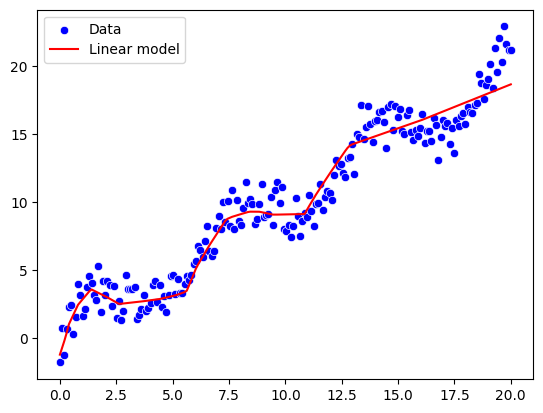

In [33]:
sns.scatterplot(x=X,y=y , color='blue',label='Data')
sns.lineplot(x=X,y=y_pred_m2.ravel(),color='red',label='Linear model')